In [1]:
import os
import librosa
# import pydub
from pydub import AudioSegment
import numpy as np
import copy
import random
from scipy import signal as scipy_signal
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import datetime

from torch.utils.tensorboard import SummaryWriter

import threading
import time

from tqdm.notebook import tqdm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay

In [2]:
dataset_dir = '/home/torooc/dataHDD2/speech_commands_v0.01/'

run_name = 'runs/hey_liku_2_layer_rnn_hidden_fc_bi_dir' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# run_name = 'runs/debug_' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)


In [3]:
# testing_list_path = dataset_dir + 'testing_list.txt'
# validation_list_path = dataset_dir + 'validation_list.txt'

testing_list_path = dataset_dir + 'testing_list_liku.txt'
validation_list_path = dataset_dir + 'validation_list_liku.txt'


In [4]:
with open(testing_list_path) as f:
    testing_list = f.readlines()
    testing_list = [file.strip() for file in testing_list]
    
with open(validation_list_path) as f:
    validation_list = f.readlines()
    validation_list = [file.strip() for file in validation_list]

In [5]:
command_dirs = os.listdir(dataset_dir)

command_dirs = [direc for direc in command_dirs if os.path.isdir(os.path.join(dataset_dir, direc))]

command_dirs.sort()

command_dirs.remove('_background_noise_')

In [6]:
print(command_dirs)

['_hey_liku', 'bed', 'bird', 'cat', 'dog', 'down', 'eight', 'five', 'four', 'go', 'happy', 'house', 'left', 'marvin', 'nine', 'no', 'off', 'on', 'one', 'right', 'seven', 'sheila', 'six', 'stop', 'three', 'tree', 'two', 'up', 'wow', 'yes', 'zero']


In [7]:
key2label_dict = dict()
label2key_list = list()

key2label_dict[' '] = 0
label2key_list.append(' ')

for i, command in enumerate(command_dirs):
    key2label_dict[command] = i + 1
    label2key_list.append(command)

In [8]:
key2label_dict

{' ': 0,
 '_hey_liku': 1,
 'bed': 2,
 'bird': 3,
 'cat': 4,
 'dog': 5,
 'down': 6,
 'eight': 7,
 'five': 8,
 'four': 9,
 'go': 10,
 'happy': 11,
 'house': 12,
 'left': 13,
 'marvin': 14,
 'nine': 15,
 'no': 16,
 'off': 17,
 'on': 18,
 'one': 19,
 'right': 20,
 'seven': 21,
 'sheila': 22,
 'six': 23,
 'stop': 24,
 'three': 25,
 'tree': 26,
 'two': 27,
 'up': 28,
 'wow': 29,
 'yes': 30,
 'zero': 31}

In [9]:
total_wav_file_list = list()

for command_dir in command_dirs:
    wav_list = os.listdir(os.path.join(dataset_dir, command_dir))
    
    wav_list_with_prefix = [os.path.join(command_dir, file_name) for file_name in wav_list]
    
    total_wav_file_list += wav_list_with_prefix

In [10]:
training_list = list(set(total_wav_file_list) - set(testing_list) - set(validation_list))
training_list.sort()


In [11]:
'''
validation_list
testing_list
training_list
'''

'\nvalidation_list\ntesting_list\ntraining_list\n'

In [12]:
audio_metadata = list()

for wav_file_name in tqdm(total_wav_file_list):
    audio = AudioSegment.from_wav(dataset_dir + wav_file_name)
    fs = audio.frame_rate
    length_in_samples = audio.frame_count()
    
#   normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15
    
#   print("Max: {}, Min: {}".format(max(normalized_audio_array), min(normalized_audio_array)))
    
    audio_metadata.append([fs, length_in_samples])

In [13]:
SR = 16000

class DatasetLoader():
    
    def __init__(self, batch_size, dataset_dir, wav_file_name_list, key2label, label2key, is_train):
        self.batch_size = batch_size
        self.dataset_dir = dataset_dir
        self.wav_file_name_list = copy.deepcopy(wav_file_name_list)
        self.sr = SR
        self.nsc_in_ms = 40
#         self.nov_in_ms = self.nsc_in_ms / 2
        self.nov_in_ms = 0
        self.nsc_in_sample = int(self.nsc_in_ms / 1000 * self.sr)
        self.nov_in_sample = int(self.nov_in_ms / 1000 * self.sr)
        
        self.key2label = key2label
        self.label2key = label2key
        
        self.spectrogram_list = list()
        self.label_list = list()
        
        self.lock = threading.RLock()
        
        self.num_thread = 4
        
        self.loading_counter = 0
        
        self.dataset_number = len(self.wav_file_name_list)
        
        self.is_train = is_train
        
    def shuffle_dataset_order(self):
        random.shuffle(self.wav_file_name_list)
        
    def load_dataset(self):
        
        self.shuffle_dataset_order()
        self.spectrogram_list = list()
        self.label_list = list()
        self.loading_counter = 0
        
        step = int(np.floor(self.dataset_number / self.num_thread))
        
        for i in range(self.num_thread):
            
            wav_file_name_list_thread = self.wav_file_name_list[i*step:(i+1)*step]
            
            if i + 1 == self.num_thread:
                wav_file_name_list_thread = self.wav_file_name_list[i*step:]
            
            thread = threading.Thread(target=self.load_spectrogram, args=(wav_file_name_list_thread,))
            thread.start()
        
    def batch_generator(self):
        
        self.load_dataset()
        x = 0
        
        while self.loading_counter < self.dataset_number or len(self.spectrogram_list) > self.batch_size:
            
            if len(self.spectrogram_list) >= self.batch_size:

                spectrogram_list = self.spectrogram_list[:self.batch_size]
                label_list = self.label_list[:self.batch_size]

                with self.lock:
                    self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                    self.label_list = self.label_list[self.batch_size:]
#                     print('[GPU Count: {}]'.format(x))
#                     x += 1

                spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
                max_time_step = max(spectrogram_time_step_list)
                freq_size = spectrogram_list[0].shape[0]
                batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

                for j, specgram in enumerate(spectrogram_list):
                    batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

                batch_label = np.asarray(label_list)

                yield batch, batch_label
            
            else:
                time.sleep(0.05)
        
        
        if len(self.spectrogram_list) > 0:

            spectrogram_list = self.spectrogram_list
            label_list = self.label_list

            with self.lock:
                self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                self.label_list = self.label_list[self.batch_size:]
#                 print('[GPU Count: {}]'.format(x))
#                 x += 1

            spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
            max_time_step = max(spectrogram_time_step_list)
            freq_size = spectrogram_list[0].shape[0]
            batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

            for j, specgram in enumerate(spectrogram_list):
                batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

            batch_label = np.asarray(label_list)

            yield batch, batch_label
        
        return 0
    

    def load_spectrogram(self, wav_file_name_list_part):

        for i, wav_file_name in enumerate(wav_file_name_list_part):

            audio = AudioSegment.from_wav(self.dataset_dir + wav_file_name)

            normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15

            f, t, Zxx = scipy_signal.stft(normalized_audio_array, fs=self.sr, 
                                          nperseg=self.nsc_in_sample,
                                          noverlap=self.nov_in_sample)

            Sxx = np.abs(Zxx)

            normalized_spectrogram = (20 * np.log10(np.maximum(Sxx, 1e-8)) + 160) / 160
            
            ###
            if self.is_train:
                normalized_spectrogram += (np.random.random(normalized_spectrogram.shape) - 0.5)/10
                normalized_spectrogram = np.clip(normalized_spectrogram, 0, None)

            ###
            
            keyword = wav_file_name.split('/')[0]
            label = self.key2label[keyword]
            
            with self.lock:
                self.spectrogram_list.append(normalized_spectrogram)
                self.label_list.append(label)
                self.loading_counter += 1
#                 print('[Dataset Count: {}] [Specgram Length: {}]'.format(self.loading_counter, len(self.spectrogram_list)))
            

In [14]:
len(training_list)

52067

In [15]:
dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

# dataset_loader_testing = DatasetLoader(64, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(64, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(512, dataset_dir, training_list, key2label_dict, label2key_list)
# dataset_loader_testing = DatasetLoader(512, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(512, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
# dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
# dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

In [16]:
# batch_generator = dataset_loader_training.batch_generator()

In [17]:
# class basic_model(nn.Module):
#     def __init__(self, D_in, H, num_layers, num_labels):
#         super(basic_model, self).__init__()
#         self.fc = torch.nn.Linear(D_in, H)
#         self.relu = torch.nn.ReLU()
#         self.dropout = nn.Dropout(p=0.2)

#         self.gru_layers = nn.ModuleList([nn.GRU(H, int(H / 2), bidirectional=True, batch_first=True) for i in range(num_layers)])

#         self.fc_pred = nn.Linear(H, num_labels)
#         self.log_softmax = nn.LogSoftmax(dim=2)
        
#     def forward(self, input_tensor):
#         # (B, T, F)
#         output_tensor = self.fc(input_tensor)
#         output_tensor = self.relu(output_tensor)
#         output_tensor = self.dropout(output_tensor)
#         # (B, T, H)
#         for layer in self.gru_layers:
#             output_tensor, _ = layer(output_tensor)
            
#         output_tensor = self.fc_pred(output_tensor)

#         output_tensor = self.log_softmax(output_tensor)
        
#         return output_tensor

class basic_conv_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_conv_model, self).__init__()
        self.conv2d_1 = nn.Conv2d(1, 16, (13, 2))
        self.conv2d_2 = nn.Conv2d(16, 32, (13, 2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(4800, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)
        tensor = self.conv2d_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor = self.conv2d_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_crnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_crnn_model, self).__init__()
#         self.conv2d = nn.Conv2d(1, 128, (13, 2))
        self.conv2d_1 = nn.Conv2d(1, 64, (7, 2))
        self.conv2d_2 = nn.Conv2d(64, 64, (7, 2))
#         self.gru_1 = nn.GRU(16 * 103, 256, 1)
#         self.gru_1 = nn.GRU(128 * 103, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 33, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 99, 256, 1, bidirectional=True)
        self.gru_1 = nn.GRU(19776, 256, 1, bidirectional=True)
        self.gru_2 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_3 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_4 = nn.GRU(512, 256, 1, bidirectional=True)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 2 * 12, 31)
#         self.fc = nn.Linear(256 * 10, 31) # 5632
        self.fc = nn.Linear(256 * 48, 31) # 12288
#         self.fc = nn.Linear(256 * 22, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)  # (B, 1, F, T)
        tensor = self.conv2d_1(input_tensor) # (B, 16, F, T)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))

        tensor = self.conv2d_2(tensor) # (B, 16, F, T)
# #         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
        
        tensor = tensor.view(tensor.shape[0], -1, tensor.shape[3])
        # (B, 16 * F, T)
        
#         print('[After Reshape]: {}'.format(tensor.shape))
        
        tensor.transpose_(0, 2) # (T, F, B)
        tensor.transpose_(1, 2) # (T, B, F)

        tensor, _ = self.gru_1(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))

        tensor, _ = self.gru_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_4(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)

        tensor.transpose_(0, 1) # (B, T, F)
    
#         print('[After Reshape]: {}'.format(tensor.shape))
    
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_rnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_rnn_model, self).__init__()
        self.gru_1 = nn.GRU(321, 128, 1, bidirectional=True)
        self.gru_2 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_3 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_4 = nn.GRU(256, 128, 1, bidirectional=True)

#         self.gru_1 = nn.GRU(321, 256, 1, bidirectional=False)
#         self.gru_2 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_3 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_4 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_5 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_6 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_7 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_8 = nn.GRU(256, 256, 1, bidirectional=False)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 26, 31)
#         self.fc = nn.Linear(256, 31)
        self.fc = nn.Linear(256, 32)
        
    def forward(self, input_tensor):
#       input_tensor.unsqueeze_(1)
        # (B, F, T)
        input_tensor.transpose_(0, 2) # (T, F, B)
        input_tensor.transpose_(1, 2) # (T, B, F)
        tensor, _ = self.gru_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, hidden = self.gru_2(tensor)
        '''
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, _ = self.gru_4(tensor) # Hidden (2[Direction], B, H)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True)
        
#         tensor = F.relu(hidden)
#         tensor = F.dropout(tensor, 0.1, training=True)
        
#         print(hidden.shape)
        
        tensor, _ = self.gru_5(tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_6(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_7(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hidden = self.gru_8(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        '''
        tensor = F.relu(hidden)
        tensor = F.dropout(tensor, 0.1, training=True)
        
        tensor.transpose_(0, 1) # (B, T, F)
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor

    
# model = basic_model(321, 512, 3, 31).float().to(device)
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
# dictation_loss = nn.CTCLoss().to(device)

# model = basic_crnn_model().float().to(device)  
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
        

In [18]:
class hello_edge_fc_model(nn.Module):
    def __init__(self):
        super(hello_edge_fc_model, self).__init__()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(8346, 31)
        
    def forward(self, input_tensor):
        tensor = self.flatten(input_tensor)
        tensor = self.fc(tensor)
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
# model = basic_crnn_model().float().to(device)  
model = basic_rnn_model().float().to(device)  
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [19]:
# batch_generator = dataset_loader_training.batch_generator()
# next(batch_generator)[0].shape

18:58:26.281314
#000 [Train: 3.445] [Test: 3.427] [Valid: 3.423]
#000 [Train: 0.039] [Test: 0.043] [Valid: 0.043]


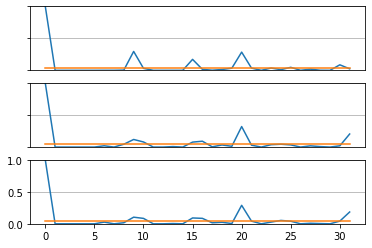

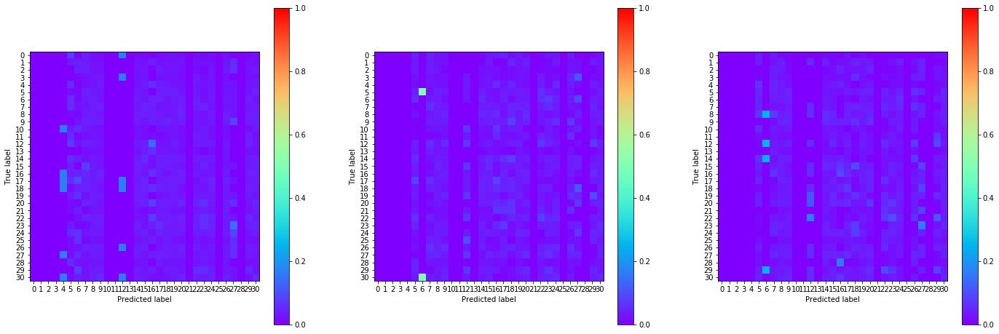

18:59:13.577825
#001 [Train: 3.418] [Test: 3.395] [Valid: 3.386]
#001 [Train: 0.052] [Test: 0.075] [Valid: 0.068]


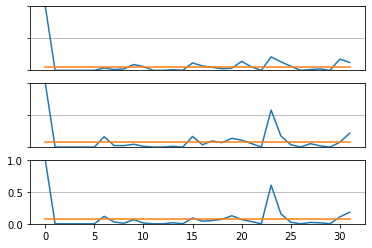

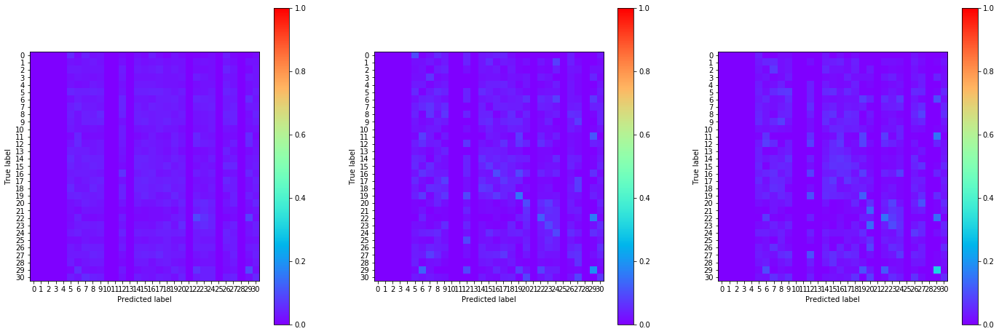

19:00:00.841498
#002 [Train: 3.314] [Test: 3.221] [Valid: 3.194]
#002 [Train: 0.084] [Test: 0.096] [Valid: 0.111]


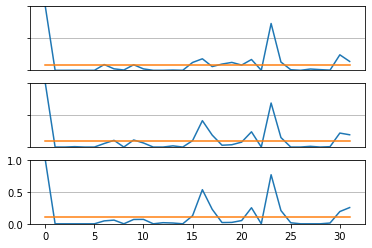

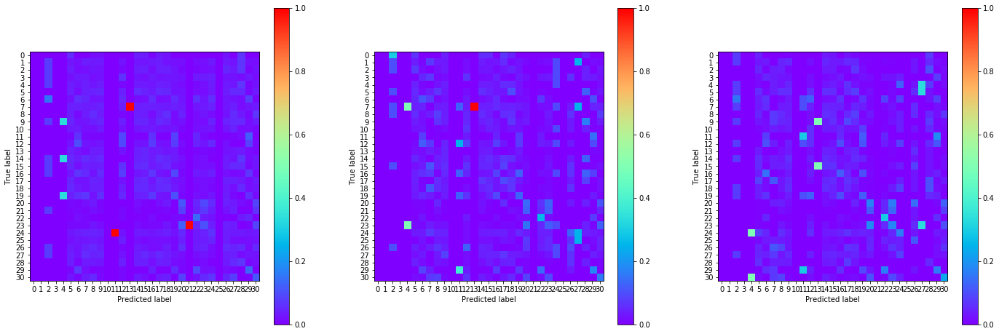

19:00:48.612320
#003 [Train: 3.157] [Test: 3.079] [Valid: 3.039]
#003 [Train: 0.106] [Test: 0.106] [Valid: 0.121]


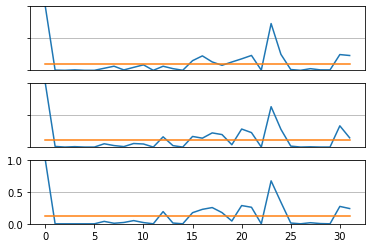

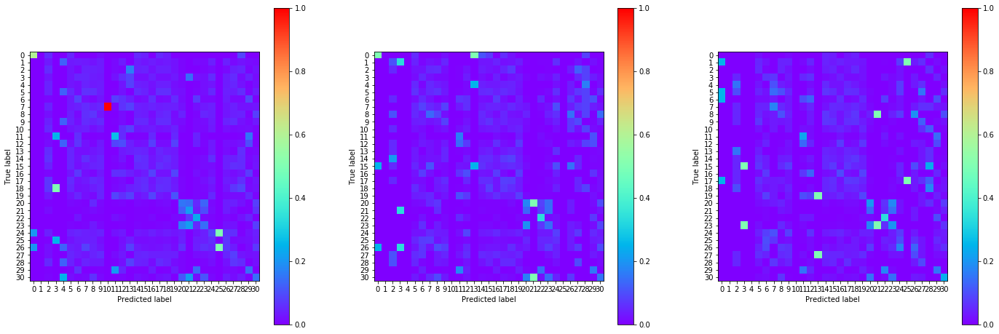

19:01:36.010962
#004 [Train: 3.006] [Test: 2.939] [Valid: 2.904]
#004 [Train: 0.117] [Test: 0.124] [Valid: 0.135]


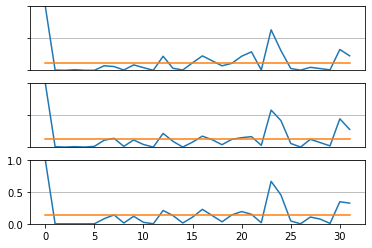

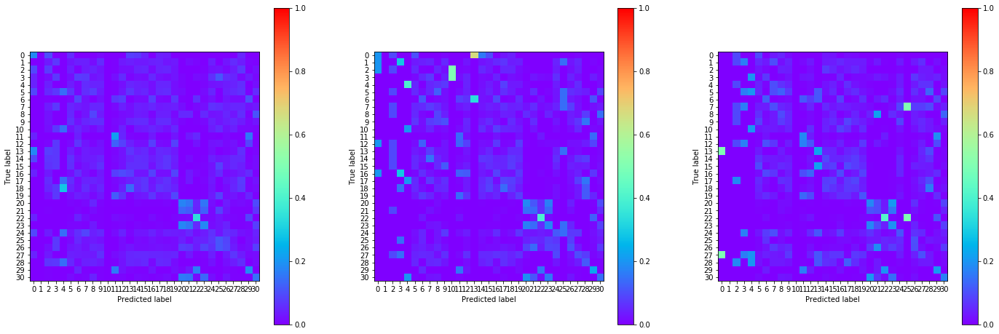

19:02:23.552334
#005 [Train: 2.885] [Test: 2.849] [Valid: 2.809]
#005 [Train: 0.135] [Test: 0.145] [Valid: 0.145]


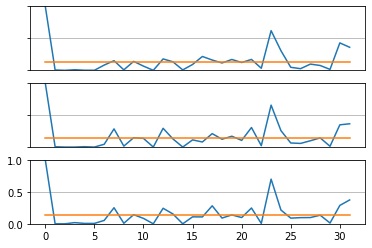

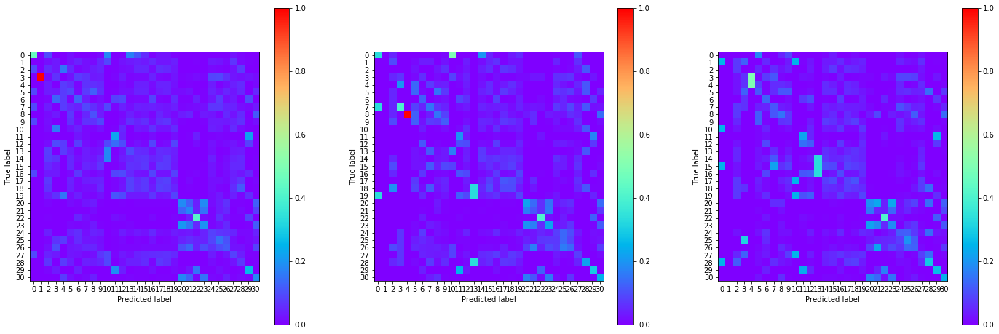

19:03:10.974596
#006 [Train: 2.792] [Test: 2.762] [Valid: 2.729]
#006 [Train: 0.155] [Test: 0.163] [Valid: 0.172]


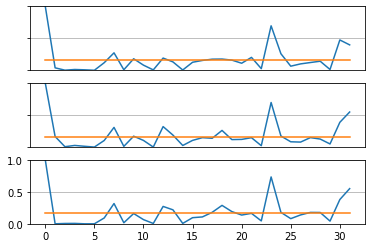

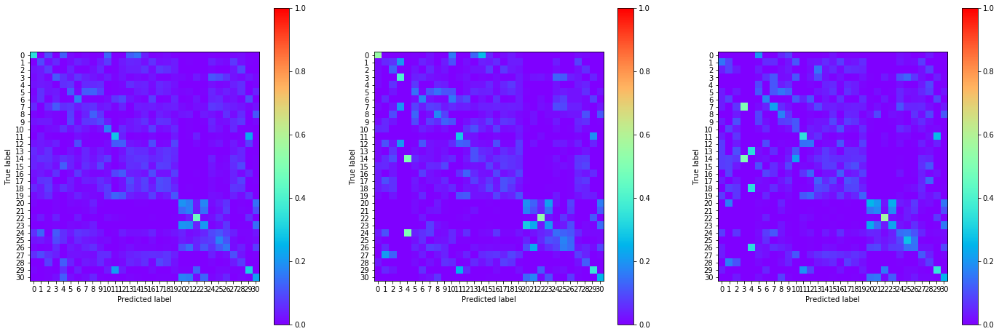

19:03:58.400946
#007 [Train: 2.708] [Test: 2.671] [Valid: 2.658]
#007 [Train: 0.180] [Test: 0.188] [Valid: 0.190]


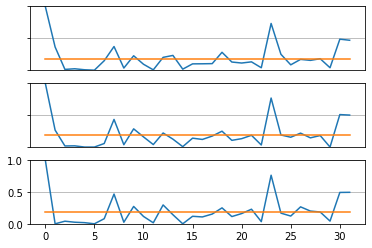

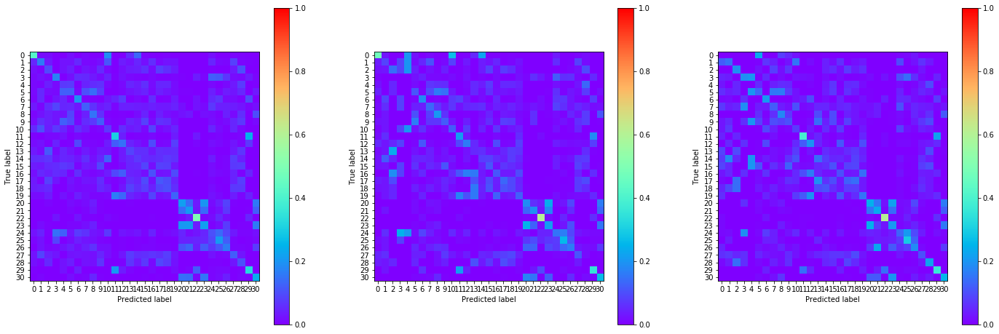

19:04:46.138799
#008 [Train: 2.636] [Test: 2.614] [Valid: 2.607]
#008 [Train: 0.199] [Test: 0.218] [Valid: 0.203]


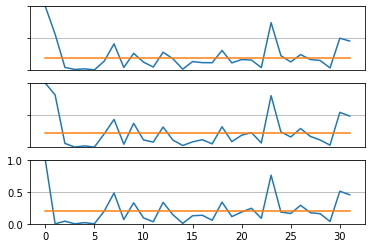

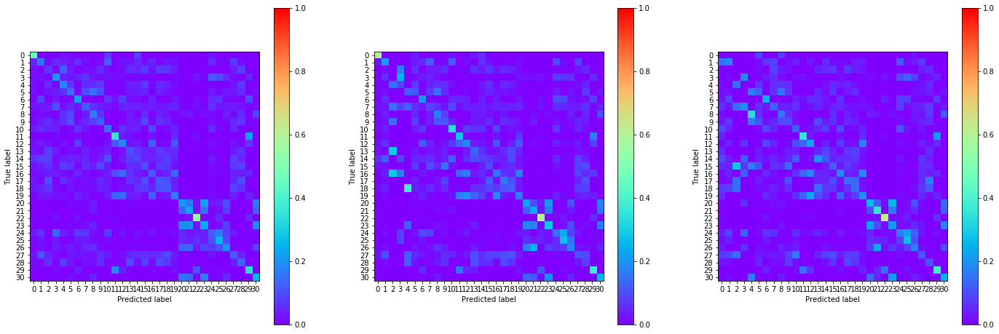

19:05:33.429436
#009 [Train: 2.561] [Test: 2.523] [Valid: 2.537]
#009 [Train: 0.222] [Test: 0.231] [Valid: 0.223]


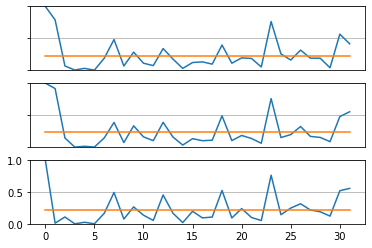

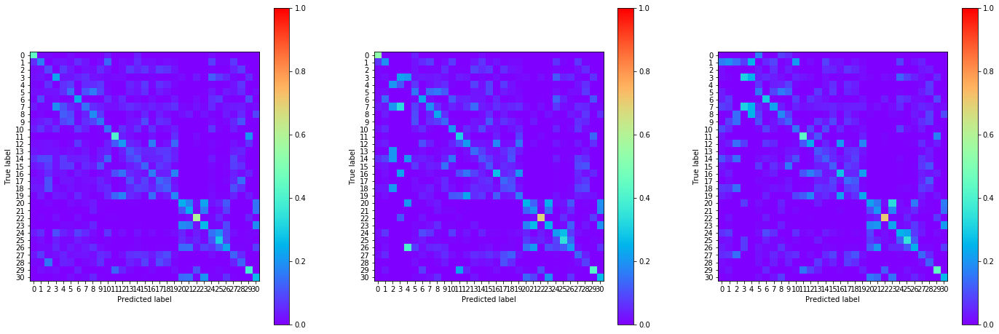

19:06:20.836817
#010 [Train: 2.488] [Test: 2.454] [Valid: 2.467]
#010 [Train: 0.242] [Test: 0.257] [Valid: 0.242]


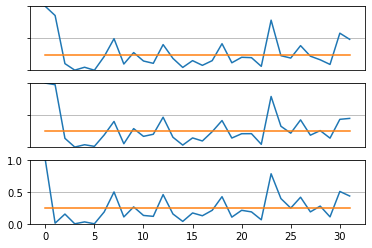

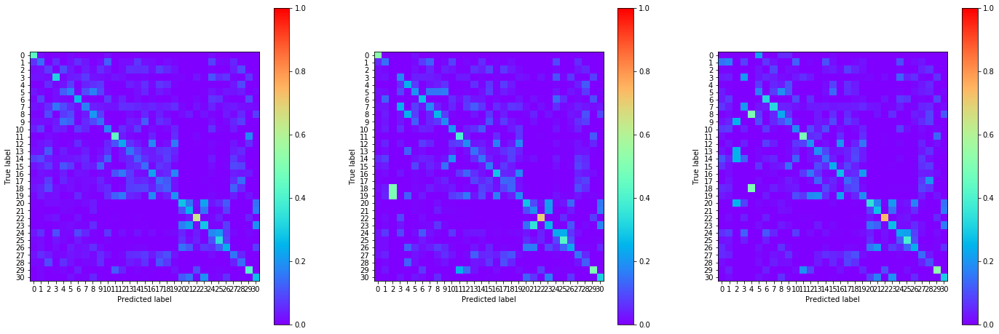

19:07:08.440101
#011 [Train: 2.410] [Test: 2.344] [Valid: 2.389]
#011 [Train: 0.262] [Test: 0.278] [Valid: 0.265]


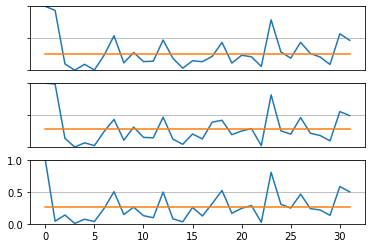

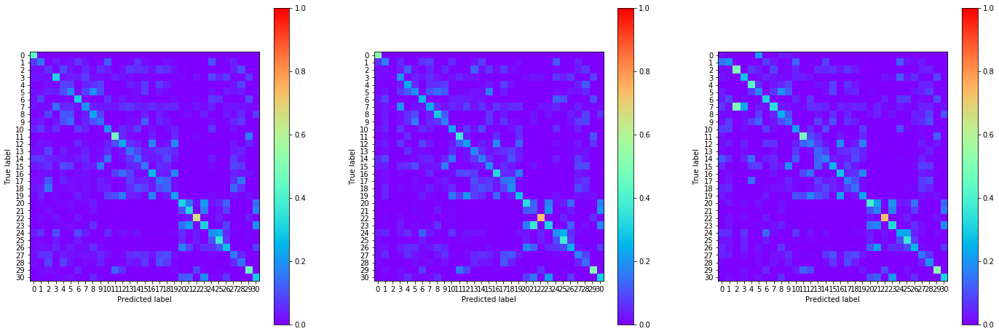

19:07:55.969401
#012 [Train: 2.342] [Test: 2.315] [Valid: 2.342]
#012 [Train: 0.281] [Test: 0.289] [Valid: 0.282]


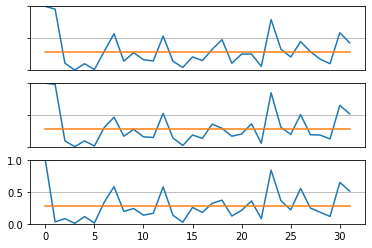

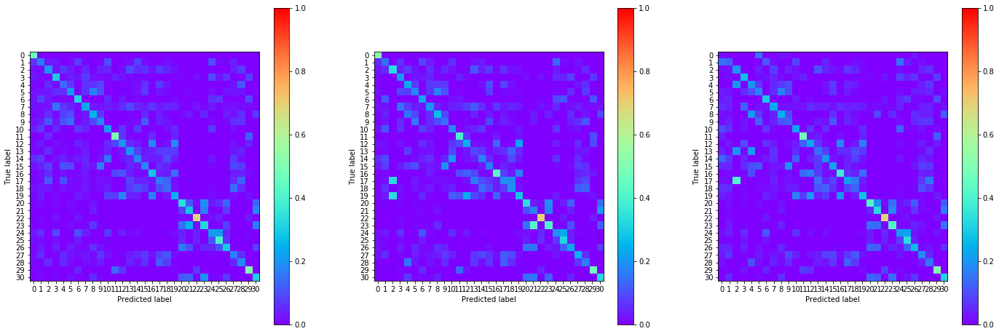

19:08:43.106505
#013 [Train: 2.273] [Test: 2.236] [Valid: 2.268]
#013 [Train: 0.304] [Test: 0.321] [Valid: 0.305]


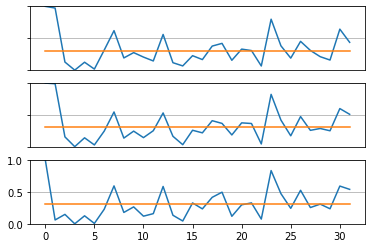

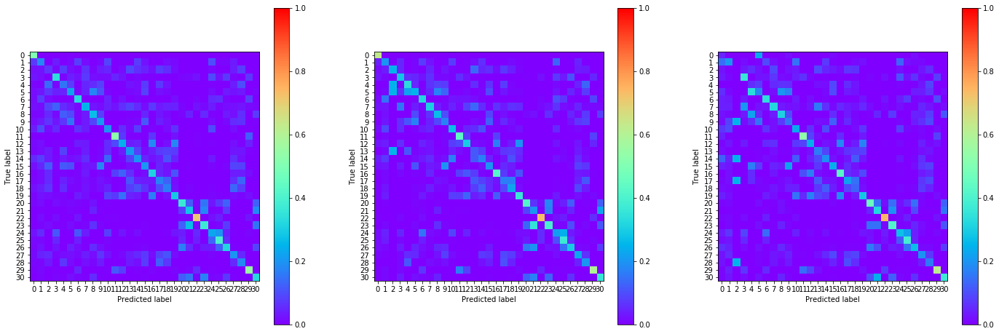

19:09:30.429561
#014 [Train: 2.213] [Test: 2.188] [Valid: 2.219]
#014 [Train: 0.323] [Test: 0.332] [Valid: 0.321]


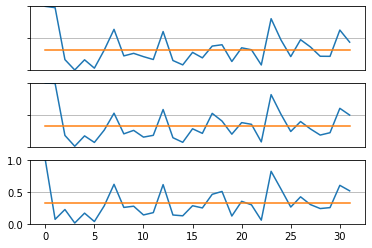

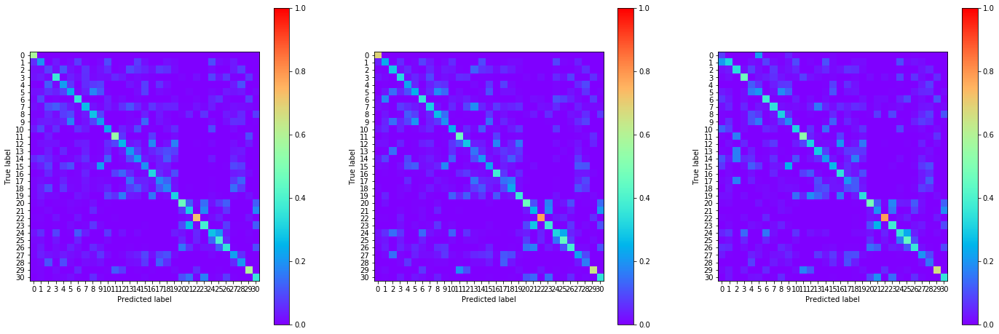

19:10:17.730547
#015 [Train: 2.142] [Test: 2.101] [Valid: 2.148]
#015 [Train: 0.348] [Test: 0.364] [Valid: 0.350]


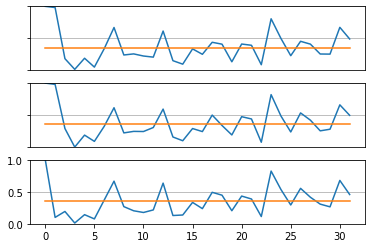

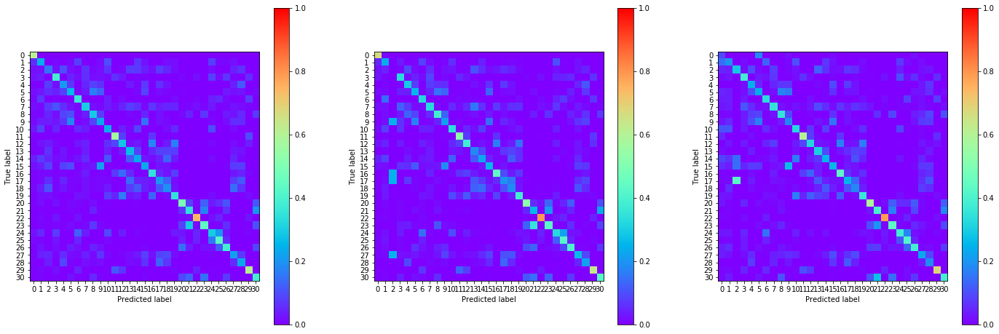

19:11:05.004262
#016 [Train: 2.076] [Test: 2.063] [Valid: 2.100]
#016 [Train: 0.369] [Test: 0.373] [Valid: 0.364]


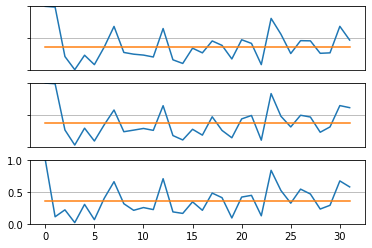

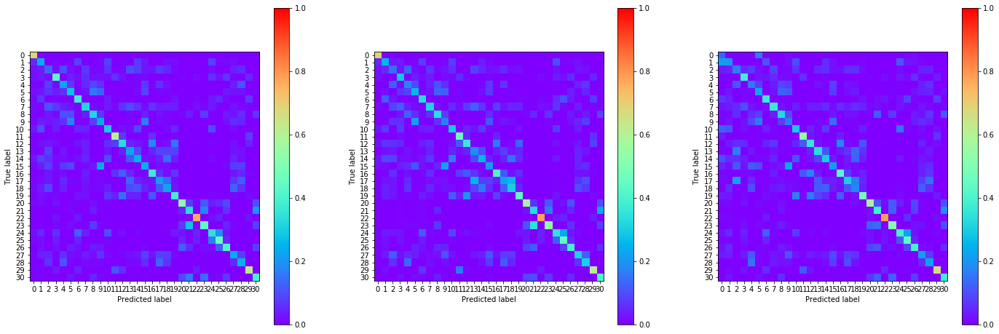

19:11:52.552476
#017 [Train: 2.020] [Test: 2.010] [Valid: 2.026]
#017 [Train: 0.388] [Test: 0.396] [Valid: 0.389]


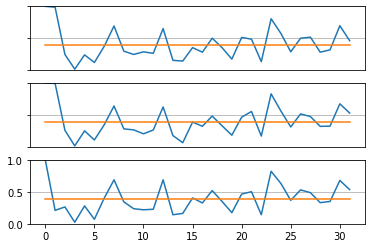

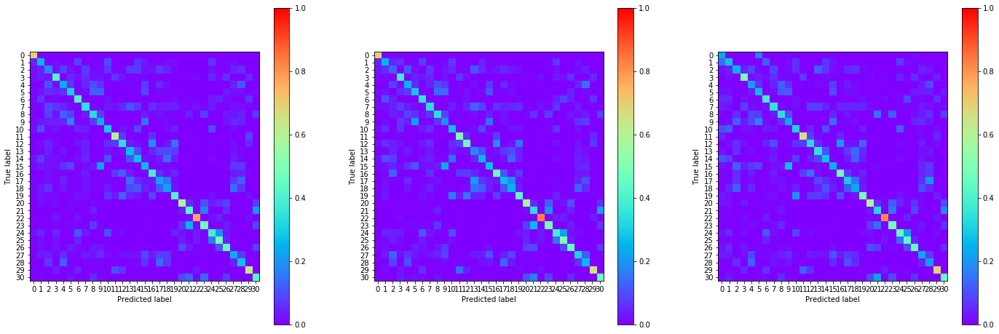

19:14:14.765988
#020 [Train: 1.836] [Test: 1.843] [Valid: 1.850]
#020 [Train: 0.447] [Test: 0.455] [Valid: 0.437]


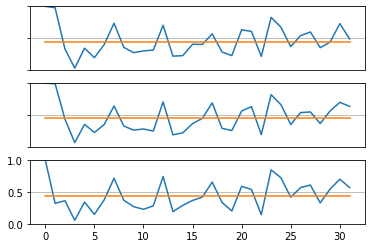

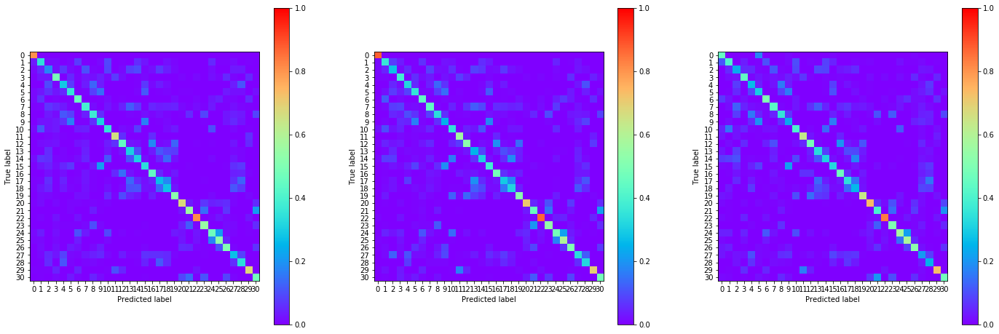

19:15:01.905316
#021 [Train: 1.779] [Test: 1.771] [Valid: 1.782]
#021 [Train: 0.465] [Test: 0.470] [Valid: 0.463]


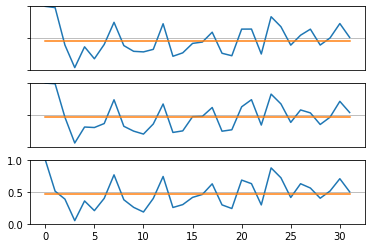

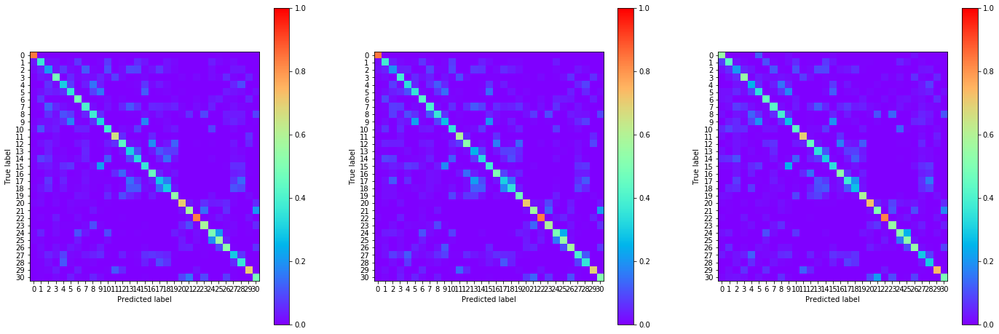

19:15:49.390595
#022 [Train: 1.720] [Test: 1.720] [Valid: 1.736]
#022 [Train: 0.483] [Test: 0.490] [Valid: 0.474]


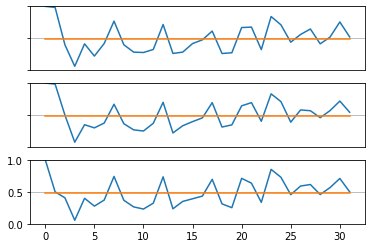

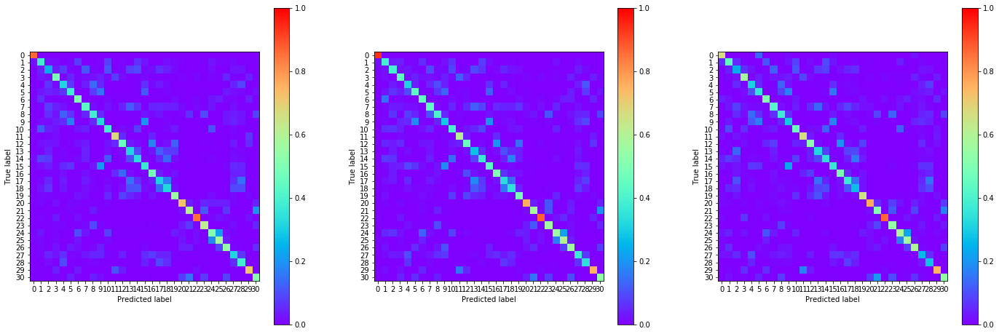

19:16:36.456415
#023 [Train: 1.671] [Test: 1.667] [Valid: 1.694]
#023 [Train: 0.498] [Test: 0.510] [Valid: 0.490]


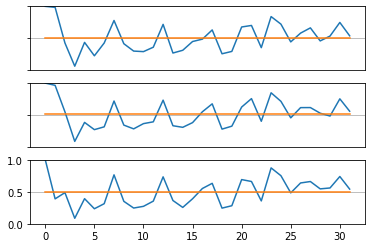

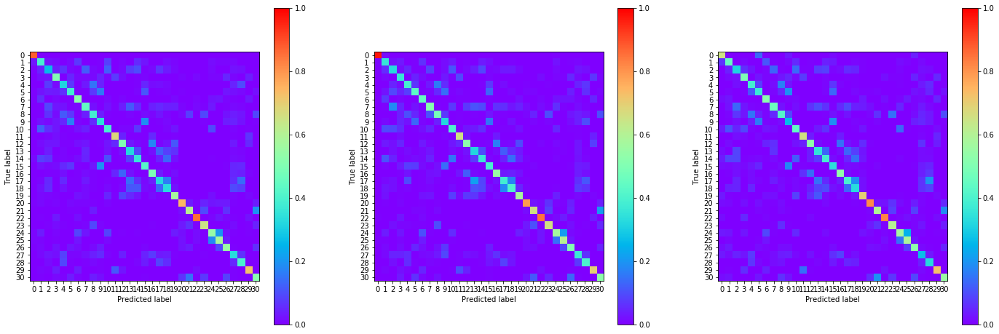

19:17:24.107091
#024 [Train: 1.625] [Test: 1.652] [Valid: 1.649]
#024 [Train: 0.511] [Test: 0.508] [Valid: 0.508]


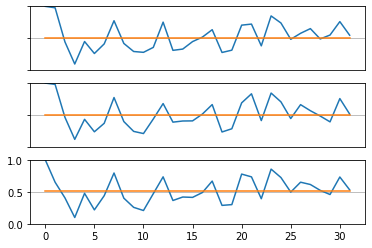

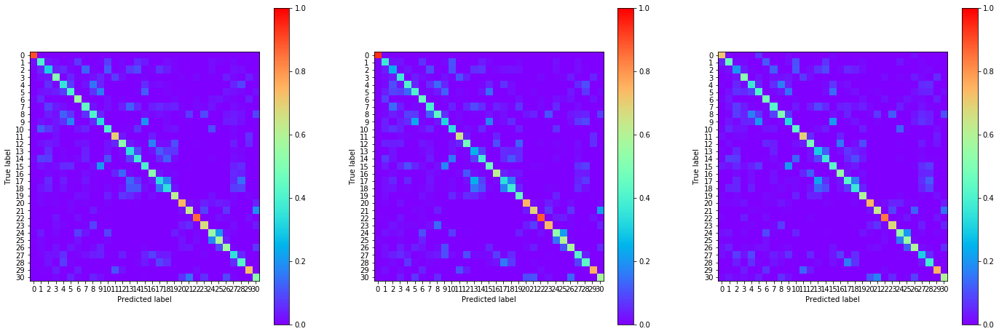

19:18:11.330092
#025 [Train: 1.577] [Test: 1.575] [Valid: 1.592]
#025 [Train: 0.527] [Test: 0.533] [Valid: 0.529]


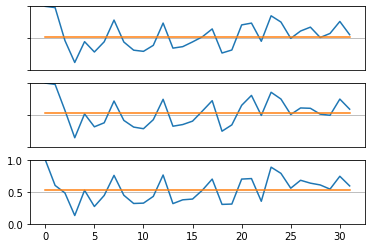

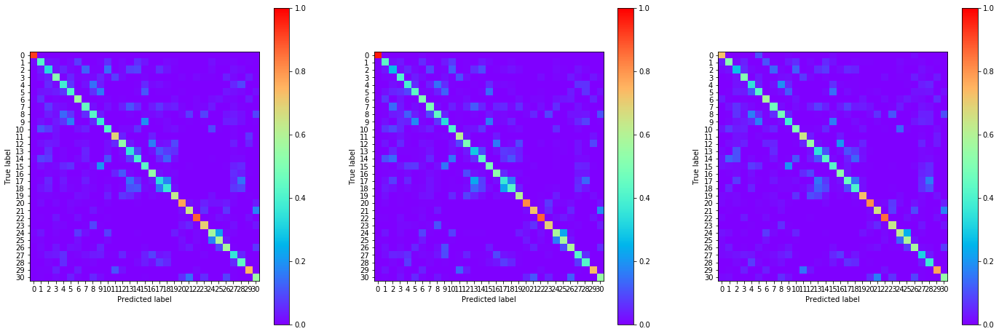

19:18:58.588725
#026 [Train: 1.535] [Test: 1.528] [Valid: 1.539]
#026 [Train: 0.538] [Test: 0.552] [Valid: 0.539]


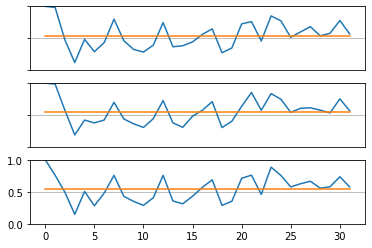

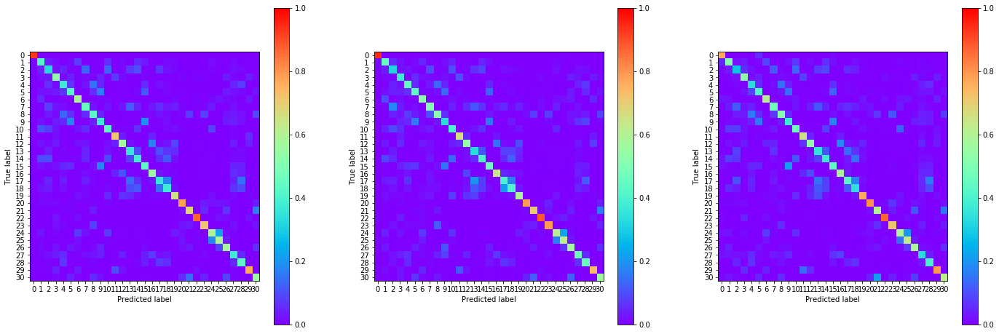

19:19:45.551359
#027 [Train: 1.496] [Test: 1.486] [Valid: 1.508]
#027 [Train: 0.549] [Test: 0.553] [Valid: 0.551]


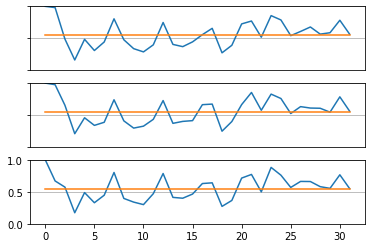

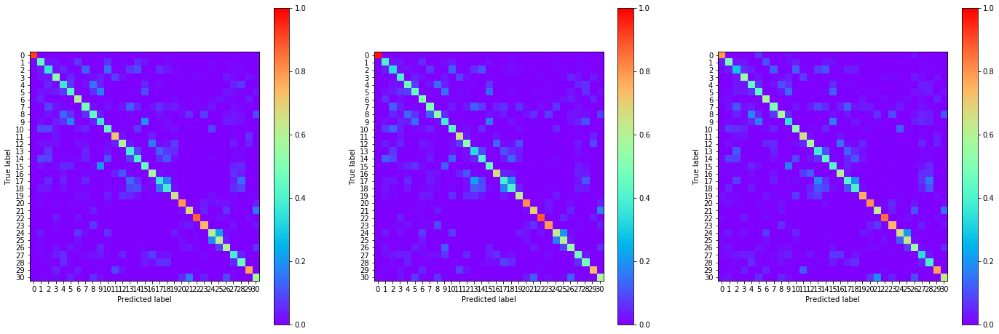

19:20:32.454029
#028 [Train: 1.445] [Test: 1.463] [Valid: 1.466]
#028 [Train: 0.565] [Test: 0.570] [Valid: 0.559]


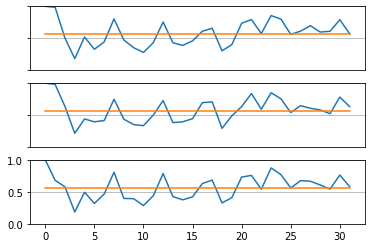

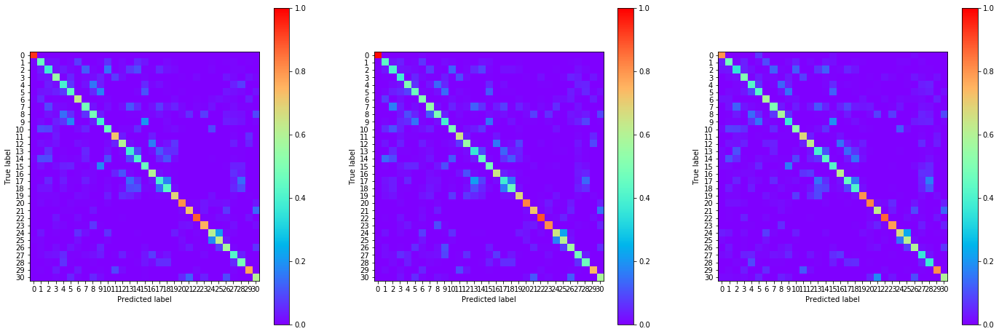

19:21:19.579917
#029 [Train: 1.411] [Test: 1.434] [Valid: 1.438]
#029 [Train: 0.577] [Test: 0.571] [Valid: 0.573]


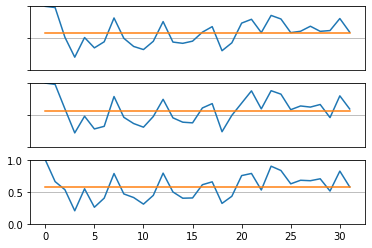

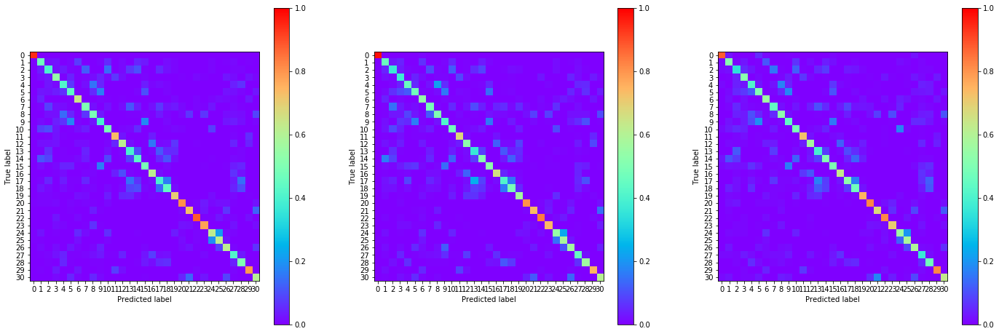

19:22:07.014581
#030 [Train: 1.371] [Test: 1.387] [Valid: 1.382]
#030 [Train: 0.592] [Test: 0.589] [Valid: 0.587]


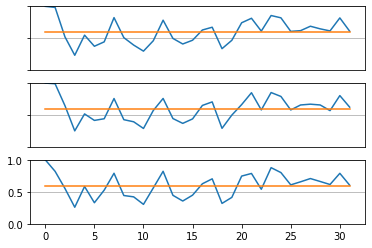

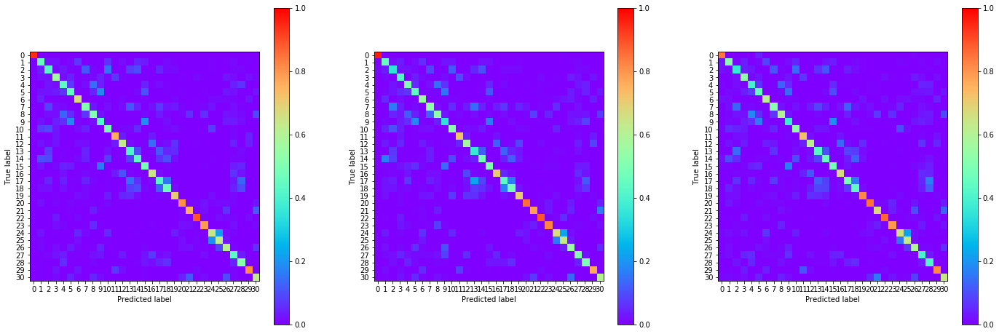

19:22:54.576194
#031 [Train: 1.336] [Test: 1.368] [Valid: 1.356]
#031 [Train: 0.603] [Test: 0.594] [Valid: 0.595]


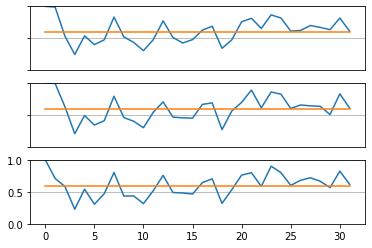

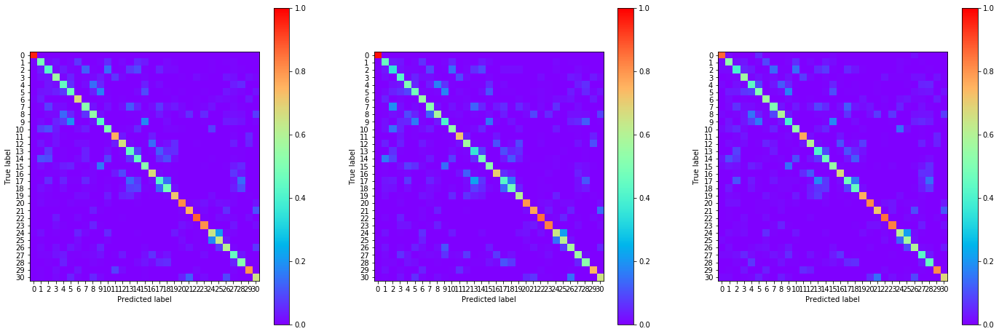

19:23:41.758921
#032 [Train: 1.307] [Test: 1.343] [Valid: 1.336]
#032 [Train: 0.611] [Test: 0.605] [Valid: 0.603]


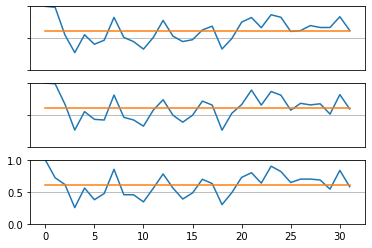

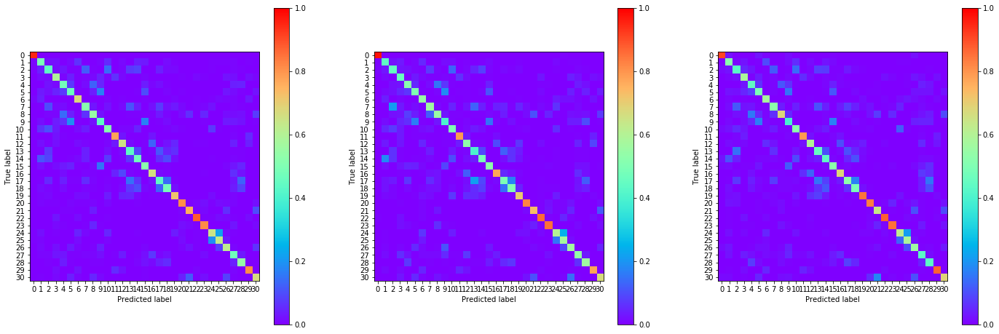

19:24:29.162427
#033 [Train: 1.274] [Test: 1.315] [Valid: 1.294]
#033 [Train: 0.624] [Test: 0.618] [Valid: 0.616]


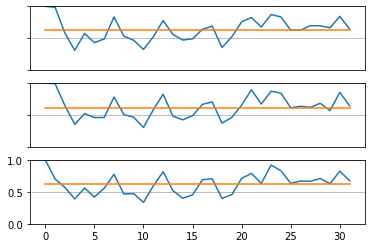

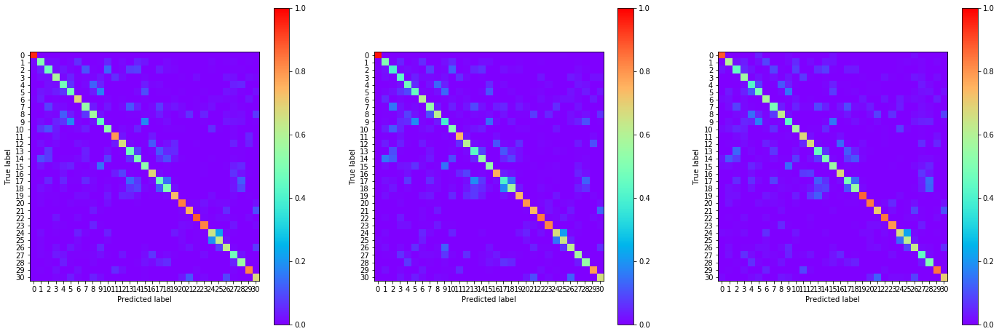

19:25:16.616495
#034 [Train: 1.236] [Test: 1.269] [Valid: 1.259]
#034 [Train: 0.634] [Test: 0.626] [Valid: 0.632]


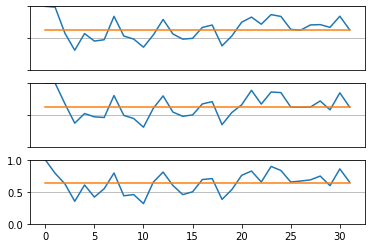

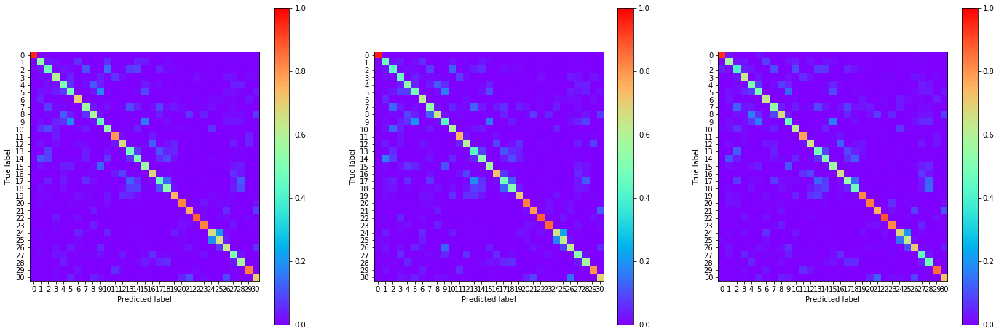

19:26:03.600581
#035 [Train: 1.214] [Test: 1.254] [Valid: 1.234]
#035 [Train: 0.639] [Test: 0.633] [Valid: 0.637]


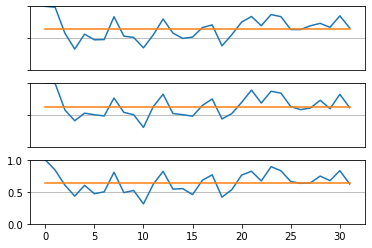

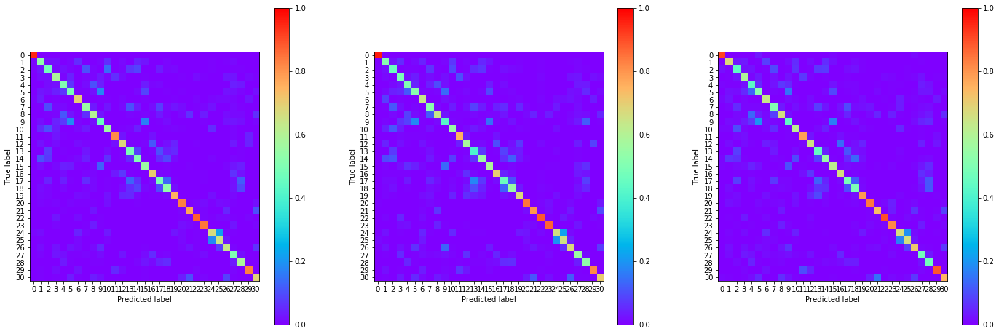

19:26:50.694701
#036 [Train: 1.186] [Test: 1.207] [Valid: 1.206]
#036 [Train: 0.651] [Test: 0.643] [Valid: 0.646]


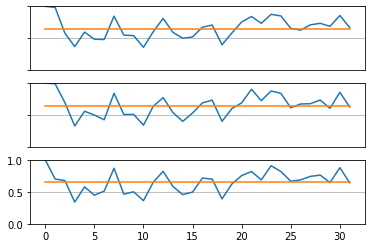

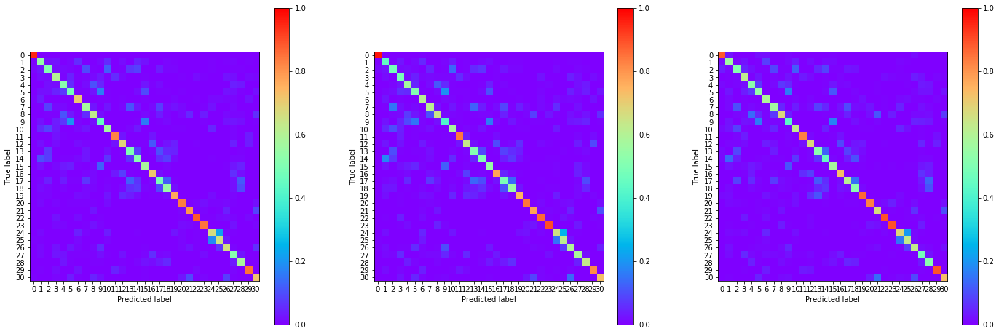

19:27:37.909185
#037 [Train: 1.153] [Test: 1.224] [Valid: 1.180]
#037 [Train: 0.661] [Test: 0.645] [Valid: 0.649]


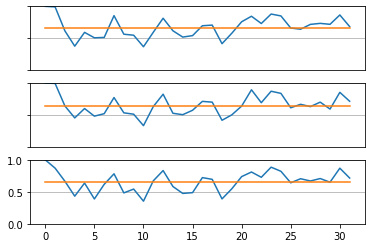

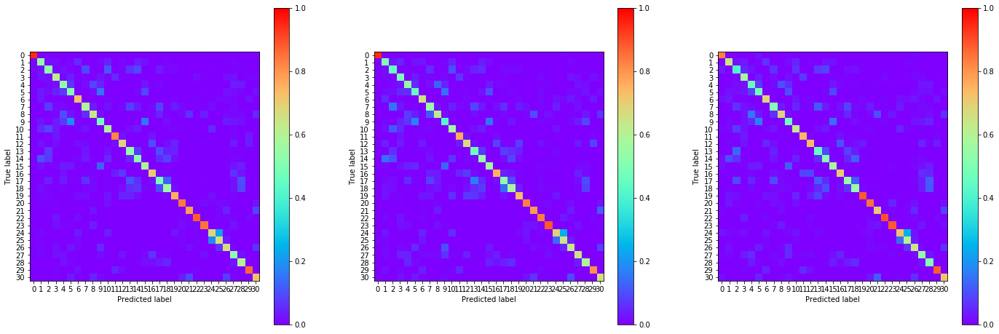

19:28:25.201292
#038 [Train: 1.128] [Test: 1.165] [Valid: 1.151]
#038 [Train: 0.669] [Test: 0.650] [Valid: 0.659]


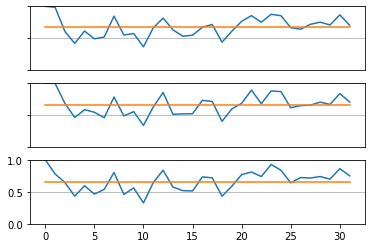

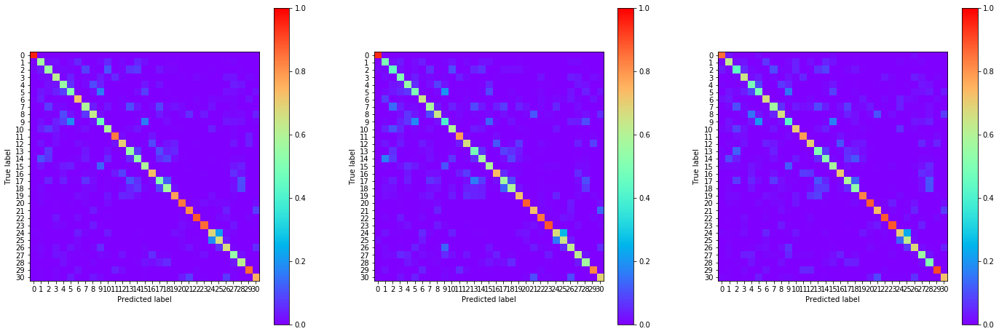

19:29:12.478286
#039 [Train: 1.101] [Test: 1.131] [Valid: 1.121]
#039 [Train: 0.677] [Test: 0.668] [Valid: 0.669]


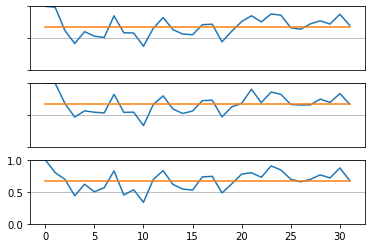

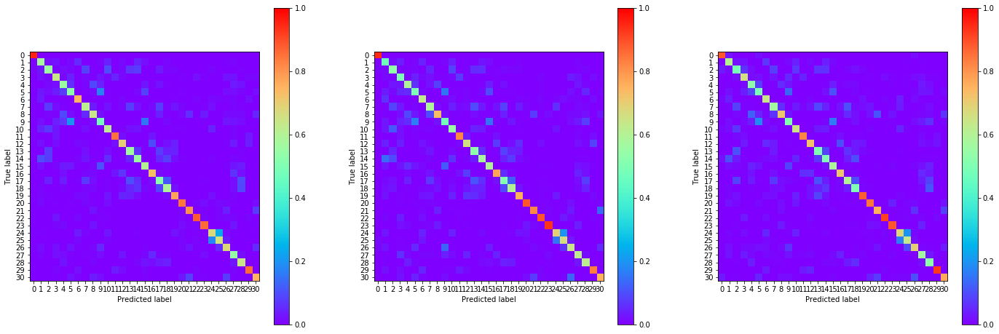

19:29:59.925387
#040 [Train: 1.079] [Test: 1.119] [Valid: 1.124]
#040 [Train: 0.685] [Test: 0.676] [Valid: 0.675]


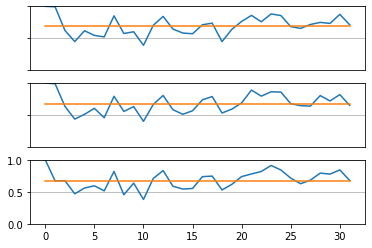

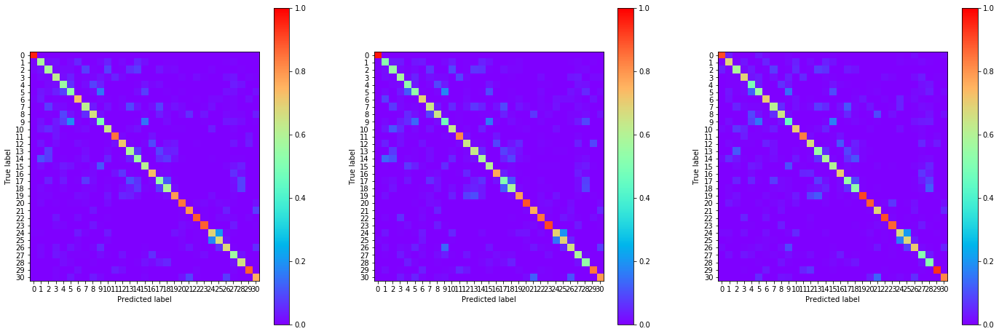

19:30:47.068998
#041 [Train: 1.057] [Test: 1.094] [Valid: 1.086]
#041 [Train: 0.691] [Test: 0.677] [Valid: 0.687]


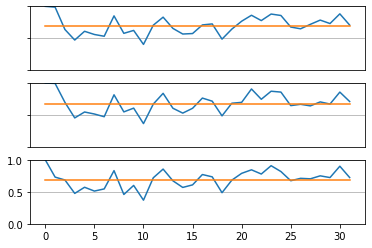

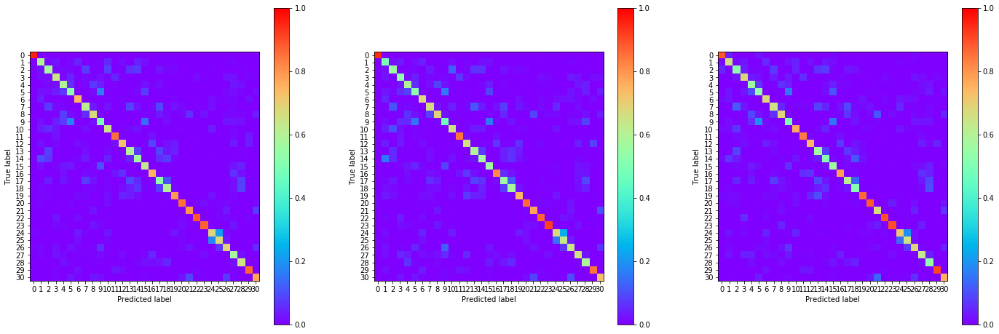

19:31:34.453397
#042 [Train: 1.030] [Test: 1.084] [Valid: 1.067]
#042 [Train: 0.698] [Test: 0.694] [Valid: 0.692]


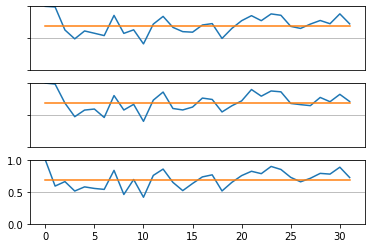

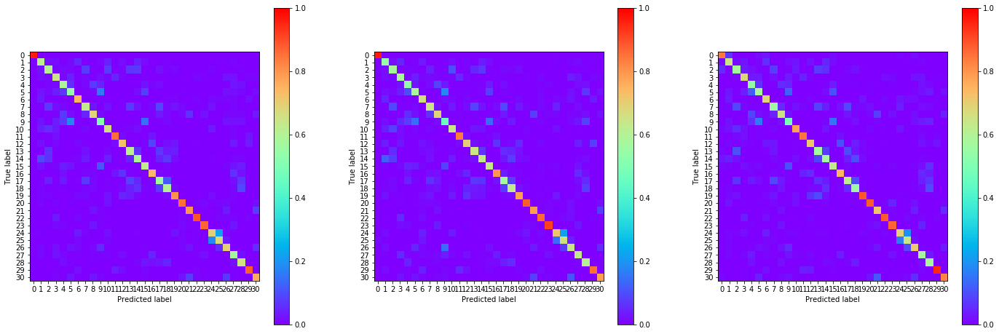

19:32:22.111881
#043 [Train: 1.009] [Test: 1.072] [Valid: 1.057]
#043 [Train: 0.706] [Test: 0.688] [Valid: 0.687]


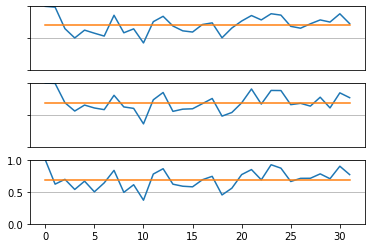

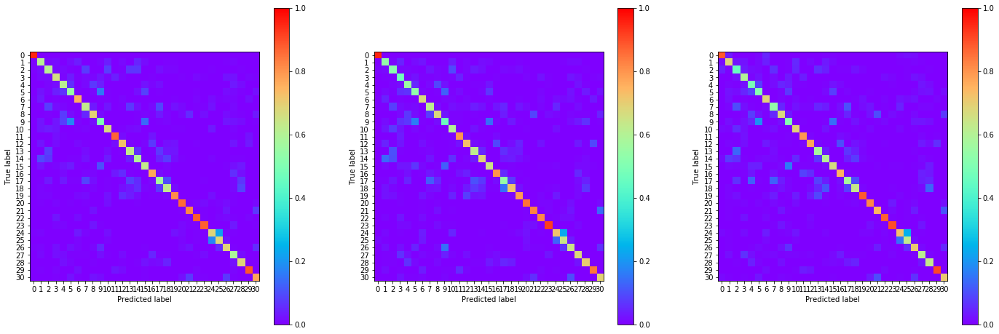

19:33:09.501852
#044 [Train: 0.995] [Test: 1.078] [Valid: 1.026]
#044 [Train: 0.710] [Test: 0.692] [Valid: 0.701]


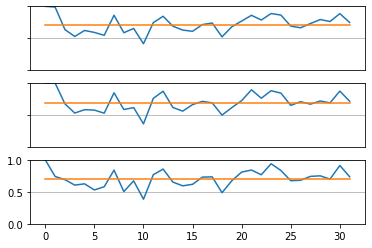

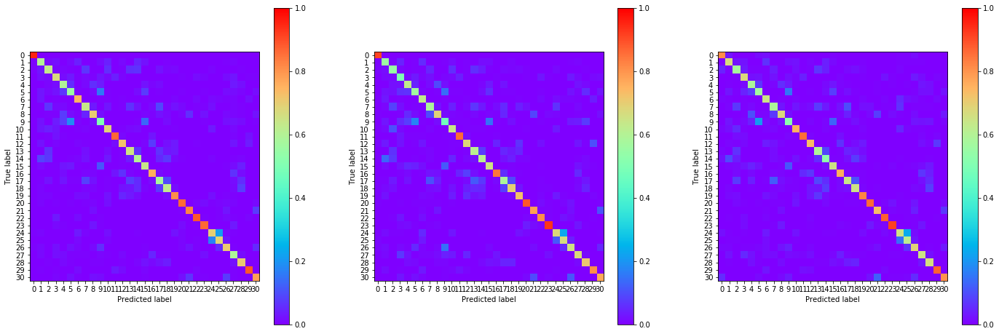

19:33:57.032622
#045 [Train: 0.967] [Test: 1.025] [Valid: 1.010]
#045 [Train: 0.719] [Test: 0.701] [Valid: 0.705]


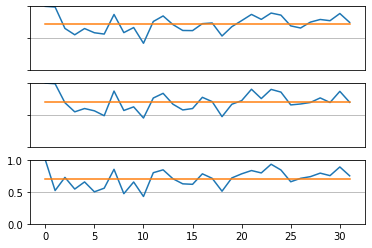

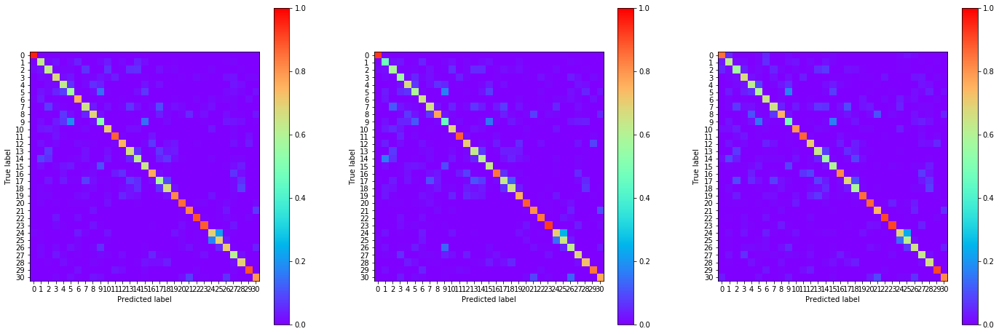

19:34:44.383764
#046 [Train: 0.945] [Test: 1.016] [Valid: 0.985]
#046 [Train: 0.728] [Test: 0.711] [Valid: 0.713]


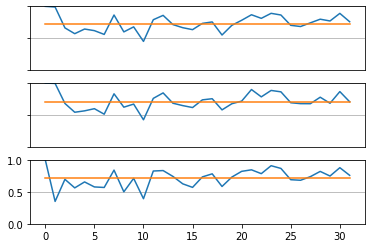

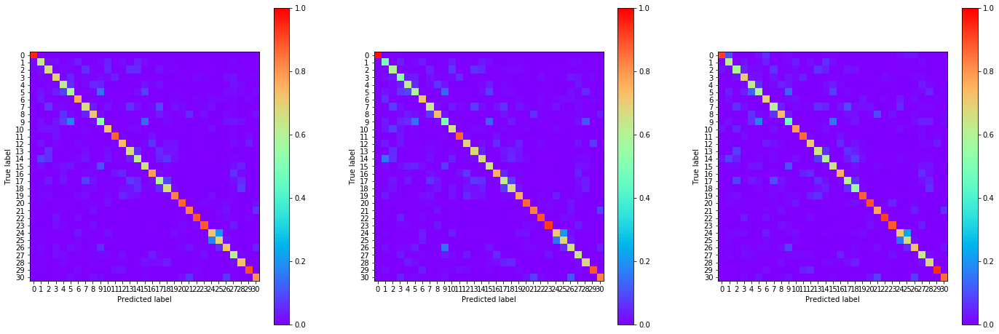

19:35:31.577005
#047 [Train: 0.927] [Test: 0.969] [Valid: 0.981]
#047 [Train: 0.731] [Test: 0.717] [Valid: 0.714]


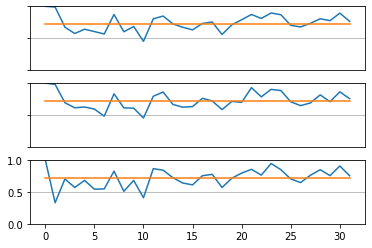

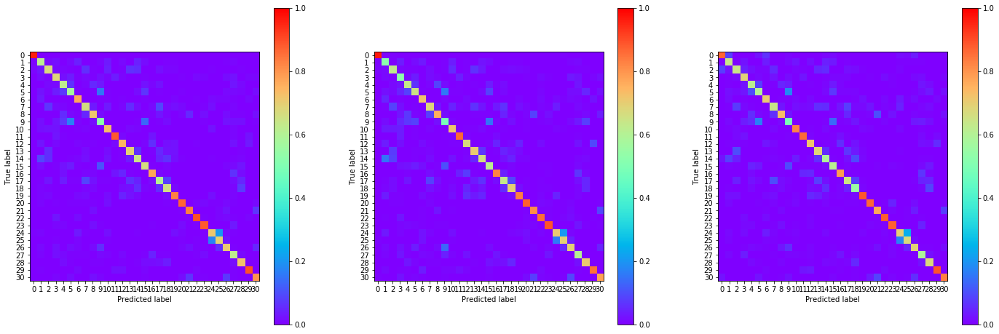

19:36:18.711357
#048 [Train: 0.908] [Test: 0.970] [Valid: 0.986]
#048 [Train: 0.738] [Test: 0.709] [Valid: 0.710]


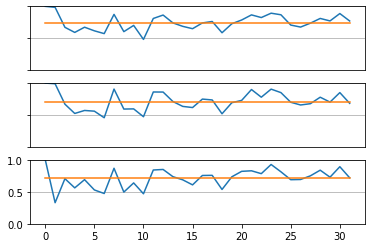

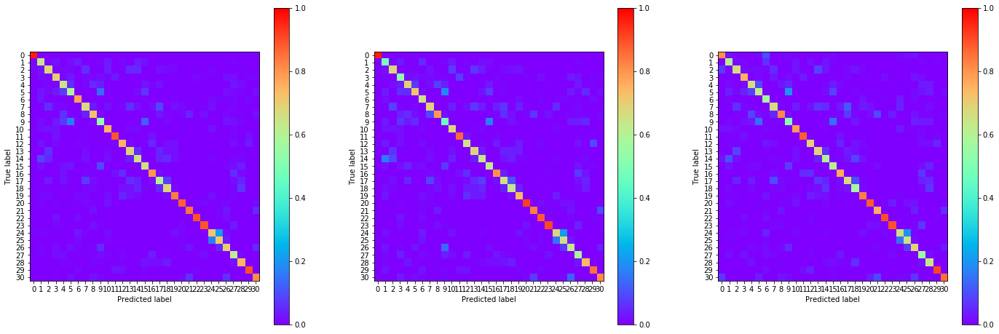

19:37:05.847673
#049 [Train: 0.892] [Test: 0.961] [Valid: 0.954]
#049 [Train: 0.740] [Test: 0.729] [Valid: 0.724]


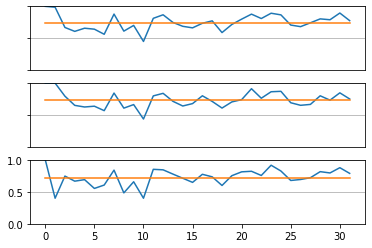

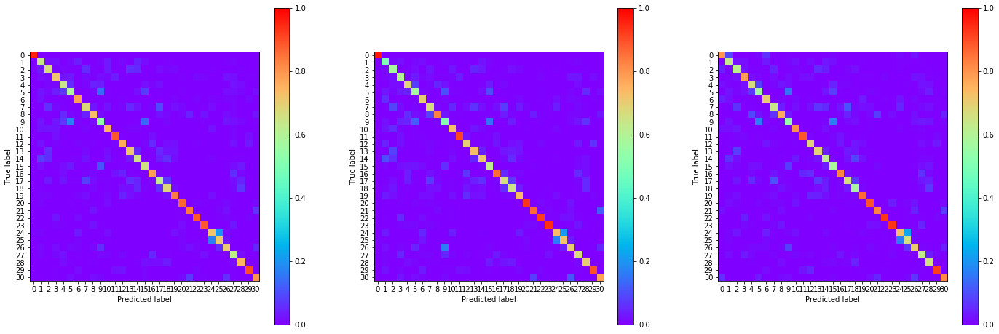

19:37:53.237383
#050 [Train: 0.869] [Test: 0.942] [Valid: 0.926]
#050 [Train: 0.747] [Test: 0.728] [Valid: 0.730]


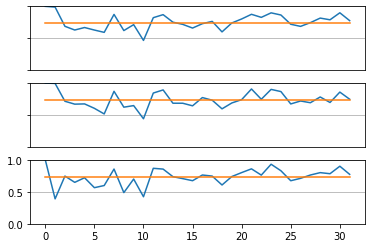

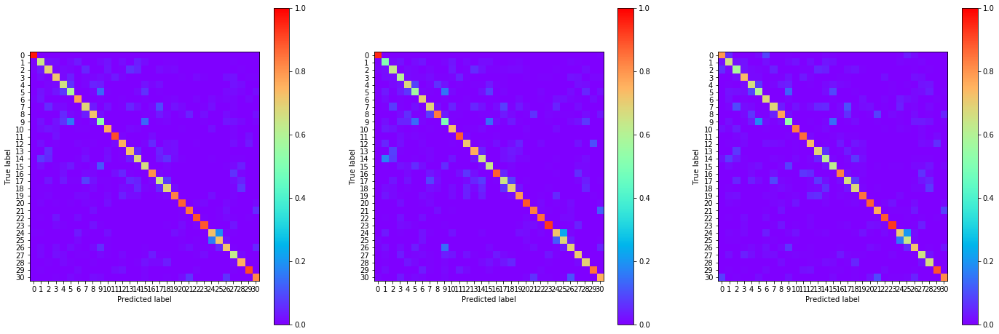

19:38:40.304198
#051 [Train: 0.853] [Test: 0.924] [Valid: 0.933]
#051 [Train: 0.755] [Test: 0.727] [Valid: 0.728]


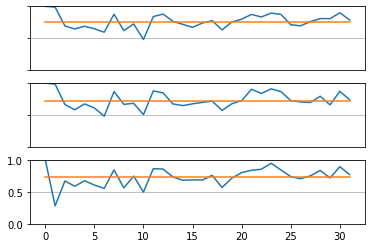

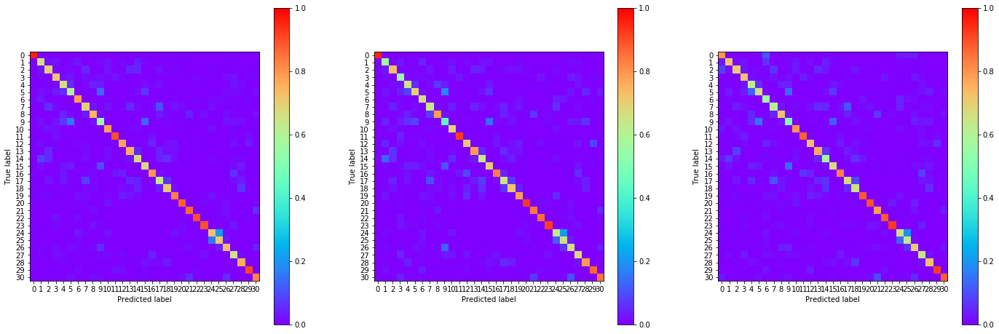

19:39:27.892269
#052 [Train: 0.843] [Test: 0.907] [Valid: 0.940]
#052 [Train: 0.756] [Test: 0.737] [Valid: 0.731]


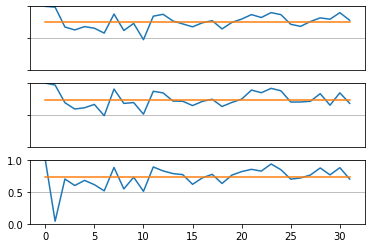

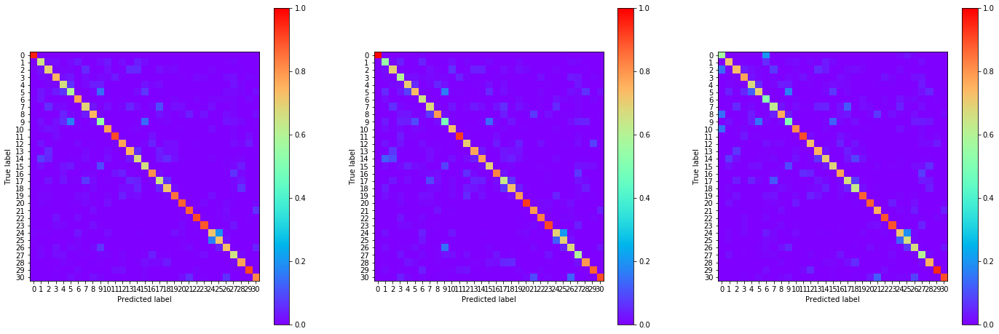

19:40:15.141592
#053 [Train: 0.820] [Test: 0.890] [Valid: 0.890]
#053 [Train: 0.763] [Test: 0.748] [Valid: 0.745]


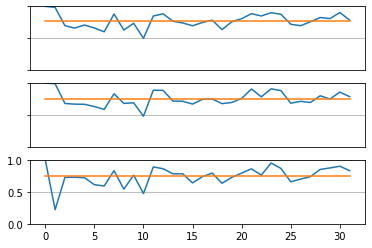

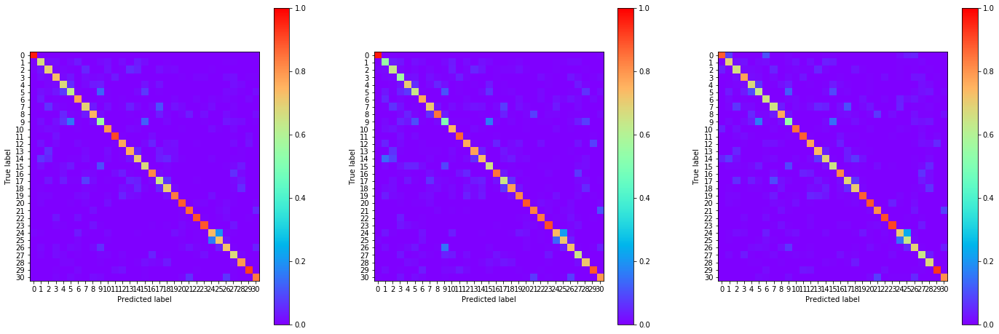

19:41:02.361453
#054 [Train: 0.806] [Test: 0.881] [Valid: 0.888]
#054 [Train: 0.766] [Test: 0.747] [Valid: 0.744]


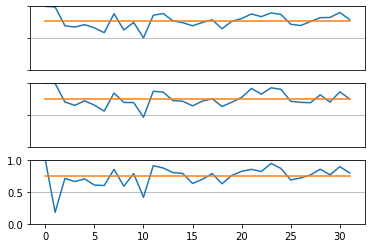

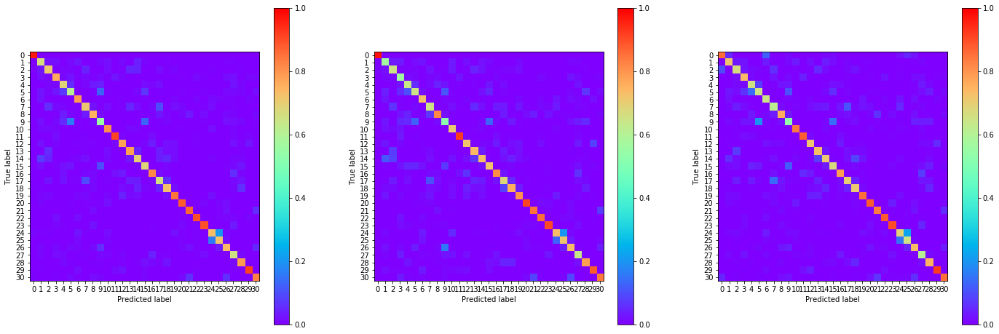

19:41:49.532394
#055 [Train: 0.797] [Test: 0.863] [Valid: 0.880]
#055 [Train: 0.769] [Test: 0.756] [Valid: 0.740]


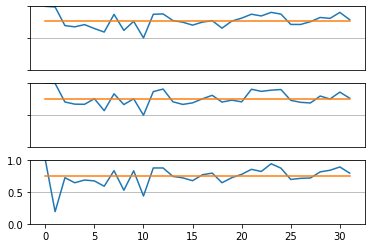

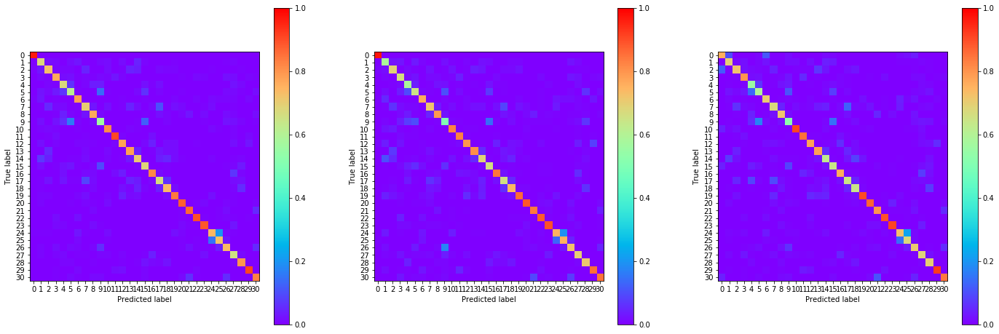

19:42:36.646312
#056 [Train: 0.782] [Test: 0.850] [Valid: 0.848]
#056 [Train: 0.774] [Test: 0.756] [Valid: 0.756]


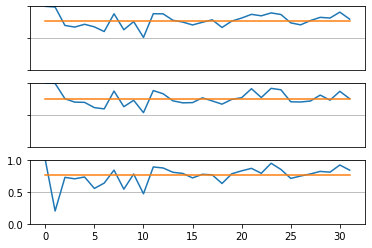

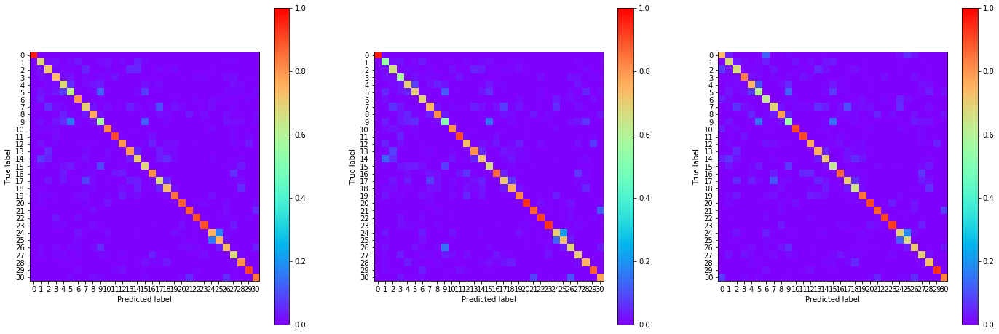

19:43:23.902240
#057 [Train: 0.765] [Test: 0.822] [Valid: 0.842]
#057 [Train: 0.777] [Test: 0.760] [Valid: 0.756]


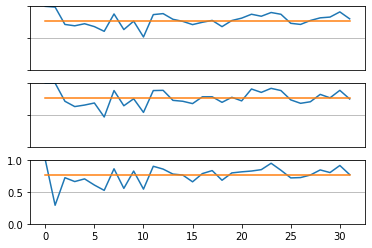

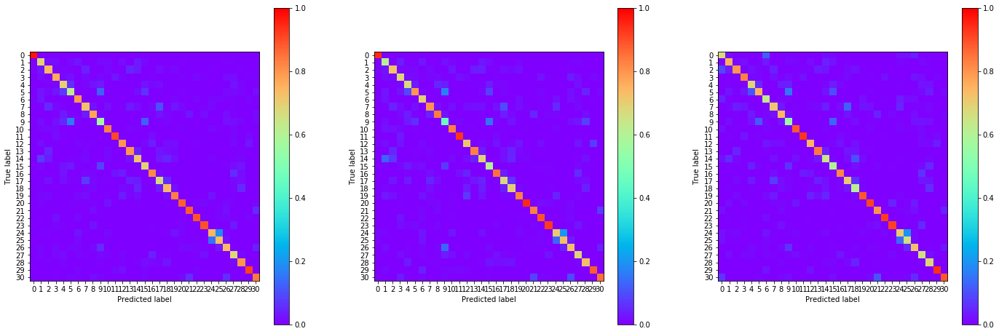

19:44:11.312753
#058 [Train: 0.755] [Test: 0.820] [Valid: 0.840]
#058 [Train: 0.781] [Test: 0.767] [Valid: 0.759]


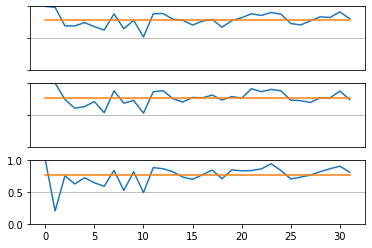

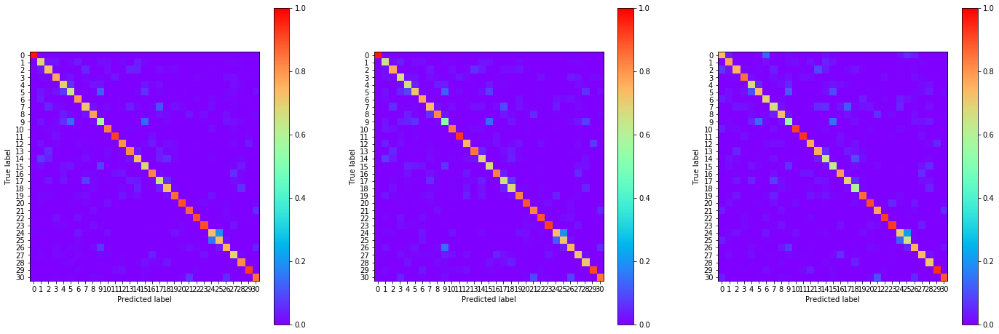

19:44:58.726103
#059 [Train: 0.734] [Test: 0.801] [Valid: 0.839]
#059 [Train: 0.788] [Test: 0.770] [Valid: 0.763]


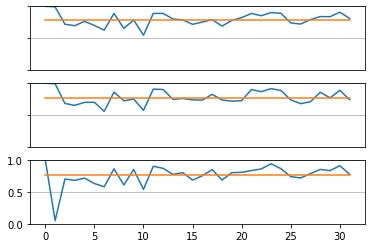

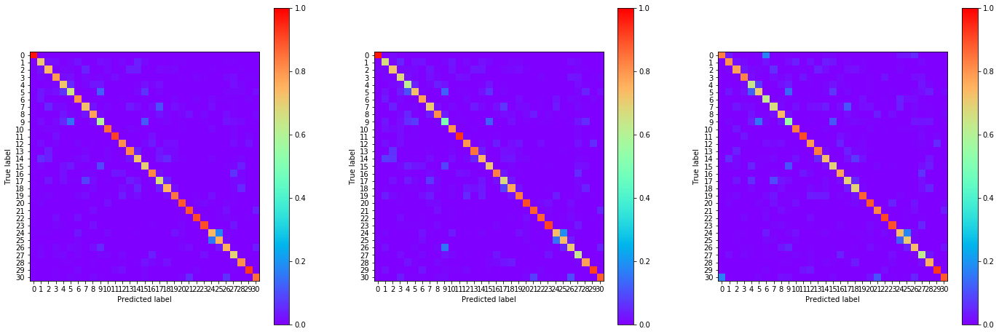

19:45:46.165097
#060 [Train: 0.726] [Test: 0.803] [Valid: 0.810]
#060 [Train: 0.790] [Test: 0.769] [Valid: 0.769]


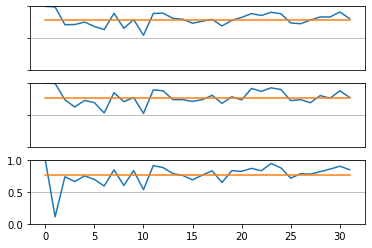

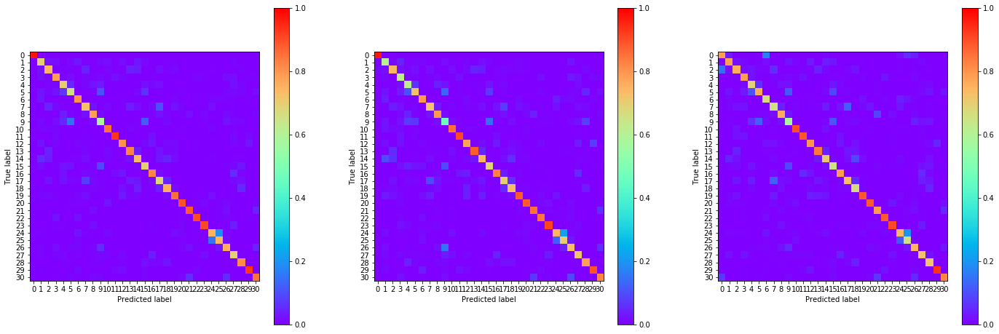

19:46:33.515305
#061 [Train: 0.716] [Test: 0.774] [Valid: 0.788]
#061 [Train: 0.794] [Test: 0.777] [Valid: 0.773]


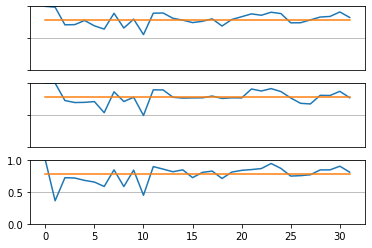

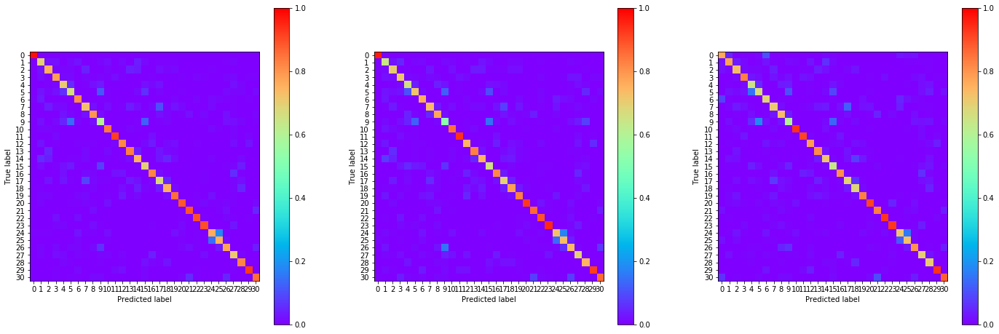

19:47:20.608921
#062 [Train: 0.701] [Test: 0.767] [Valid: 0.800]
#062 [Train: 0.797] [Test: 0.777] [Valid: 0.769]


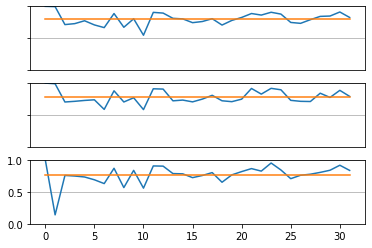

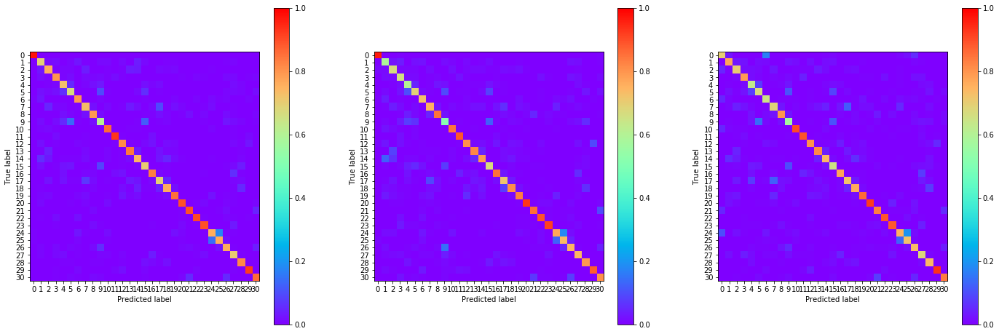

19:48:07.633494
#063 [Train: 0.690] [Test: 0.771] [Valid: 0.781]
#063 [Train: 0.801] [Test: 0.779] [Valid: 0.780]


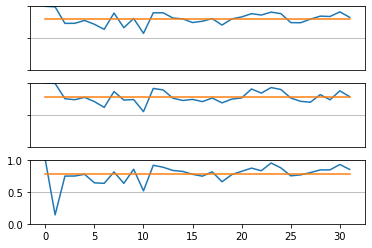

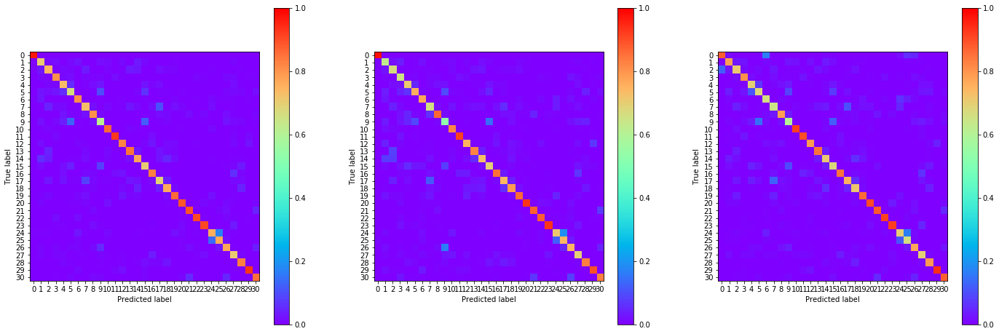

19:50:30.636281
#066 [Train: 0.659] [Test: 0.746] [Valid: 0.784]
#066 [Train: 0.810] [Test: 0.780] [Valid: 0.779]


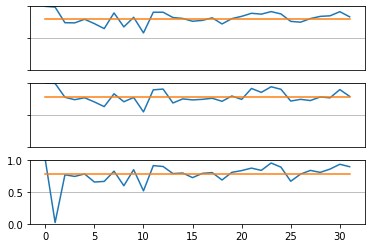

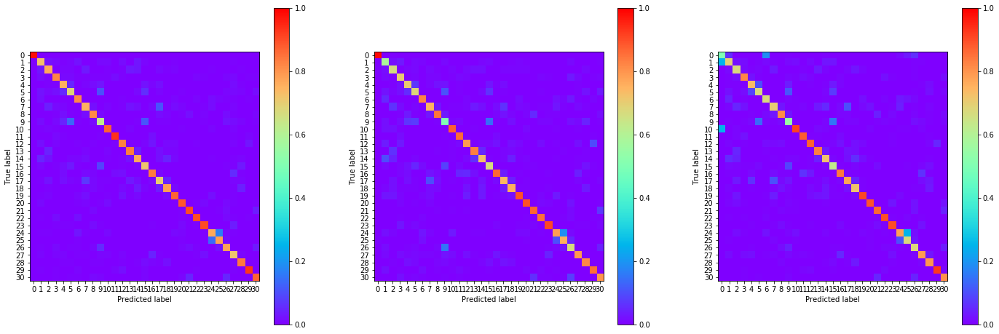

19:51:17.954569
#067 [Train: 0.651] [Test: 0.731] [Valid: 0.746]
#067 [Train: 0.810] [Test: 0.788] [Valid: 0.791]


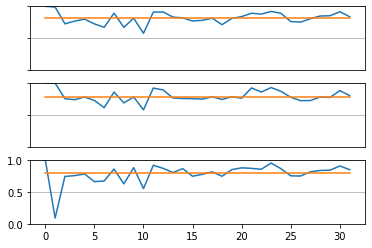

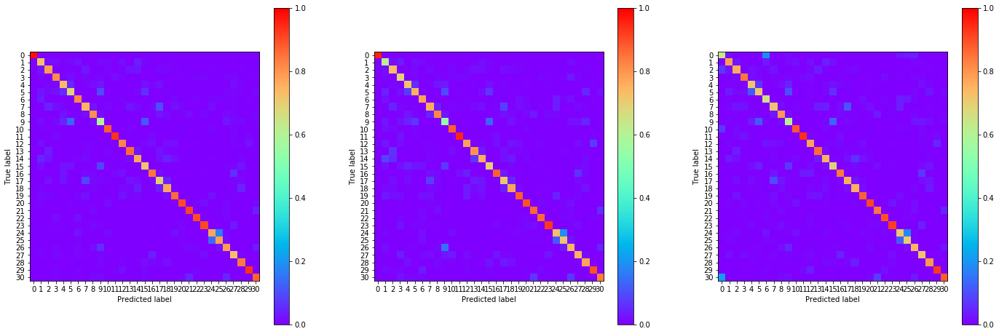

19:52:05.280025
#068 [Train: 0.641] [Test: 0.719] [Valid: 0.765]
#068 [Train: 0.814] [Test: 0.788] [Valid: 0.788]


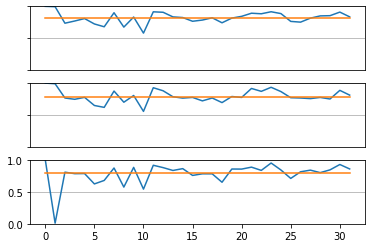

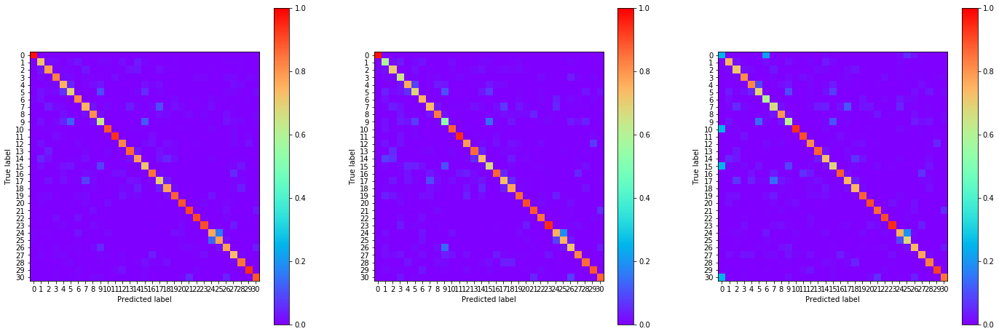

19:52:52.527064
#069 [Train: 0.629] [Test: 0.700] [Valid: 0.750]
#069 [Train: 0.818] [Test: 0.794] [Valid: 0.790]


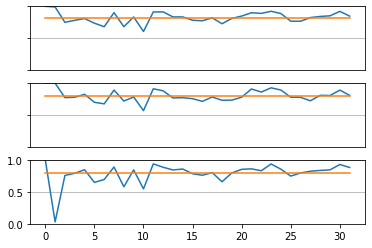

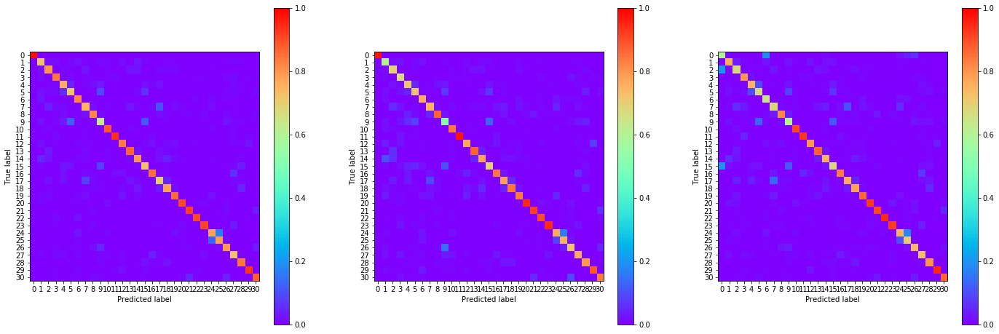

19:53:39.618079
#070 [Train: 0.626] [Test: 0.703] [Valid: 0.731]
#070 [Train: 0.817] [Test: 0.795] [Valid: 0.797]


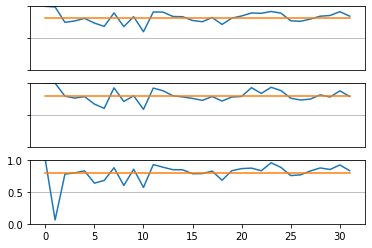

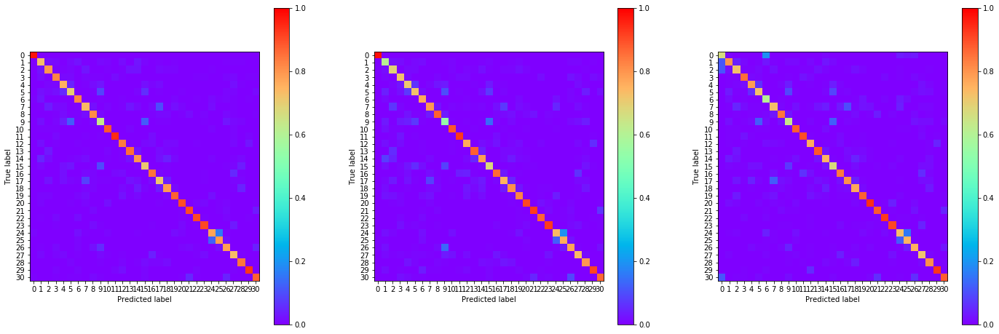

19:54:27.202045
#071 [Train: 0.616] [Test: 0.697] [Valid: 0.736]
#071 [Train: 0.822] [Test: 0.799] [Valid: 0.793]


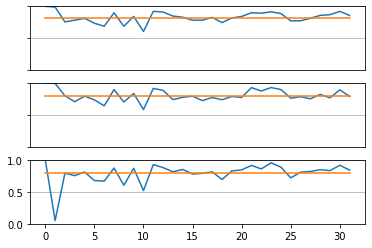

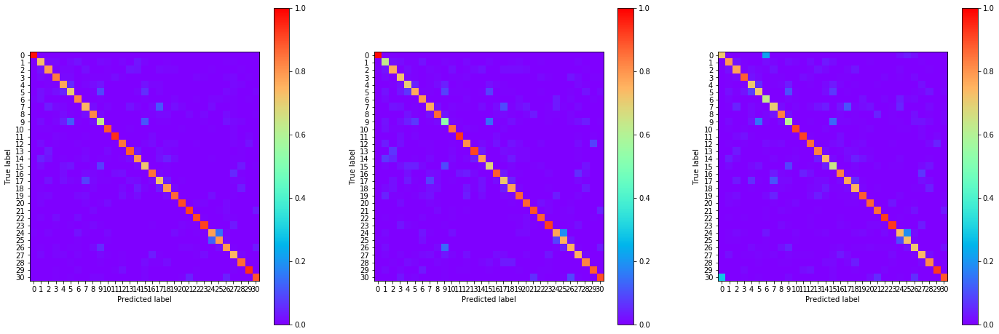

19:55:14.625108
#072 [Train: 0.603] [Test: 0.681] [Valid: 0.722]
#072 [Train: 0.823] [Test: 0.801] [Valid: 0.795]


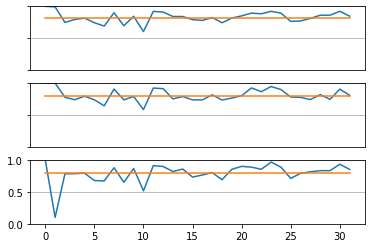

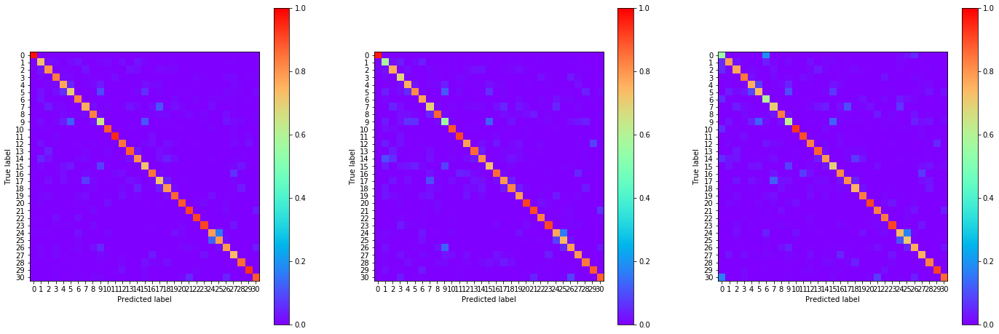

19:56:02.211065
#073 [Train: 0.597] [Test: 0.674] [Valid: 0.715]
#073 [Train: 0.827] [Test: 0.805] [Valid: 0.802]


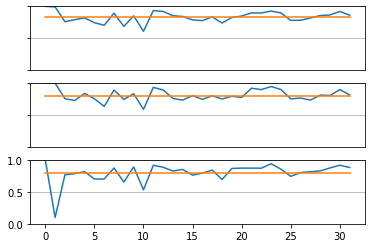

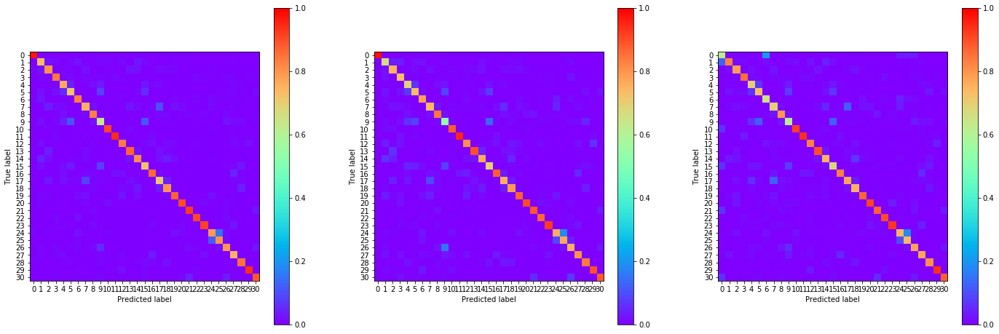

19:56:49.262342
#074 [Train: 0.589] [Test: 0.673] [Valid: 0.732]
#074 [Train: 0.830] [Test: 0.801] [Valid: 0.797]


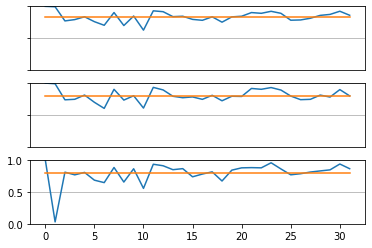

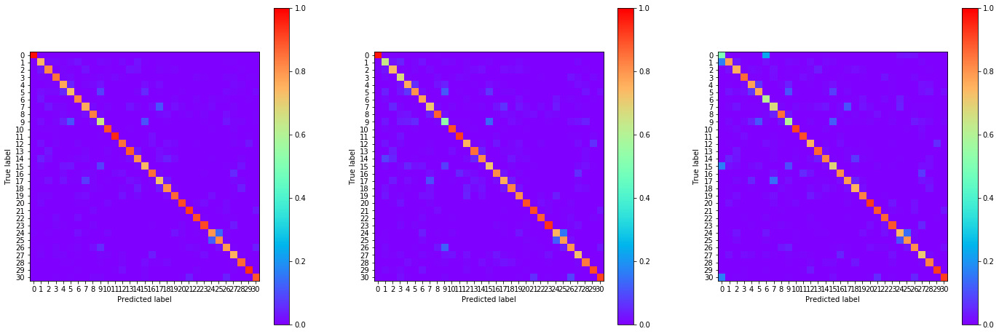

19:57:36.475644
#075 [Train: 0.582] [Test: 0.650] [Valid: 0.695]
#075 [Train: 0.831] [Test: 0.810] [Valid: 0.802]


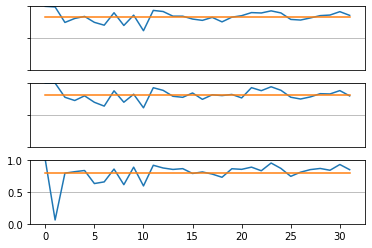

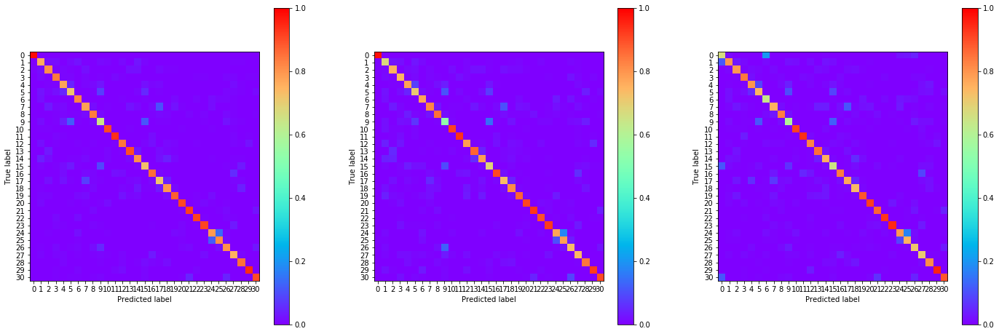

19:58:23.629460
#076 [Train: 0.574] [Test: 0.647] [Valid: 0.711]
#076 [Train: 0.832] [Test: 0.813] [Valid: 0.808]


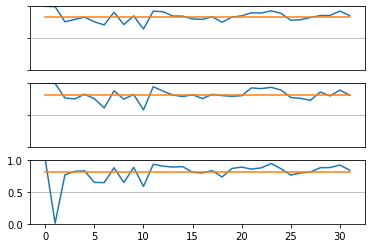

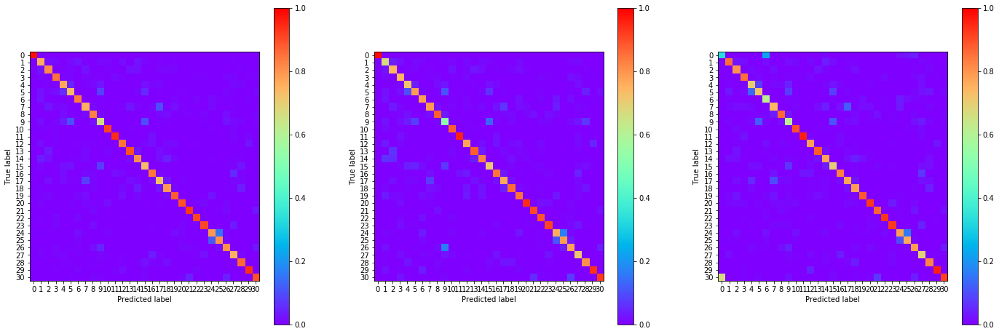

19:59:11.009968
#077 [Train: 0.567] [Test: 0.634] [Valid: 0.687]
#077 [Train: 0.835] [Test: 0.811] [Valid: 0.807]


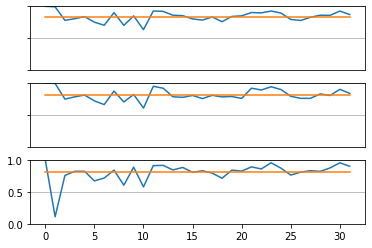

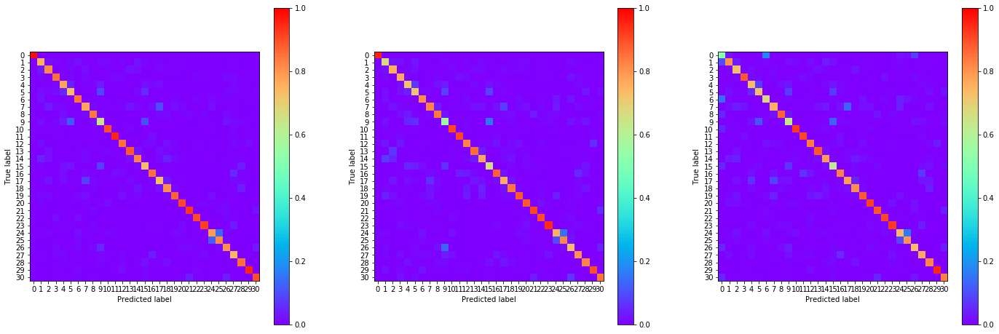

19:59:58.513877
#078 [Train: 0.562] [Test: 0.671] [Valid: 0.704]
#078 [Train: 0.836] [Test: 0.801] [Valid: 0.798]


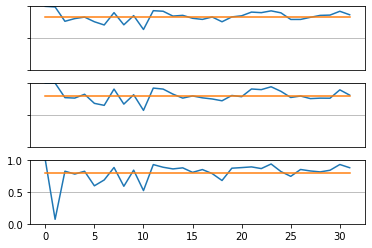

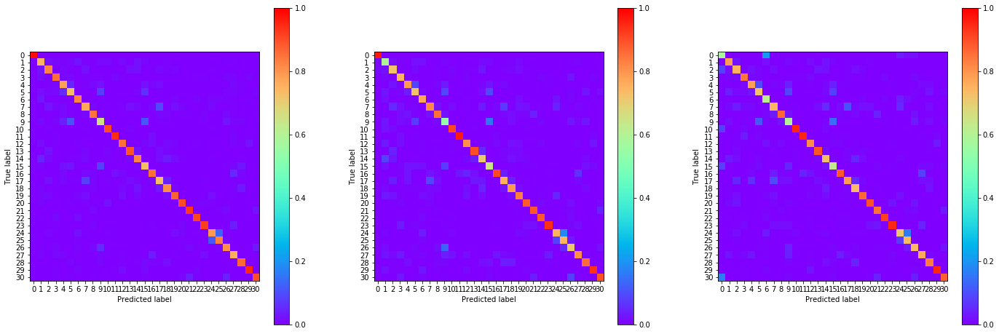

20:00:45.826242
#079 [Train: 0.552] [Test: 0.639] [Valid: 0.706]
#079 [Train: 0.840] [Test: 0.814] [Valid: 0.810]


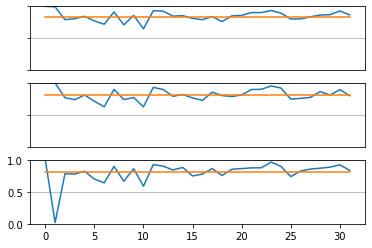

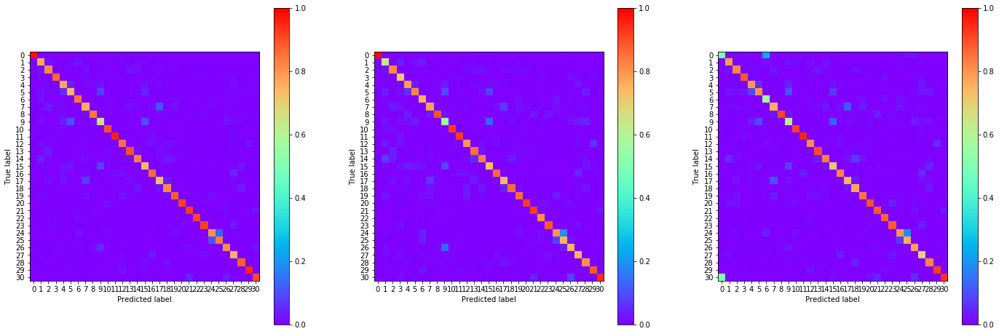

20:01:33.378620
#080 [Train: 0.542] [Test: 0.611] [Valid: 0.686]
#080 [Train: 0.843] [Test: 0.818] [Valid: 0.811]


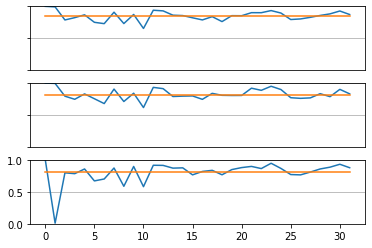

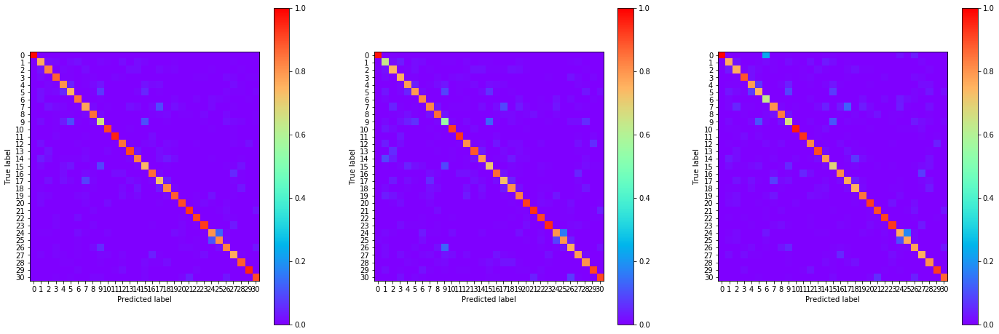

20:02:20.658862
#081 [Train: 0.541] [Test: 0.638] [Valid: 0.670]
#081 [Train: 0.842] [Test: 0.814] [Valid: 0.815]


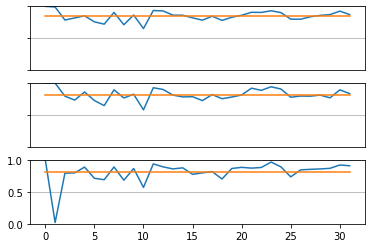

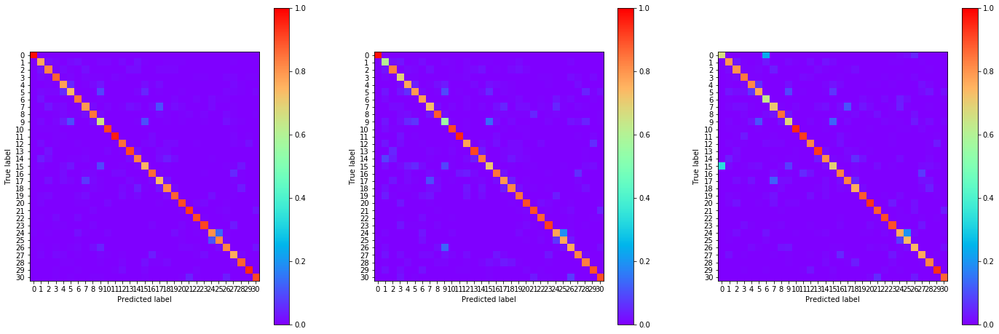

20:03:08.134495
#082 [Train: 0.536] [Test: 0.637] [Valid: 0.684]
#082 [Train: 0.843] [Test: 0.819] [Valid: 0.812]


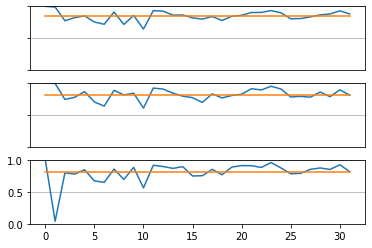

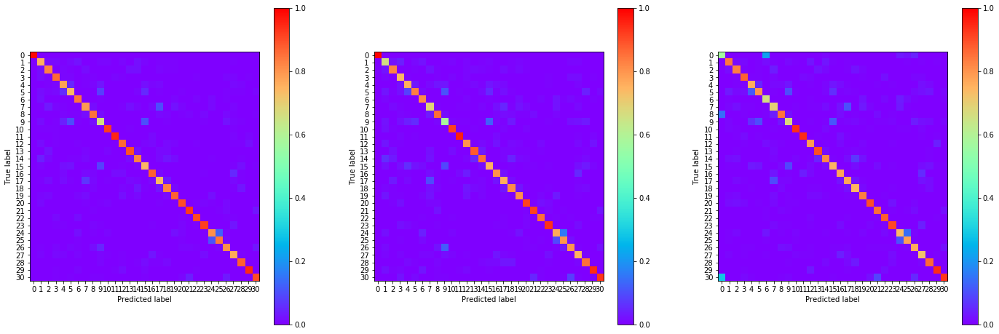

20:03:55.478850
#083 [Train: 0.526] [Test: 0.614] [Valid: 0.668]
#083 [Train: 0.846] [Test: 0.822] [Valid: 0.810]


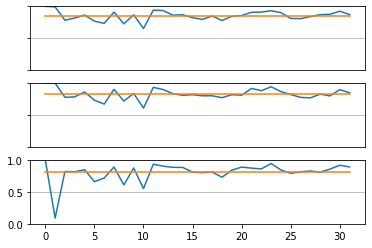

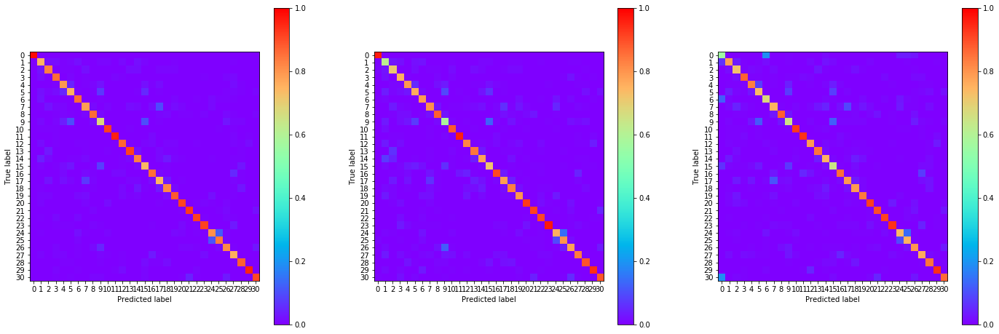

20:04:42.515389
#084 [Train: 0.519] [Test: 0.622] [Valid: 0.664]
#084 [Train: 0.848] [Test: 0.822] [Valid: 0.814]


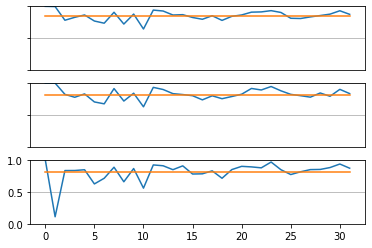

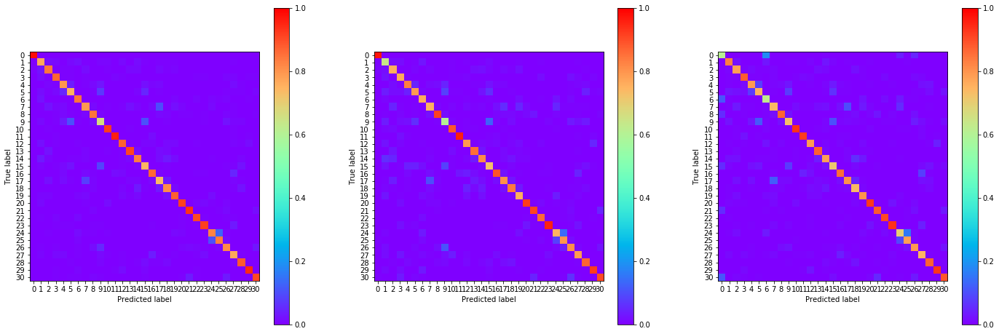

20:05:30.022274
#085 [Train: 0.517] [Test: 0.595] [Valid: 0.665]
#085 [Train: 0.849] [Test: 0.823] [Valid: 0.818]


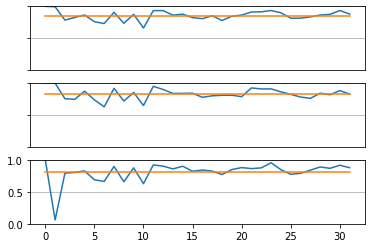

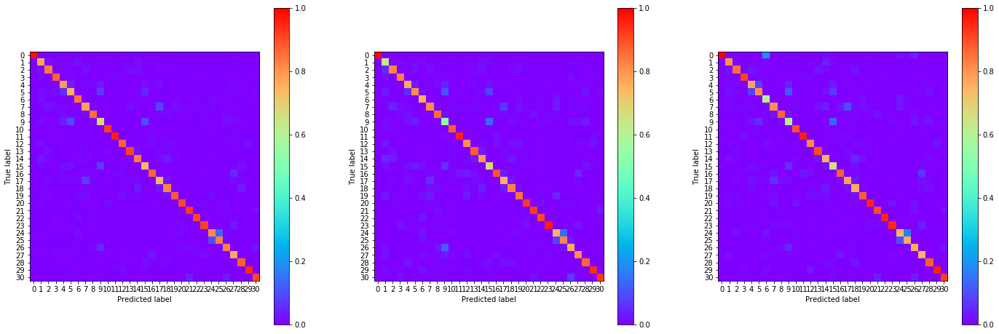

20:06:17.257033
#086 [Train: 0.509] [Test: 0.588] [Valid: 0.679]
#086 [Train: 0.852] [Test: 0.824] [Valid: 0.817]


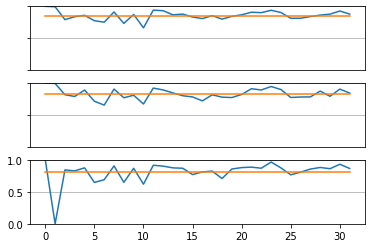

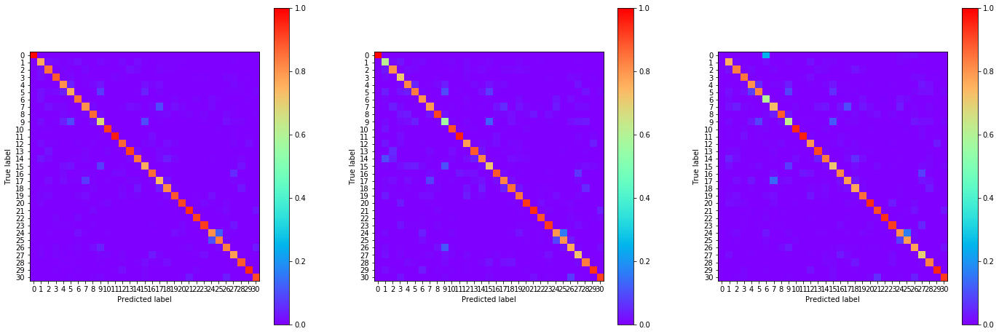

20:07:04.558569
#087 [Train: 0.507] [Test: 0.584] [Valid: 0.655]
#087 [Train: 0.852] [Test: 0.830] [Valid: 0.819]


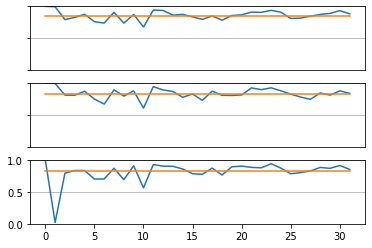

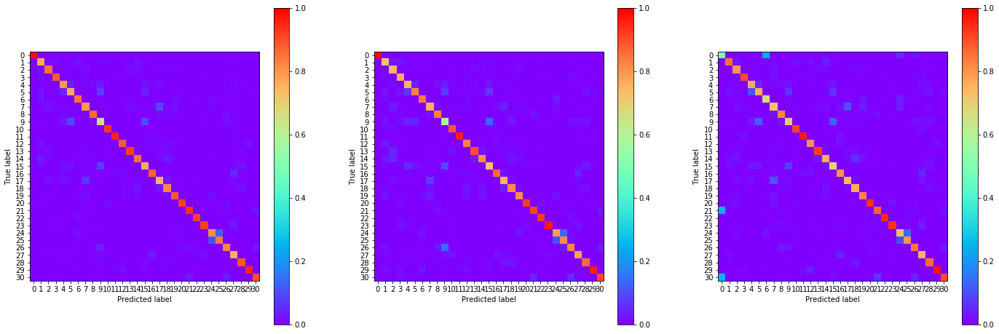

20:07:51.681261
#088 [Train: 0.499] [Test: 0.590] [Valid: 0.647]
#088 [Train: 0.854] [Test: 0.827] [Valid: 0.823]


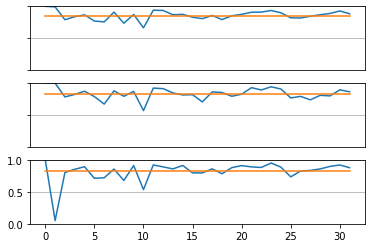

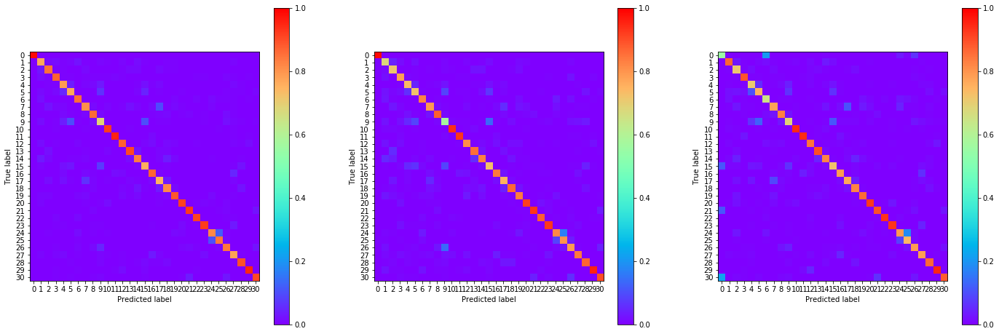

20:08:39.031143
#089 [Train: 0.495] [Test: 0.589] [Valid: 0.634]
#089 [Train: 0.855] [Test: 0.829] [Valid: 0.822]


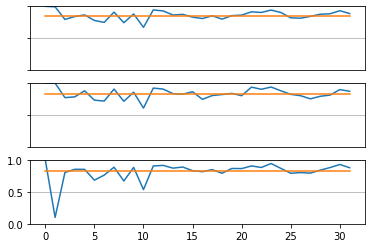

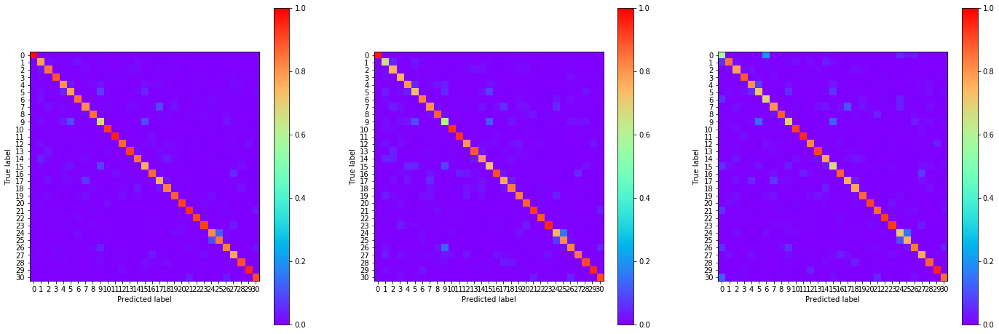

20:09:26.351675
#090 [Train: 0.486] [Test: 0.573] [Valid: 0.661]
#090 [Train: 0.858] [Test: 0.831] [Valid: 0.815]


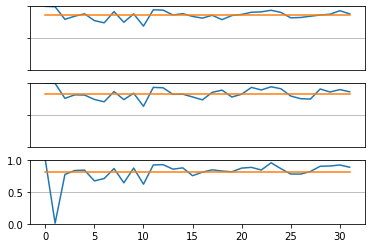

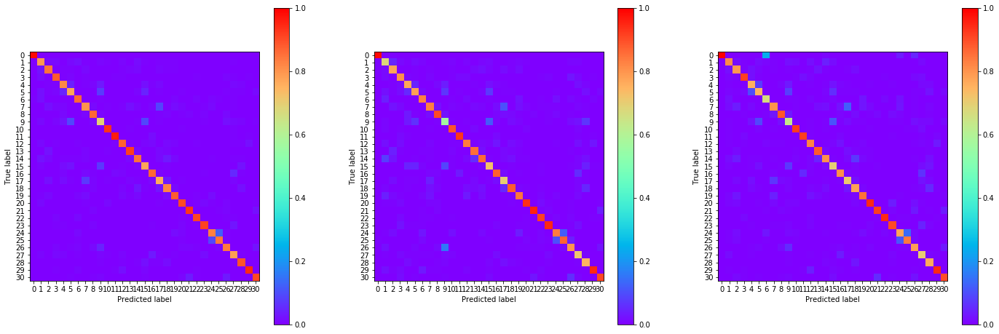

20:10:13.233819
#091 [Train: 0.480] [Test: 0.560] [Valid: 0.622]
#091 [Train: 0.859] [Test: 0.837] [Valid: 0.829]


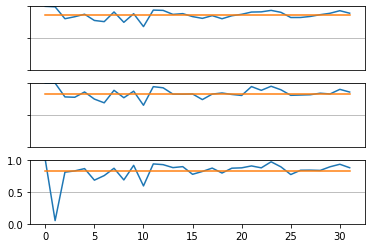

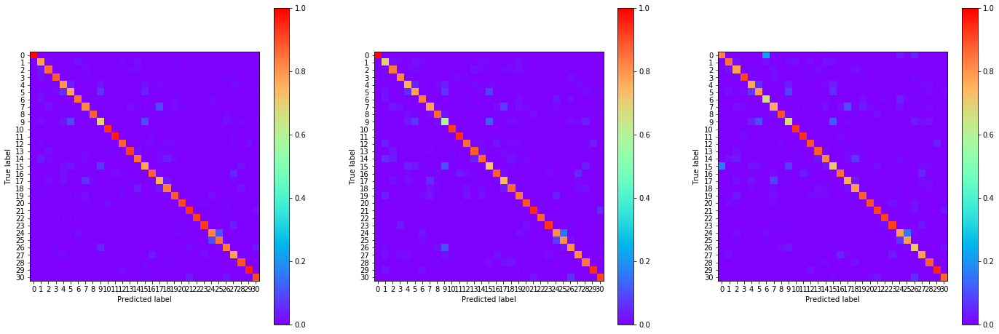

20:11:00.684891
#092 [Train: 0.480] [Test: 0.544] [Valid: 0.609]
#092 [Train: 0.859] [Test: 0.834] [Valid: 0.820]


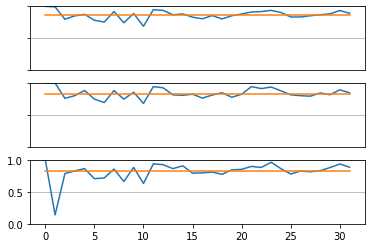

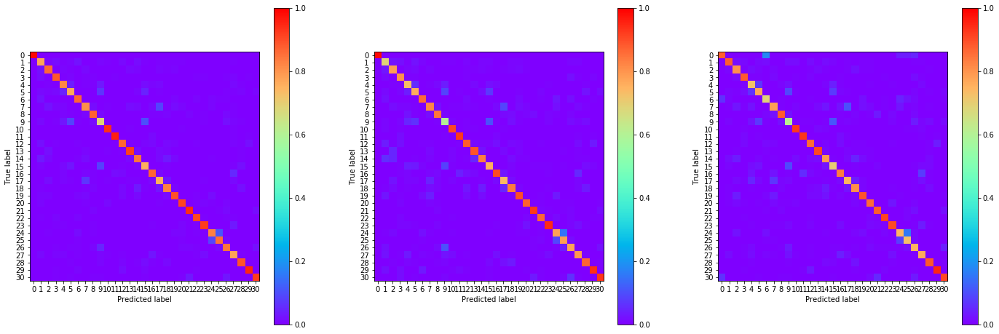

20:11:47.737666
#093 [Train: 0.473] [Test: 0.561] [Valid: 0.624]
#093 [Train: 0.861] [Test: 0.834] [Valid: 0.826]


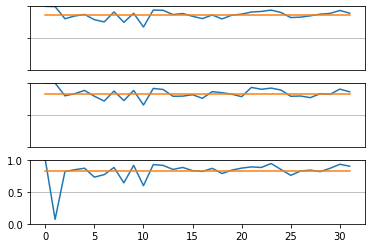

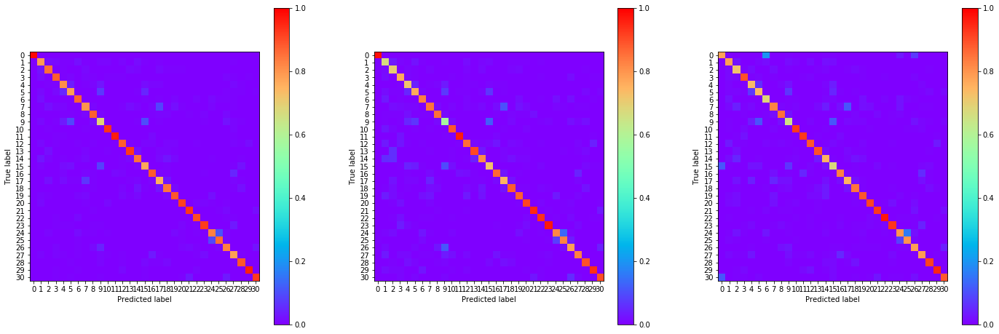

20:12:35.543031
#094 [Train: 0.468] [Test: 0.545] [Valid: 0.608]
#094 [Train: 0.863] [Test: 0.837] [Valid: 0.826]


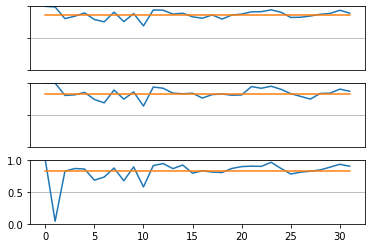

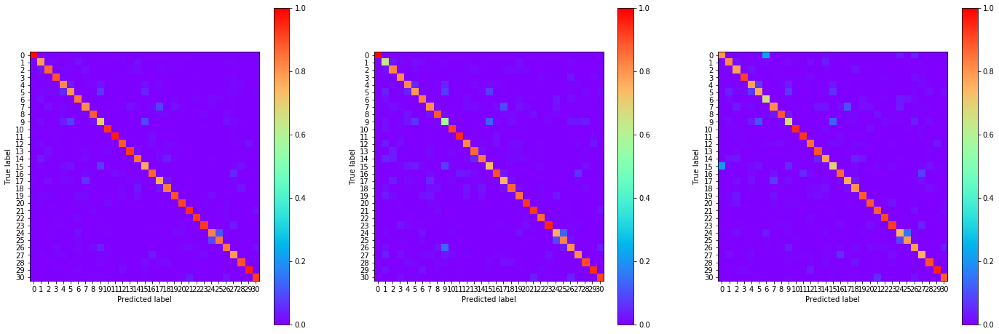

20:13:22.734267
#095 [Train: 0.461] [Test: 0.554] [Valid: 0.602]
#095 [Train: 0.864] [Test: 0.835] [Valid: 0.834]


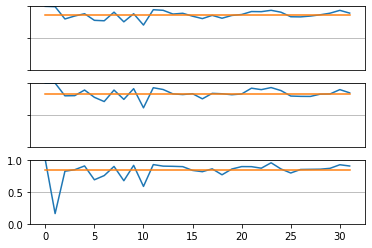

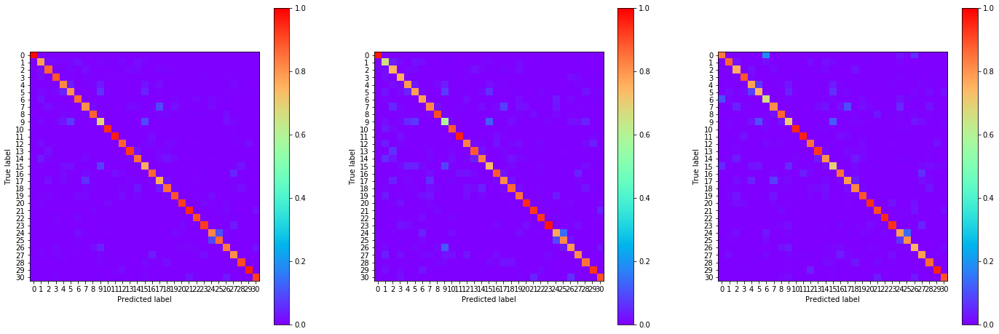

20:14:10.211262
#096 [Train: 0.458] [Test: 0.538] [Valid: 0.613]
#096 [Train: 0.865] [Test: 0.836] [Valid: 0.831]


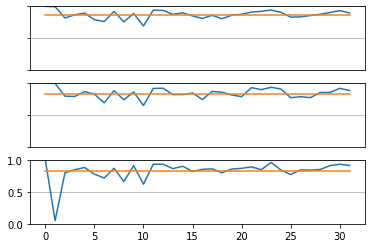

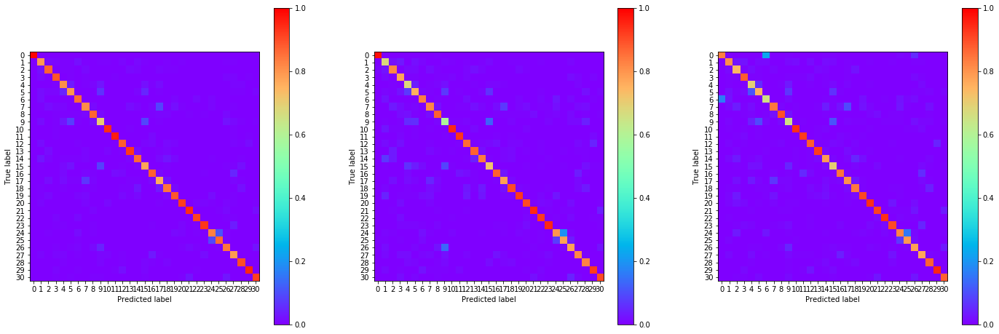

20:14:57.631730
#097 [Train: 0.454] [Test: 0.546] [Valid: 0.626]
#097 [Train: 0.868] [Test: 0.838] [Valid: 0.835]


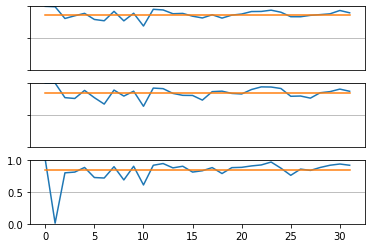

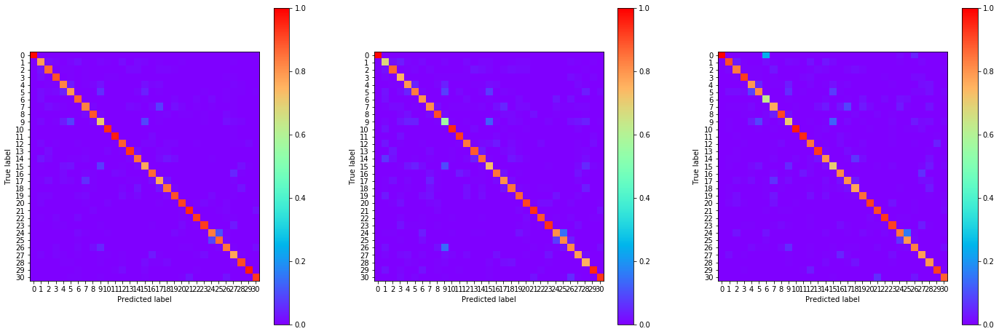

20:15:44.820866
#098 [Train: 0.451] [Test: 0.535] [Valid: 0.626]
#098 [Train: 0.868] [Test: 0.842] [Valid: 0.830]


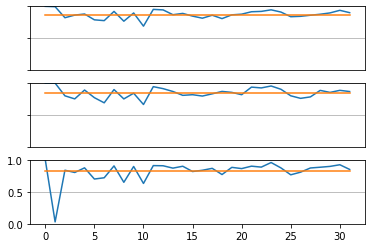

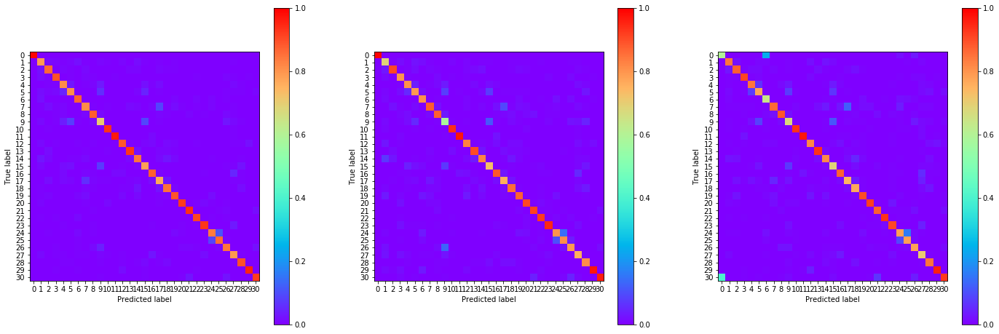

20:16:31.909103
#099 [Train: 0.442] [Test: 0.548] [Valid: 0.637]
#099 [Train: 0.870] [Test: 0.837] [Valid: 0.828]


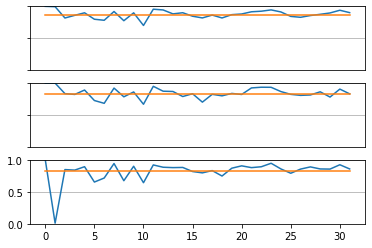

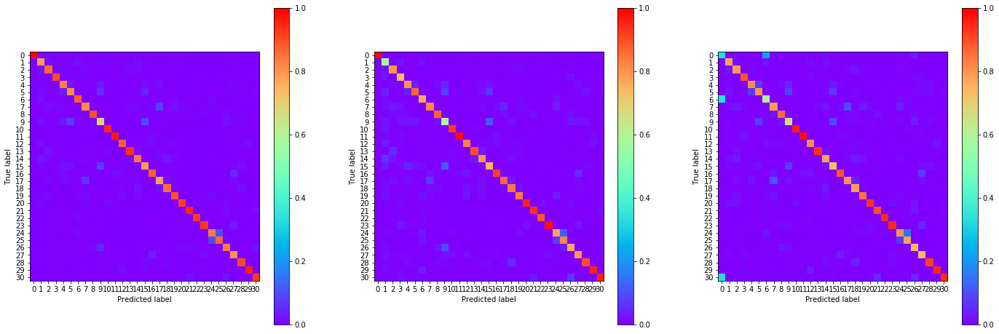

20:17:19.080607
#100 [Train: 0.439] [Test: 0.526] [Valid: 0.596]
#100 [Train: 0.869] [Test: 0.842] [Valid: 0.831]


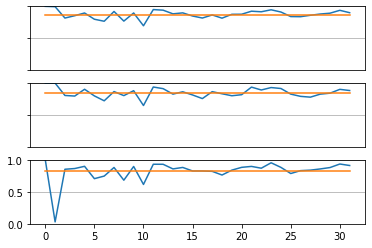

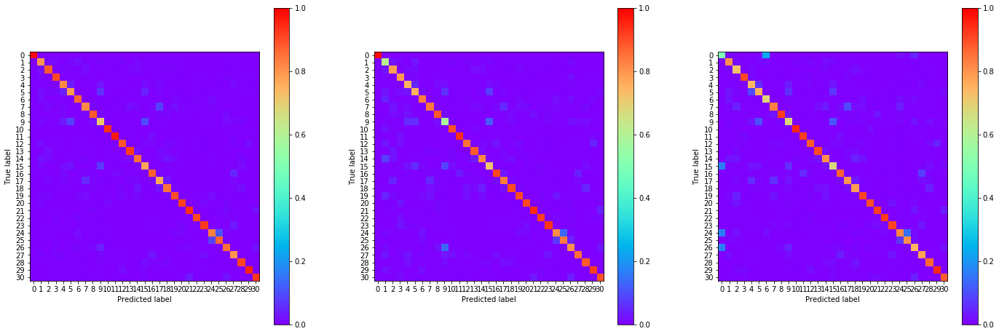

20:18:06.465378
#101 [Train: 0.435] [Test: 0.532] [Valid: 0.593]
#101 [Train: 0.871] [Test: 0.844] [Valid: 0.836]


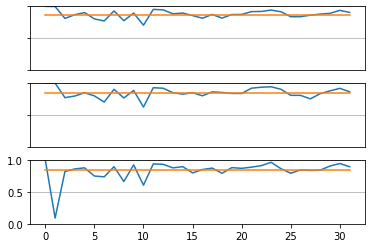

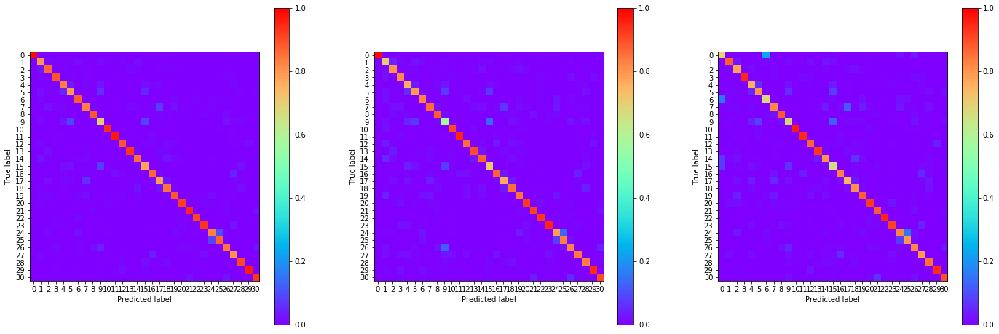

20:18:53.836839
#102 [Train: 0.433] [Test: 0.524] [Valid: 0.611]
#102 [Train: 0.873] [Test: 0.847] [Valid: 0.838]


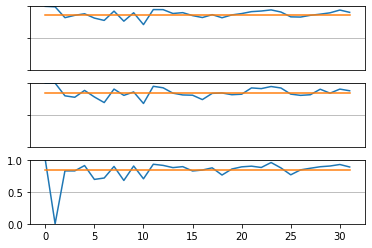

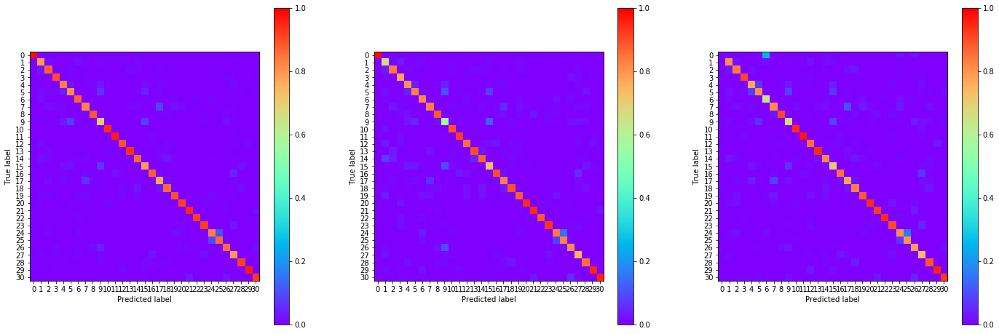

20:19:41.297213
#103 [Train: 0.427] [Test: 0.540] [Valid: 0.601]
#103 [Train: 0.874] [Test: 0.844] [Valid: 0.837]


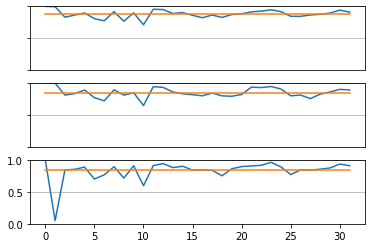

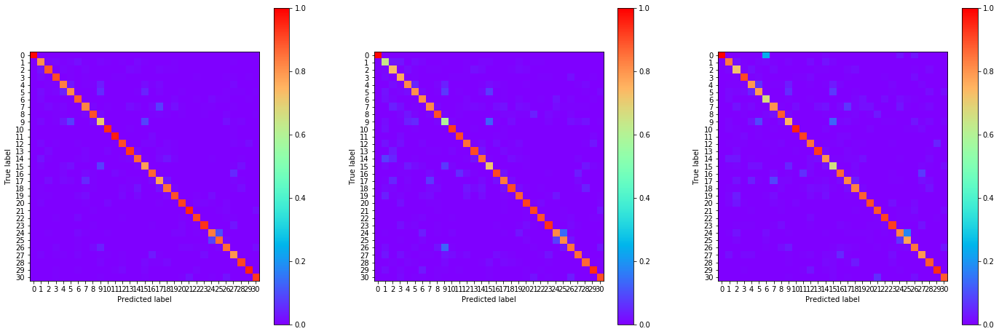

20:20:28.845603
#104 [Train: 0.424] [Test: 0.520] [Valid: 0.594]
#104 [Train: 0.876] [Test: 0.845] [Valid: 0.840]


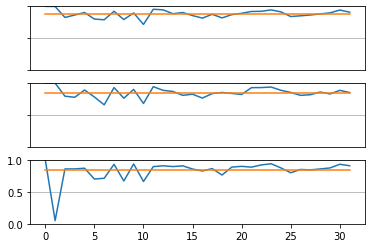

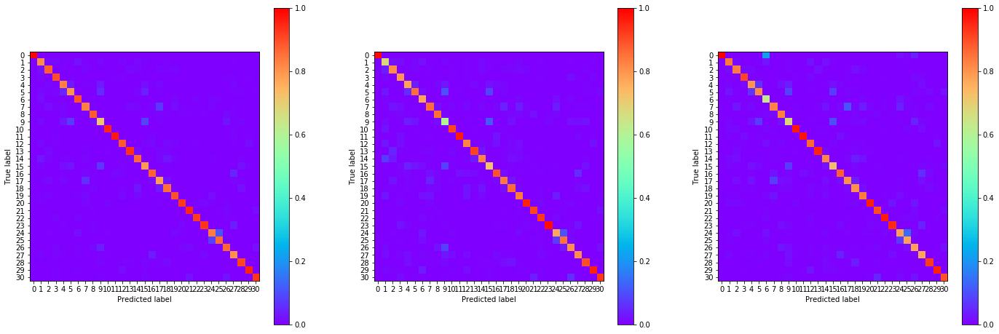

20:21:15.986496
#105 [Train: 0.421] [Test: 0.520] [Valid: 0.601]
#105 [Train: 0.875] [Test: 0.848] [Valid: 0.837]


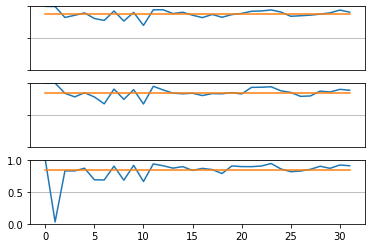

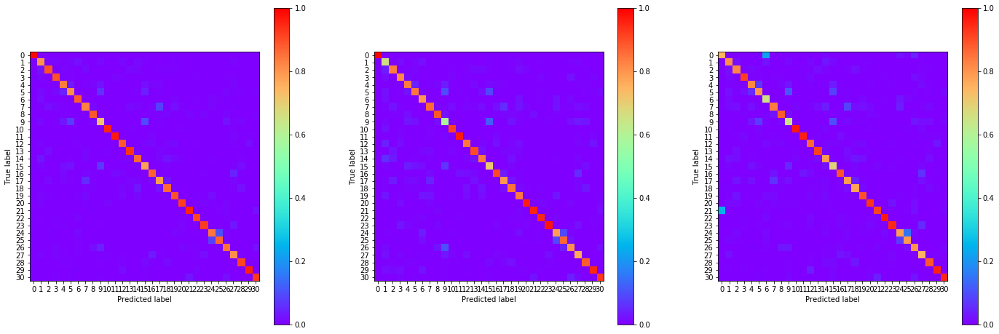

20:22:03.878310
#106 [Train: 0.417] [Test: 0.509] [Valid: 0.599]
#106 [Train: 0.877] [Test: 0.850] [Valid: 0.840]


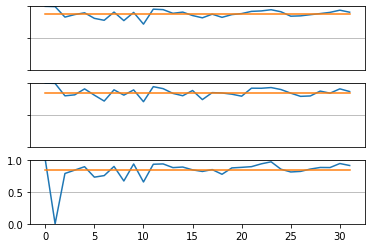

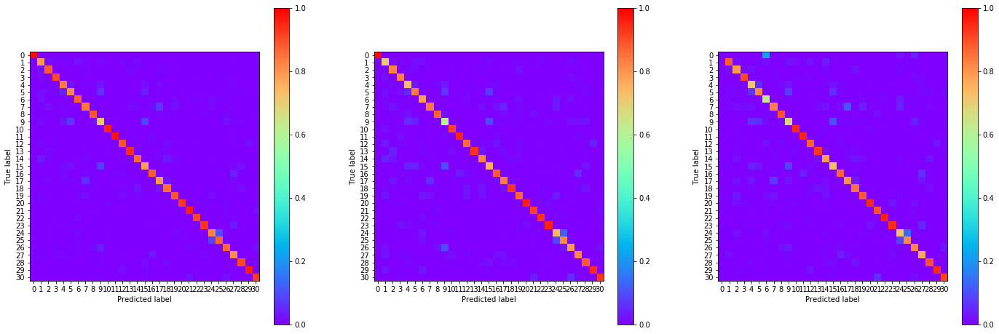

20:22:51.089926
#107 [Train: 0.411] [Test: 0.509] [Valid: 0.595]
#107 [Train: 0.880] [Test: 0.851] [Valid: 0.836]


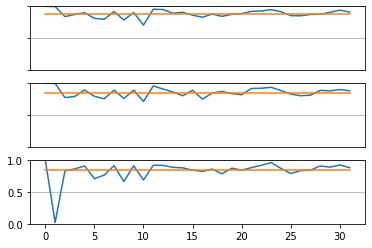

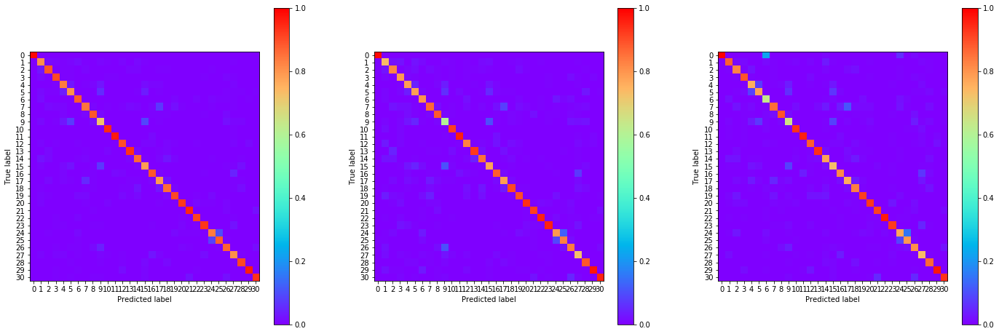

20:23:38.713637
#108 [Train: 0.412] [Test: 0.493] [Valid: 0.588]
#108 [Train: 0.876] [Test: 0.851] [Valid: 0.841]


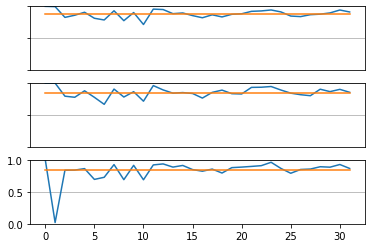

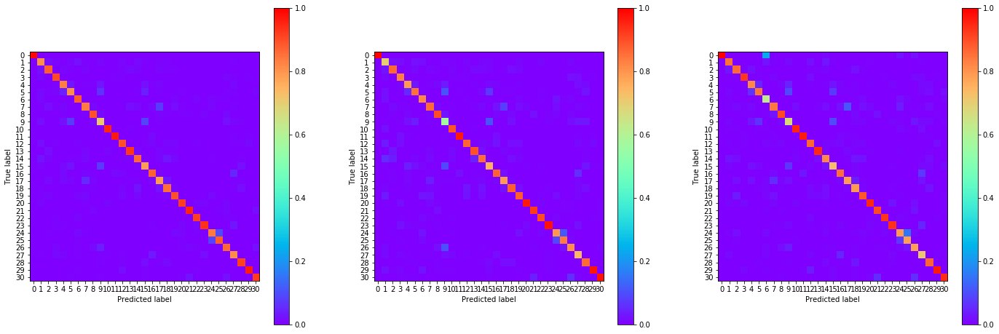

20:24:25.881551
#109 [Train: 0.404] [Test: 0.499] [Valid: 0.586]
#109 [Train: 0.882] [Test: 0.852] [Valid: 0.840]


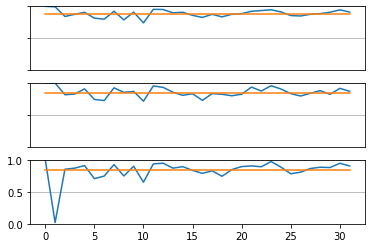

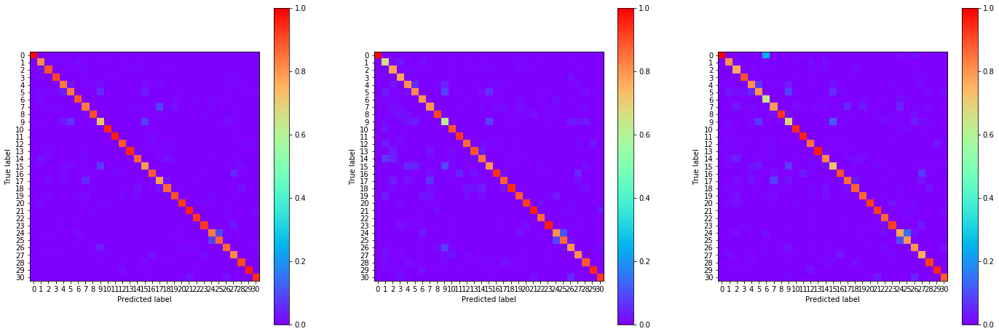

20:25:13.336429
#110 [Train: 0.400] [Test: 0.489] [Valid: 0.557]
#110 [Train: 0.883] [Test: 0.856] [Valid: 0.841]


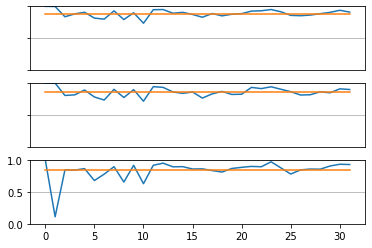

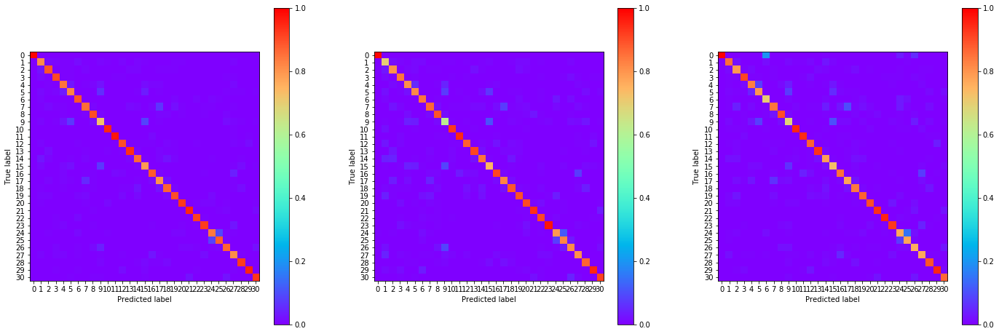

20:26:00.751274
#111 [Train: 0.394] [Test: 0.496] [Valid: 0.562]
#111 [Train: 0.885] [Test: 0.851] [Valid: 0.844]


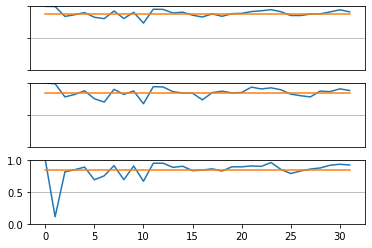

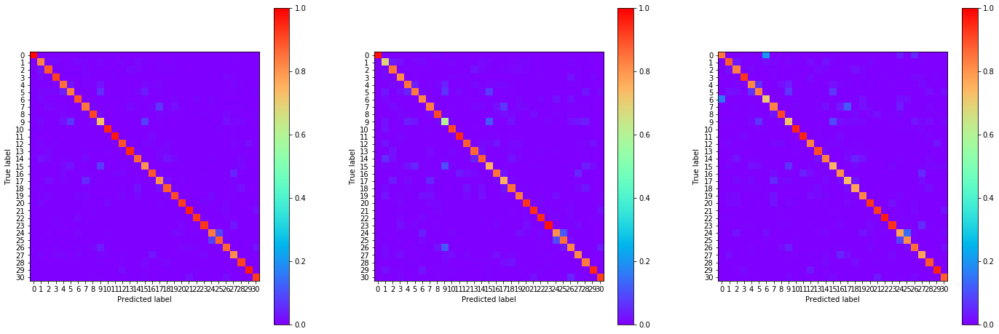

20:26:48.122615
#112 [Train: 0.397] [Test: 0.502] [Valid: 0.575]
#112 [Train: 0.883] [Test: 0.855] [Valid: 0.845]


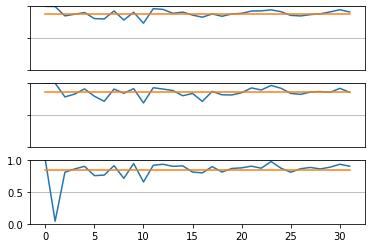

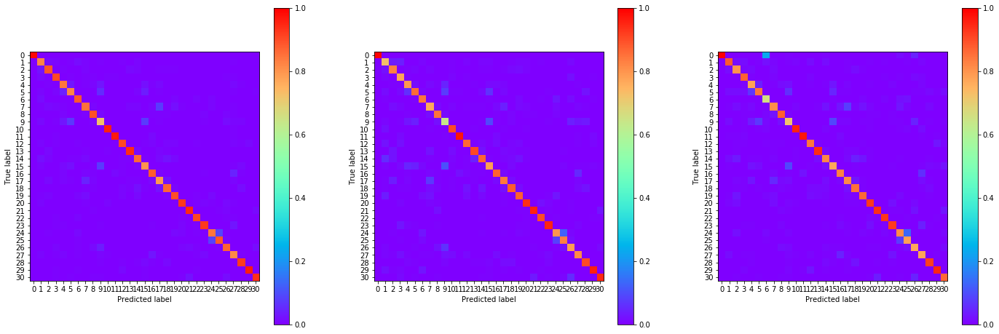

20:27:35.511201
#113 [Train: 0.391] [Test: 0.509] [Valid: 0.546]
#113 [Train: 0.884] [Test: 0.854] [Valid: 0.847]


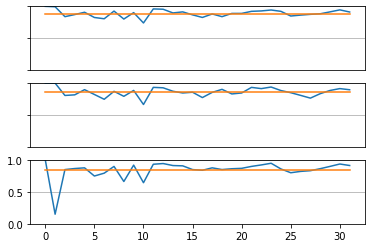

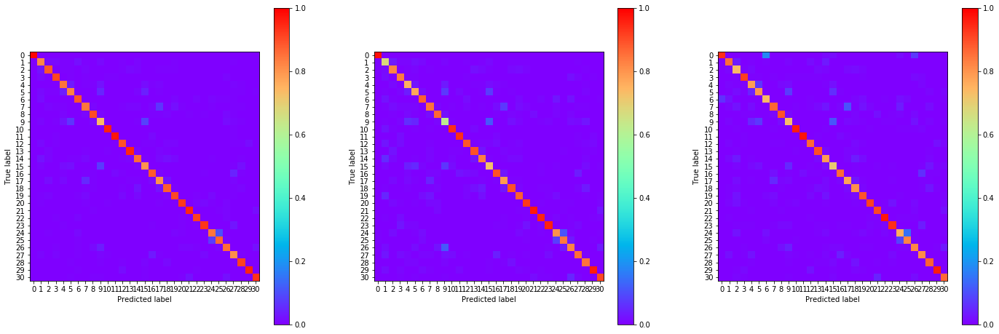

20:28:22.875555
#114 [Train: 0.388] [Test: 0.500] [Valid: 0.575]
#114 [Train: 0.886] [Test: 0.858] [Valid: 0.844]


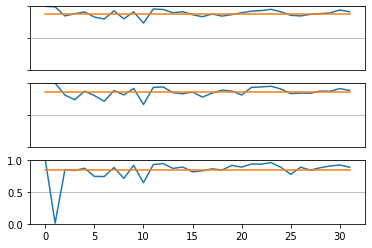

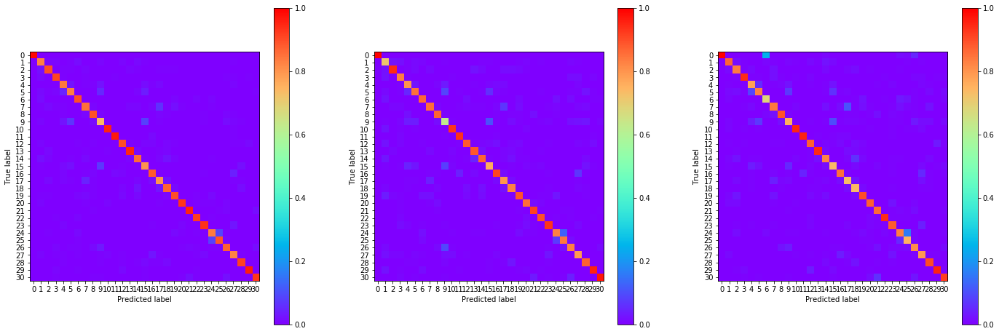

20:29:10.459695
#115 [Train: 0.383] [Test: 0.493] [Valid: 0.551]
#115 [Train: 0.887] [Test: 0.860] [Valid: 0.846]


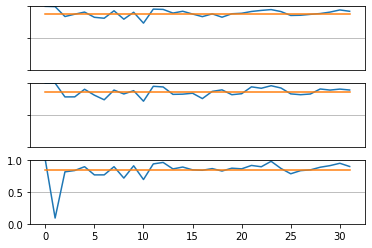

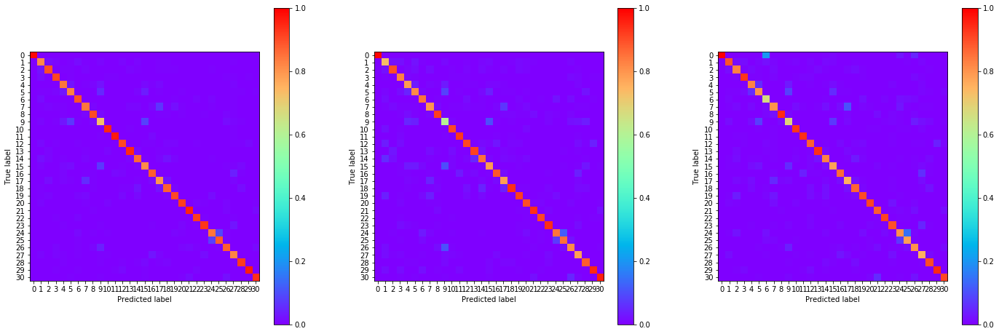

20:29:57.757945
#116 [Train: 0.379] [Test: 0.475] [Valid: 0.554]
#116 [Train: 0.888] [Test: 0.864] [Valid: 0.846]


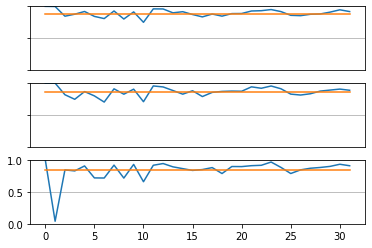

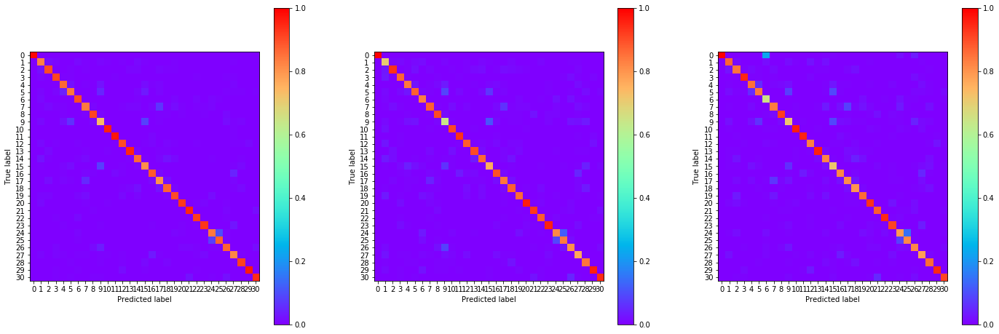

20:30:45.398090
#117 [Train: 0.378] [Test: 0.482] [Valid: 0.535]
#117 [Train: 0.888] [Test: 0.858] [Valid: 0.845]


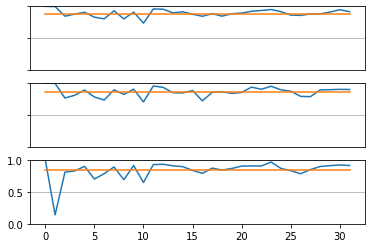

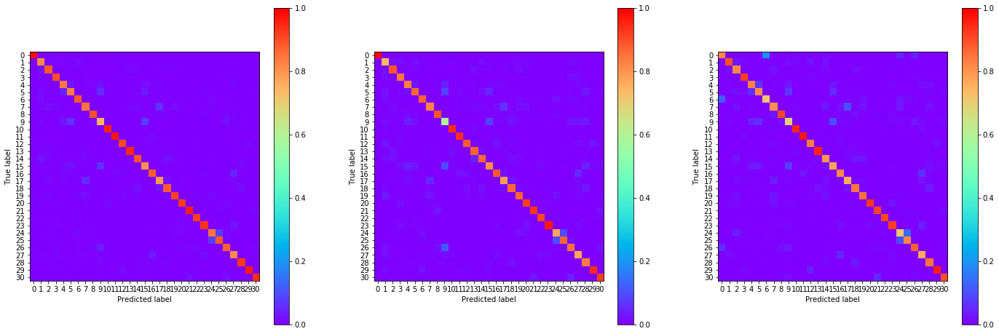

20:31:32.922478
#118 [Train: 0.376] [Test: 0.475] [Valid: 0.564]
#118 [Train: 0.889] [Test: 0.863] [Valid: 0.844]


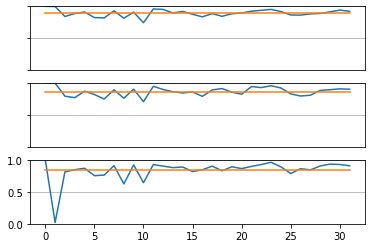

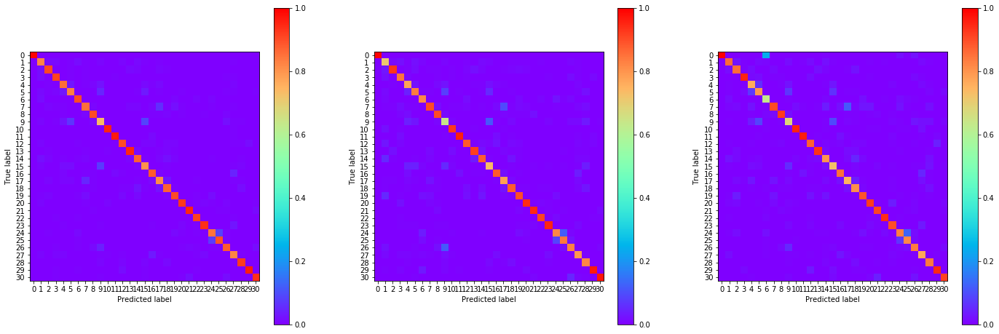

20:32:20.128580
#119 [Train: 0.373] [Test: 0.465] [Valid: 0.580]
#119 [Train: 0.891] [Test: 0.864] [Valid: 0.850]


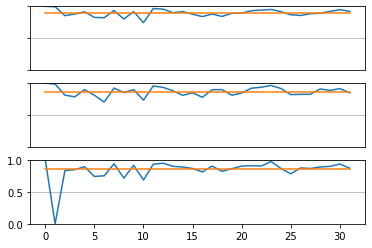

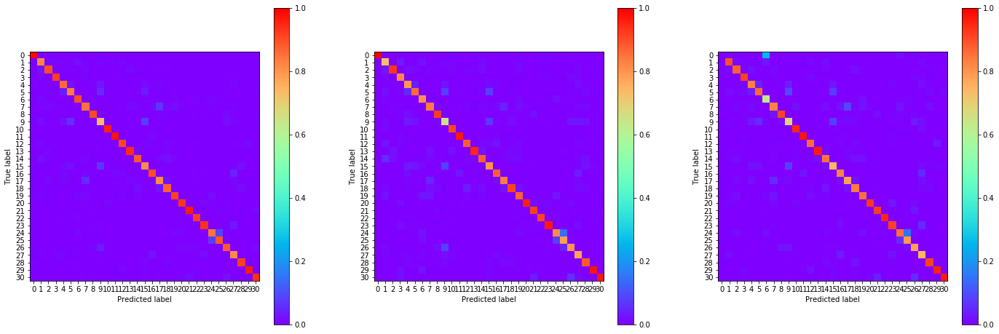

20:33:07.510460
#120 [Train: 0.366] [Test: 0.476] [Valid: 0.534]
#120 [Train: 0.891] [Test: 0.857] [Valid: 0.853]


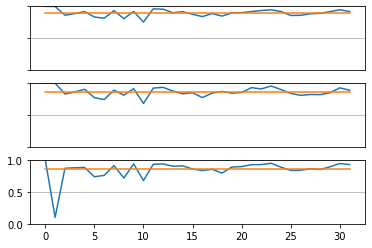

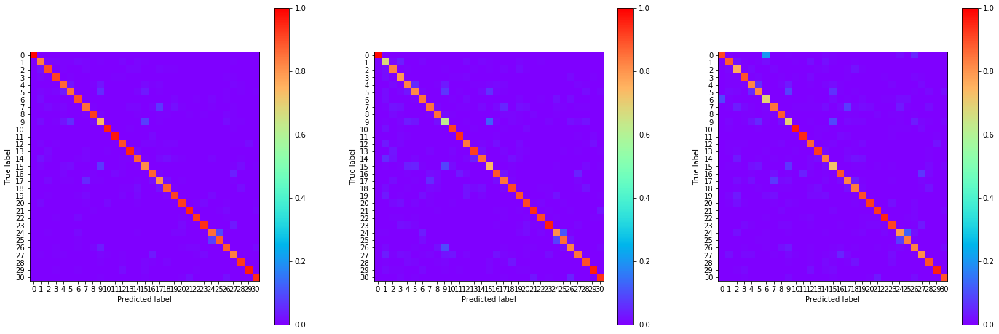

20:33:55.010433
#121 [Train: 0.362] [Test: 0.462] [Valid: 0.519]
#121 [Train: 0.894] [Test: 0.864] [Valid: 0.852]


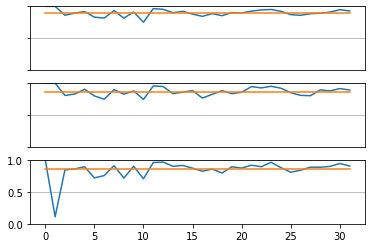

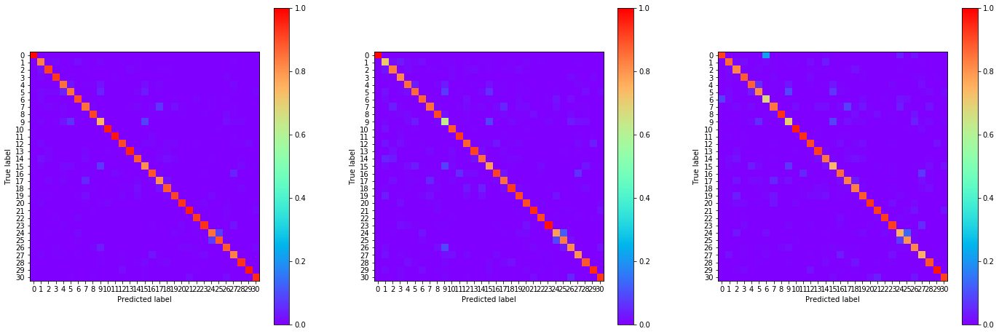

20:34:42.629169
#122 [Train: 0.362] [Test: 0.474] [Valid: 0.564]
#122 [Train: 0.893] [Test: 0.862] [Valid: 0.852]


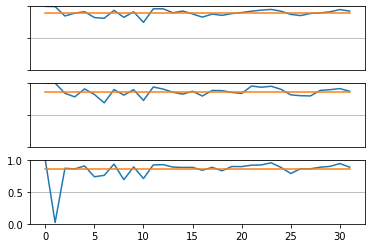

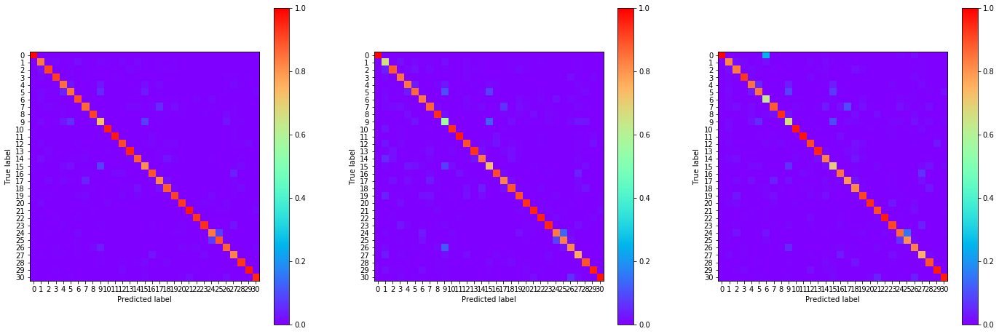

20:35:30.041092
#123 [Train: 0.363] [Test: 0.458] [Valid: 0.548]
#123 [Train: 0.893] [Test: 0.867] [Valid: 0.851]


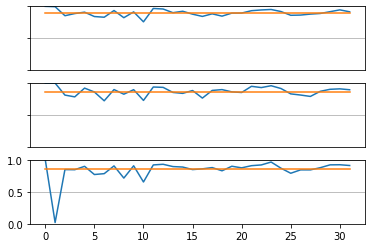

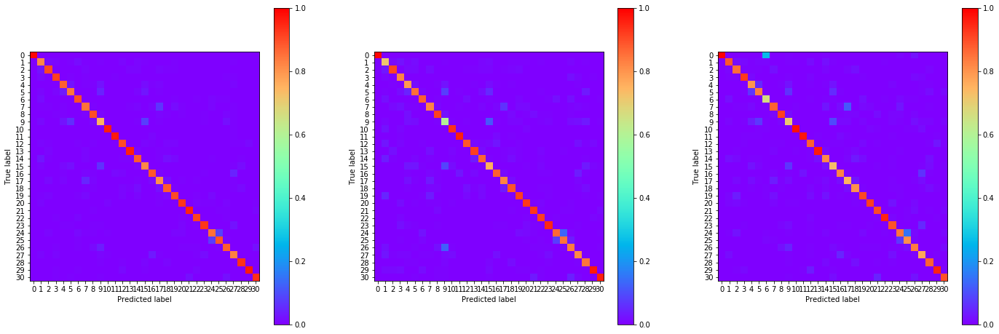

20:36:17.618392
#124 [Train: 0.355] [Test: 0.455] [Valid: 0.527]
#124 [Train: 0.895] [Test: 0.868] [Valid: 0.853]


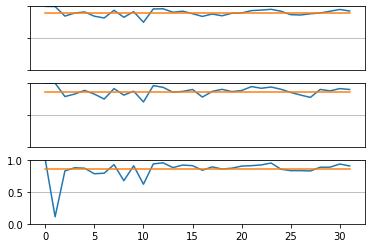

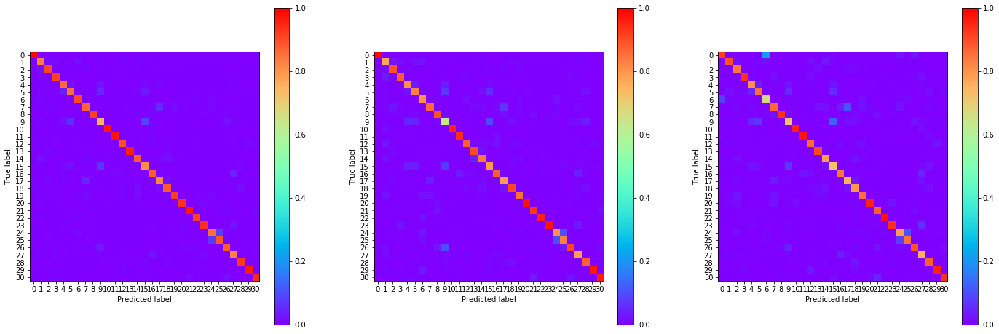

20:37:05.128797
#125 [Train: 0.354] [Test: 0.442] [Valid: 0.540]
#125 [Train: 0.896] [Test: 0.866] [Valid: 0.854]


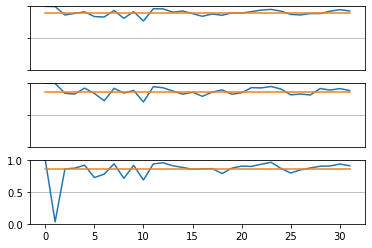

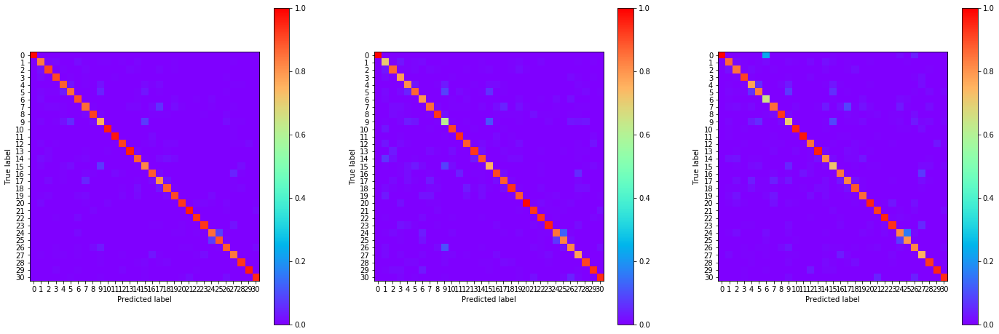

20:37:52.661202
#126 [Train: 0.349] [Test: 0.446] [Valid: 0.501]
#126 [Train: 0.898] [Test: 0.869] [Valid: 0.855]


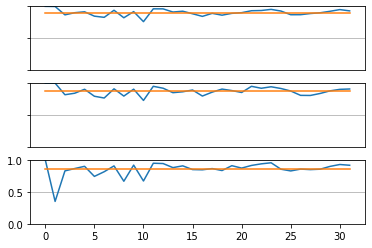

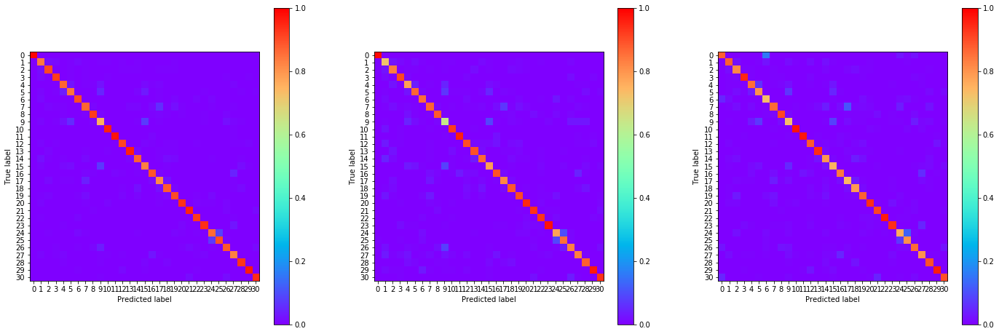

20:38:40.277955
#127 [Train: 0.342] [Test: 0.445] [Valid: 0.545]
#127 [Train: 0.900] [Test: 0.871] [Valid: 0.855]


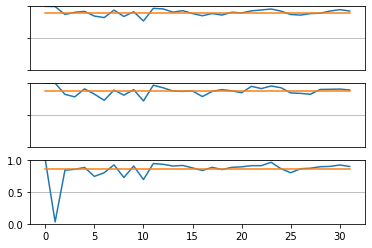

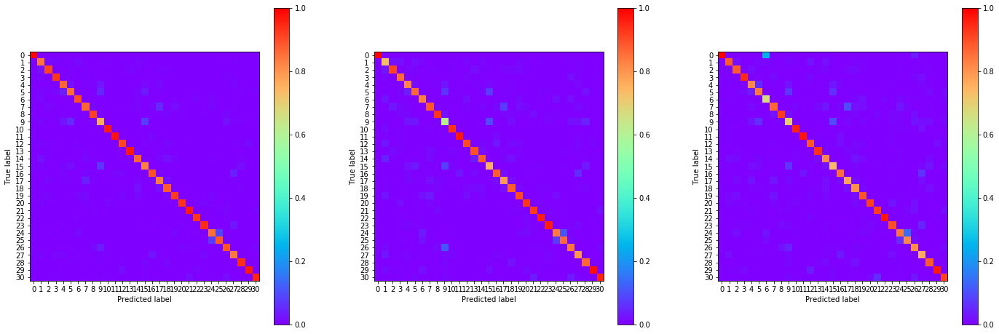

20:39:27.860258
#128 [Train: 0.345] [Test: 0.441] [Valid: 0.518]
#128 [Train: 0.898] [Test: 0.869] [Valid: 0.854]


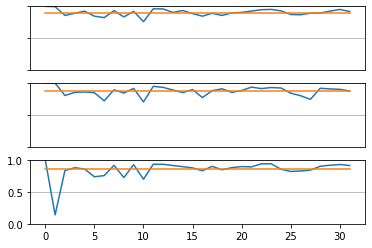

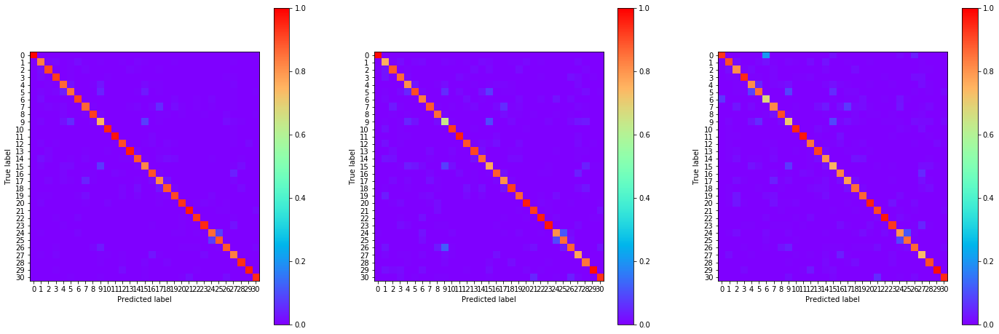

20:40:15.669385
#129 [Train: 0.339] [Test: 0.436] [Valid: 0.514]
#129 [Train: 0.900] [Test: 0.870] [Valid: 0.856]


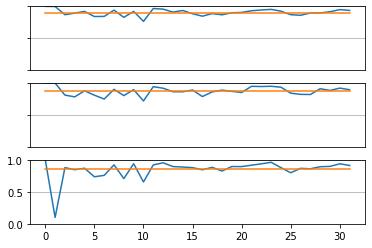

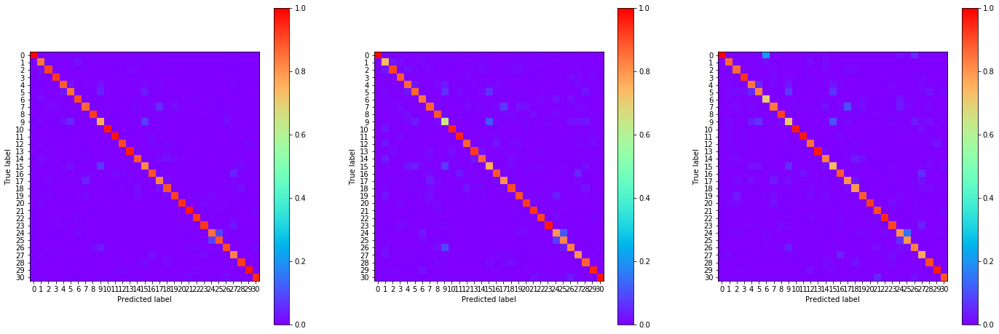

20:41:02.930041
#130 [Train: 0.340] [Test: 0.421] [Valid: 0.509]
#130 [Train: 0.899] [Test: 0.874] [Valid: 0.859]


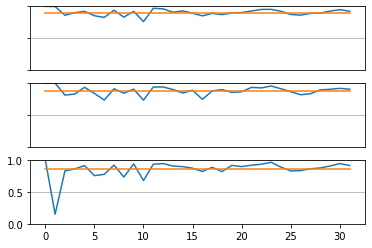

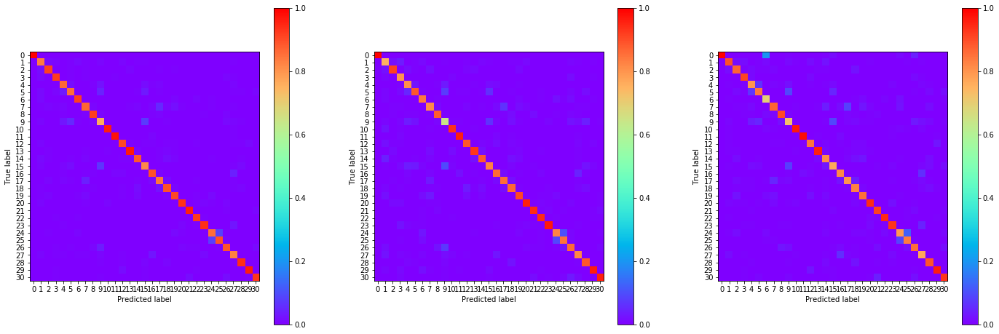

20:41:50.760625
#131 [Train: 0.338] [Test: 0.426] [Valid: 0.506]
#131 [Train: 0.900] [Test: 0.873] [Valid: 0.858]


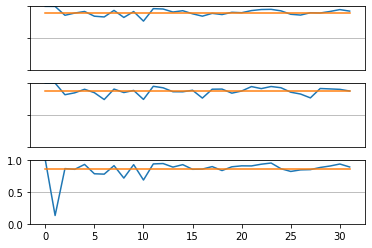

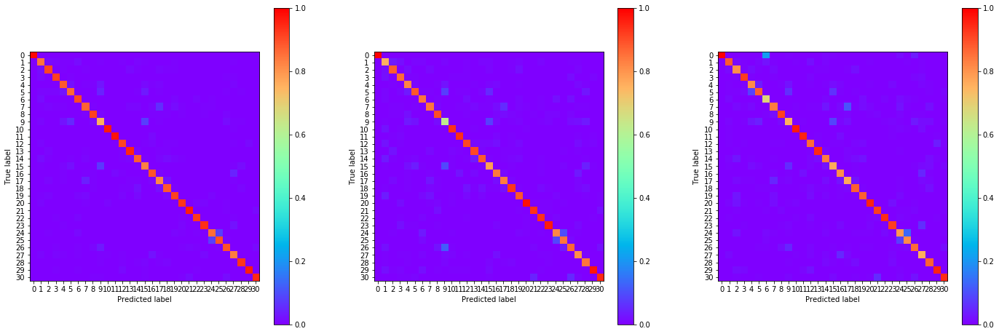

20:42:38.273275
#132 [Train: 0.334] [Test: 0.464] [Valid: 0.553]
#132 [Train: 0.901] [Test: 0.867] [Valid: 0.852]


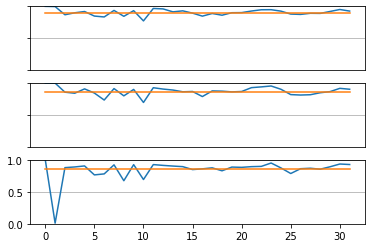

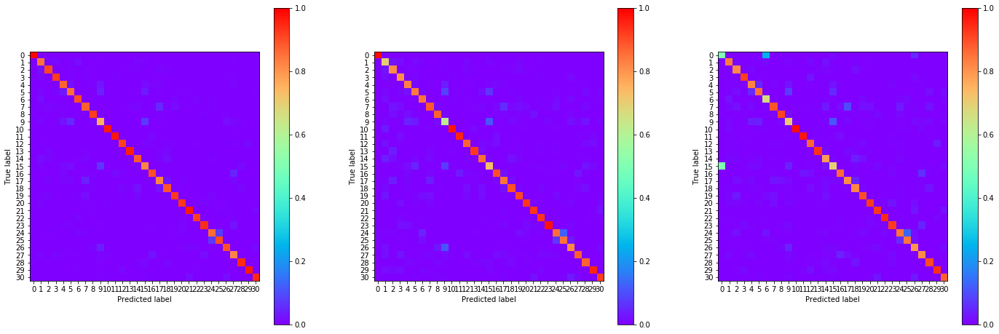

20:44:13.405897
#134 [Train: 0.330] [Test: 0.442] [Valid: 0.525]
#134 [Train: 0.903] [Test: 0.872] [Valid: 0.859]


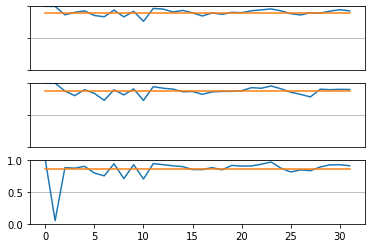

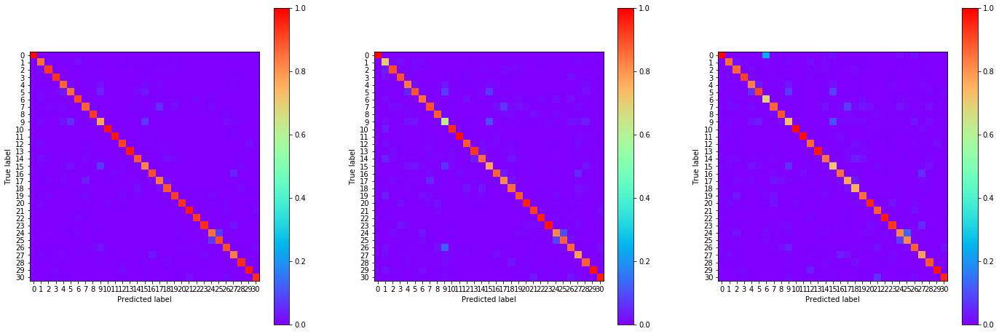

20:45:00.611655
#135 [Train: 0.323] [Test: 0.452] [Valid: 0.530]
#135 [Train: 0.905] [Test: 0.870] [Valid: 0.855]


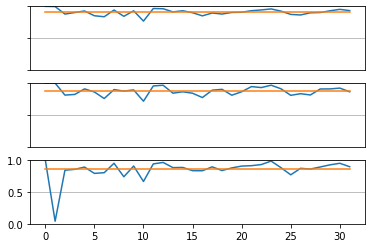

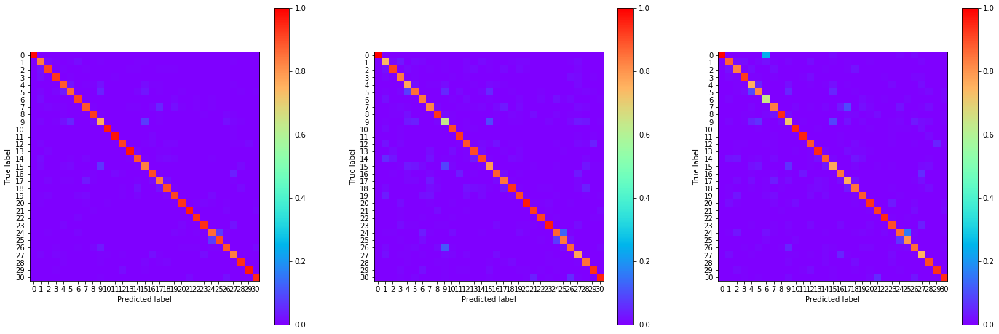

20:45:48.297662
#136 [Train: 0.329] [Test: 0.433] [Valid: 0.514]
#136 [Train: 0.904] [Test: 0.873] [Valid: 0.858]


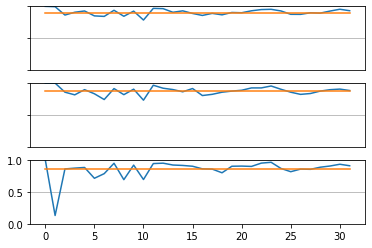

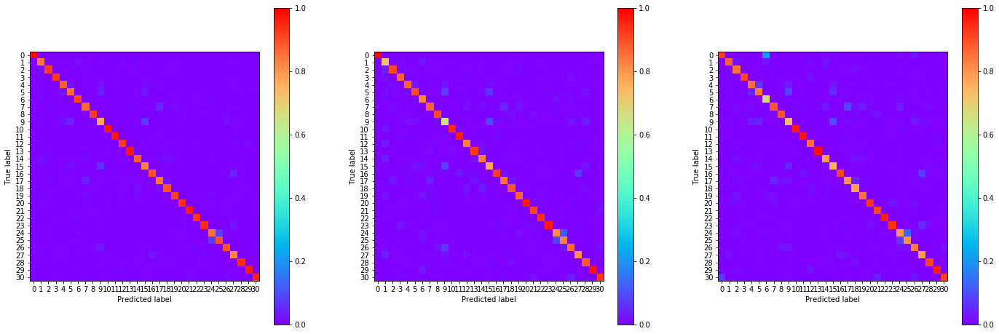

20:46:35.517625
#137 [Train: 0.323] [Test: 0.399] [Valid: 0.488]
#137 [Train: 0.905] [Test: 0.879] [Valid: 0.865]


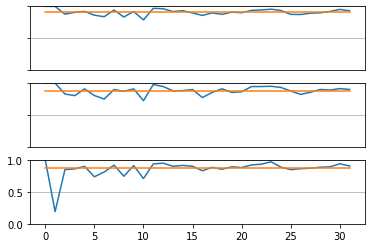

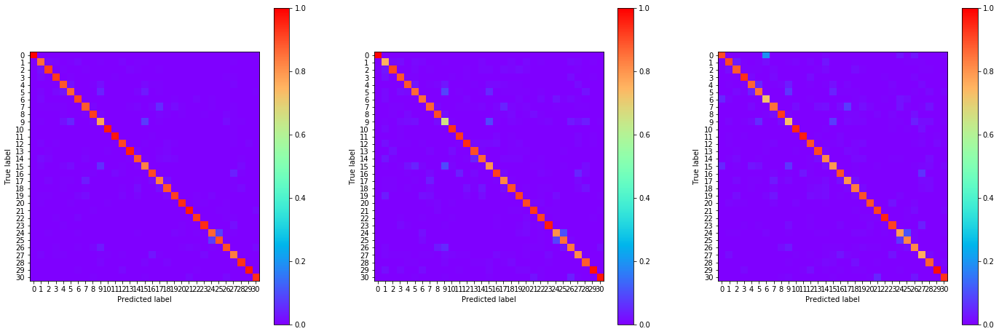

20:47:22.809531
#138 [Train: 0.318] [Test: 0.430] [Valid: 0.496]
#138 [Train: 0.906] [Test: 0.875] [Valid: 0.861]


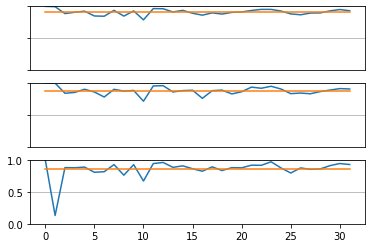

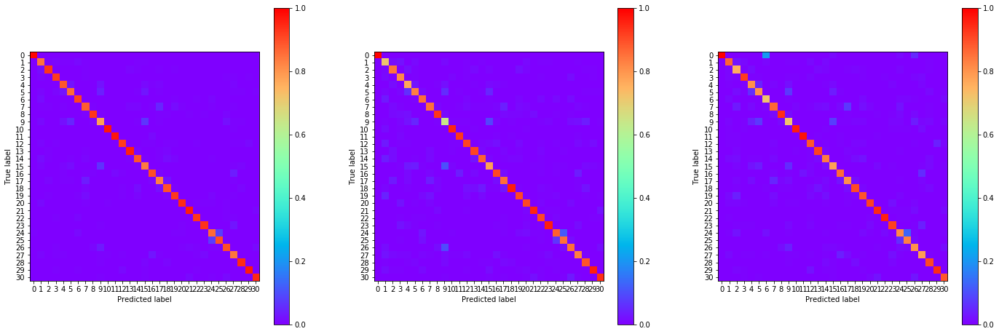

20:48:09.960951
#139 [Train: 0.318] [Test: 0.424] [Valid: 0.530]
#139 [Train: 0.905] [Test: 0.875] [Valid: 0.860]


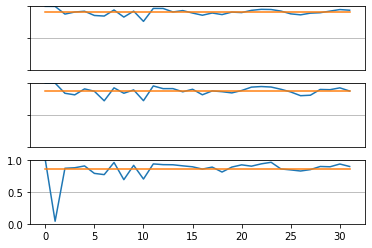

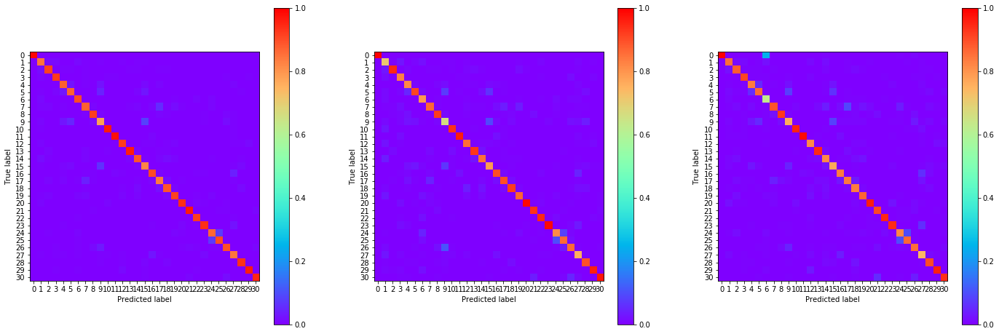

20:48:57.176292
#140 [Train: 0.314] [Test: 0.435] [Valid: 0.502]
#140 [Train: 0.907] [Test: 0.875] [Valid: 0.860]


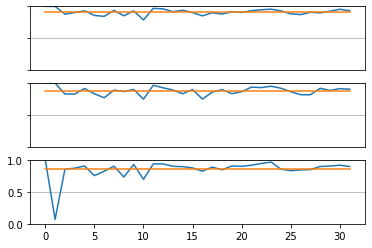

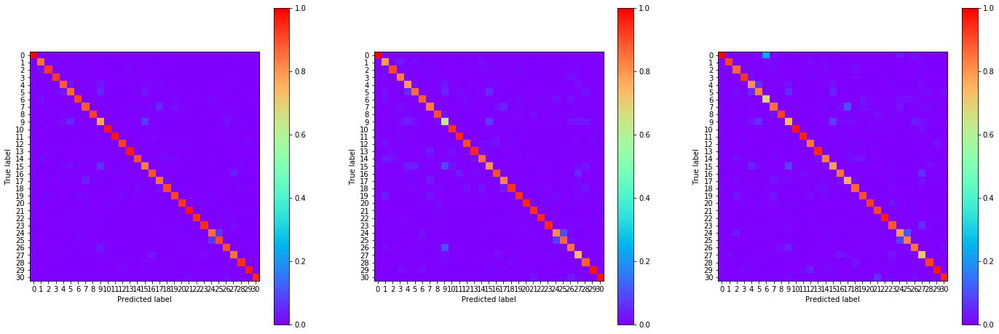

20:49:44.644127
#141 [Train: 0.312] [Test: 0.413] [Valid: 0.520]
#141 [Train: 0.908] [Test: 0.875] [Valid: 0.860]


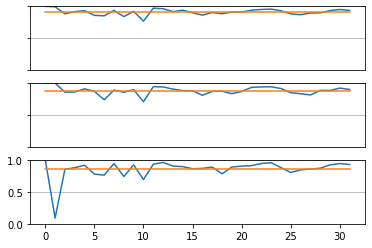

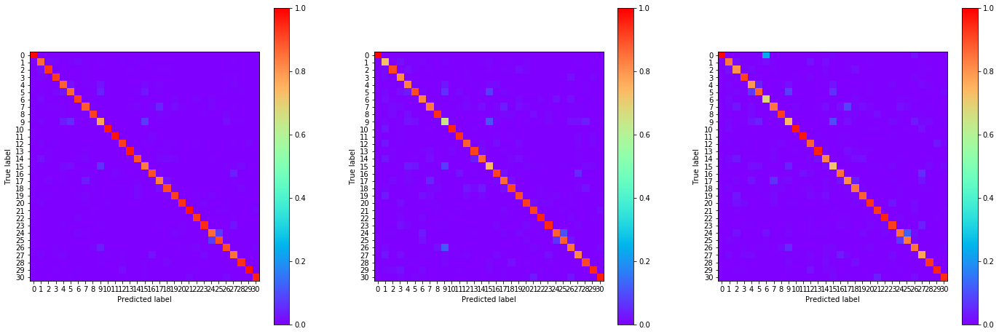

20:50:31.941125
#142 [Train: 0.308] [Test: 0.431] [Valid: 0.497]
#142 [Train: 0.909] [Test: 0.882] [Valid: 0.862]


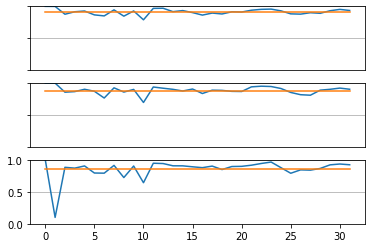

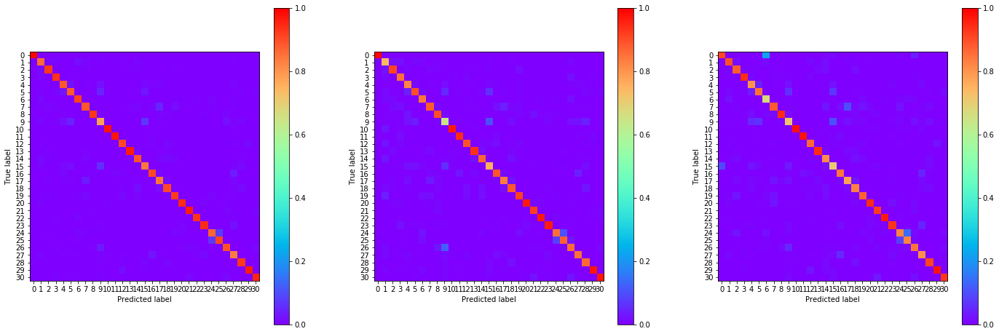

20:51:19.602782
#143 [Train: 0.308] [Test: 0.400] [Valid: 0.492]
#143 [Train: 0.910] [Test: 0.882] [Valid: 0.866]


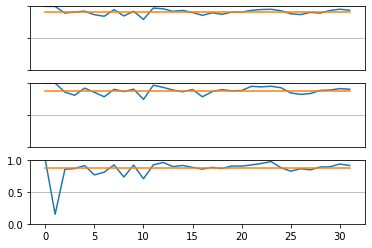

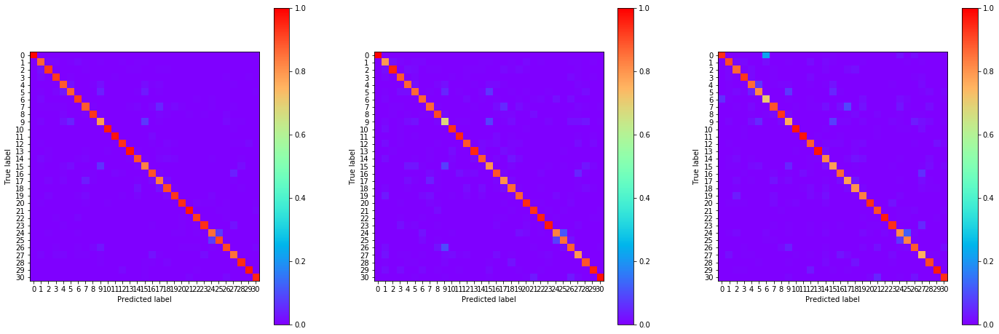

20:52:06.865355
#144 [Train: 0.304] [Test: 0.421] [Valid: 0.480]
#144 [Train: 0.910] [Test: 0.881] [Valid: 0.865]


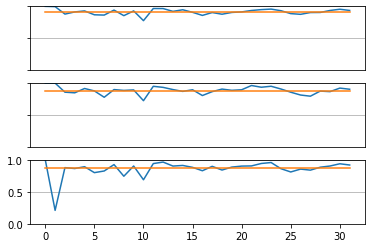

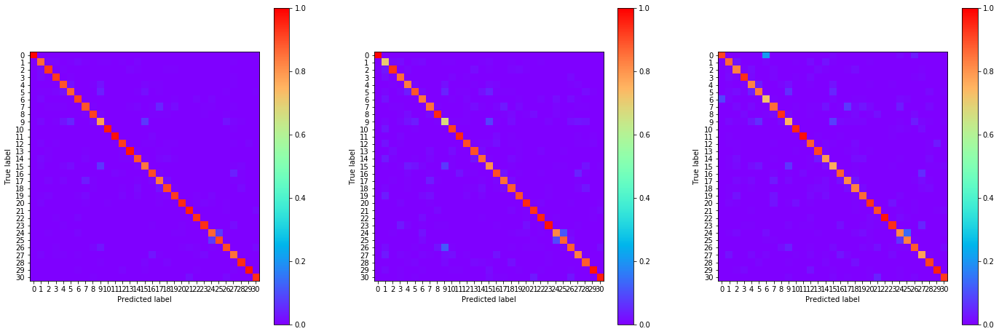

20:52:54.488968
#145 [Train: 0.303] [Test: 0.429] [Valid: 0.494]
#145 [Train: 0.911] [Test: 0.882] [Valid: 0.862]


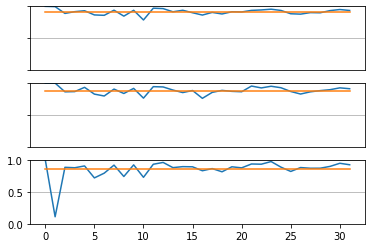

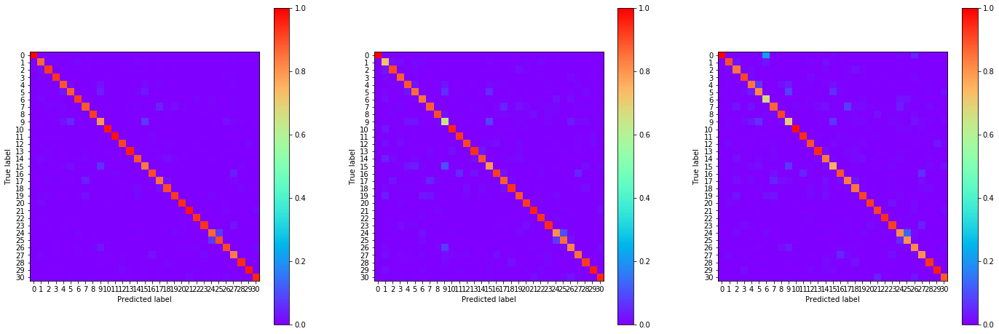

20:53:41.822809
#146 [Train: 0.302] [Test: 0.406] [Valid: 0.488]
#146 [Train: 0.911] [Test: 0.882] [Valid: 0.866]


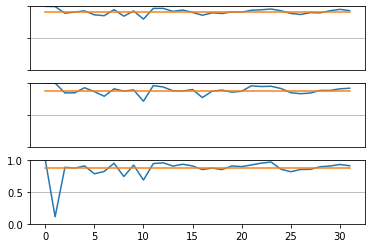

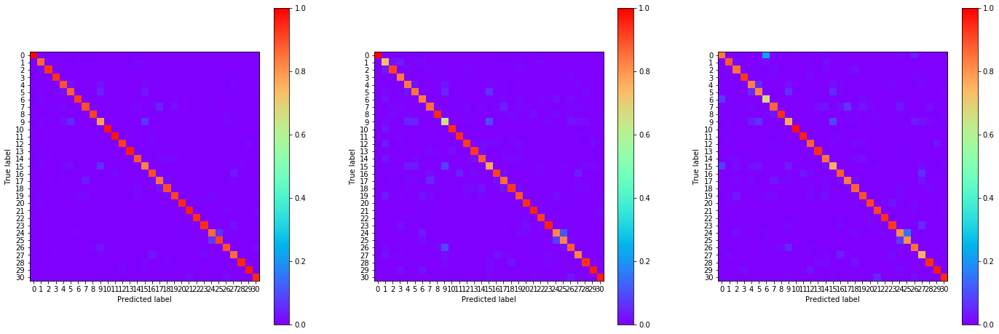

20:54:29.299254
#147 [Train: 0.296] [Test: 0.407] [Valid: 0.472]
#147 [Train: 0.913] [Test: 0.878] [Valid: 0.864]


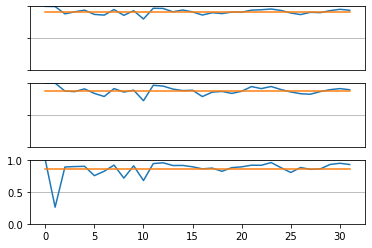

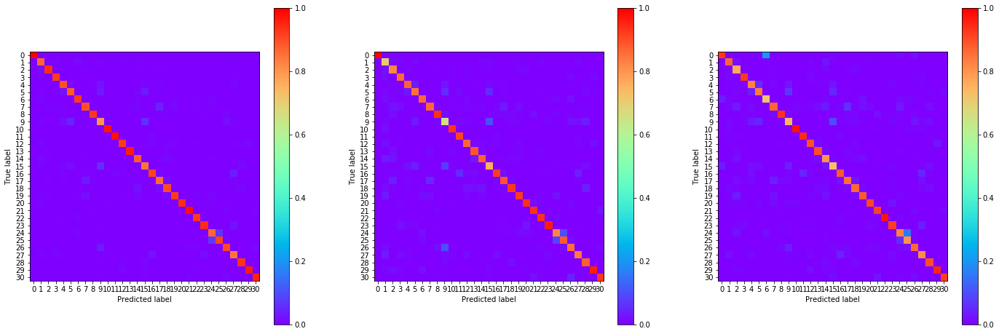

20:55:16.918700
#148 [Train: 0.297] [Test: 0.422] [Valid: 0.492]
#148 [Train: 0.912] [Test: 0.883] [Valid: 0.864]


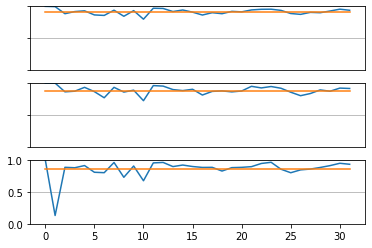

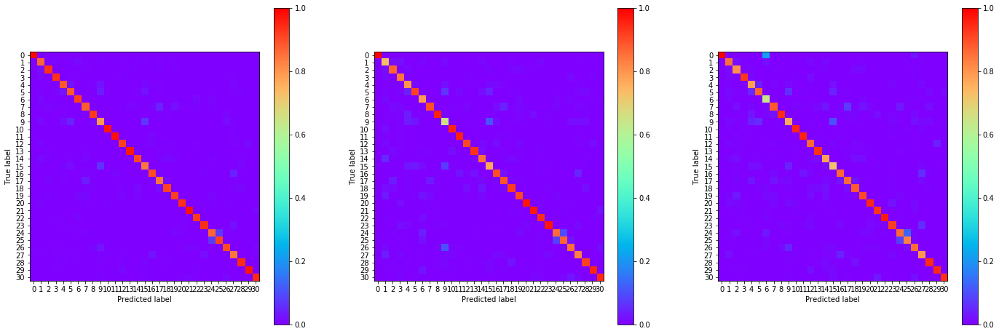

20:56:04.207732
#149 [Train: 0.293] [Test: 0.397] [Valid: 0.501]
#149 [Train: 0.914] [Test: 0.882] [Valid: 0.868]


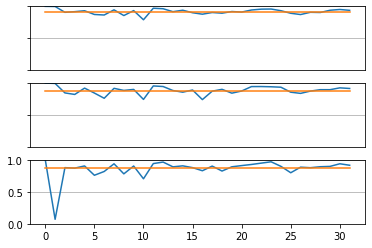

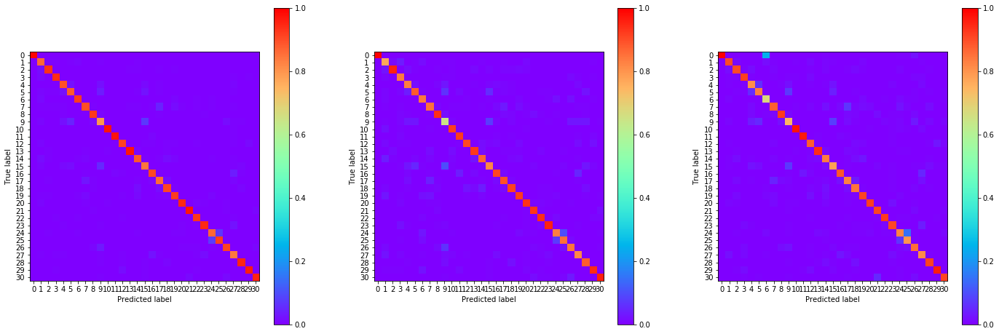

20:56:51.722988
#150 [Train: 0.290] [Test: 0.404] [Valid: 0.479]
#150 [Train: 0.915] [Test: 0.883] [Valid: 0.864]


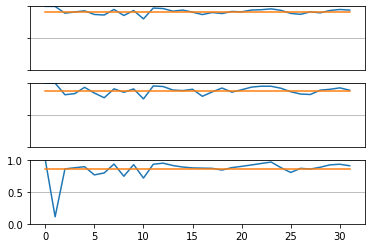

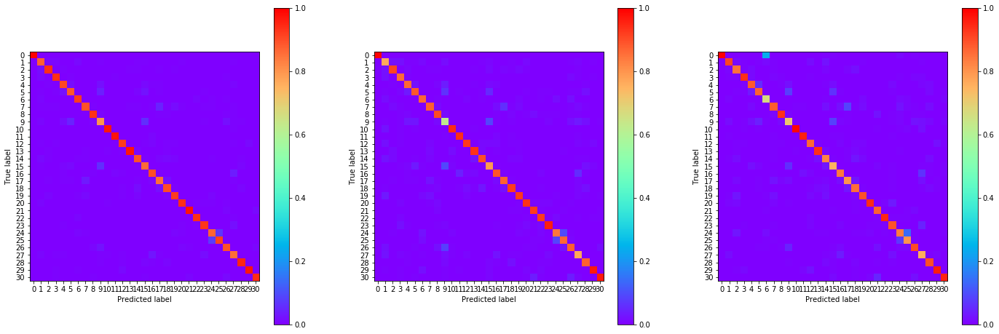

20:57:39.073653
#151 [Train: 0.288] [Test: 0.415] [Valid: 0.476]
#151 [Train: 0.915] [Test: 0.881] [Valid: 0.865]


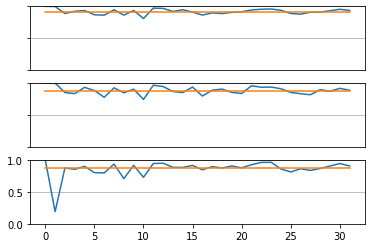

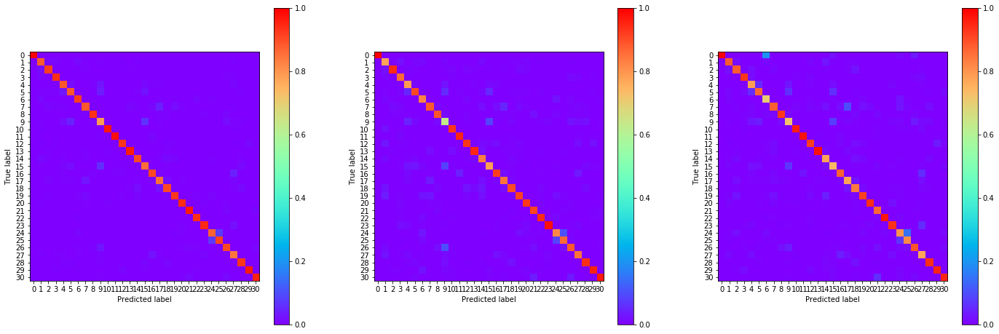

20:58:26.741491
#152 [Train: 0.287] [Test: 0.418] [Valid: 0.479]
#152 [Train: 0.916] [Test: 0.880] [Valid: 0.866]


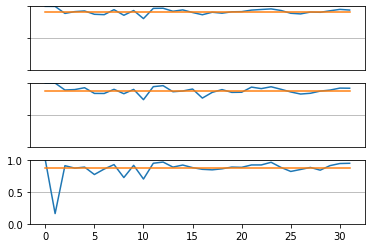

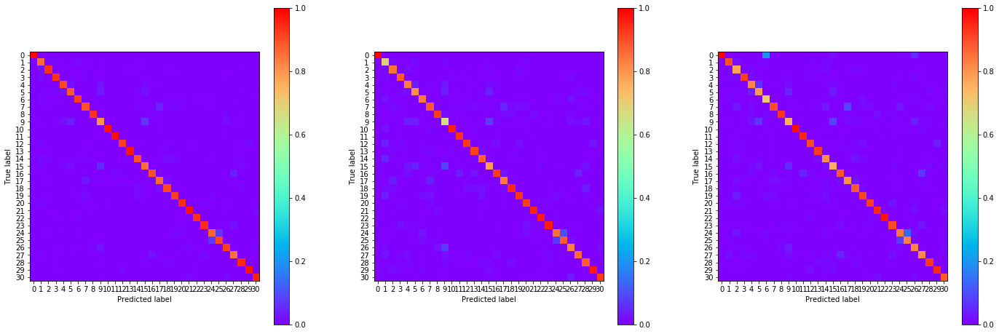

20:59:14.109508
#153 [Train: 0.287] [Test: 0.390] [Valid: 0.477]
#153 [Train: 0.915] [Test: 0.882] [Valid: 0.869]


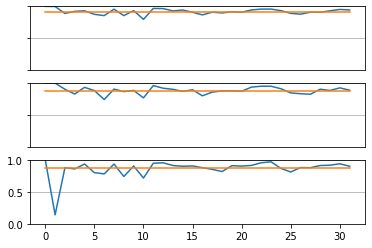

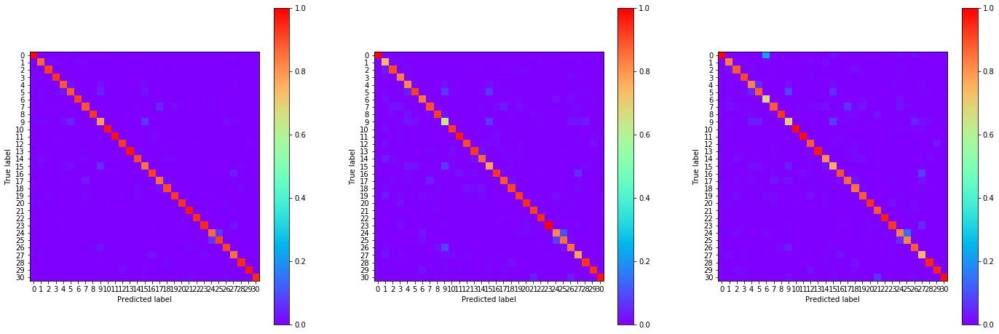

21:00:01.337401
#154 [Train: 0.285] [Test: 0.387] [Valid: 0.489]
#154 [Train: 0.917] [Test: 0.881] [Valid: 0.869]


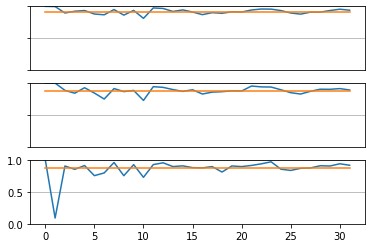

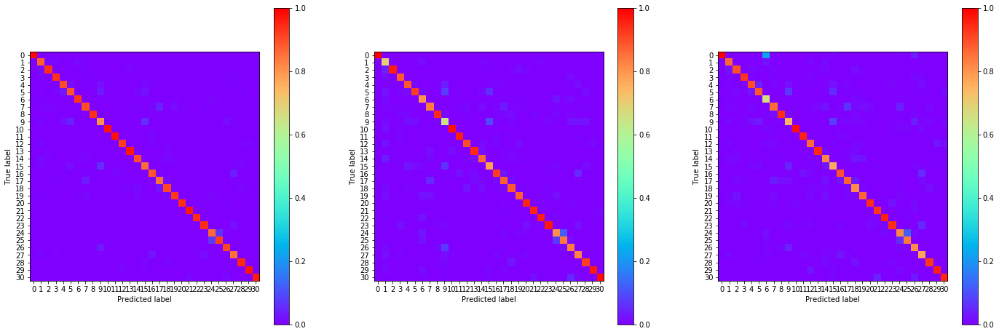

21:00:49.112061
#155 [Train: 0.282] [Test: 0.397] [Valid: 0.471]
#155 [Train: 0.917] [Test: 0.883] [Valid: 0.866]


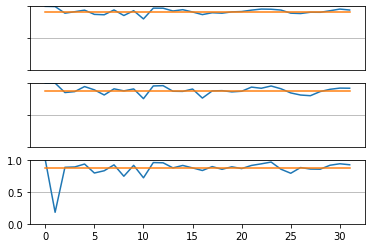

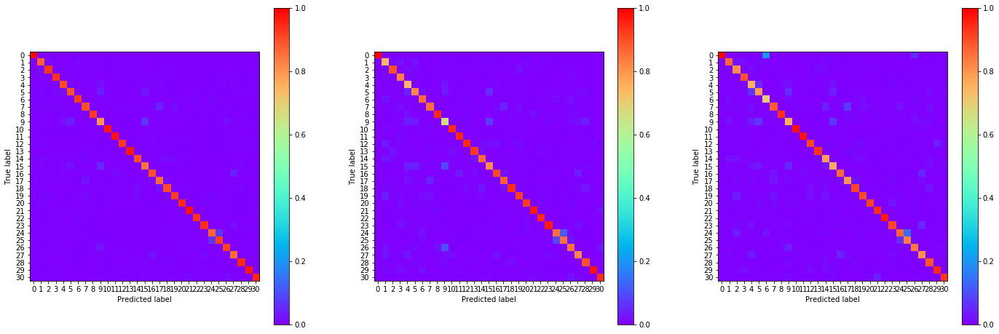

21:01:36.613567
#156 [Train: 0.281] [Test: 0.411] [Valid: 0.507]
#156 [Train: 0.917] [Test: 0.883] [Valid: 0.866]


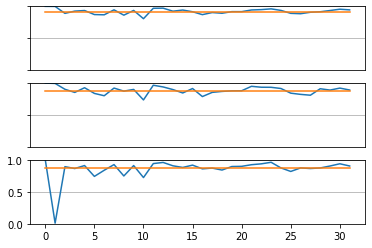

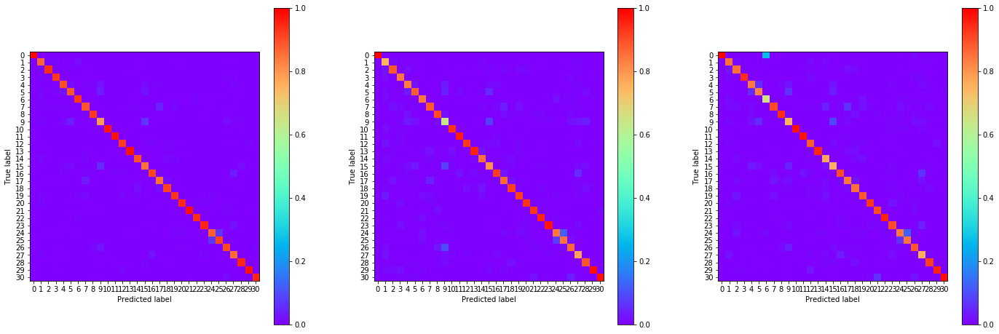

21:02:24.453404
#157 [Train: 0.274] [Test: 0.374] [Valid: 0.465]
#157 [Train: 0.920] [Test: 0.882] [Valid: 0.876]


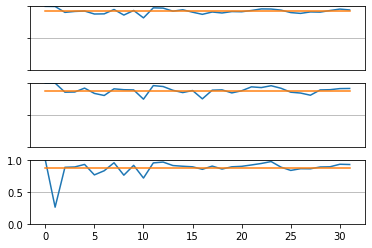

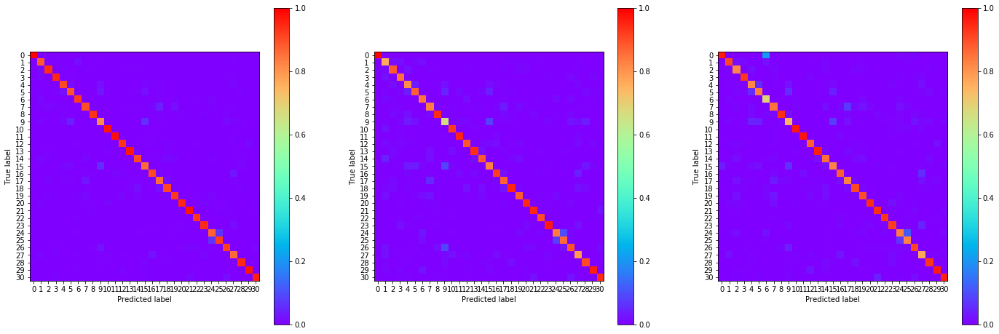

21:03:11.640659
#158 [Train: 0.278] [Test: 0.395] [Valid: 0.451]
#158 [Train: 0.918] [Test: 0.885] [Valid: 0.874]


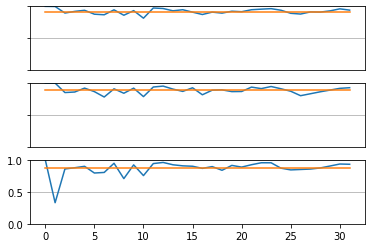

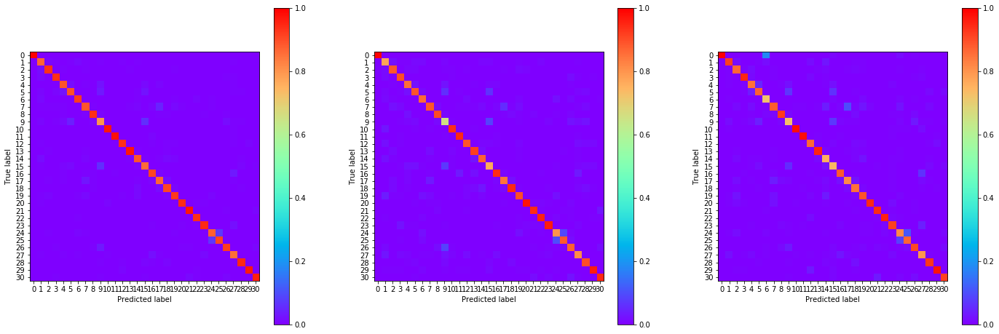

21:03:59.647702
#159 [Train: 0.275] [Test: 0.394] [Valid: 0.477]
#159 [Train: 0.918] [Test: 0.888] [Valid: 0.873]


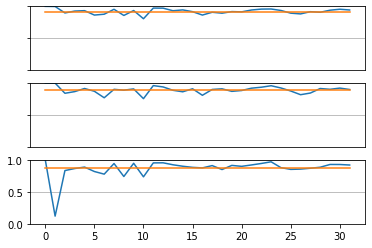

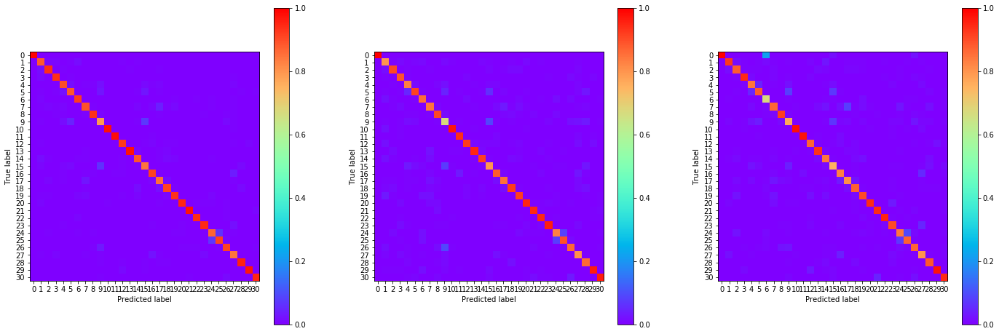

21:04:47.461926
#160 [Train: 0.271] [Test: 0.390] [Valid: 0.469]
#160 [Train: 0.921] [Test: 0.888] [Valid: 0.872]


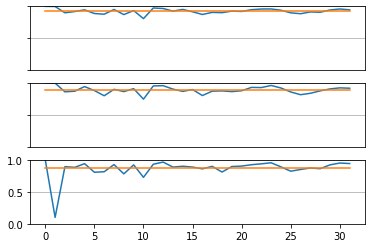

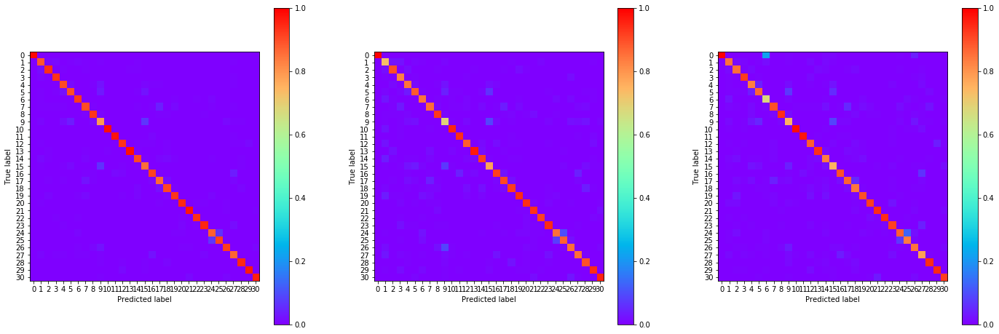

21:05:34.846632
#161 [Train: 0.272] [Test: 0.393] [Valid: 0.504]
#161 [Train: 0.920] [Test: 0.885] [Valid: 0.867]


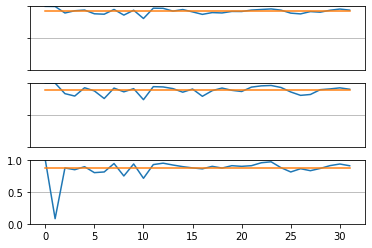

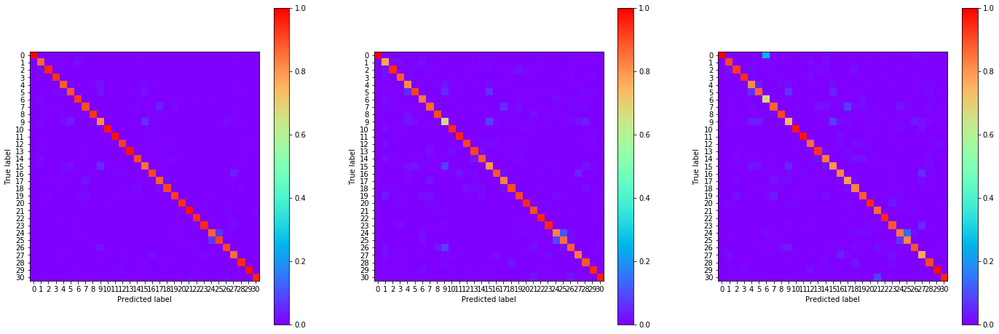

21:06:22.596803
#162 [Train: 0.267] [Test: 0.397] [Valid: 0.498]
#162 [Train: 0.921] [Test: 0.884] [Valid: 0.869]


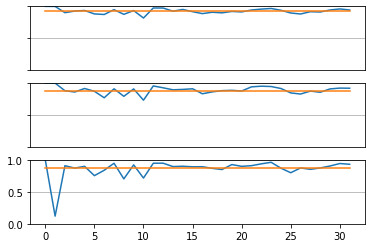

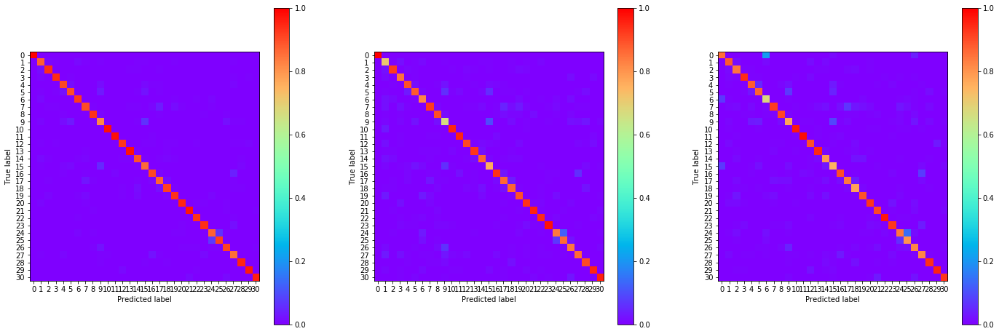

21:07:10.206442
#163 [Train: 0.271] [Test: 0.382] [Valid: 0.428]
#163 [Train: 0.919] [Test: 0.891] [Valid: 0.874]


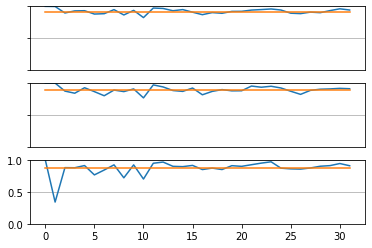

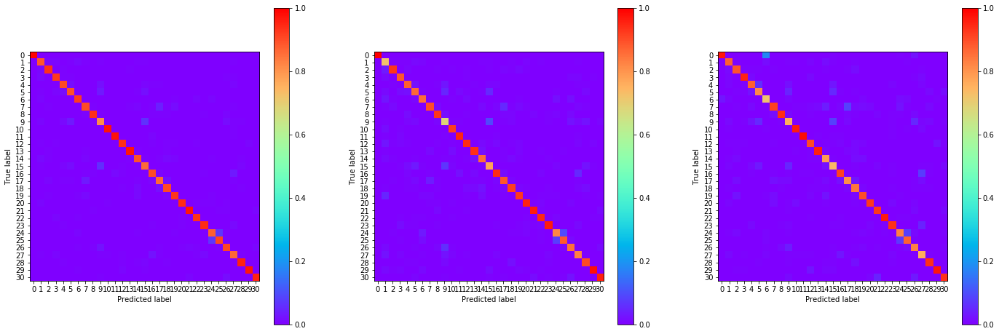

21:07:58.070069
#164 [Train: 0.264] [Test: 0.387] [Valid: 0.485]
#164 [Train: 0.923] [Test: 0.889] [Valid: 0.871]


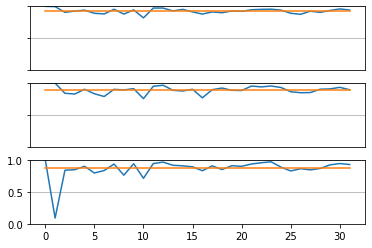

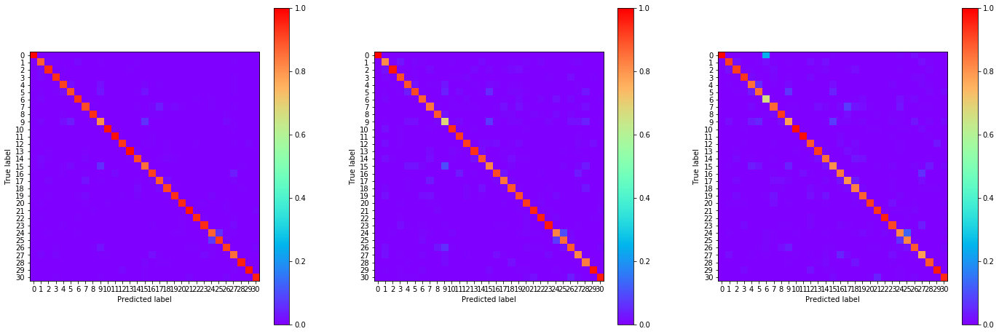

21:08:45.838008
#165 [Train: 0.262] [Test: 0.373] [Valid: 0.455]
#165 [Train: 0.923] [Test: 0.892] [Valid: 0.876]


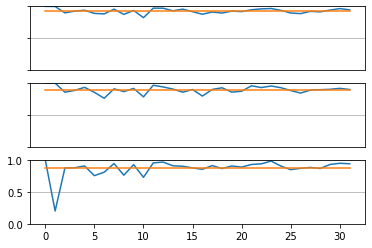

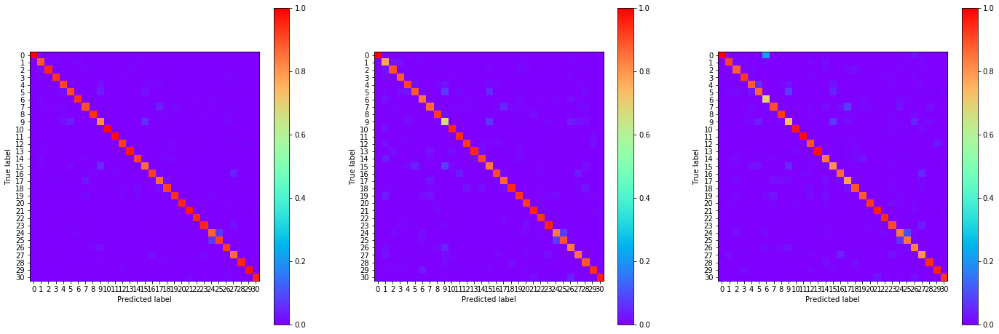

21:09:33.464914
#166 [Train: 0.263] [Test: 0.386] [Valid: 0.489]
#166 [Train: 0.923] [Test: 0.889] [Valid: 0.868]


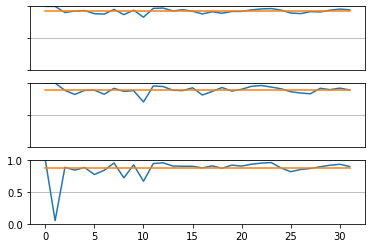

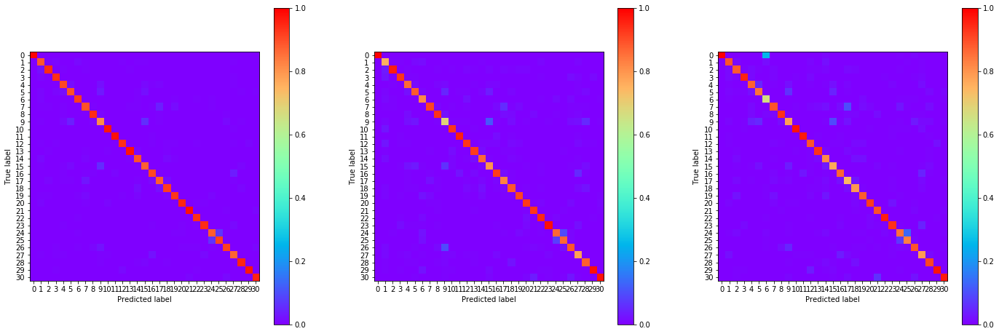

21:10:20.856771
#167 [Train: 0.257] [Test: 0.383] [Valid: 0.487]
#167 [Train: 0.925] [Test: 0.890] [Valid: 0.870]


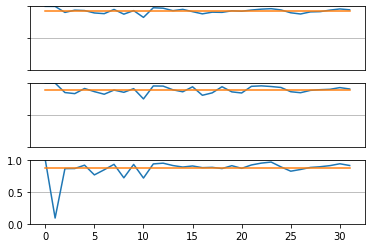

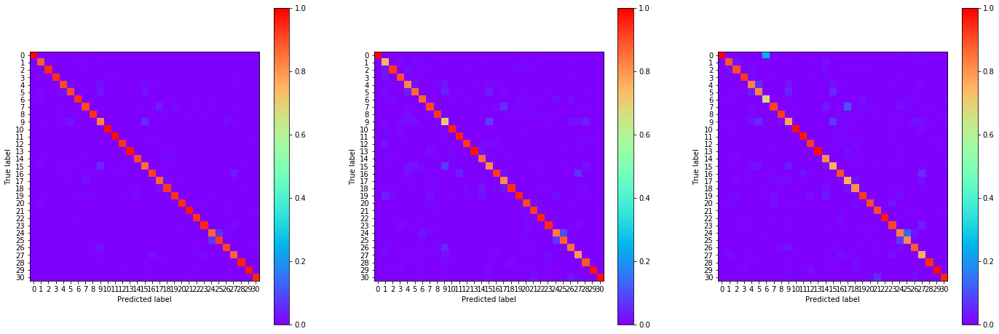

21:11:08.186884
#168 [Train: 0.258] [Test: 0.379] [Valid: 0.447]
#168 [Train: 0.924] [Test: 0.890] [Valid: 0.872]


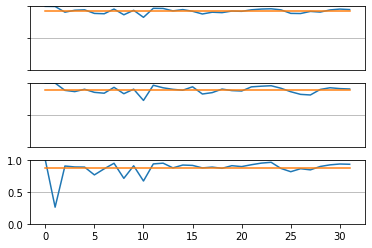

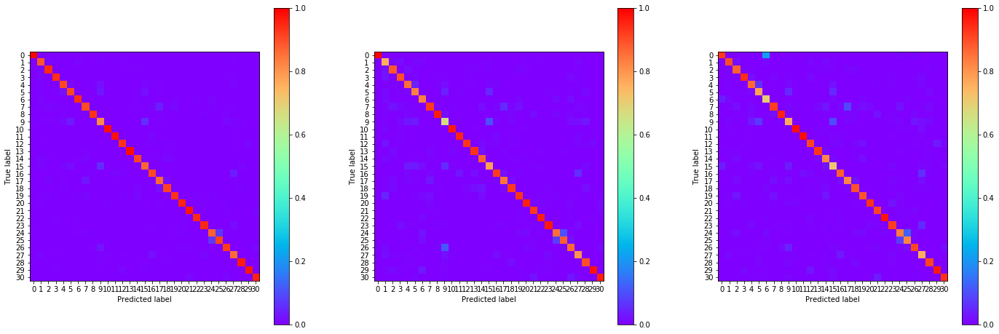

21:11:56.015038
#169 [Train: 0.257] [Test: 0.393] [Valid: 0.458]
#169 [Train: 0.923] [Test: 0.891] [Valid: 0.874]


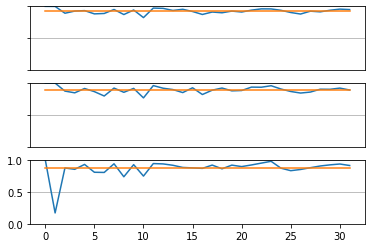

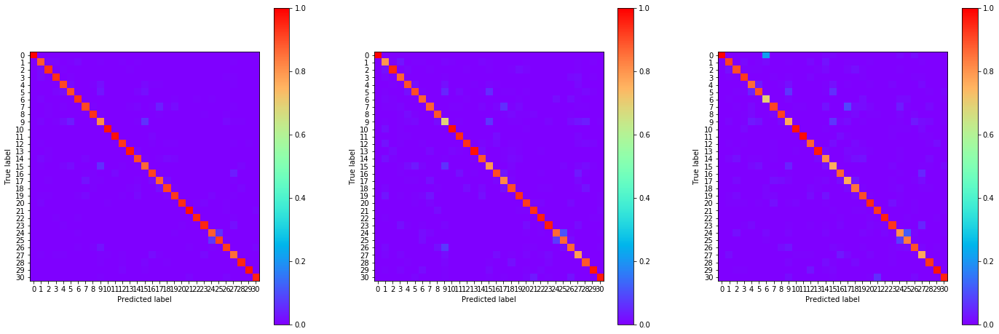

21:12:43.577174
#170 [Train: 0.255] [Test: 0.371] [Valid: 0.451]
#170 [Train: 0.924] [Test: 0.893] [Valid: 0.874]


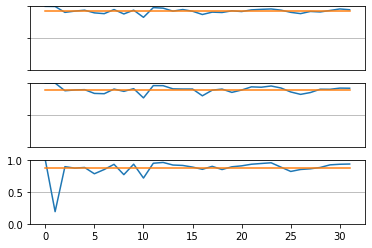

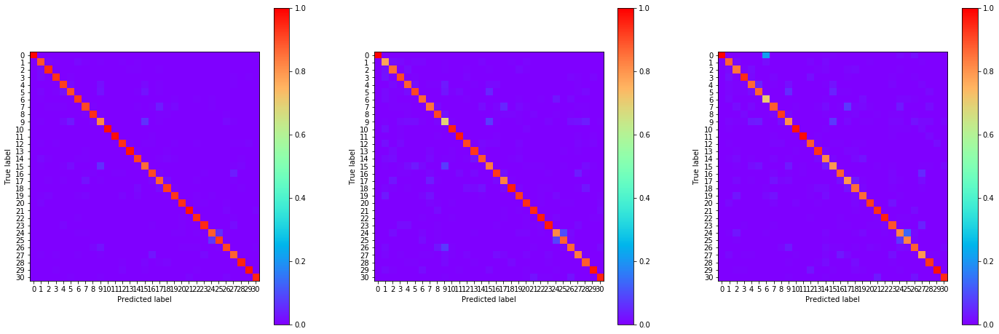

21:13:31.314965
#171 [Train: 0.253] [Test: 0.378] [Valid: 0.429]
#171 [Train: 0.925] [Test: 0.891] [Valid: 0.881]


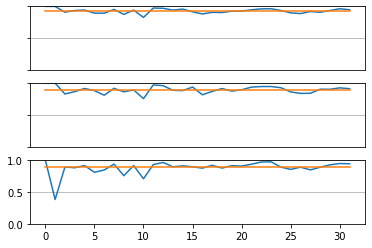

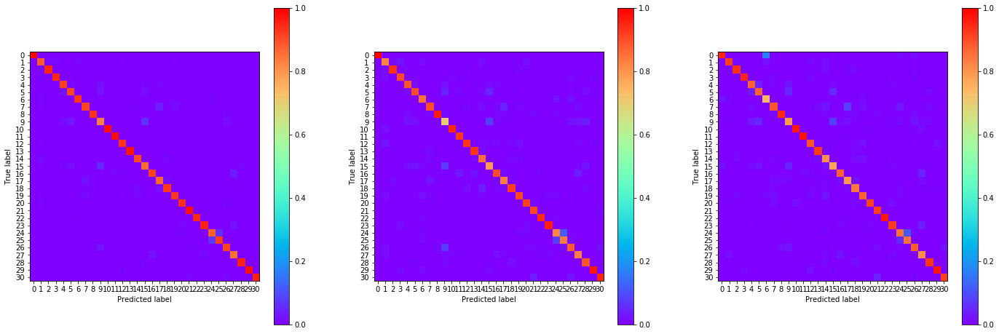

21:14:18.723013
#172 [Train: 0.252] [Test: 0.388] [Valid: 0.458]
#172 [Train: 0.925] [Test: 0.889] [Valid: 0.874]


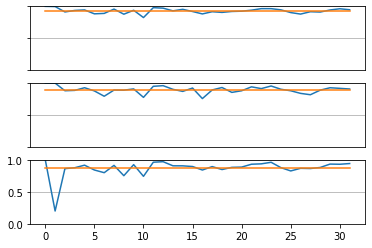

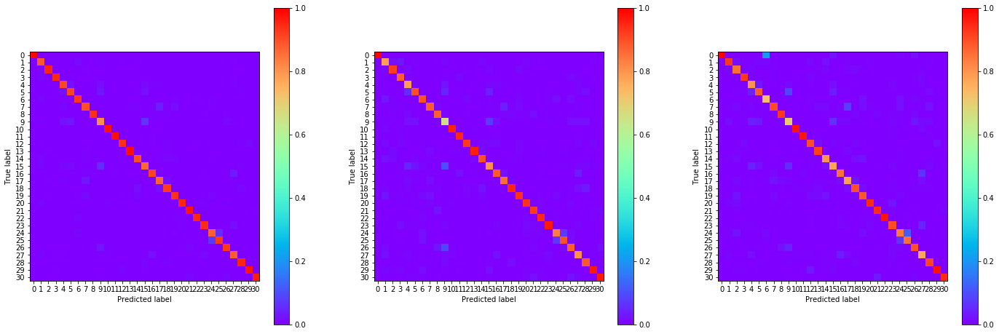

21:15:06.225892
#173 [Train: 0.253] [Test: 0.360] [Valid: 0.449]
#173 [Train: 0.925] [Test: 0.889] [Valid: 0.874]


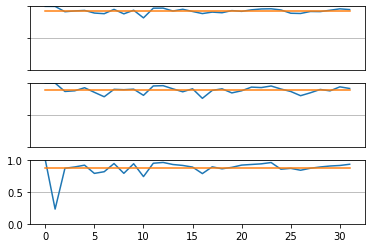

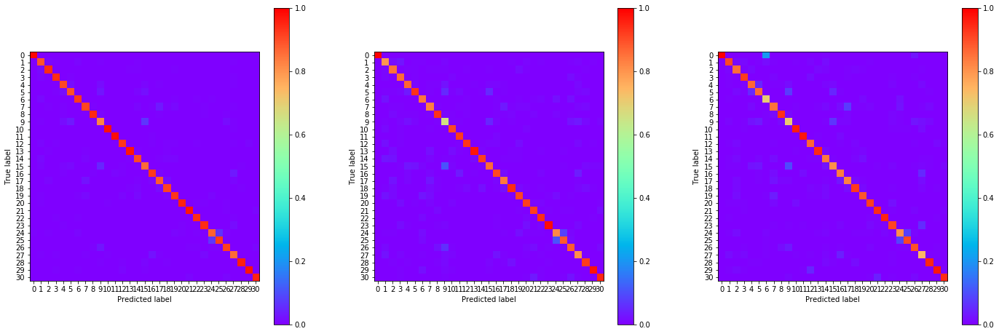

21:15:53.687402
#174 [Train: 0.248] [Test: 0.384] [Valid: 0.463]
#174 [Train: 0.926] [Test: 0.890] [Valid: 0.878]


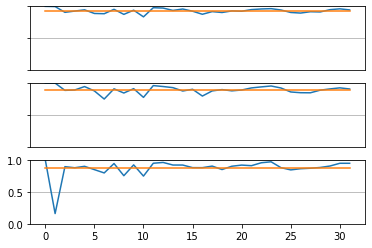

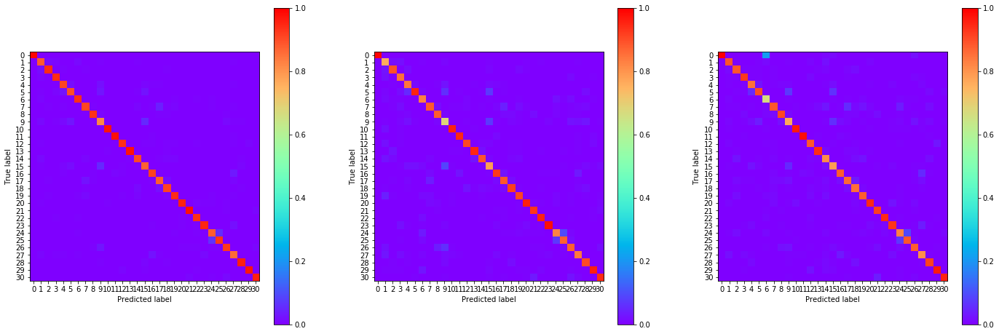

21:16:41.360150
#175 [Train: 0.247] [Test: 0.380] [Valid: 0.444]
#175 [Train: 0.927] [Test: 0.893] [Valid: 0.877]


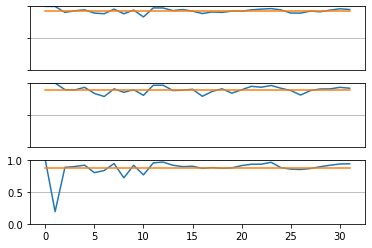

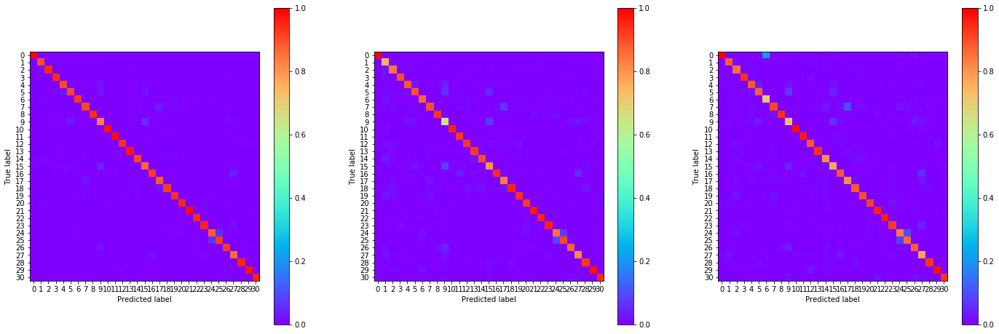

21:17:29.434791
#176 [Train: 0.245] [Test: 0.380] [Valid: 0.464]
#176 [Train: 0.928] [Test: 0.893] [Valid: 0.875]


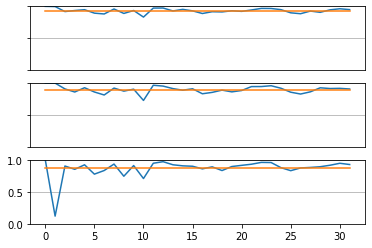

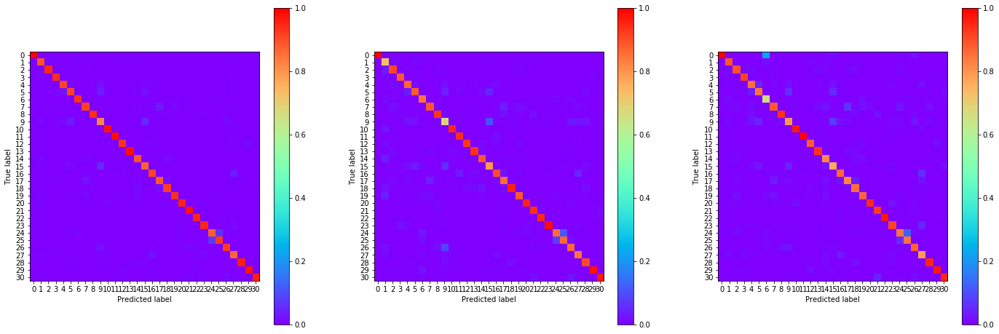

21:18:17.013824
#177 [Train: 0.247] [Test: 0.374] [Valid: 0.454]
#177 [Train: 0.926] [Test: 0.888] [Valid: 0.875]


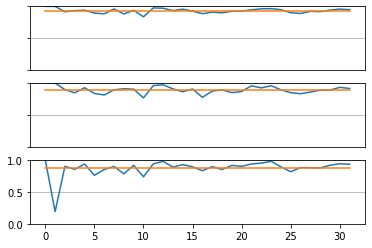

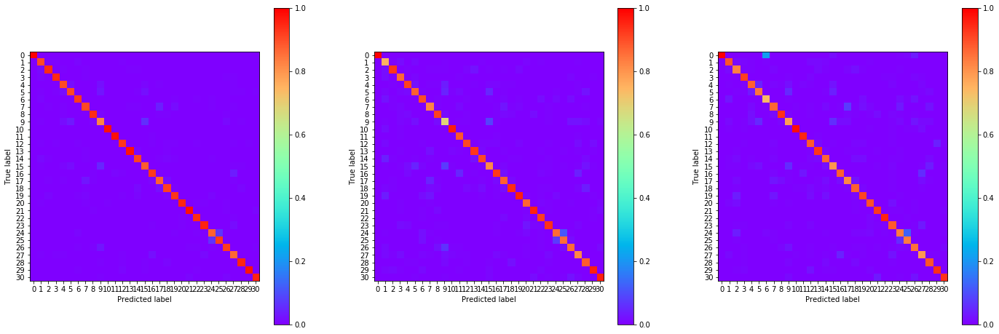

21:19:04.842060
#178 [Train: 0.243] [Test: 0.377] [Valid: 0.417]
#178 [Train: 0.929] [Test: 0.896] [Valid: 0.881]


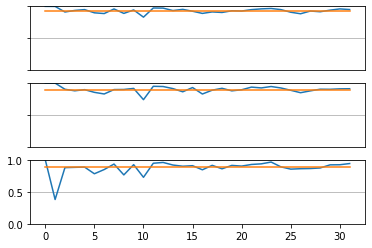

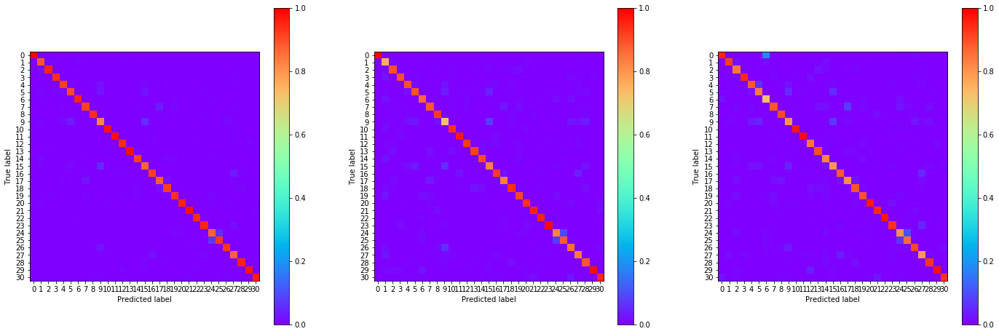

21:19:52.356656
#179 [Train: 0.243] [Test: 0.368] [Valid: 0.411]
#179 [Train: 0.928] [Test: 0.896] [Valid: 0.880]


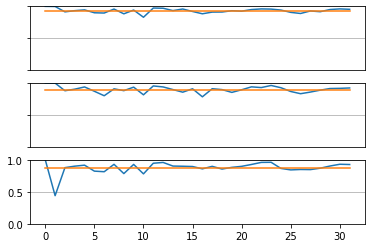

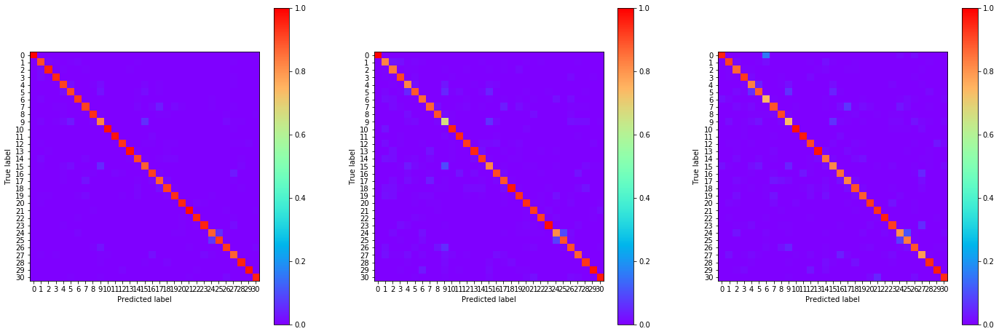

21:20:40.123096
#180 [Train: 0.236] [Test: 0.355] [Valid: 0.470]
#180 [Train: 0.930] [Test: 0.894] [Valid: 0.877]


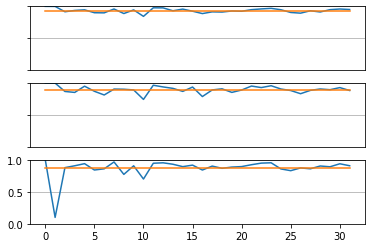

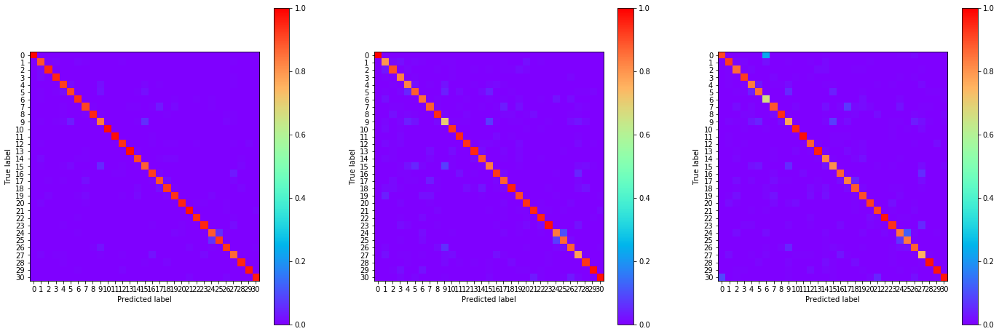

21:21:28.027859
#181 [Train: 0.235] [Test: 0.370] [Valid: 0.455]
#181 [Train: 0.931] [Test: 0.892] [Valid: 0.874]


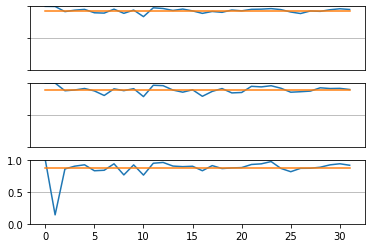

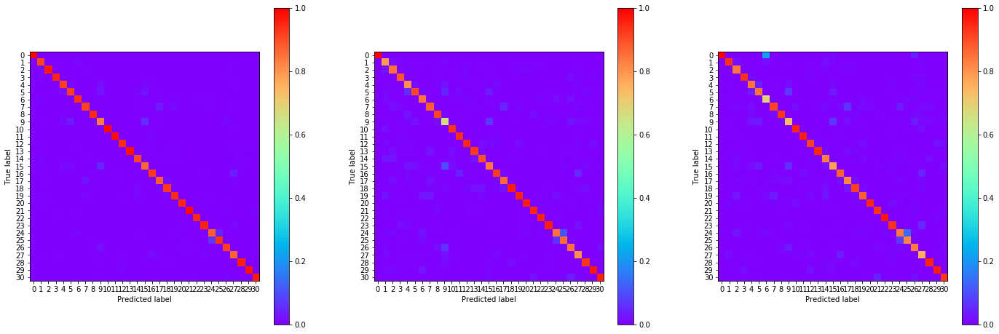

21:22:15.566703
#182 [Train: 0.239] [Test: 0.378] [Valid: 0.469]
#182 [Train: 0.929] [Test: 0.891] [Valid: 0.873]


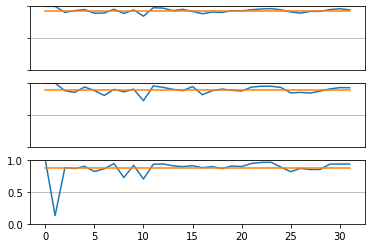

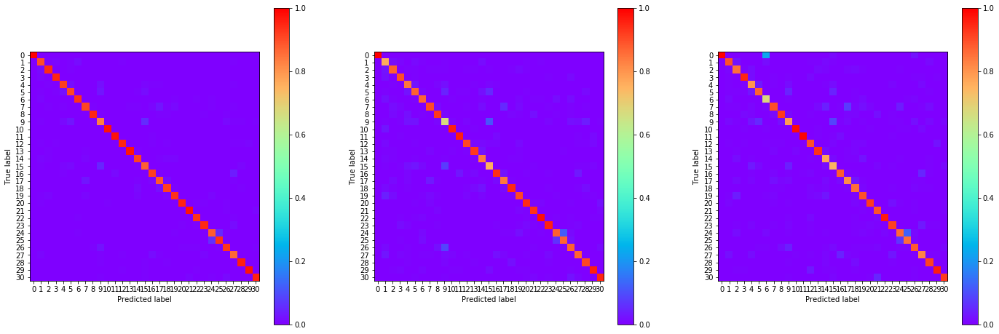

21:23:03.341436
#183 [Train: 0.233] [Test: 0.372] [Valid: 0.479]
#183 [Train: 0.932] [Test: 0.896] [Valid: 0.874]


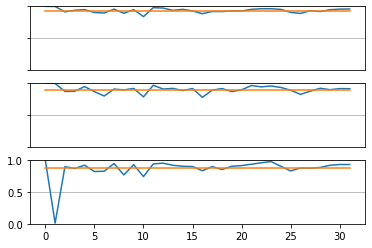

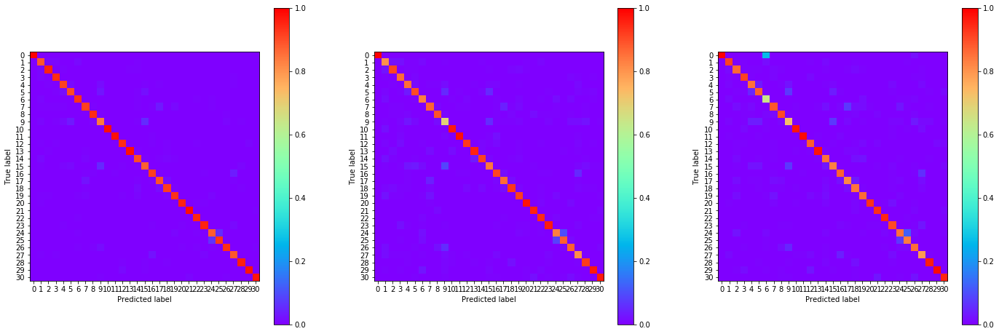

21:23:50.779228
#184 [Train: 0.232] [Test: 0.390] [Valid: 0.450]
#184 [Train: 0.931] [Test: 0.890] [Valid: 0.874]


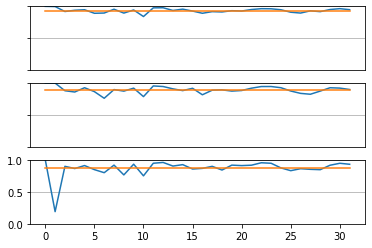

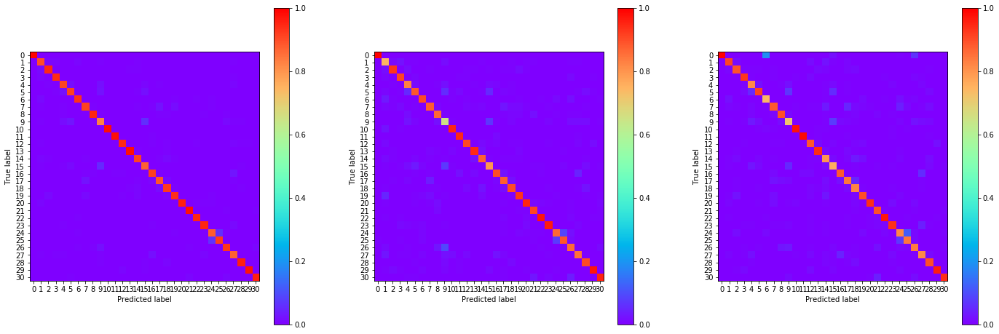

21:24:38.482239
#185 [Train: 0.229] [Test: 0.365] [Valid: 0.459]
#185 [Train: 0.932] [Test: 0.897] [Valid: 0.876]


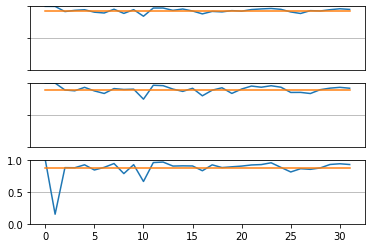

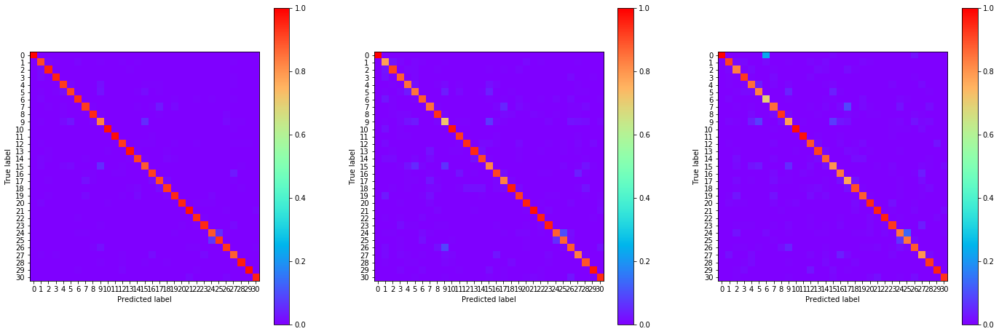

21:25:26.040275
#186 [Train: 0.227] [Test: 0.361] [Valid: 0.434]
#186 [Train: 0.933] [Test: 0.898] [Valid: 0.878]


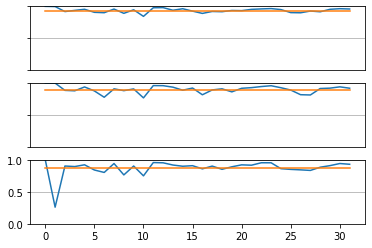

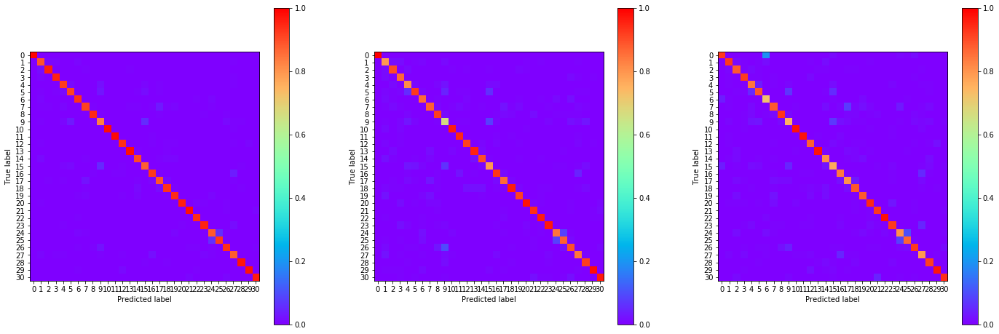

21:26:13.501752
#187 [Train: 0.225] [Test: 0.360] [Valid: 0.431]
#187 [Train: 0.933] [Test: 0.894] [Valid: 0.878]


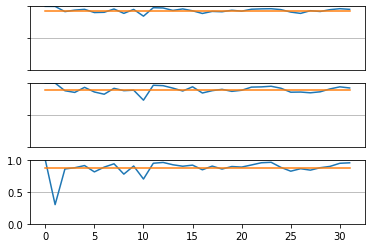

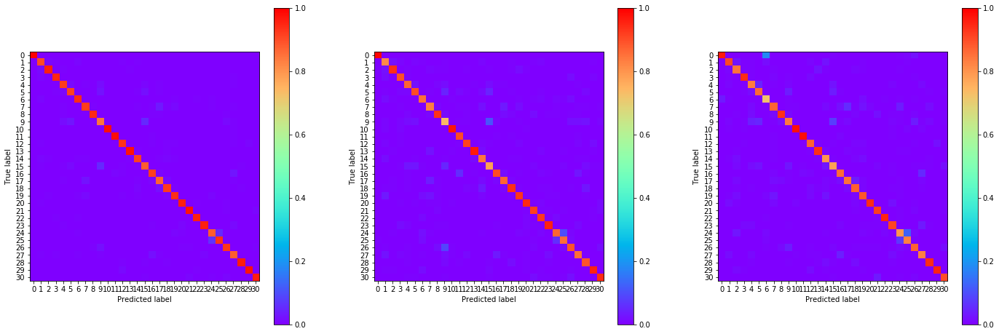

21:27:01.005915
#188 [Train: 0.228] [Test: 0.357] [Valid: 0.459]
#188 [Train: 0.933] [Test: 0.895] [Valid: 0.880]


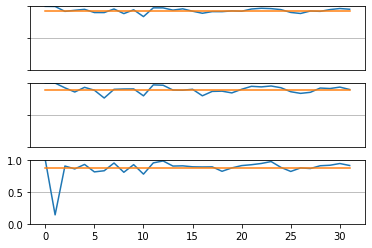

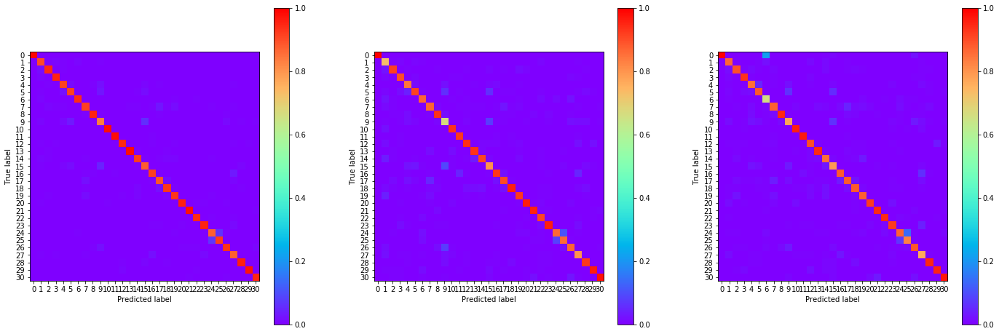

21:27:48.623384
#189 [Train: 0.228] [Test: 0.374] [Valid: 0.424]
#189 [Train: 0.931] [Test: 0.895] [Valid: 0.880]


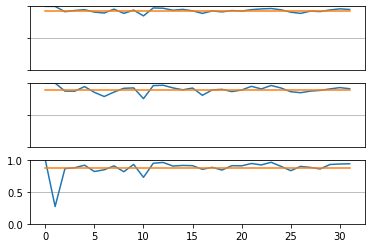

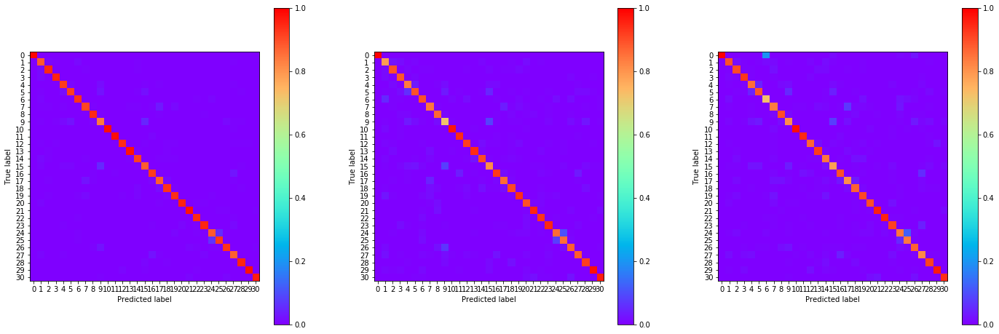

21:28:36.454274
#190 [Train: 0.226] [Test: 0.365] [Valid: 0.448]
#190 [Train: 0.932] [Test: 0.897] [Valid: 0.879]


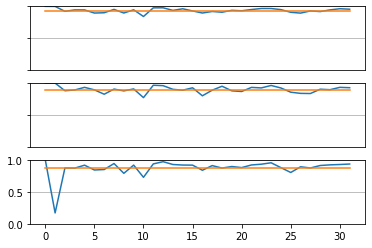

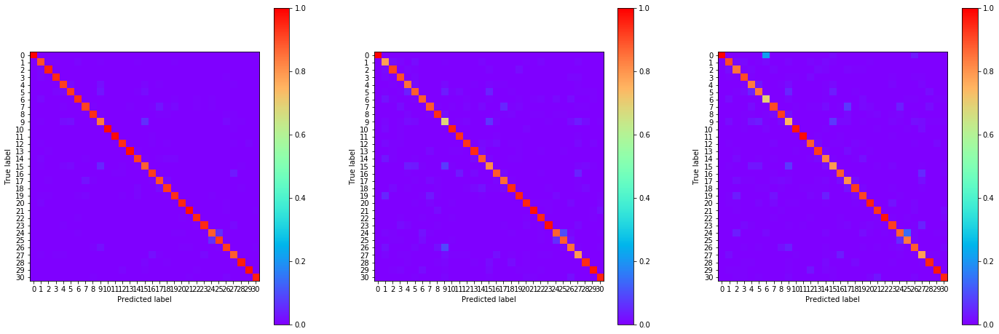

21:29:23.670650
#191 [Train: 0.223] [Test: 0.377] [Valid: 0.452]
#191 [Train: 0.935] [Test: 0.899] [Valid: 0.879]


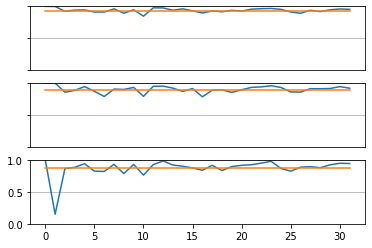

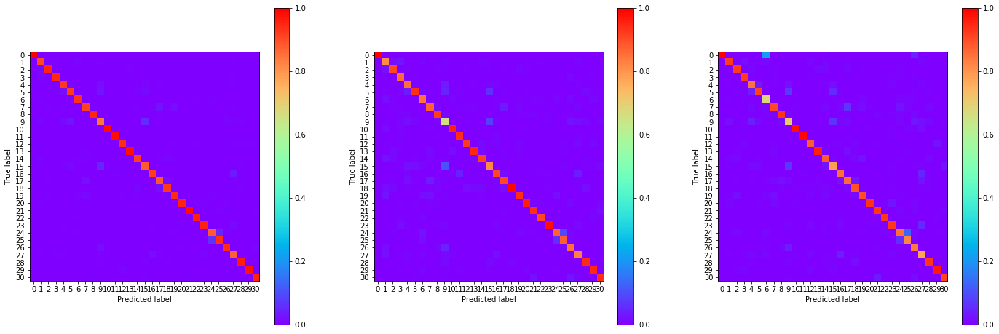

21:30:11.261347
#192 [Train: 0.226] [Test: 0.340] [Valid: 0.447]
#192 [Train: 0.933] [Test: 0.898] [Valid: 0.882]


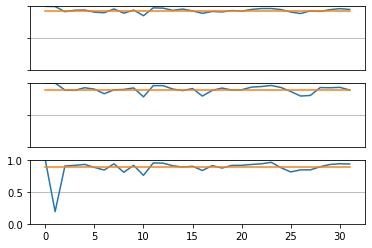

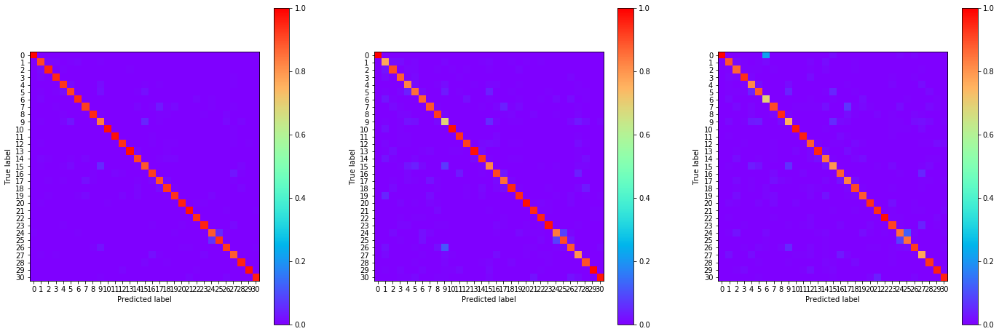

21:30:58.883570
#193 [Train: 0.220] [Test: 0.362] [Valid: 0.423]
#193 [Train: 0.935] [Test: 0.897] [Valid: 0.880]


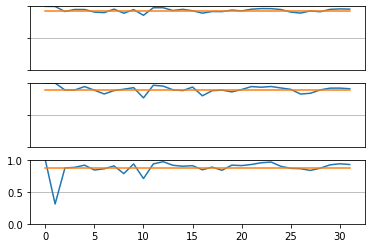

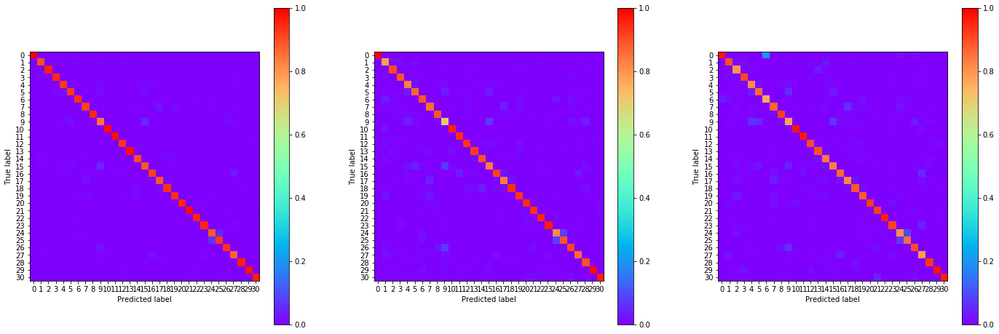

21:31:46.562566
#194 [Train: 0.221] [Test: 0.369] [Valid: 0.450]
#194 [Train: 0.934] [Test: 0.894] [Valid: 0.876]


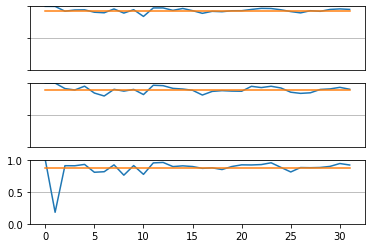

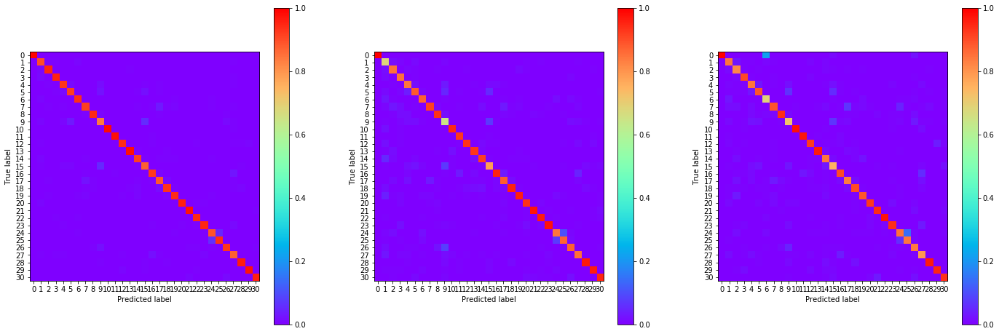

21:32:34.261922
#195 [Train: 0.219] [Test: 0.345] [Valid: 0.416]
#195 [Train: 0.935] [Test: 0.898] [Valid: 0.883]


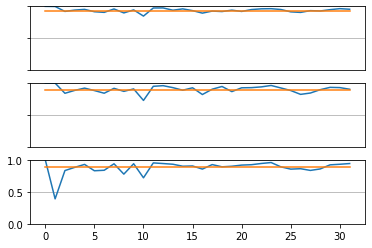

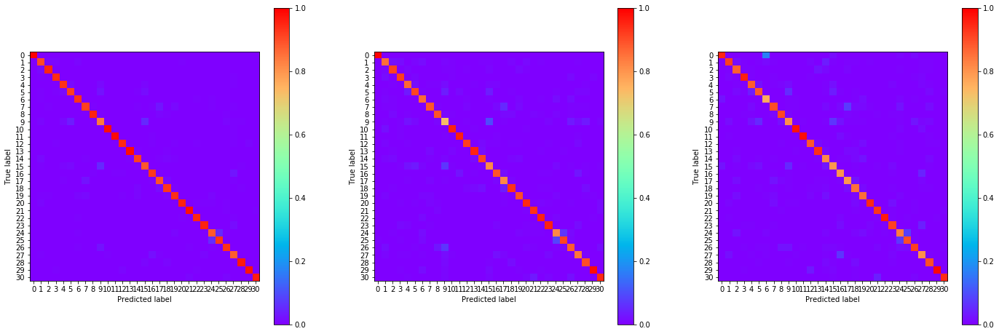

21:33:21.889276
#196 [Train: 0.217] [Test: 0.356] [Valid: 0.405]
#196 [Train: 0.936] [Test: 0.900] [Valid: 0.884]


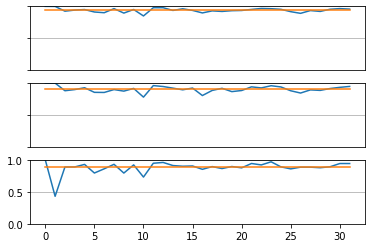

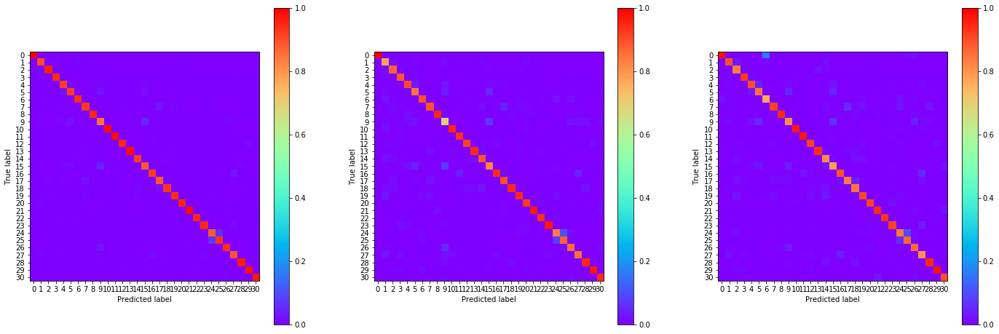

21:34:09.998023
#197 [Train: 0.214] [Test: 0.353] [Valid: 0.401]
#197 [Train: 0.937] [Test: 0.897] [Valid: 0.883]


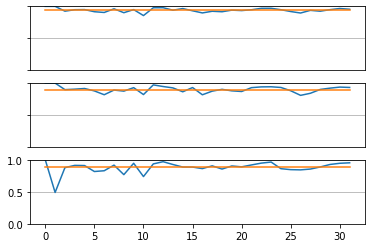

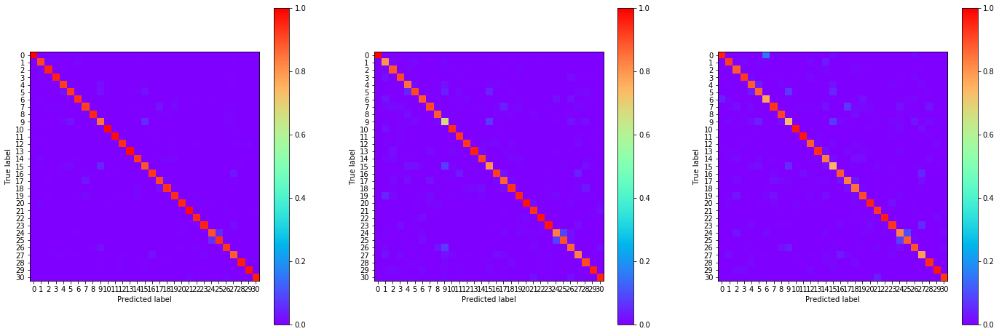

21:34:57.522313
#198 [Train: 0.216] [Test: 0.348] [Valid: 0.412]
#198 [Train: 0.935] [Test: 0.899] [Valid: 0.881]


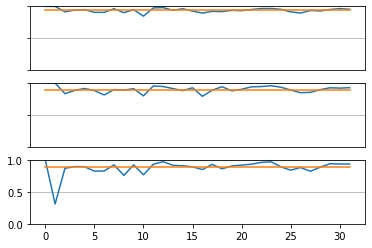

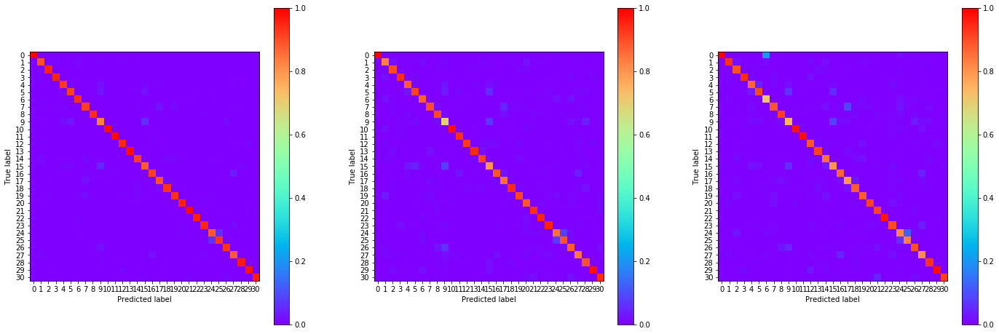

21:35:45.335011
#199 [Train: 0.213] [Test: 0.354] [Valid: 0.486]
#199 [Train: 0.936] [Test: 0.900] [Valid: 0.875]


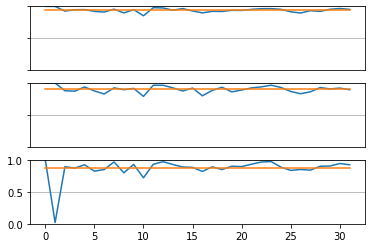

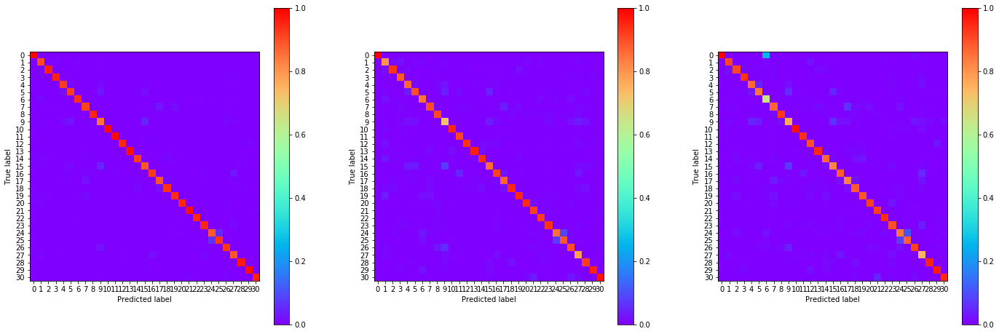

21:36:32.857862
#200 [Train: 0.212] [Test: 0.361] [Valid: 0.456]
#200 [Train: 0.938] [Test: 0.896] [Valid: 0.878]


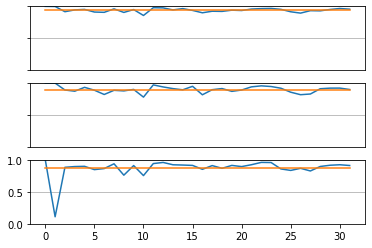

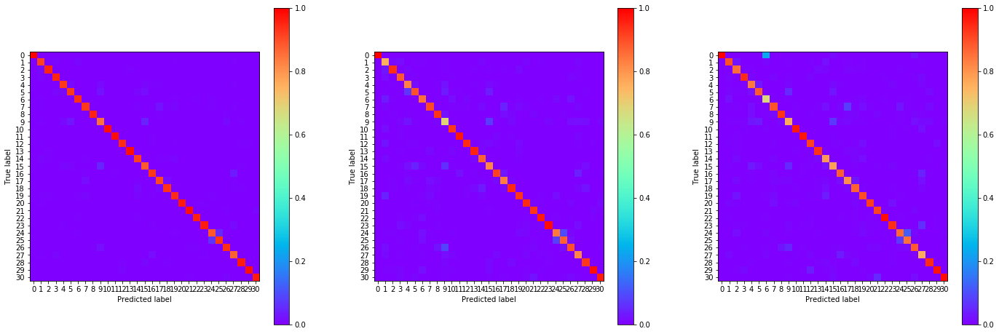

21:37:20.085470
#201 [Train: 0.208] [Test: 0.342] [Valid: 0.422]
#201 [Train: 0.938] [Test: 0.902] [Valid: 0.882]


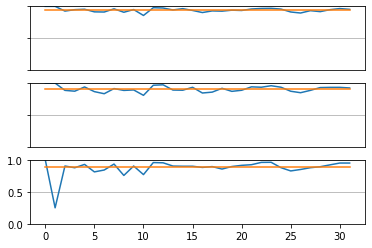

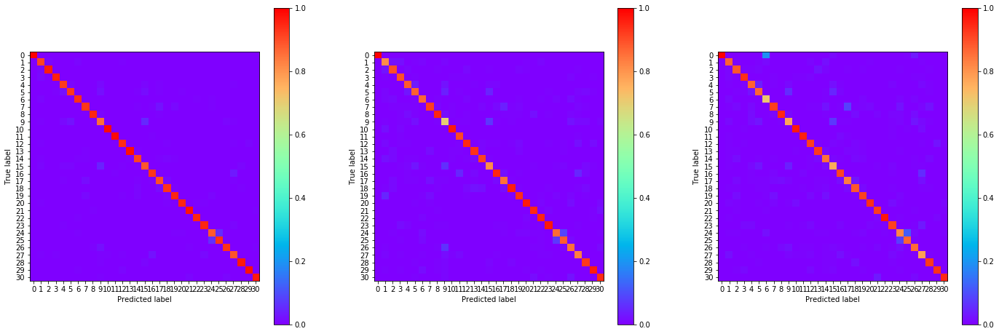

21:38:07.863043
#202 [Train: 0.210] [Test: 0.353] [Valid: 0.388]
#202 [Train: 0.937] [Test: 0.902] [Valid: 0.888]


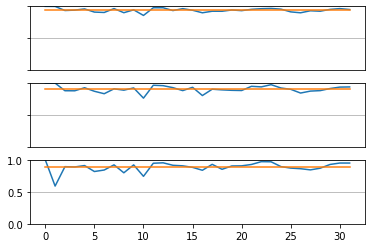

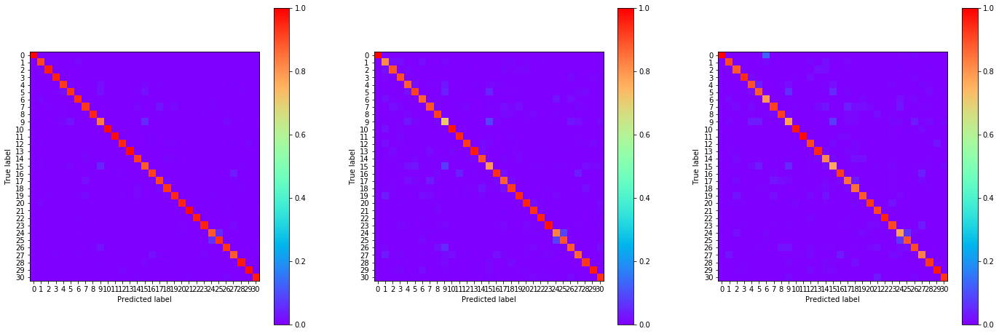

21:38:55.407346
#203 [Train: 0.209] [Test: 0.364] [Valid: 0.430]
#203 [Train: 0.937] [Test: 0.895] [Valid: 0.884]


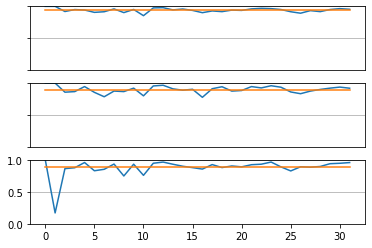

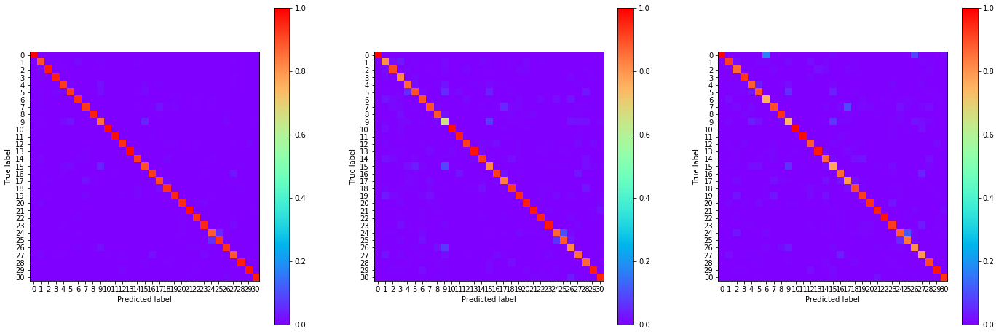

21:39:43.042045
#204 [Train: 0.209] [Test: 0.356] [Valid: 0.428]
#204 [Train: 0.939] [Test: 0.897] [Valid: 0.883]


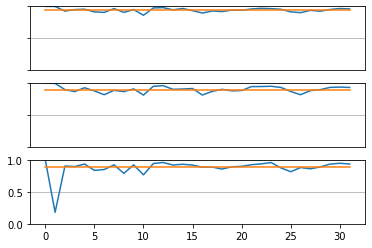

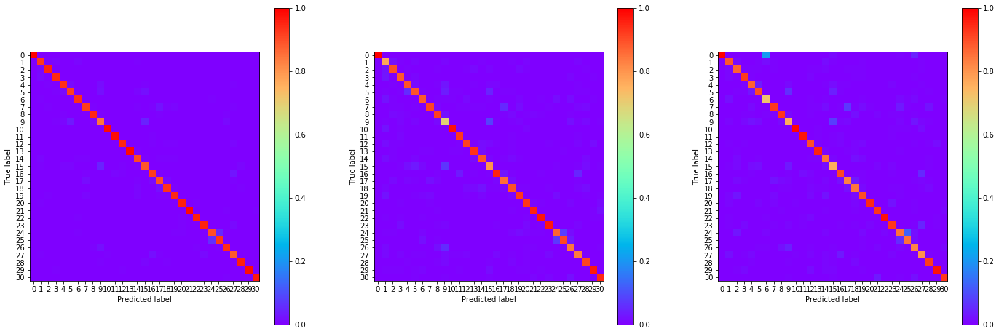

21:40:30.426084
#205 [Train: 0.207] [Test: 0.341] [Valid: 0.403]
#205 [Train: 0.939] [Test: 0.902] [Valid: 0.885]


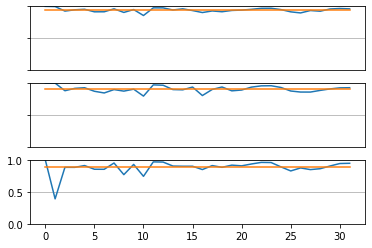

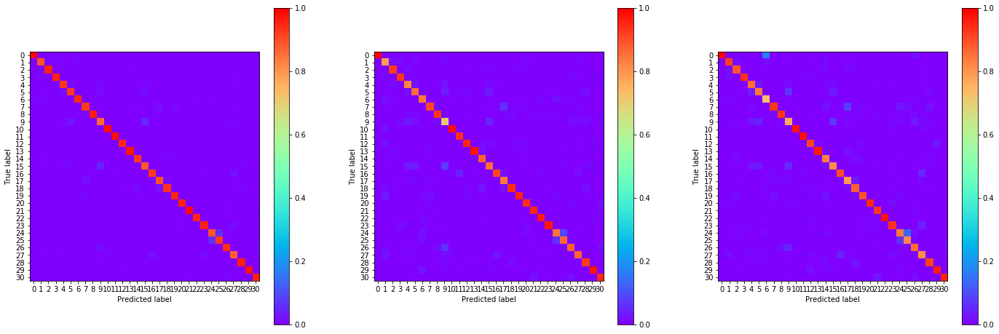

21:41:18.562374
#206 [Train: 0.205] [Test: 0.370] [Valid: 0.434]
#206 [Train: 0.938] [Test: 0.900] [Valid: 0.884]


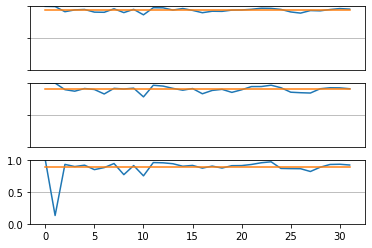

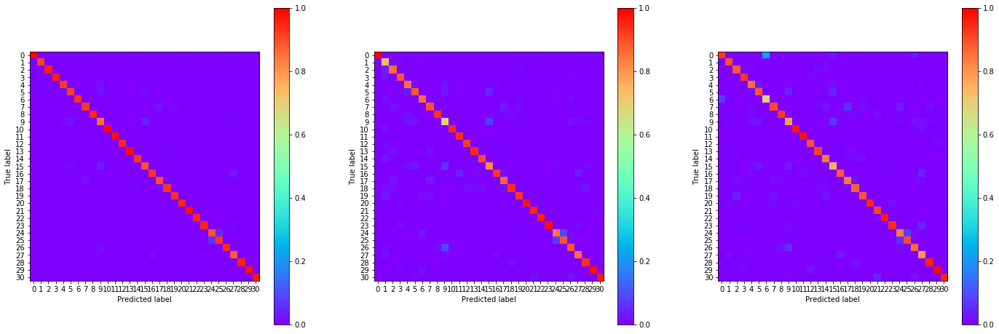

21:42:06.217046
#207 [Train: 0.204] [Test: 0.373] [Valid: 0.420]
#207 [Train: 0.940] [Test: 0.899] [Valid: 0.882]


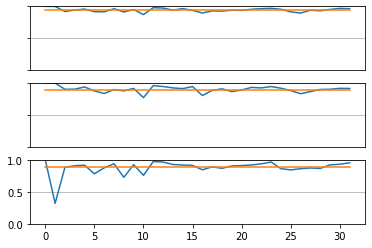

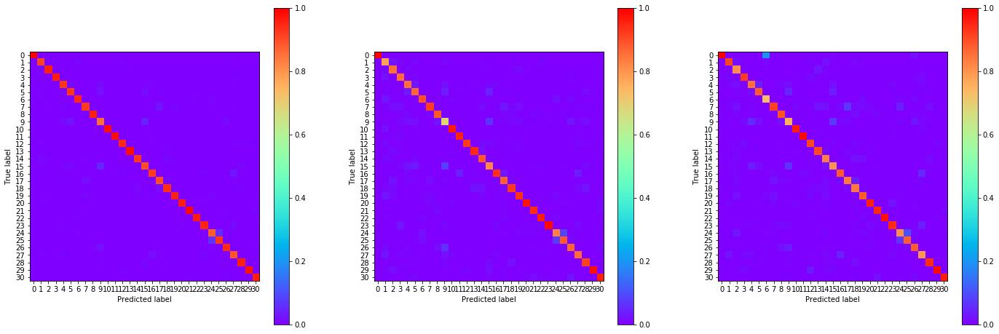

21:42:53.925356
#208 [Train: 0.203] [Test: 0.358] [Valid: 0.434]
#208 [Train: 0.940] [Test: 0.902] [Valid: 0.885]


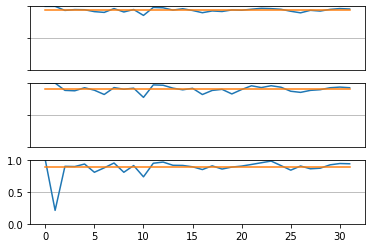

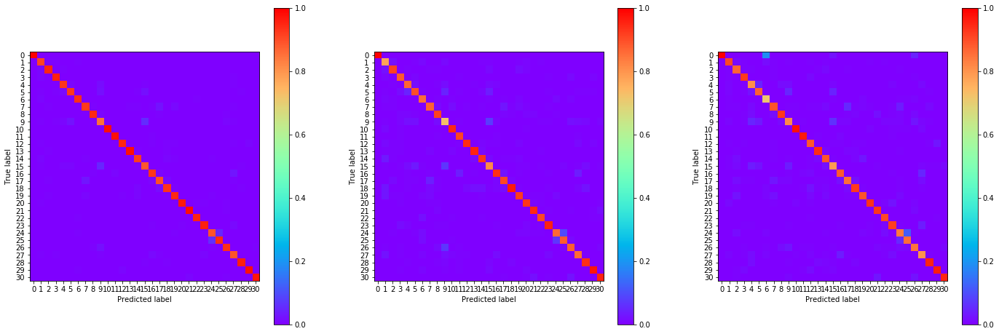

21:43:41.466062
#209 [Train: 0.201] [Test: 0.356] [Valid: 0.447]
#209 [Train: 0.940] [Test: 0.895] [Valid: 0.880]


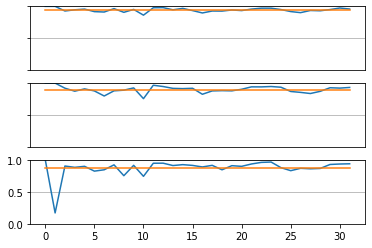

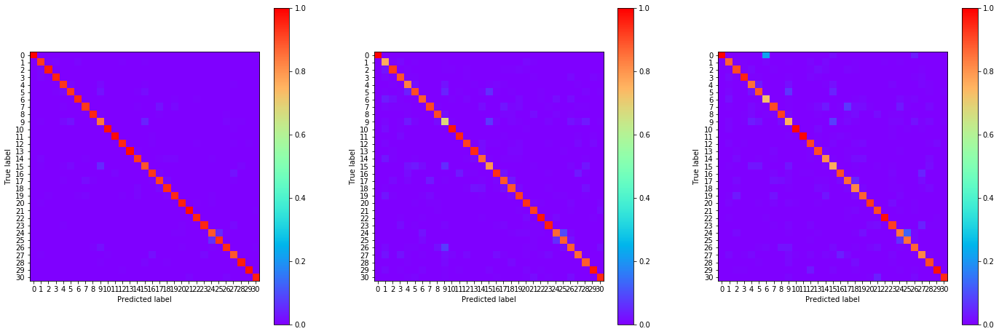

21:44:28.965915
#210 [Train: 0.198] [Test: 0.350] [Valid: 0.439]
#210 [Train: 0.943] [Test: 0.901] [Valid: 0.886]


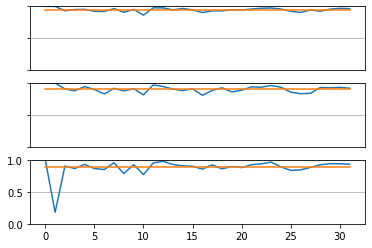

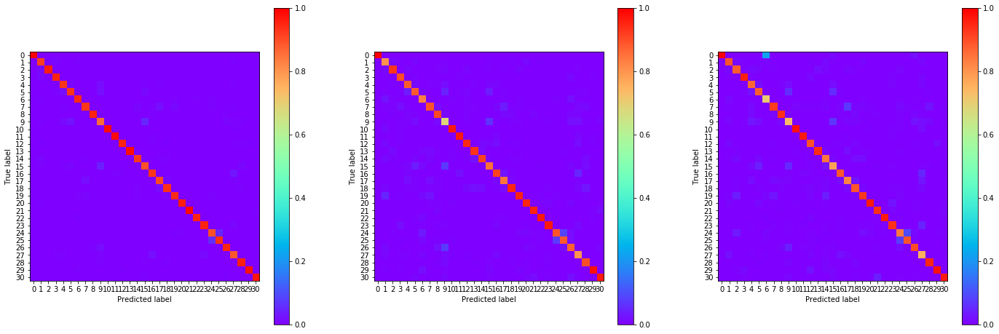

21:45:16.529577
#211 [Train: 0.198] [Test: 0.359] [Valid: 0.441]
#211 [Train: 0.941] [Test: 0.896] [Valid: 0.881]


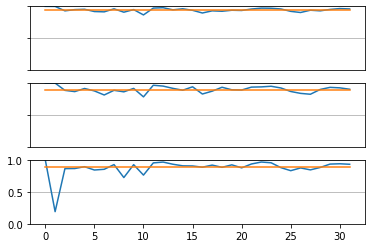

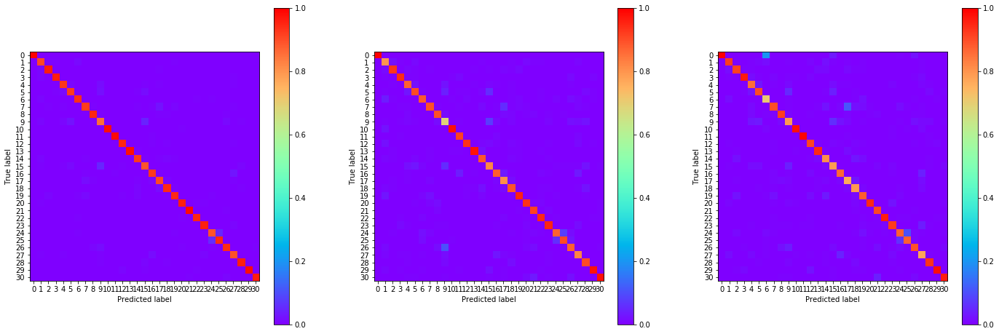

21:46:04.390058
#212 [Train: 0.196] [Test: 0.336] [Valid: 0.410]
#212 [Train: 0.942] [Test: 0.901] [Valid: 0.887]


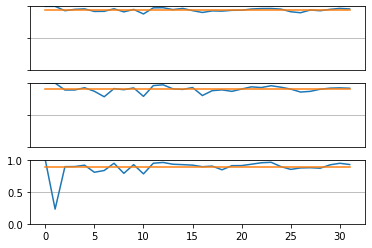

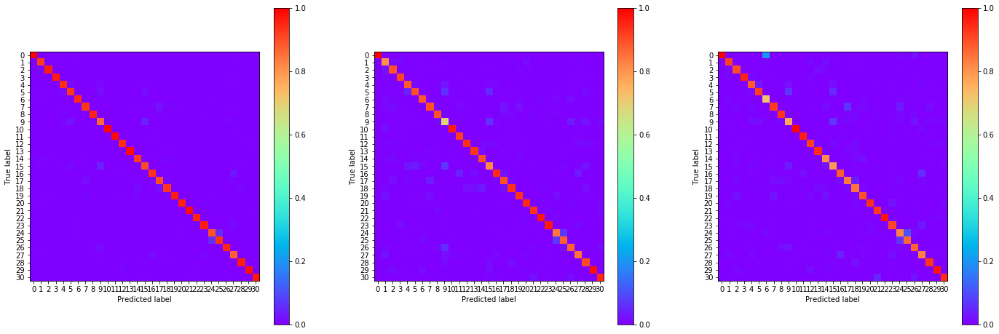

21:46:52.174283
#213 [Train: 0.197] [Test: 0.352] [Valid: 0.407]
#213 [Train: 0.941] [Test: 0.901] [Valid: 0.885]


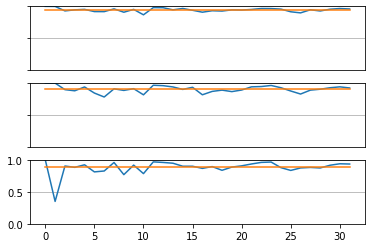

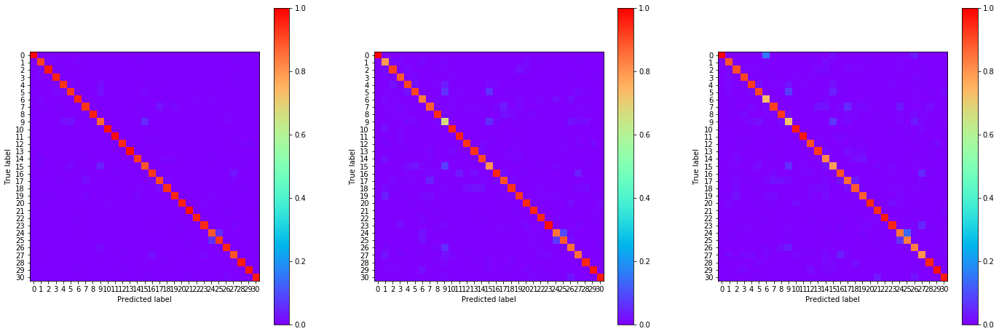

21:47:39.576896
#214 [Train: 0.195] [Test: 0.339] [Valid: 0.428]
#214 [Train: 0.942] [Test: 0.902] [Valid: 0.884]


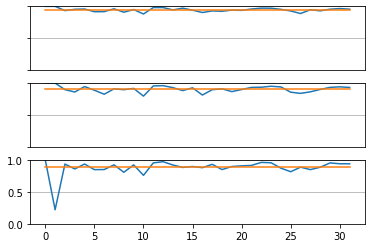

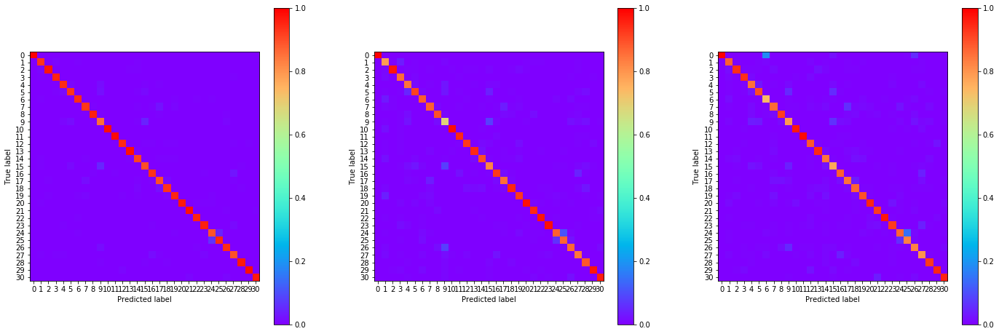

21:48:27.591441
#215 [Train: 0.194] [Test: 0.353] [Valid: 0.412]
#215 [Train: 0.943] [Test: 0.898] [Valid: 0.887]


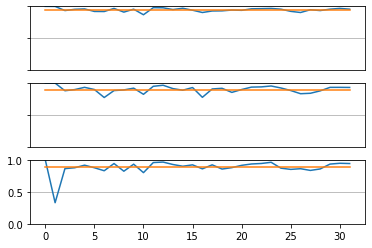

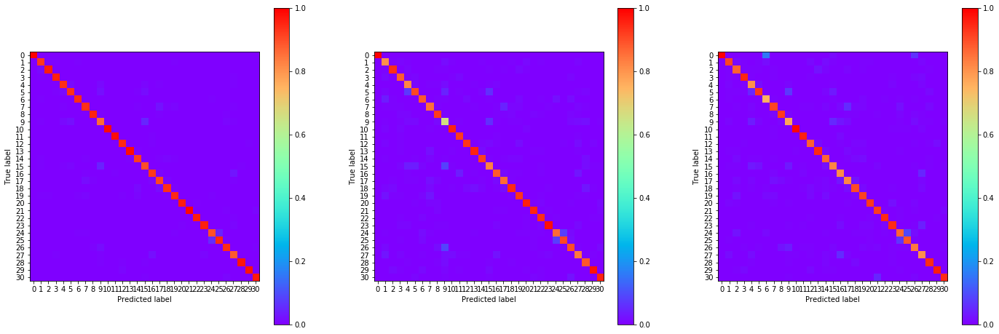

21:49:15.374052
#216 [Train: 0.192] [Test: 0.325] [Valid: 0.404]
#216 [Train: 0.943] [Test: 0.902] [Valid: 0.882]


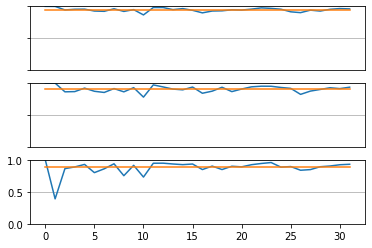

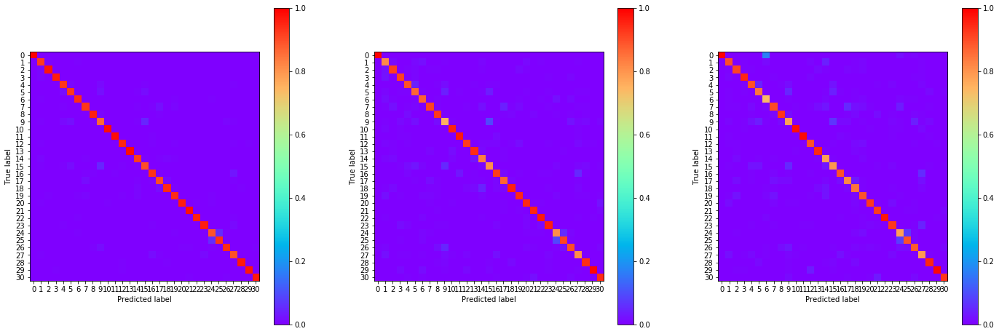

21:50:03.425286
#217 [Train: 0.192] [Test: 0.339] [Valid: 0.434]
#217 [Train: 0.943] [Test: 0.905] [Valid: 0.886]


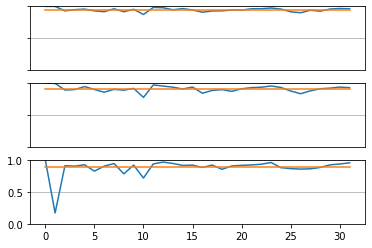

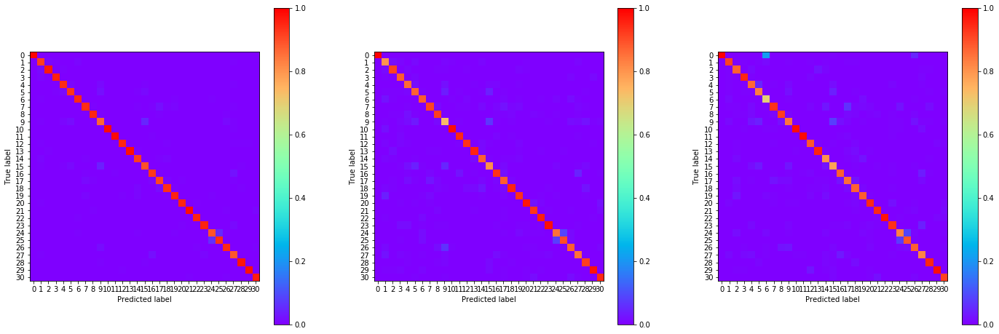

21:50:51.437487
#218 [Train: 0.192] [Test: 0.361] [Valid: 0.398]
#218 [Train: 0.943] [Test: 0.901] [Valid: 0.885]


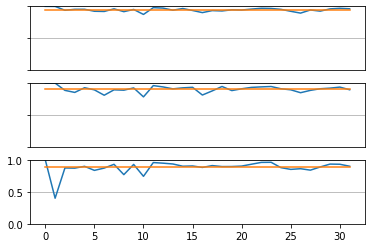

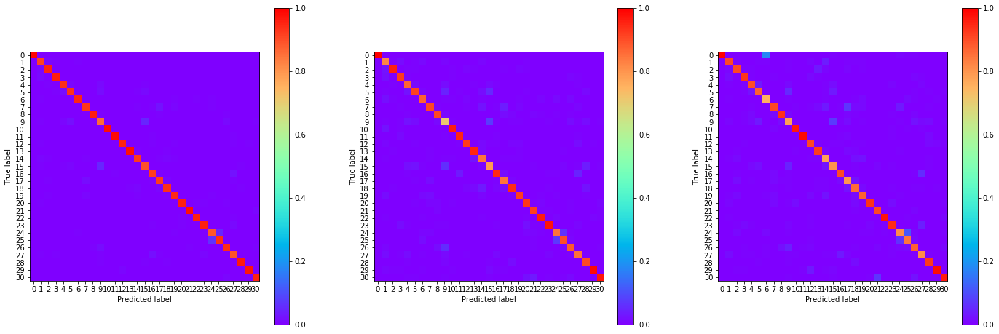

21:51:38.941654
#219 [Train: 0.190] [Test: 0.341] [Valid: 0.413]
#219 [Train: 0.944] [Test: 0.905] [Valid: 0.886]


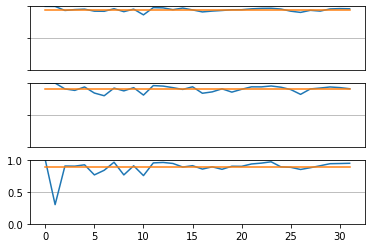

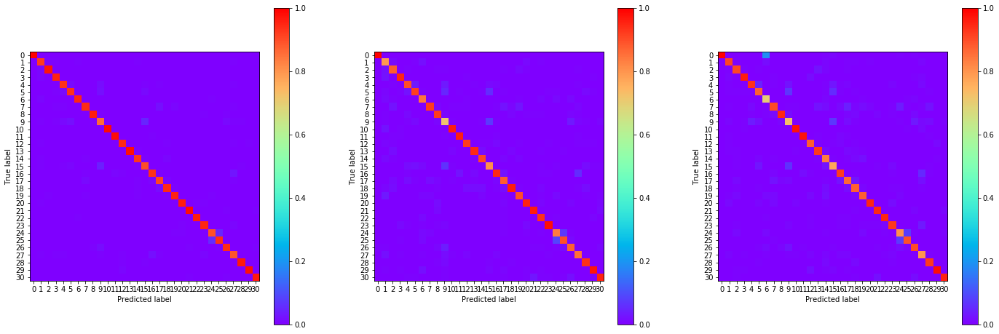

21:52:26.837530
#220 [Train: 0.189] [Test: 0.333] [Valid: 0.423]
#220 [Train: 0.944] [Test: 0.905] [Valid: 0.888]


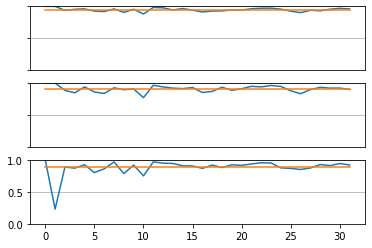

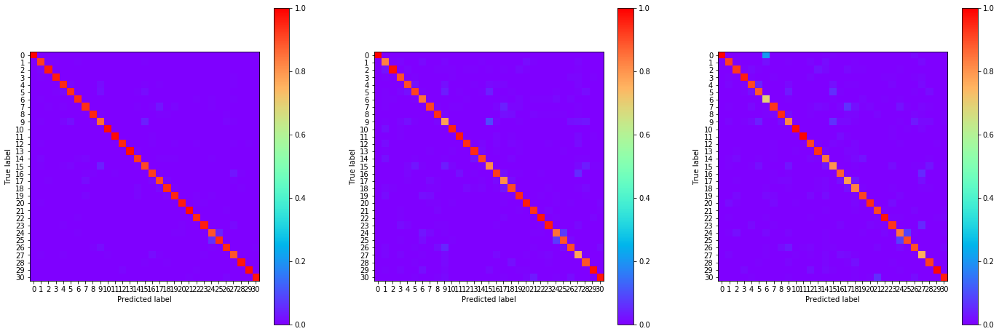

21:53:14.498117
#221 [Train: 0.185] [Test: 0.338] [Valid: 0.436]
#221 [Train: 0.945] [Test: 0.901] [Valid: 0.885]


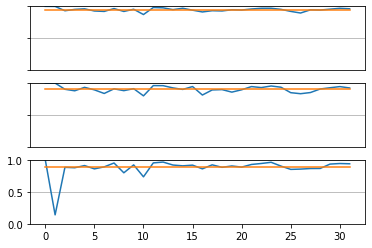

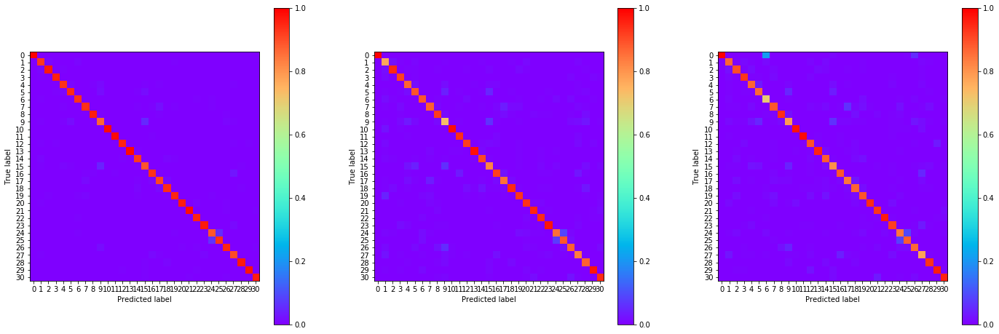

21:54:02.421537
#222 [Train: 0.187] [Test: 0.337] [Valid: 0.434]
#222 [Train: 0.945] [Test: 0.902] [Valid: 0.887]


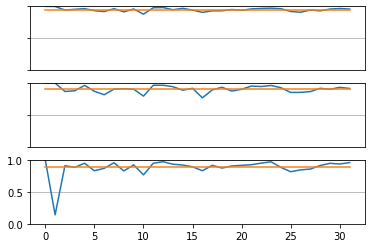

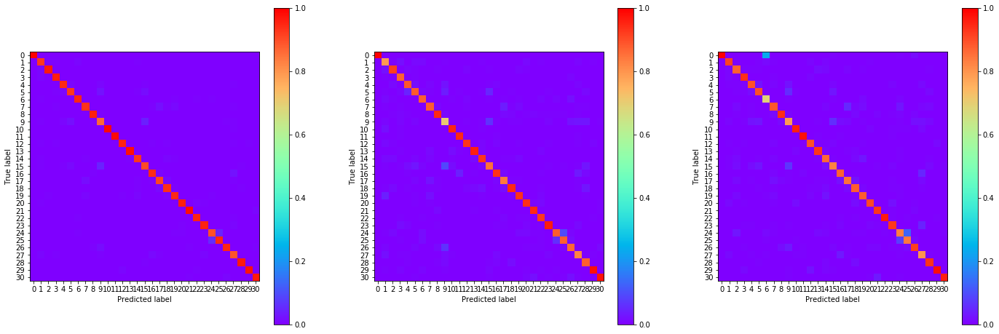

21:54:49.992904
#223 [Train: 0.186] [Test: 0.352] [Valid: 0.391]
#223 [Train: 0.944] [Test: 0.905] [Valid: 0.888]


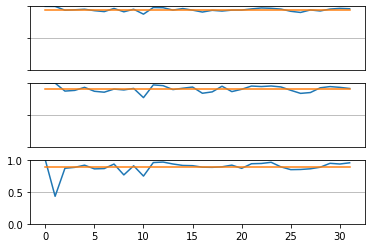

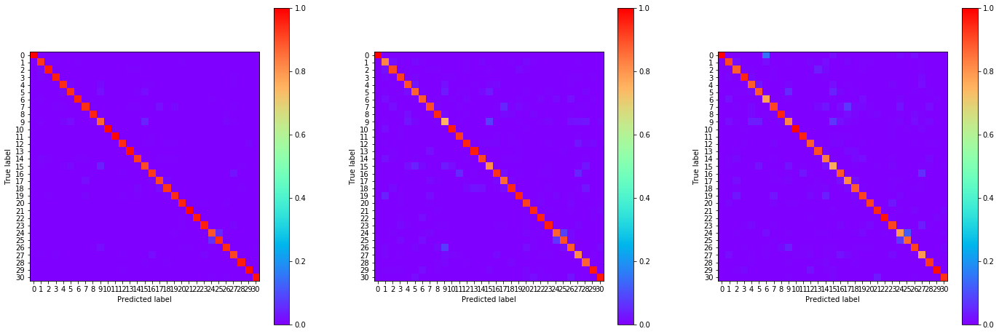

21:55:37.278074
#224 [Train: 0.186] [Test: 0.336] [Valid: 0.407]
#224 [Train: 0.945] [Test: 0.902] [Valid: 0.887]


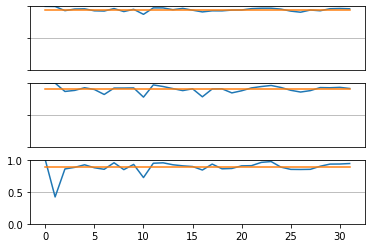

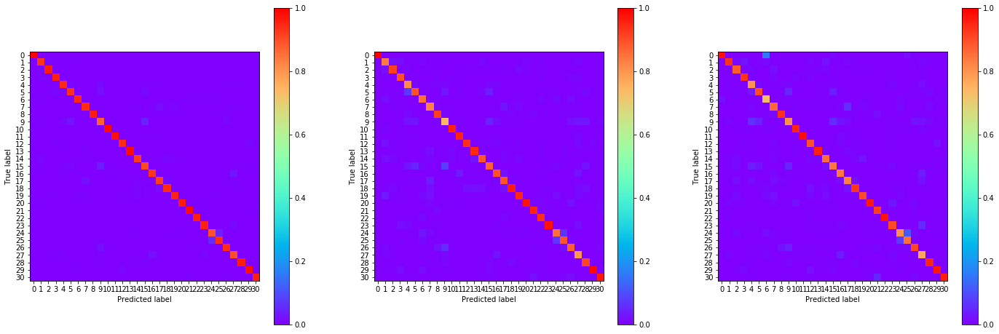

21:56:25.039896
#225 [Train: 0.182] [Test: 0.358] [Valid: 0.436]
#225 [Train: 0.946] [Test: 0.903] [Valid: 0.884]


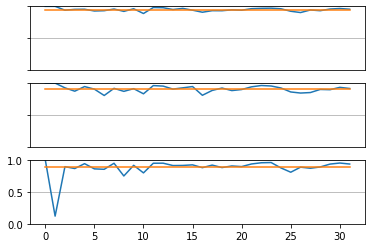

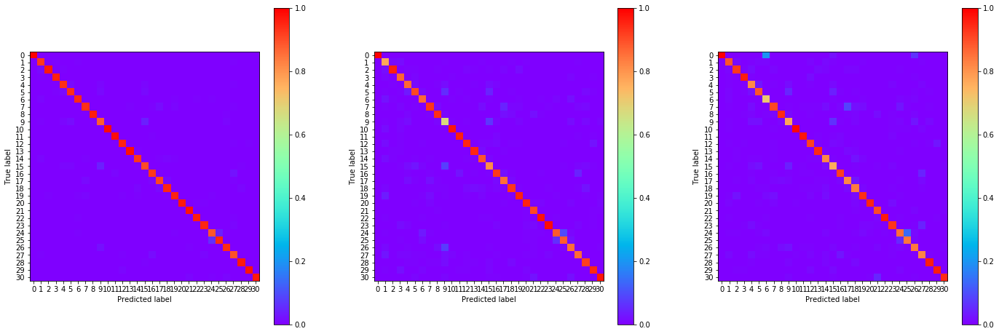

21:57:12.677712
#226 [Train: 0.183] [Test: 0.341] [Valid: 0.427]
#226 [Train: 0.946] [Test: 0.906] [Valid: 0.887]


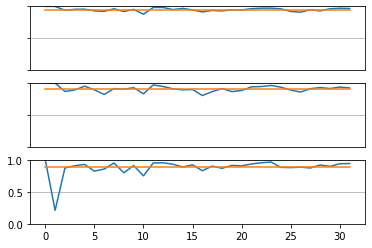

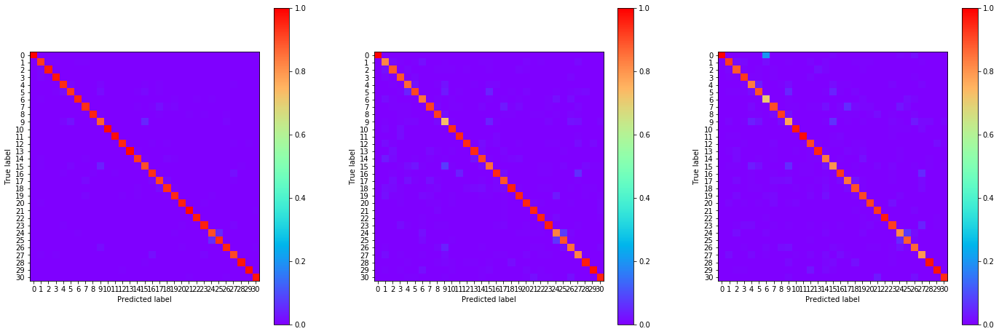

21:58:00.489652
#227 [Train: 0.186] [Test: 0.368] [Valid: 0.435]
#227 [Train: 0.945] [Test: 0.898] [Valid: 0.885]


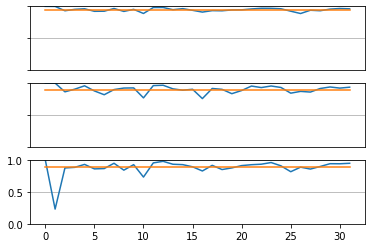

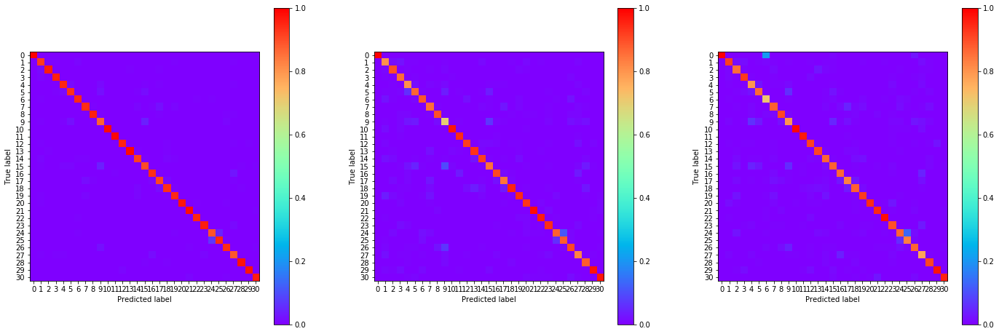

21:58:48.127037
#228 [Train: 0.181] [Test: 0.353] [Valid: 0.427]
#228 [Train: 0.947] [Test: 0.900] [Valid: 0.886]


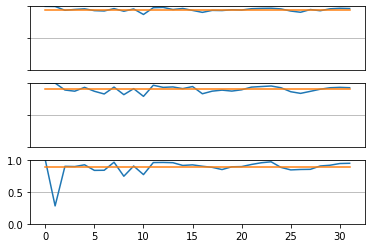

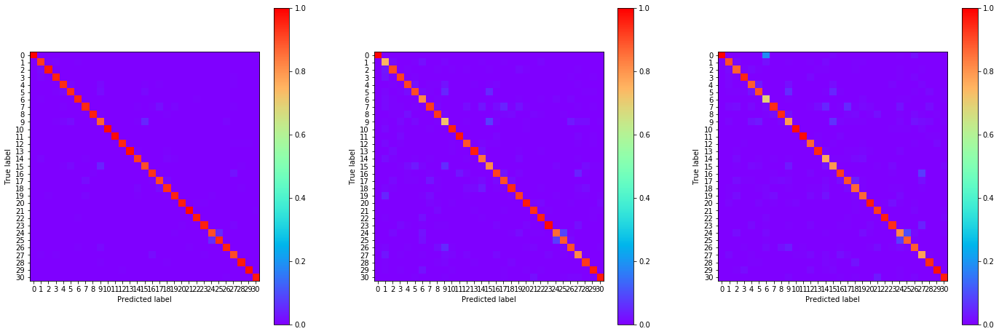

21:59:35.883150
#229 [Train: 0.180] [Test: 0.352] [Valid: 0.421]
#229 [Train: 0.948] [Test: 0.901] [Valid: 0.887]


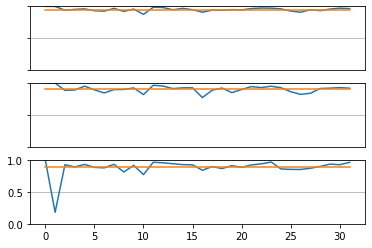

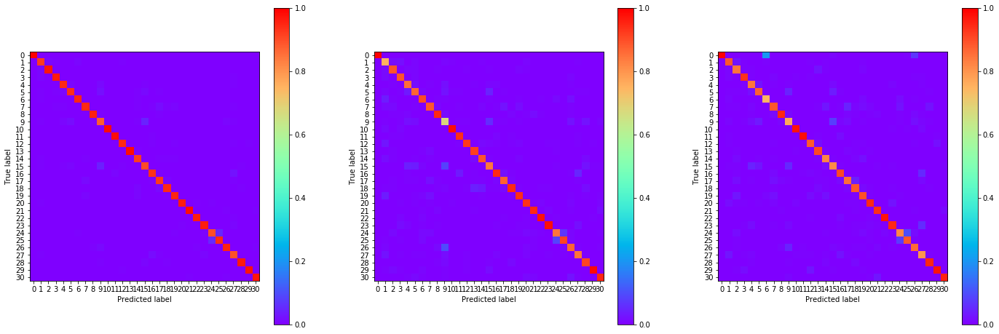

22:00:23.946848
#230 [Train: 0.179] [Test: 0.349] [Valid: 0.417]
#230 [Train: 0.946] [Test: 0.904] [Valid: 0.886]


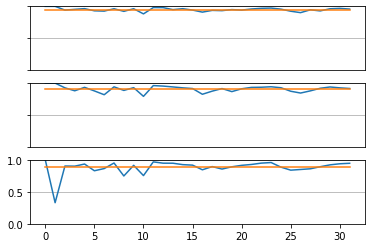

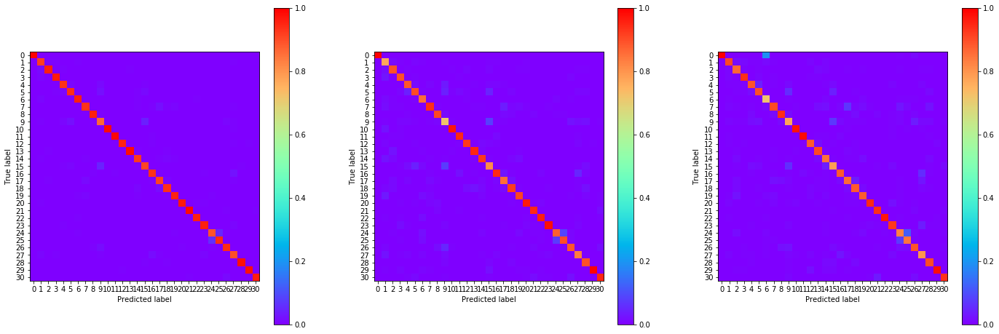

22:01:11.609688
#231 [Train: 0.179] [Test: 0.344] [Valid: 0.393]
#231 [Train: 0.947] [Test: 0.902] [Valid: 0.891]


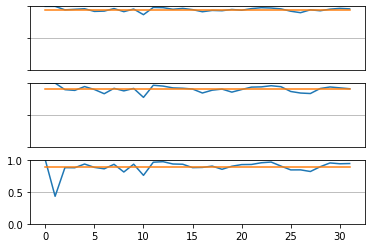

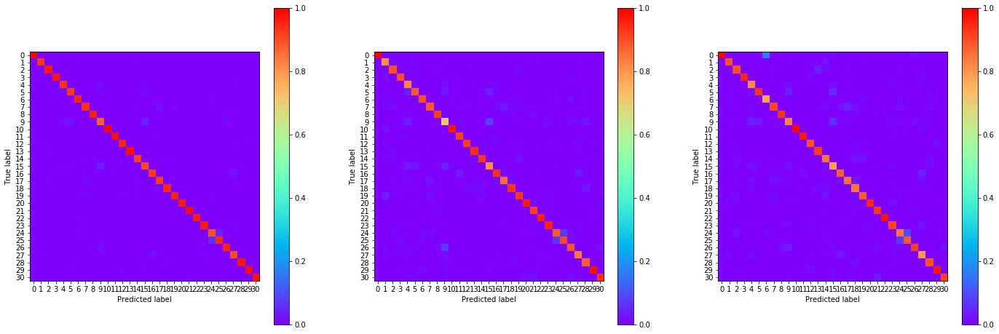

22:01:59.565958
#232 [Train: 0.178] [Test: 0.346] [Valid: 0.429]
#232 [Train: 0.948] [Test: 0.903] [Valid: 0.887]


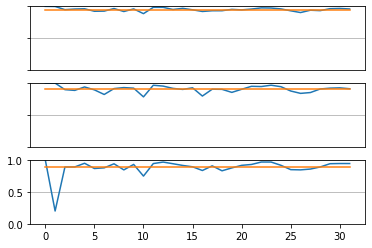

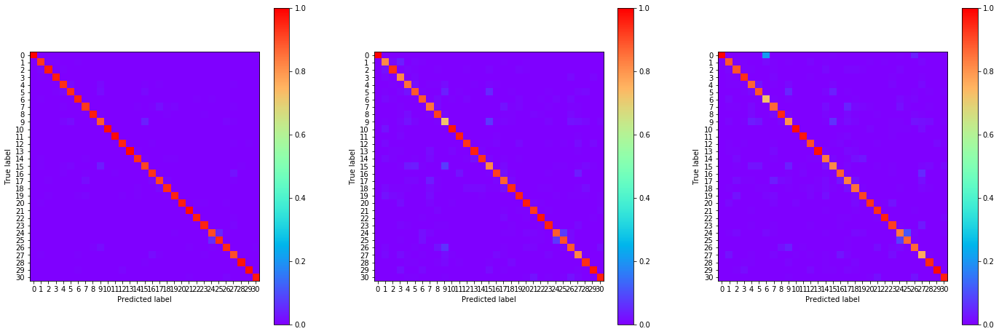

22:02:47.418844
#233 [Train: 0.177] [Test: 0.351] [Valid: 0.403]
#233 [Train: 0.948] [Test: 0.905] [Valid: 0.889]


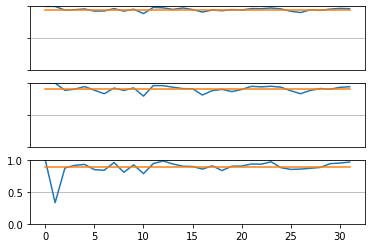

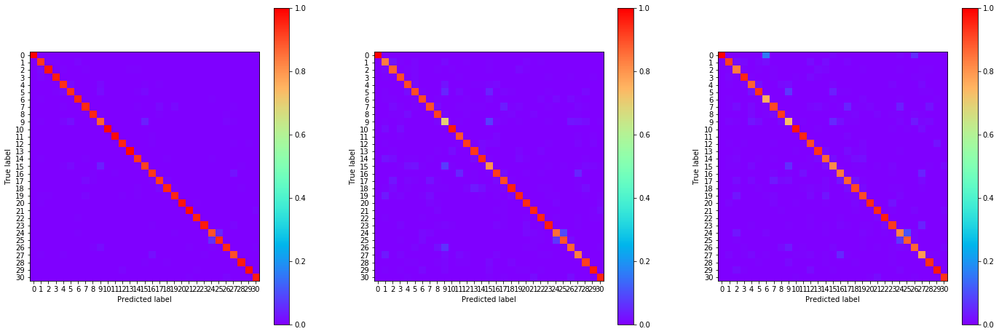

22:03:35.205771
#234 [Train: 0.177] [Test: 0.335] [Valid: 0.403]
#234 [Train: 0.948] [Test: 0.904] [Valid: 0.892]


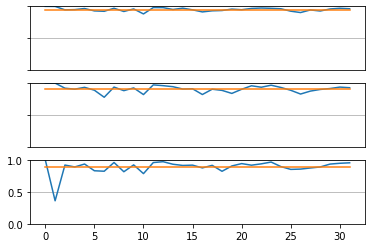

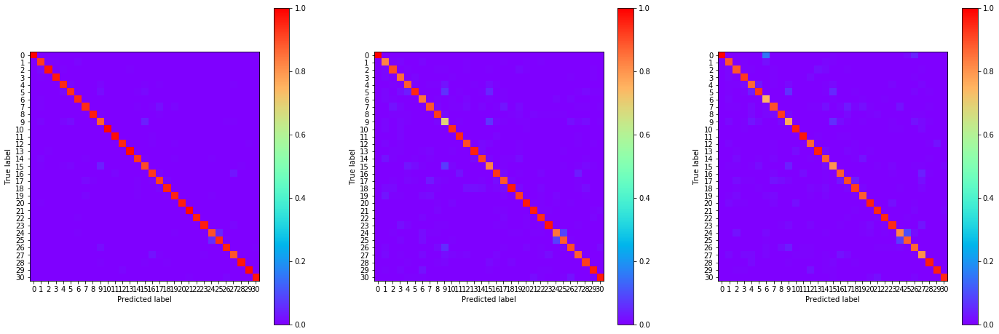

22:04:23.061955
#235 [Train: 0.175] [Test: 0.350] [Valid: 0.392]
#235 [Train: 0.948] [Test: 0.902] [Valid: 0.888]


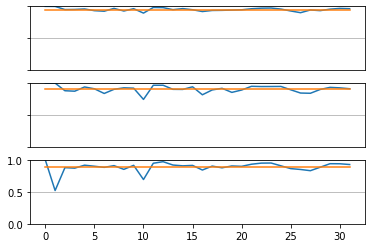

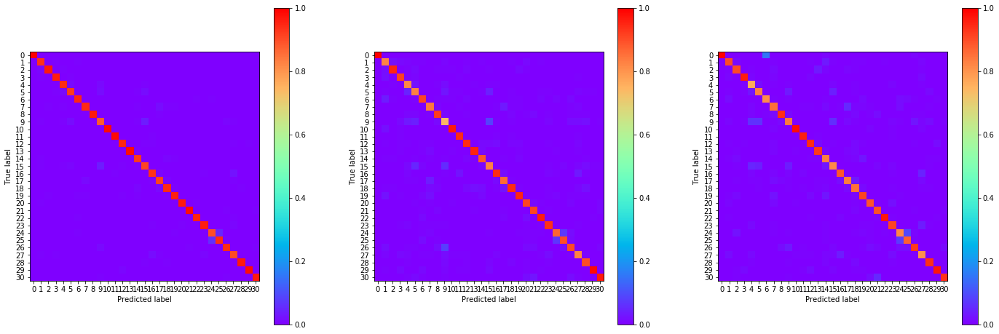

22:05:10.891810
#236 [Train: 0.173] [Test: 0.343] [Valid: 0.435]
#236 [Train: 0.949] [Test: 0.905] [Valid: 0.885]


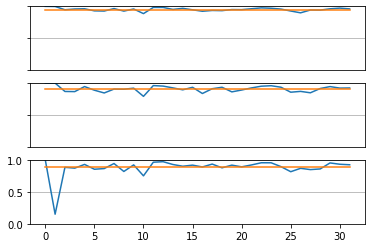

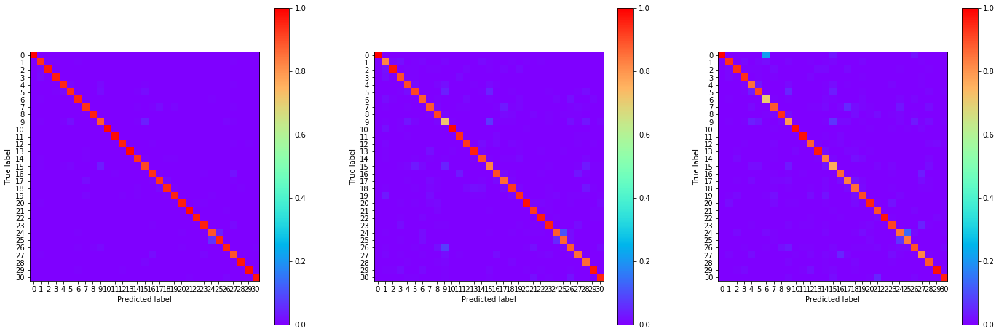

22:05:58.641946
#237 [Train: 0.174] [Test: 0.366] [Valid: 0.392]
#237 [Train: 0.948] [Test: 0.901] [Valid: 0.887]


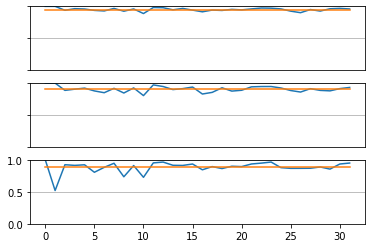

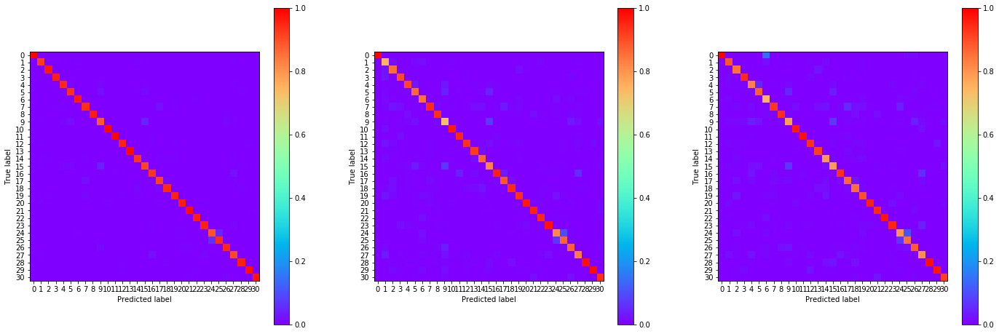

22:06:46.480534
#238 [Train: 0.174] [Test: 0.331] [Valid: 0.388]
#238 [Train: 0.949] [Test: 0.907] [Valid: 0.889]


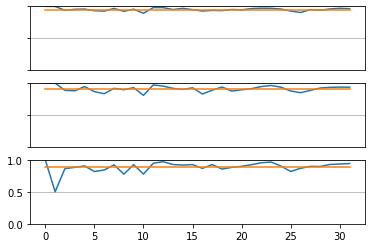

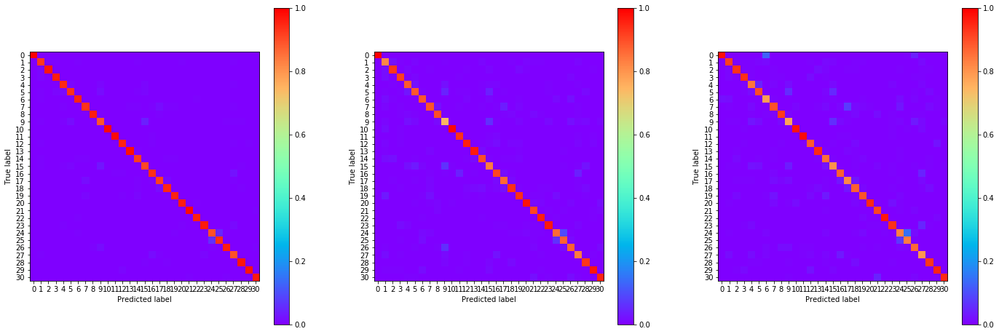

22:07:34.262251
#239 [Train: 0.169] [Test: 0.345] [Valid: 0.424]
#239 [Train: 0.949] [Test: 0.905] [Valid: 0.890]


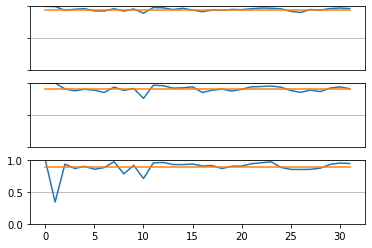

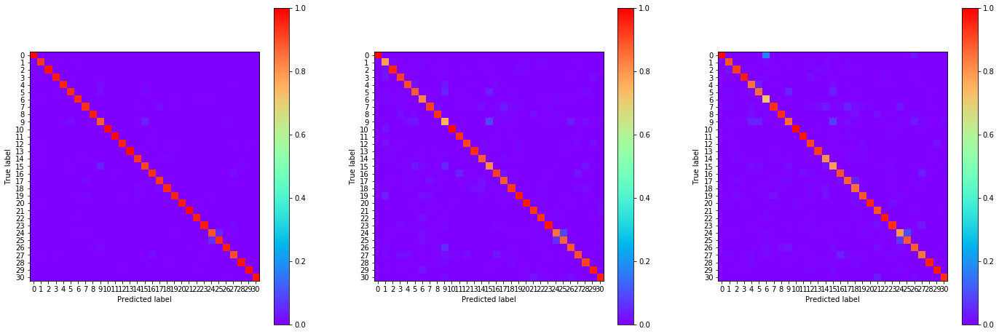

22:08:22.281313
#240 [Train: 0.172] [Test: 0.336] [Valid: 0.425]
#240 [Train: 0.949] [Test: 0.907] [Valid: 0.884]


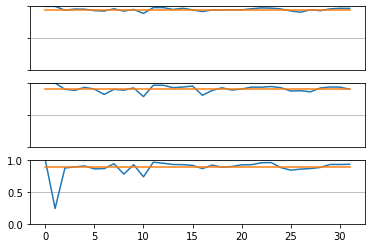

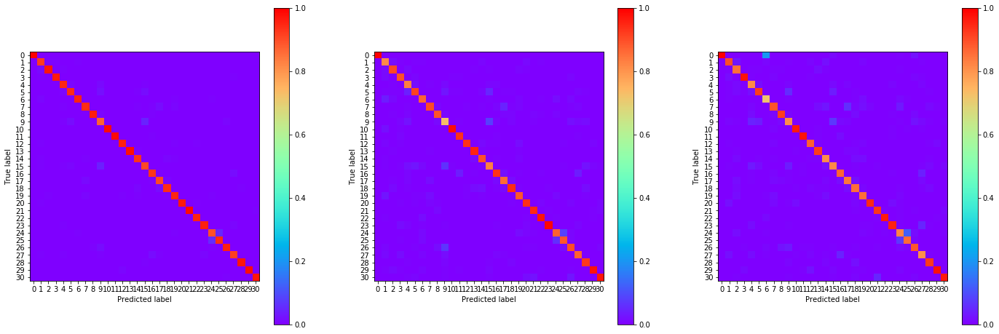

22:09:10.193168
#241 [Train: 0.168] [Test: 0.342] [Valid: 0.414]
#241 [Train: 0.951] [Test: 0.905] [Valid: 0.889]


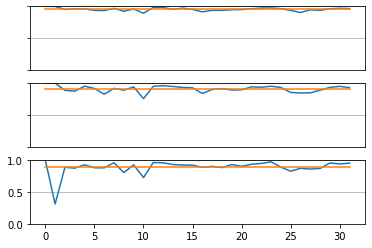

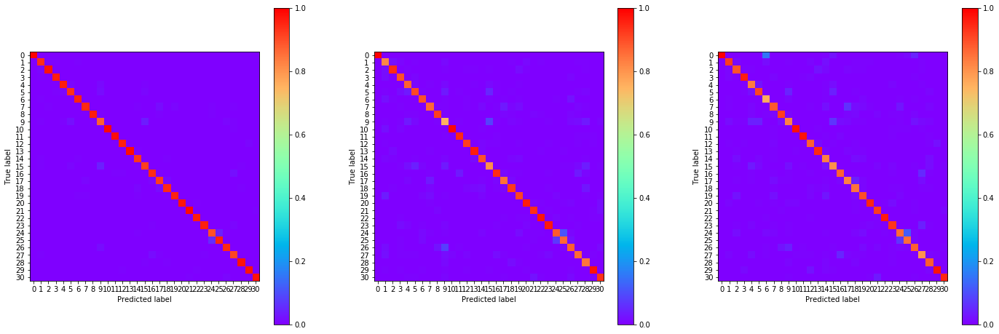

22:09:57.870414
#242 [Train: 0.168] [Test: 0.342] [Valid: 0.407]
#242 [Train: 0.950] [Test: 0.904] [Valid: 0.888]


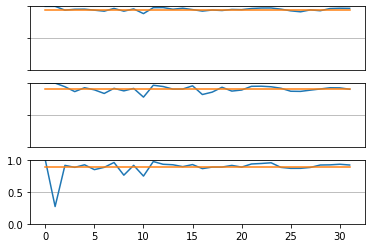

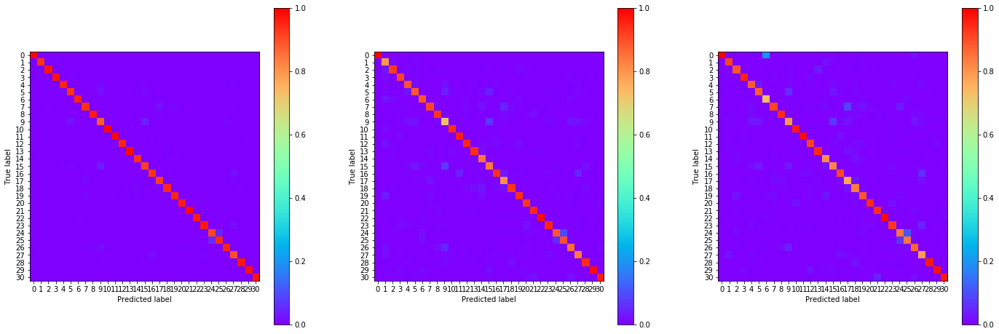

22:10:45.988229
#243 [Train: 0.172] [Test: 0.335] [Valid: 0.468]
#243 [Train: 0.949] [Test: 0.900] [Valid: 0.886]


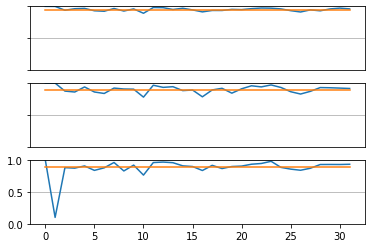

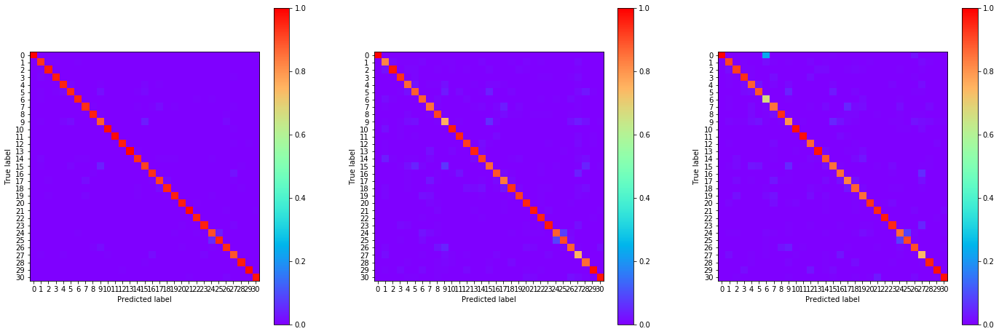

22:11:33.854918
#244 [Train: 0.167] [Test: 0.329] [Valid: 0.415]
#244 [Train: 0.950] [Test: 0.907] [Valid: 0.886]


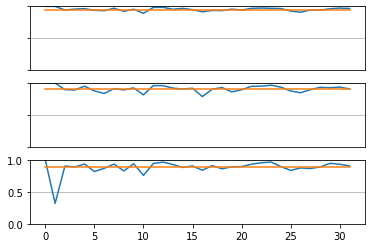

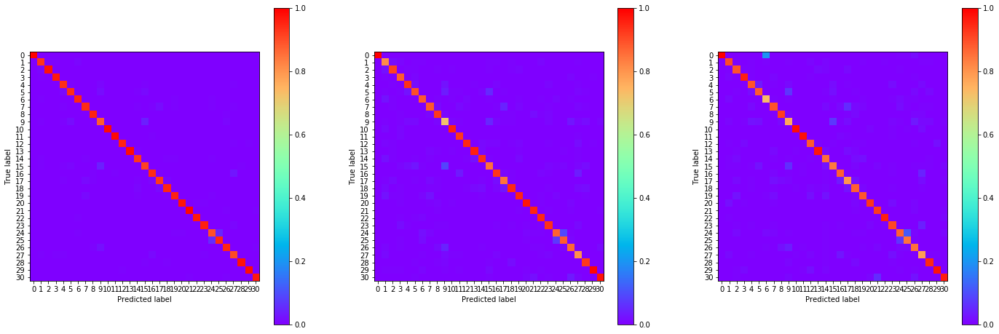

22:12:21.455888
#245 [Train: 0.164] [Test: 0.343] [Valid: 0.433]
#245 [Train: 0.951] [Test: 0.901] [Valid: 0.886]


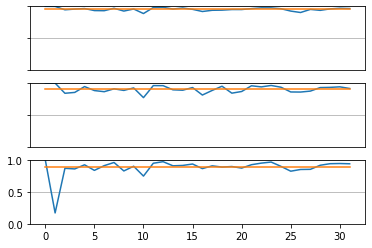

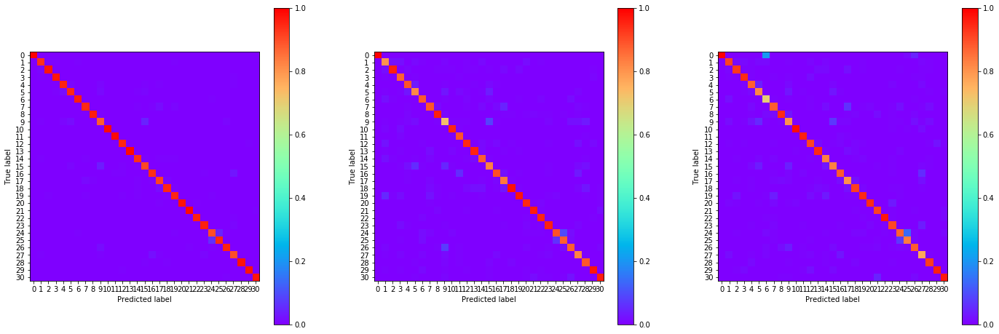

22:13:09.188061
#246 [Train: 0.169] [Test: 0.341] [Valid: 0.411]
#246 [Train: 0.949] [Test: 0.905] [Valid: 0.888]


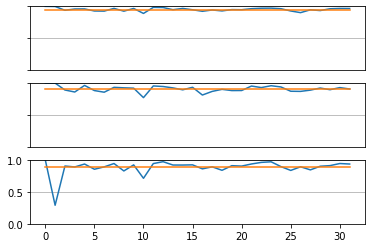

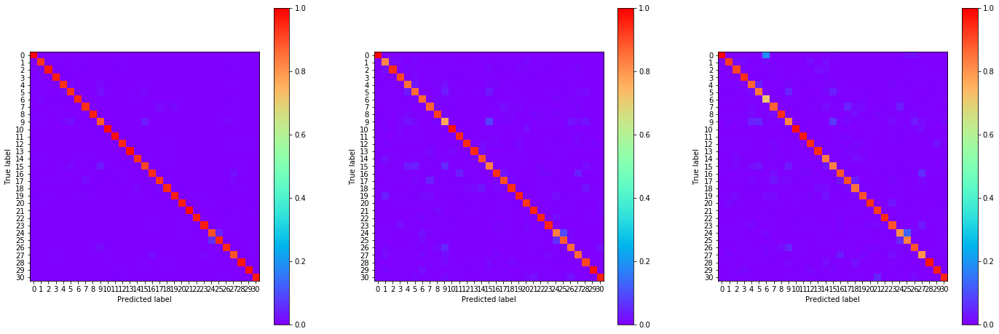

22:13:56.649610
#247 [Train: 0.164] [Test: 0.353] [Valid: 0.442]
#247 [Train: 0.951] [Test: 0.905] [Valid: 0.884]


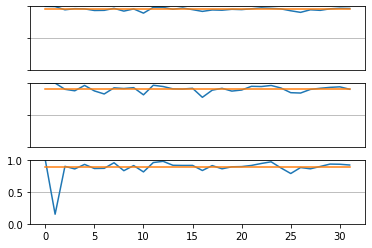

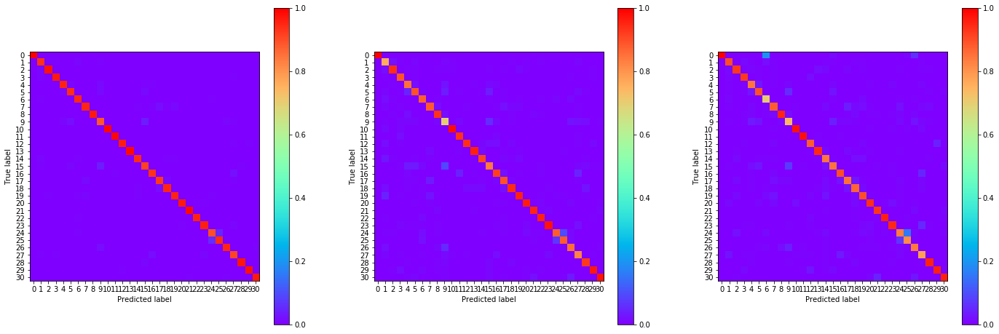

22:14:44.285352
#248 [Train: 0.164] [Test: 0.345] [Valid: 0.413]
#248 [Train: 0.951] [Test: 0.904] [Valid: 0.885]


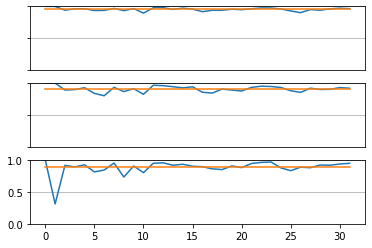

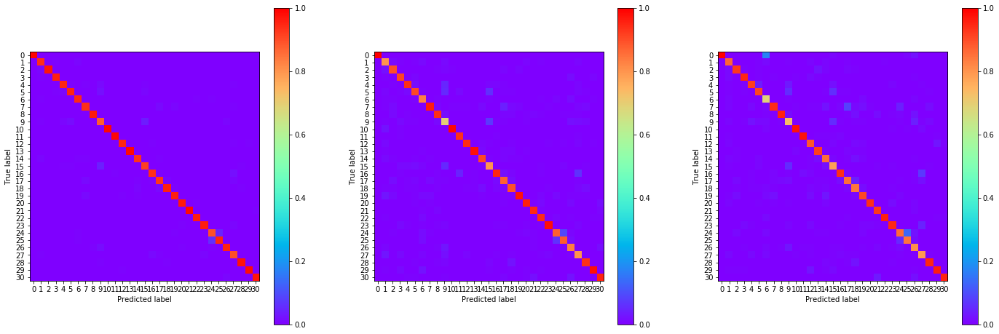

22:15:32.274177
#249 [Train: 0.164] [Test: 0.359] [Valid: 0.426]
#249 [Train: 0.951] [Test: 0.903] [Valid: 0.889]


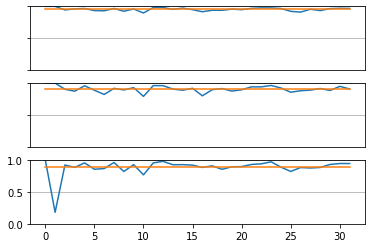

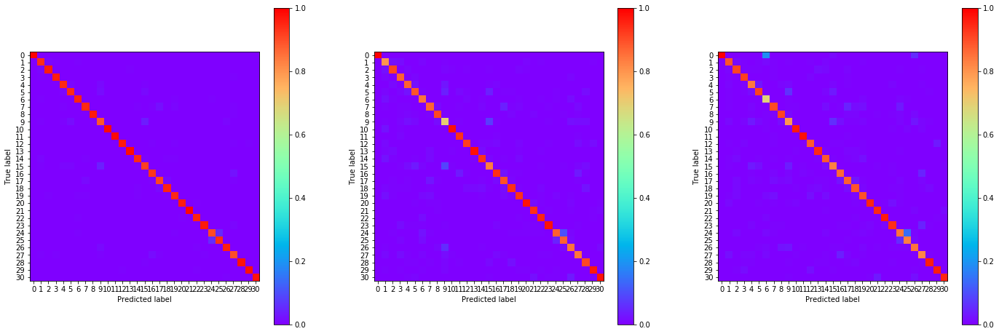

22:16:20.099916
#250 [Train: 0.160] [Test: 0.346] [Valid: 0.419]
#250 [Train: 0.953] [Test: 0.905] [Valid: 0.885]


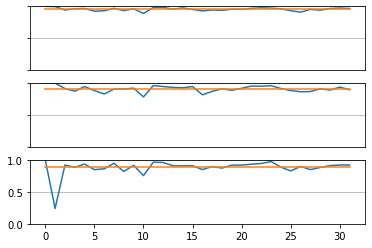

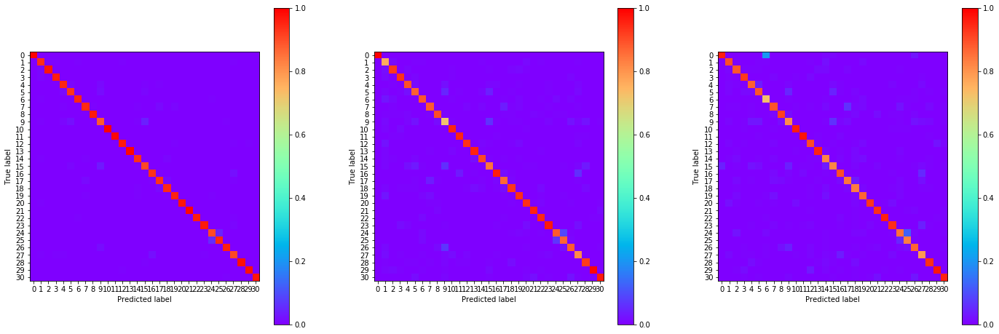

22:17:07.878067
#251 [Train: 0.159] [Test: 0.332] [Valid: 0.371]
#251 [Train: 0.953] [Test: 0.903] [Valid: 0.893]


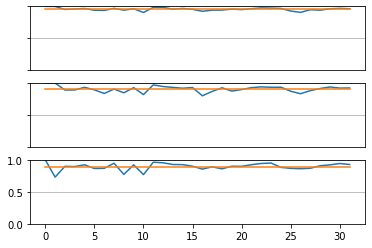

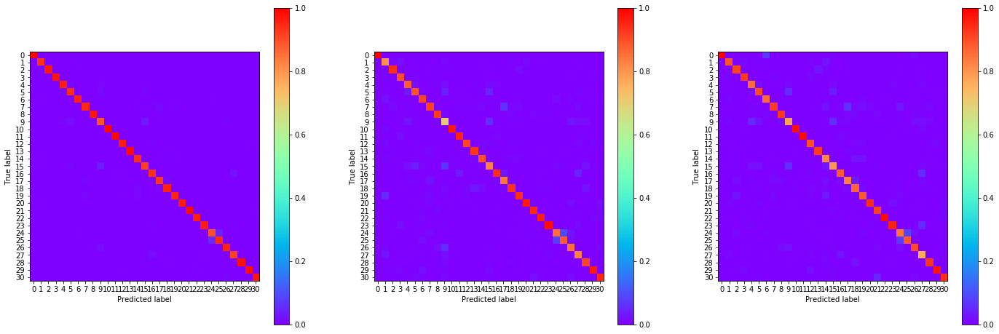

22:17:55.470397
#252 [Train: 0.158] [Test: 0.343] [Valid: 0.397]
#252 [Train: 0.955] [Test: 0.905] [Valid: 0.891]


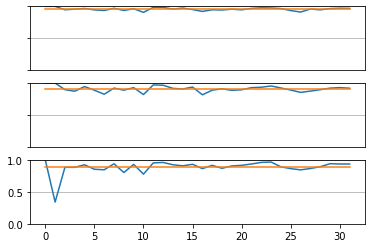

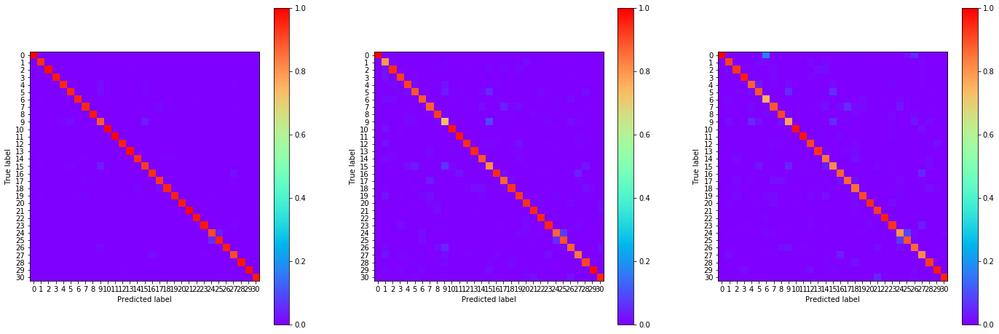

22:18:43.593070
#253 [Train: 0.160] [Test: 0.342] [Valid: 0.384]
#253 [Train: 0.952] [Test: 0.909] [Valid: 0.893]


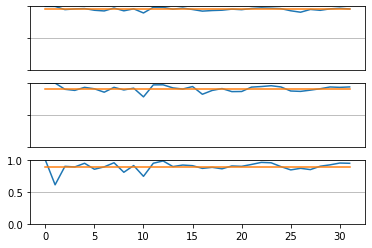

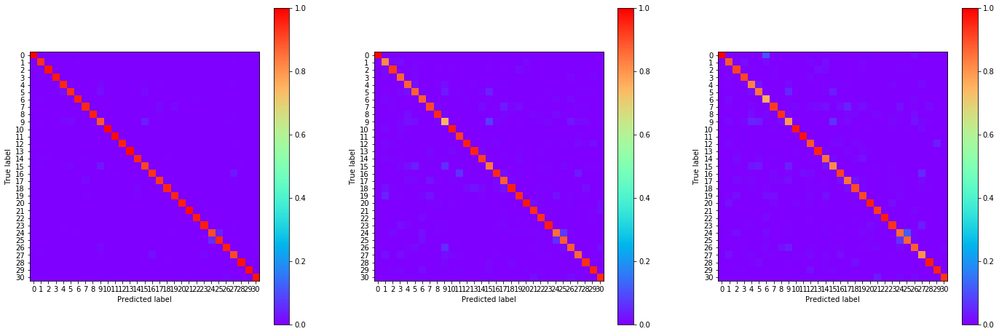

22:19:31.395332
#254 [Train: 0.157] [Test: 0.322] [Valid: 0.379]
#254 [Train: 0.953] [Test: 0.911] [Valid: 0.892]


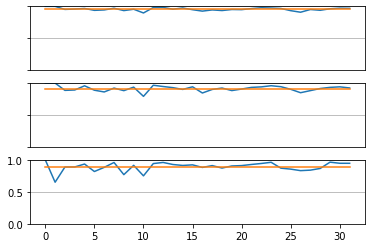

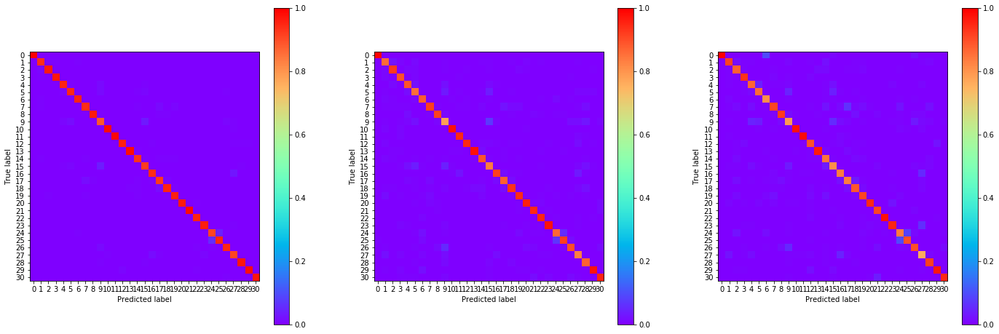

22:20:19.091254
#255 [Train: 0.159] [Test: 0.329] [Valid: 0.371]
#255 [Train: 0.952] [Test: 0.904] [Valid: 0.896]


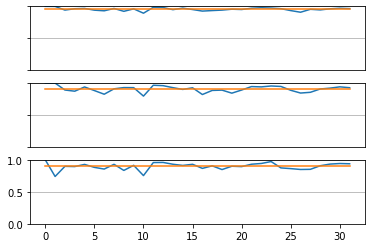

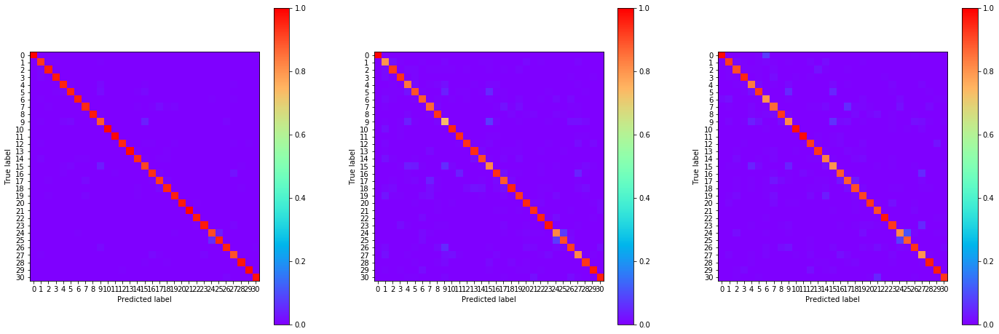

22:21:06.746114
#256 [Train: 0.157] [Test: 0.340] [Valid: 0.422]
#256 [Train: 0.953] [Test: 0.909] [Valid: 0.888]


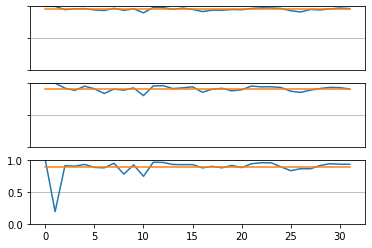

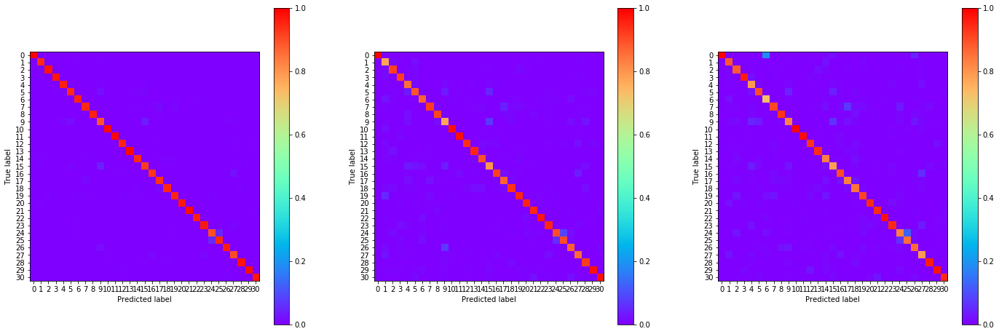

22:21:54.378333
#257 [Train: 0.155] [Test: 0.333] [Valid: 0.421]
#257 [Train: 0.954] [Test: 0.906] [Valid: 0.888]


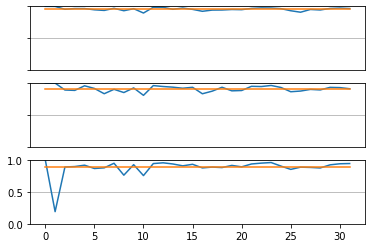

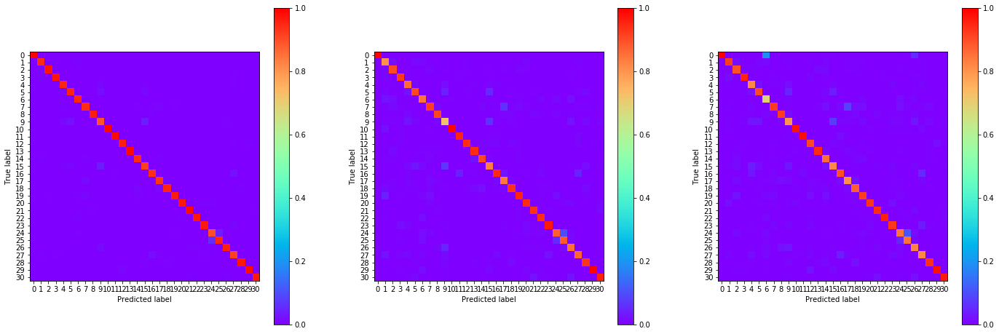

22:22:42.054048
#258 [Train: 0.156] [Test: 0.319] [Valid: 0.391]
#258 [Train: 0.954] [Test: 0.907] [Valid: 0.892]


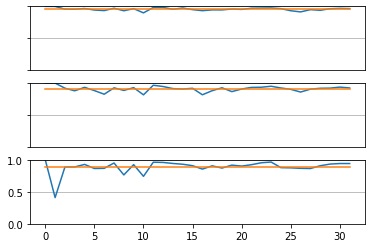

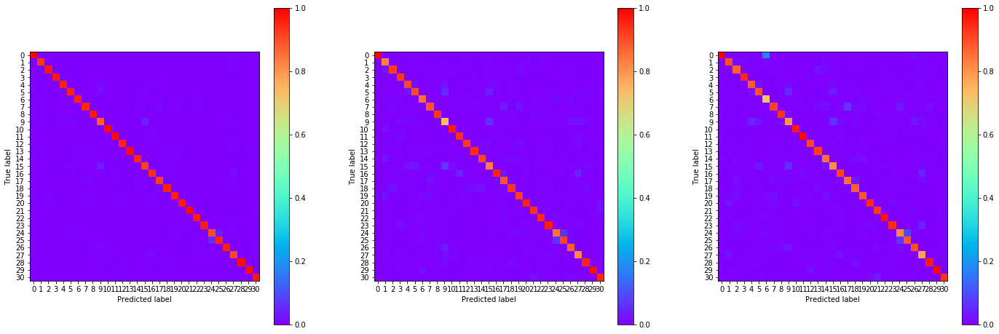

22:23:29.666138
#259 [Train: 0.155] [Test: 0.339] [Valid: 0.387]
#259 [Train: 0.954] [Test: 0.906] [Valid: 0.894]


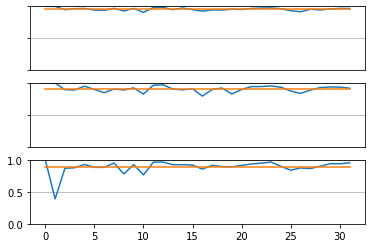

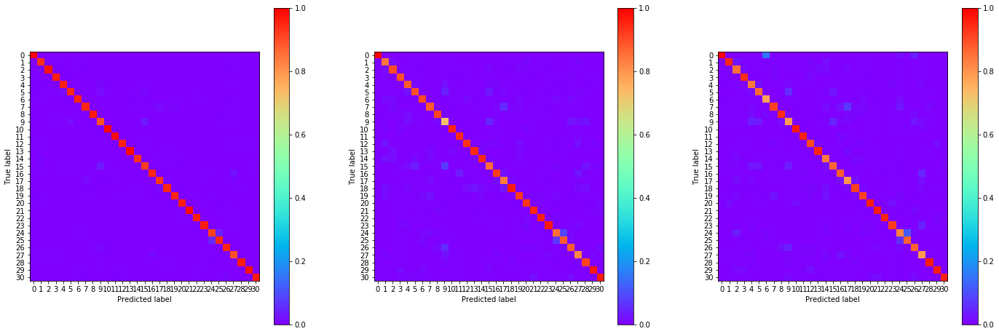

22:24:17.493846
#260 [Train: 0.152] [Test: 0.347] [Valid: 0.392]
#260 [Train: 0.955] [Test: 0.908] [Valid: 0.894]


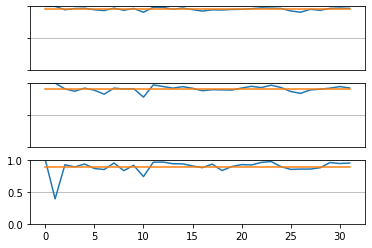

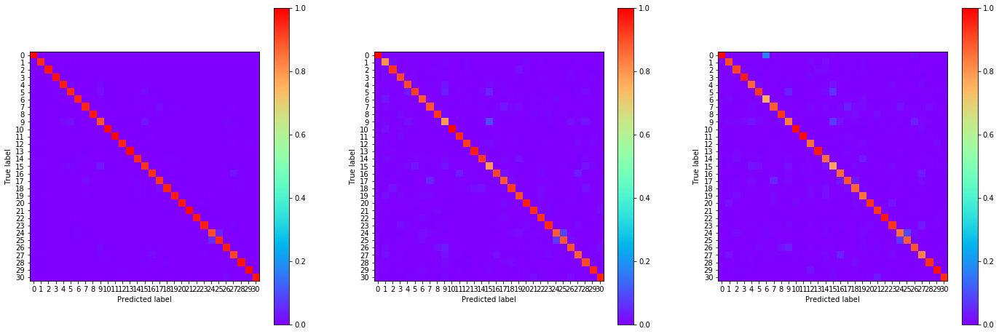

22:25:05.087257
#261 [Train: 0.156] [Test: 0.346] [Valid: 0.419]
#261 [Train: 0.954] [Test: 0.905] [Valid: 0.891]


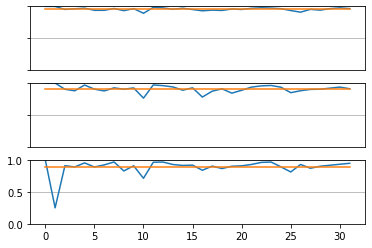

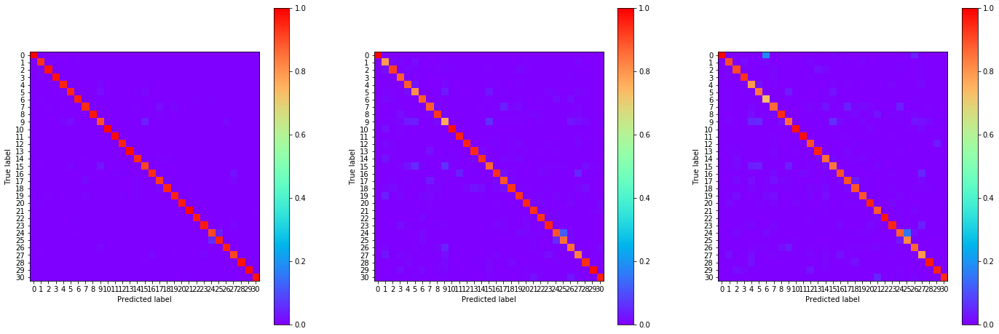

22:25:52.751141
#262 [Train: 0.152] [Test: 0.335] [Valid: 0.392]
#262 [Train: 0.955] [Test: 0.909] [Valid: 0.892]


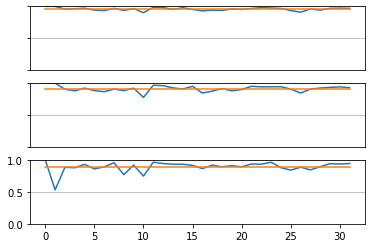

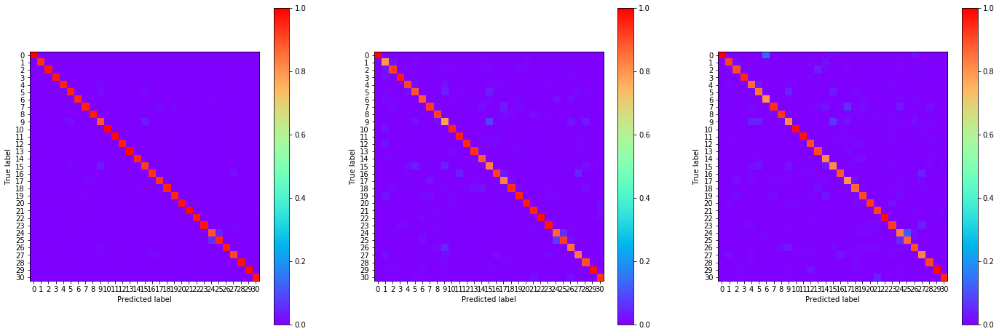

22:26:39.920644
#263 [Train: 0.153] [Test: 0.344] [Valid: 0.429]
#263 [Train: 0.954] [Test: 0.906] [Valid: 0.889]


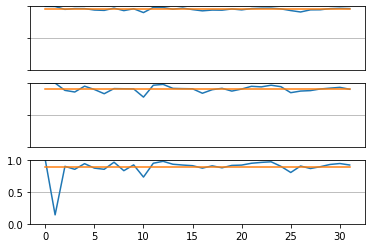

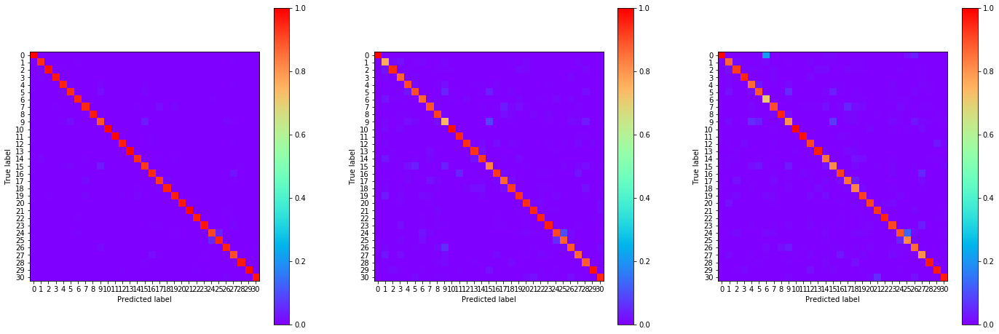

22:27:27.699251
#264 [Train: 0.151] [Test: 0.354] [Valid: 0.396]
#264 [Train: 0.955] [Test: 0.905] [Valid: 0.892]


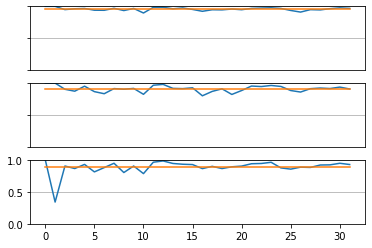

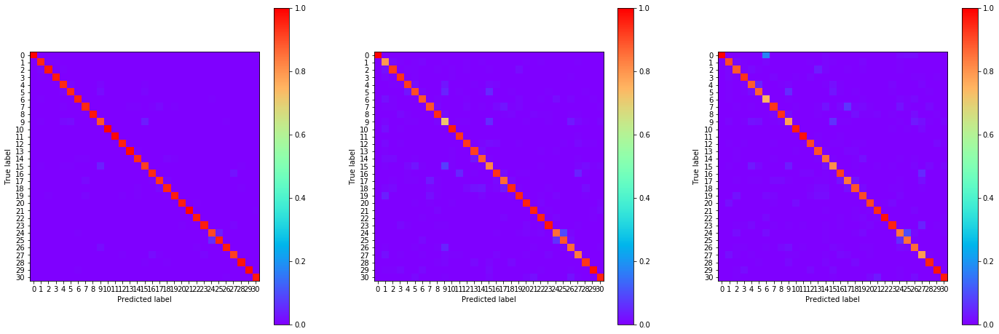

22:28:15.180771
#265 [Train: 0.149] [Test: 0.337] [Valid: 0.401]
#265 [Train: 0.955] [Test: 0.908] [Valid: 0.895]


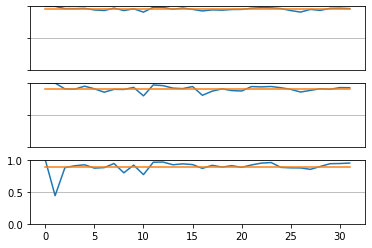

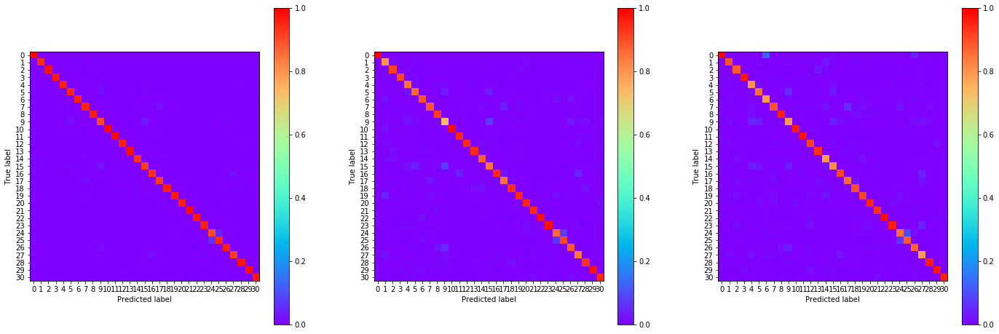

22:29:02.710719
#266 [Train: 0.150] [Test: 0.342] [Valid: 0.374]
#266 [Train: 0.956] [Test: 0.908] [Valid: 0.897]


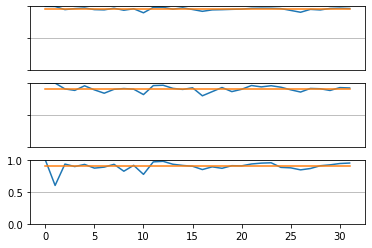

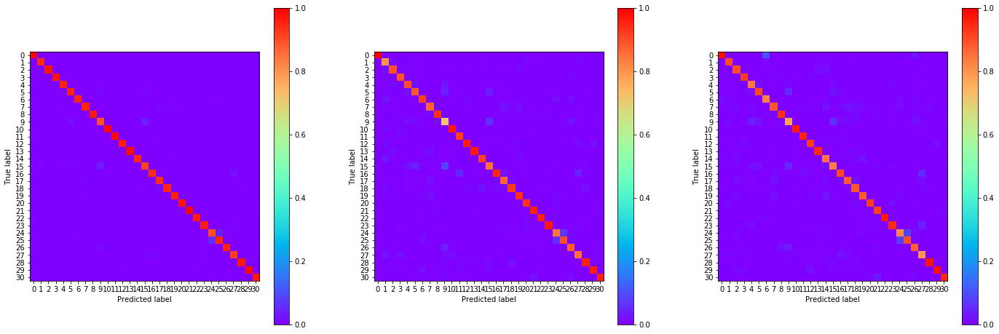

22:29:50.482033
#267 [Train: 0.147] [Test: 0.355] [Valid: 0.416]
#267 [Train: 0.957] [Test: 0.910] [Valid: 0.893]


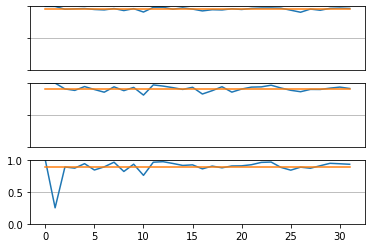

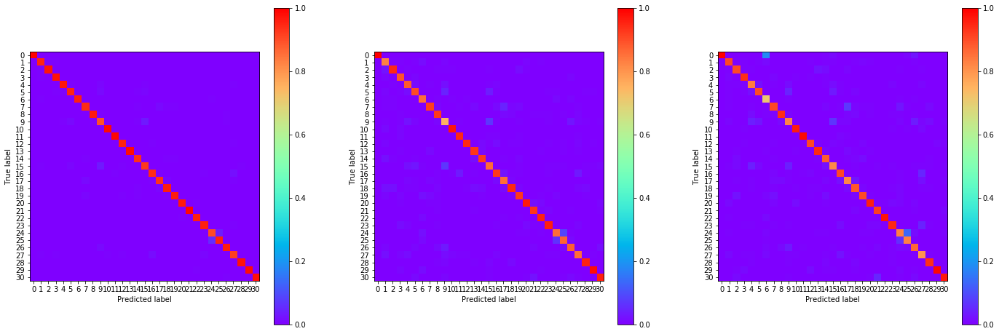

22:30:38.491060
#268 [Train: 0.148] [Test: 0.355] [Valid: 0.399]
#268 [Train: 0.956] [Test: 0.909] [Valid: 0.891]


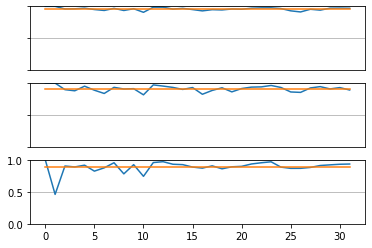

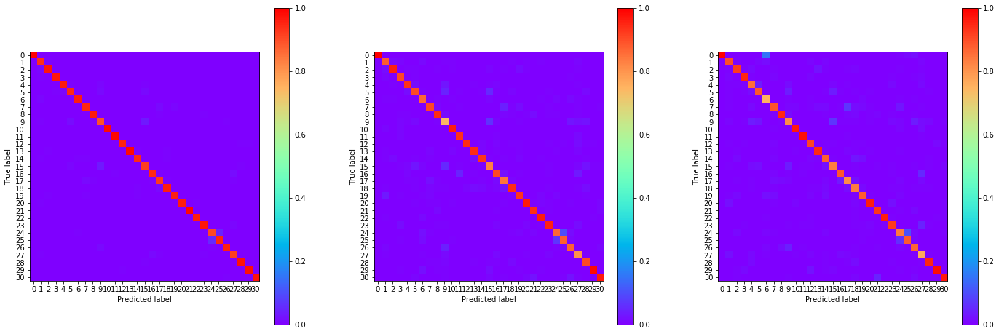

22:31:26.229233
#269 [Train: 0.147] [Test: 0.338] [Valid: 0.379]
#269 [Train: 0.957] [Test: 0.904] [Valid: 0.895]


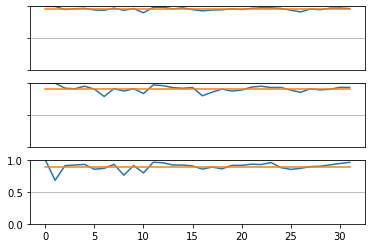

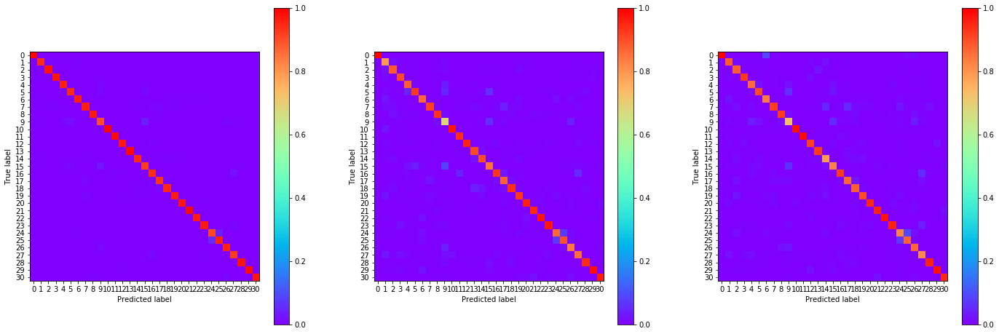

22:32:13.445678
#270 [Train: 0.145] [Test: 0.334] [Valid: 0.408]
#270 [Train: 0.957] [Test: 0.908] [Valid: 0.896]


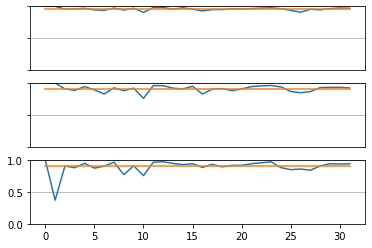

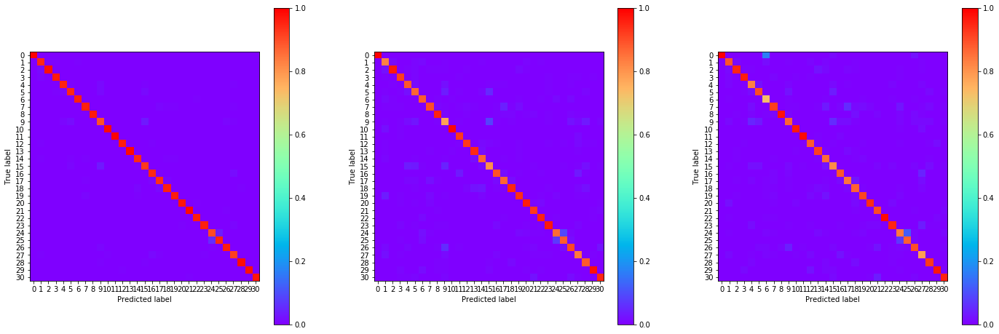

22:33:01.089111
#271 [Train: 0.145] [Test: 0.337] [Valid: 0.395]
#271 [Train: 0.958] [Test: 0.909] [Valid: 0.894]


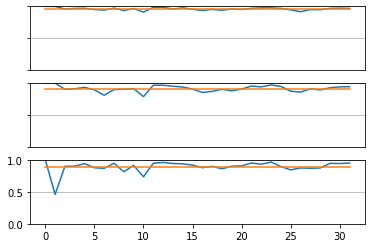

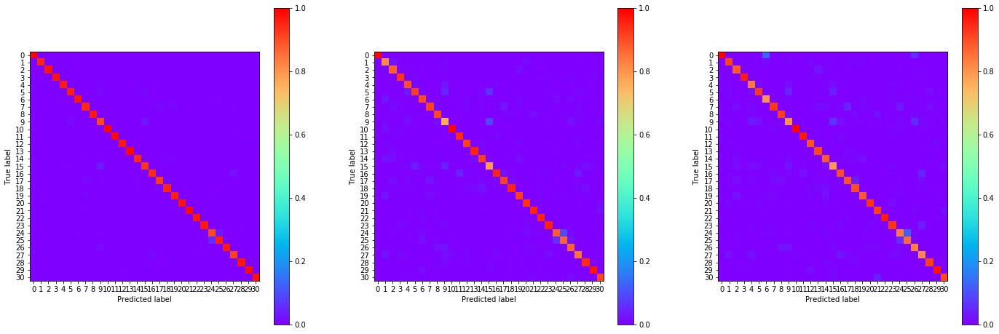

22:33:48.790196
#272 [Train: 0.146] [Test: 0.328] [Valid: 0.405]
#272 [Train: 0.957] [Test: 0.907] [Valid: 0.892]


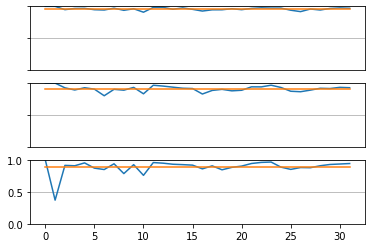

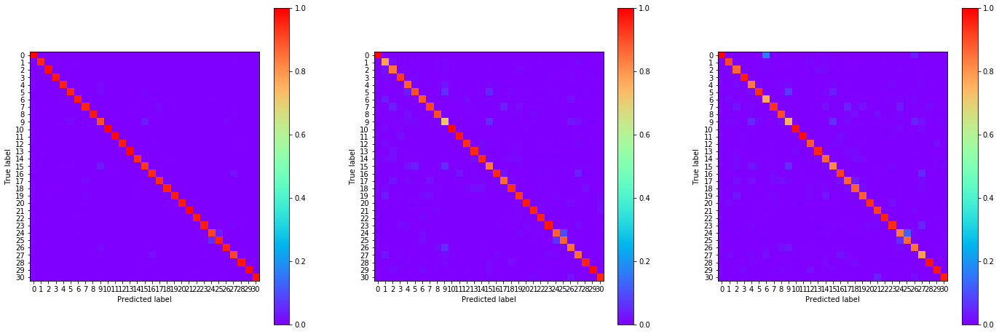

22:34:36.188868
#273 [Train: 0.144] [Test: 0.328] [Valid: 0.401]
#273 [Train: 0.957] [Test: 0.907] [Valid: 0.894]


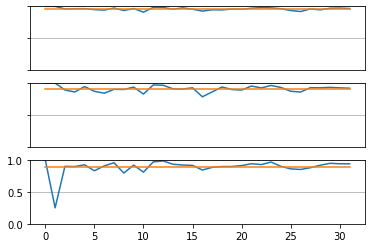

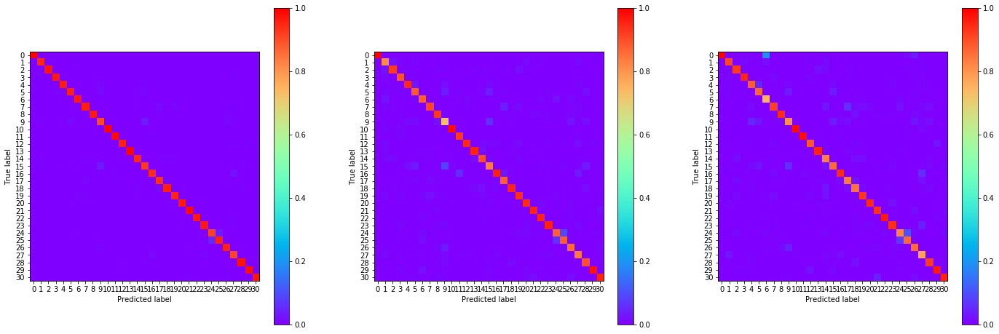

22:35:23.677565
#274 [Train: 0.143] [Test: 0.367] [Valid: 0.401]
#274 [Train: 0.958] [Test: 0.906] [Valid: 0.896]


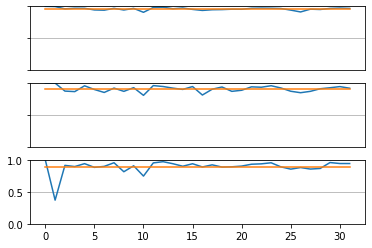

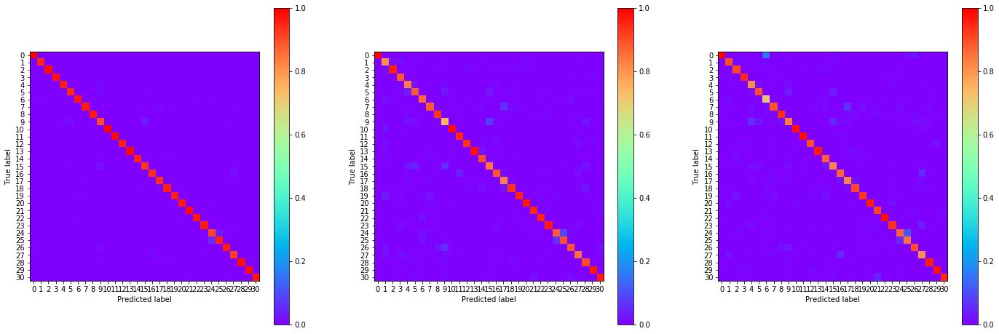

22:36:11.705679
#275 [Train: 0.142] [Test: 0.322] [Valid: 0.404]
#275 [Train: 0.958] [Test: 0.909] [Valid: 0.892]


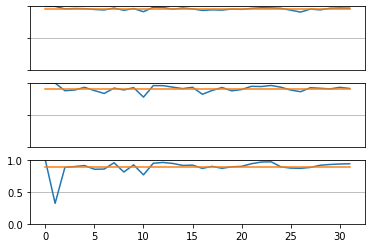

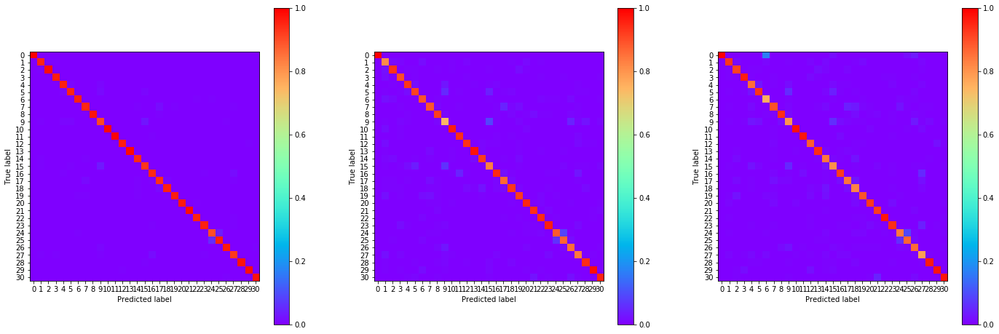

22:36:59.602508
#276 [Train: 0.138] [Test: 0.338] [Valid: 0.398]
#276 [Train: 0.959] [Test: 0.914] [Valid: 0.894]


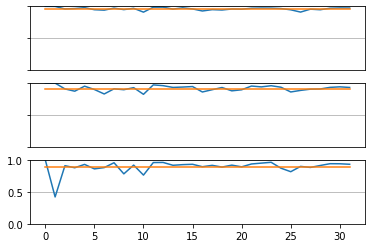

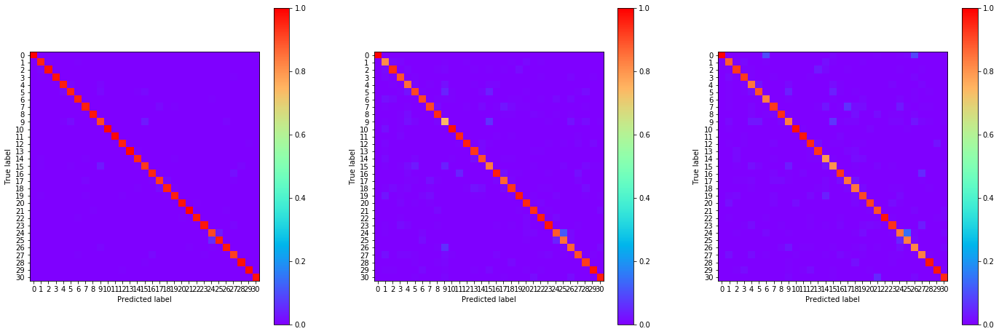

22:37:47.218534
#277 [Train: 0.145] [Test: 0.364] [Valid: 0.403]
#277 [Train: 0.957] [Test: 0.909] [Valid: 0.892]


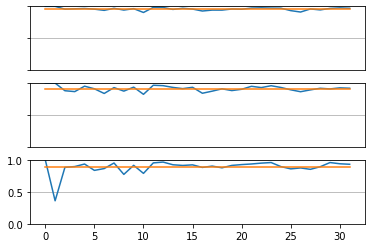

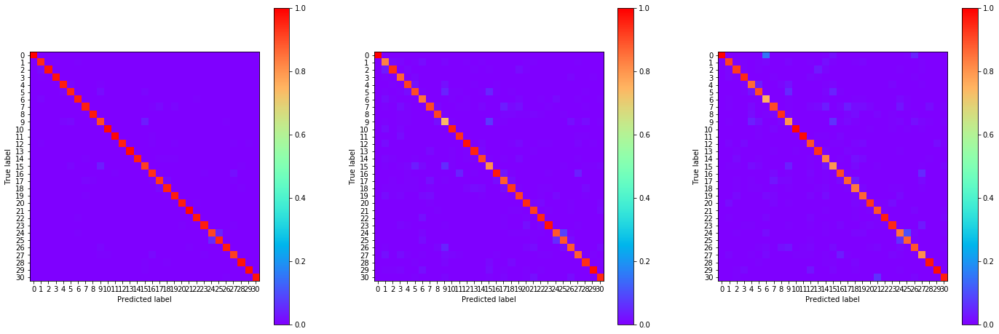

22:38:34.804261
#278 [Train: 0.144] [Test: 0.330] [Valid: 0.417]
#278 [Train: 0.957] [Test: 0.907] [Valid: 0.893]


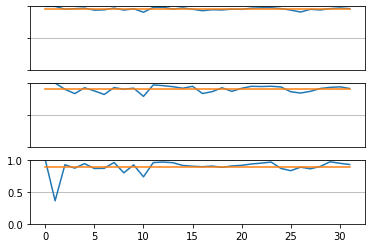

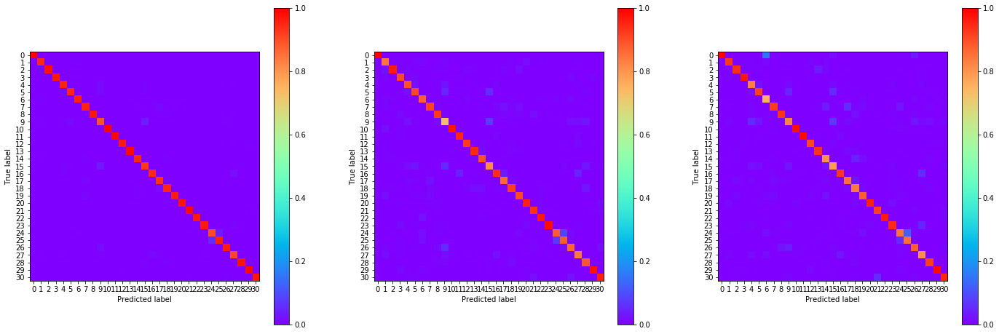

22:39:22.533672
#279 [Train: 0.138] [Test: 0.346] [Valid: 0.387]
#279 [Train: 0.959] [Test: 0.908] [Valid: 0.897]


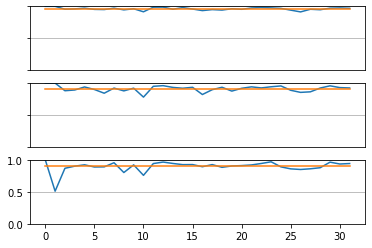

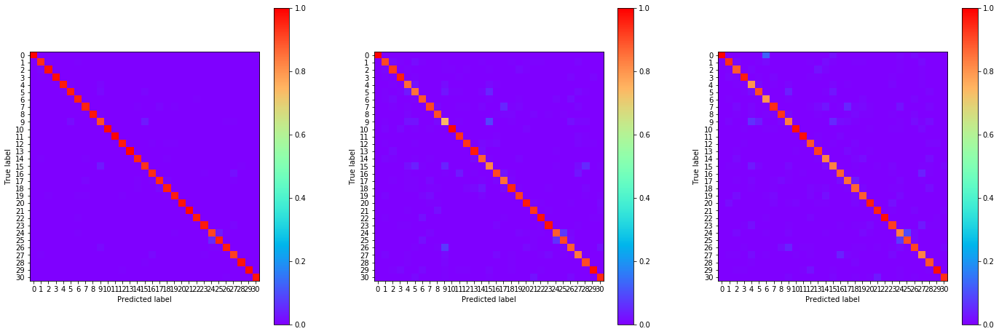

22:40:10.338713
#280 [Train: 0.140] [Test: 0.329] [Valid: 0.396]
#280 [Train: 0.958] [Test: 0.909] [Valid: 0.894]


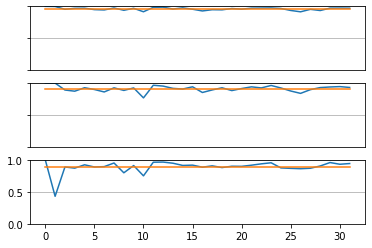

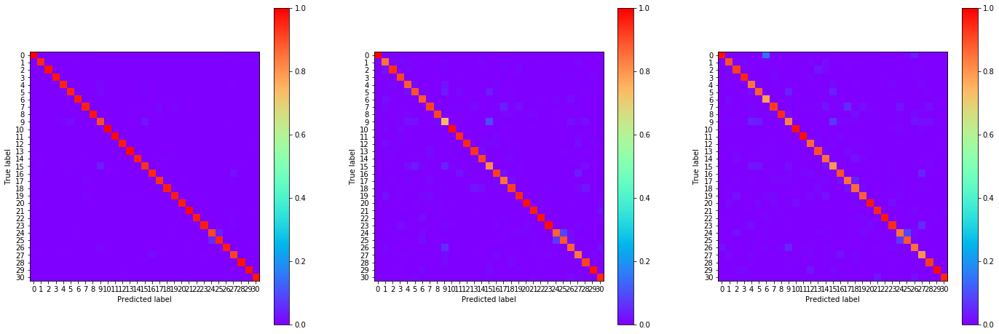

22:40:58.037061
#281 [Train: 0.138] [Test: 0.328] [Valid: 0.369]
#281 [Train: 0.960] [Test: 0.909] [Valid: 0.901]


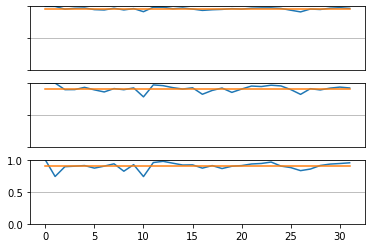

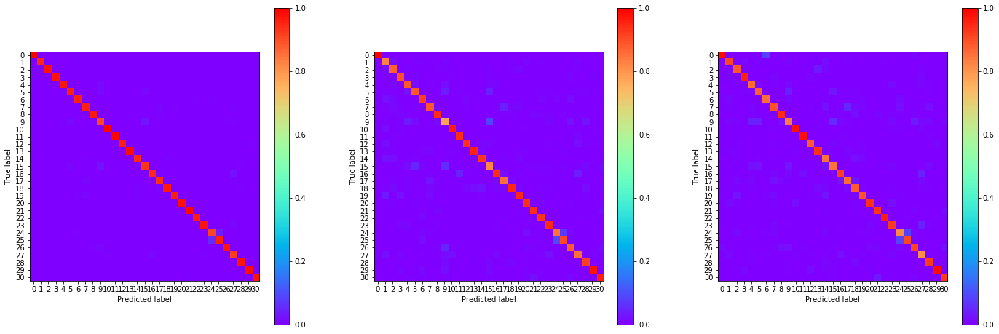

22:41:45.580439
#282 [Train: 0.139] [Test: 0.337] [Valid: 0.378]
#282 [Train: 0.959] [Test: 0.912] [Valid: 0.898]


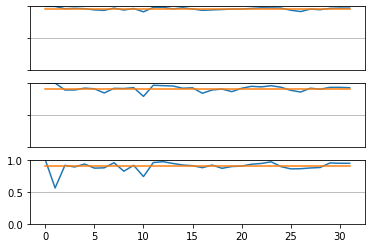

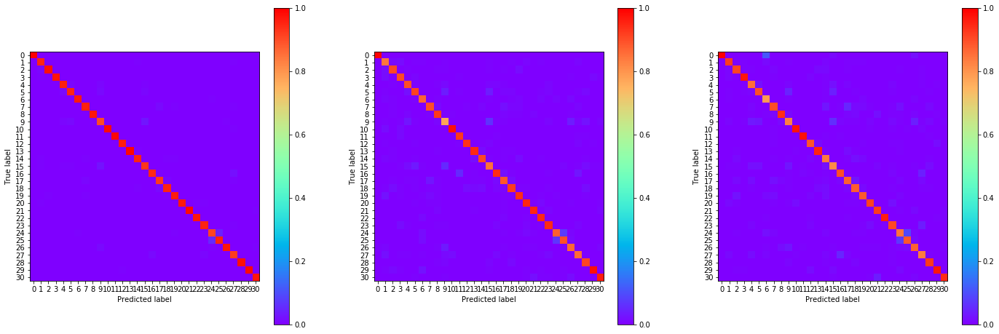

22:42:33.628760
#283 [Train: 0.138] [Test: 0.345] [Valid: 0.389]
#283 [Train: 0.959] [Test: 0.910] [Valid: 0.894]


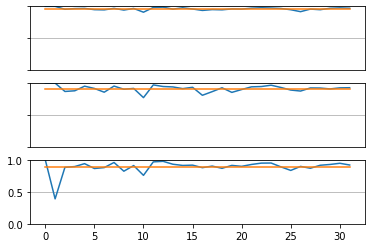

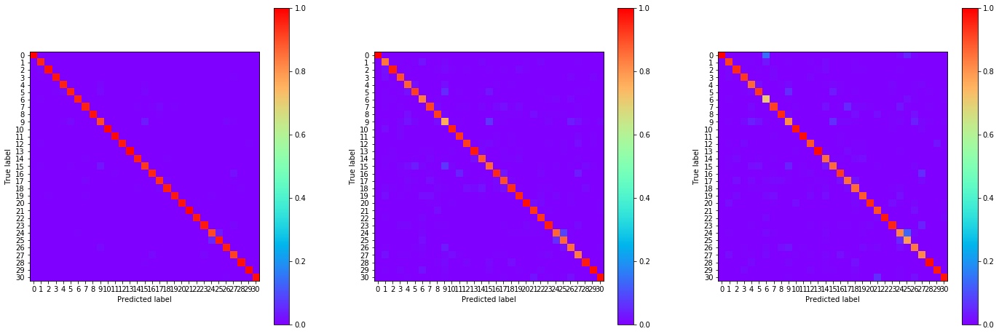

22:43:21.076833
#284 [Train: 0.136] [Test: 0.343] [Valid: 0.409]
#284 [Train: 0.959] [Test: 0.908] [Valid: 0.894]


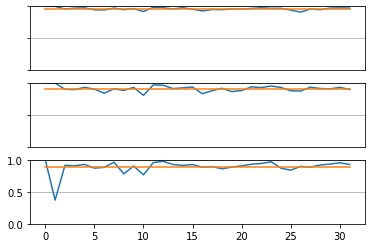

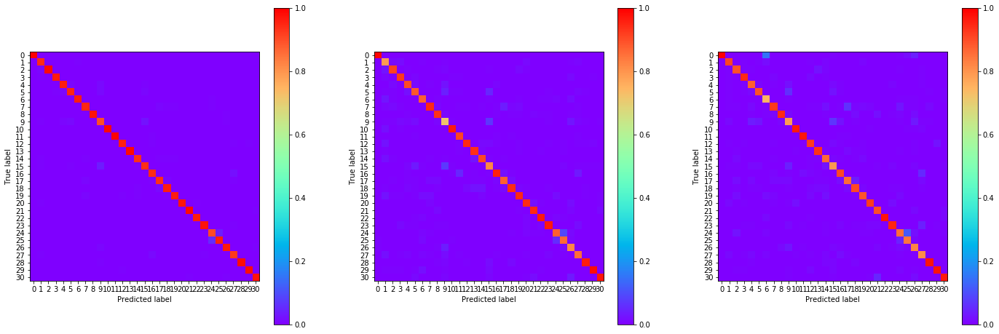

22:44:08.877756
#285 [Train: 0.135] [Test: 0.350] [Valid: 0.430]
#285 [Train: 0.960] [Test: 0.904] [Valid: 0.891]


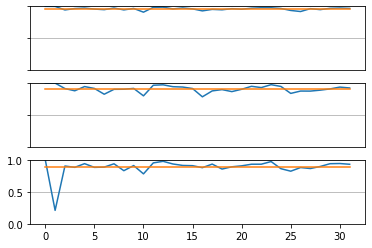

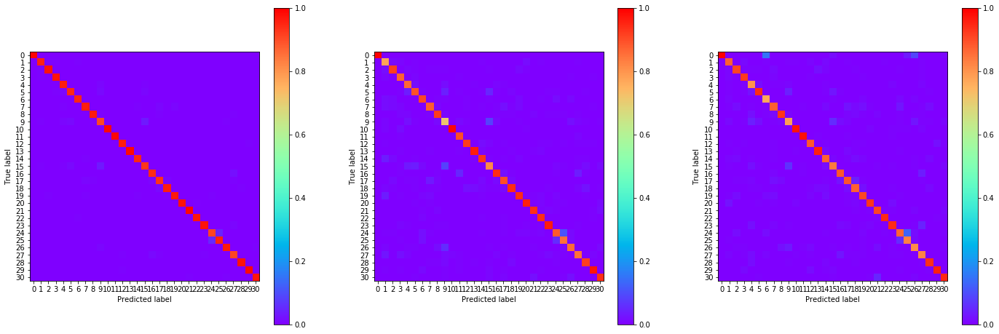

22:44:56.498962
#286 [Train: 0.136] [Test: 0.348] [Valid: 0.462]
#286 [Train: 0.960] [Test: 0.907] [Valid: 0.888]


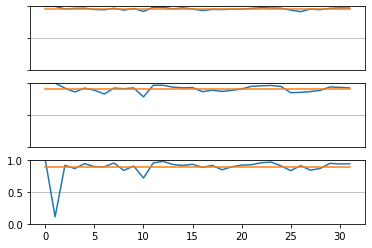

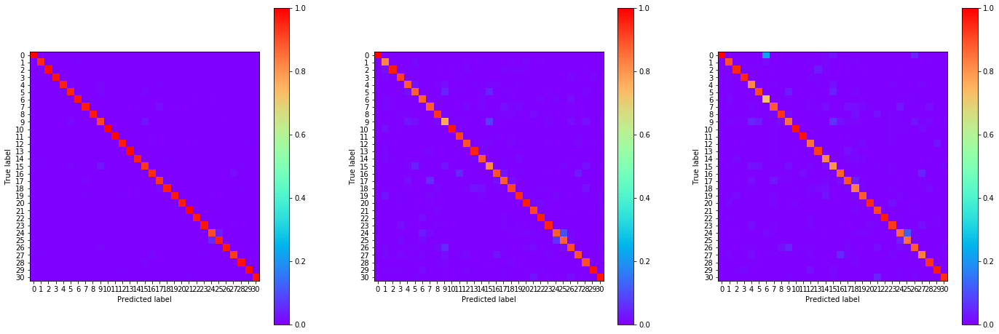

22:45:44.270165
#287 [Train: 0.134] [Test: 0.347] [Valid: 0.391]
#287 [Train: 0.961] [Test: 0.910] [Valid: 0.894]


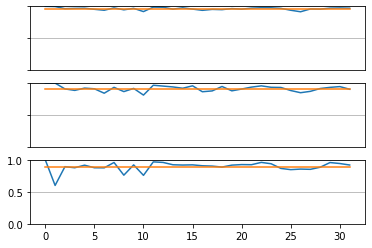

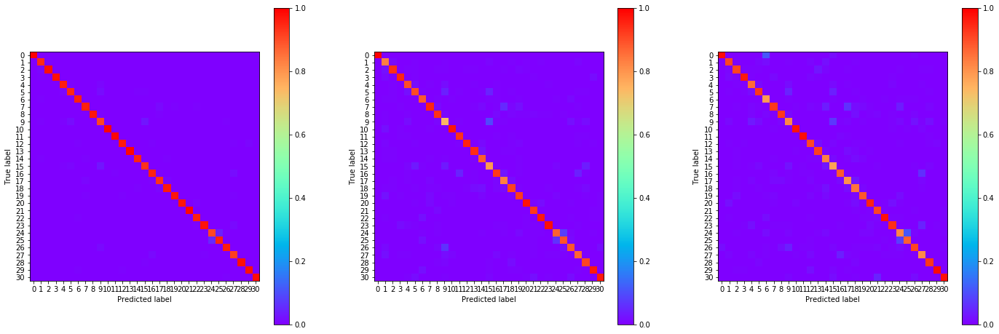

22:46:32.499131
#288 [Train: 0.135] [Test: 0.354] [Valid: 0.399]
#288 [Train: 0.960] [Test: 0.907] [Valid: 0.894]


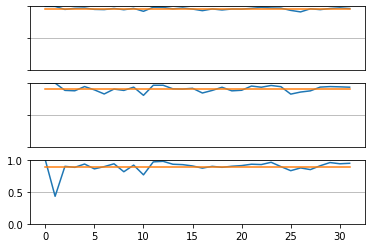

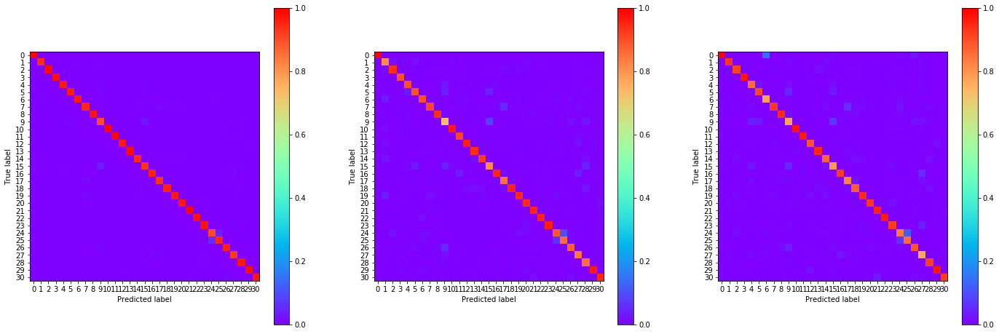

22:47:20.232297
#289 [Train: 0.136] [Test: 0.330] [Valid: 0.374]
#289 [Train: 0.960] [Test: 0.914] [Valid: 0.900]


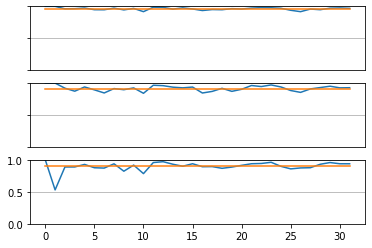

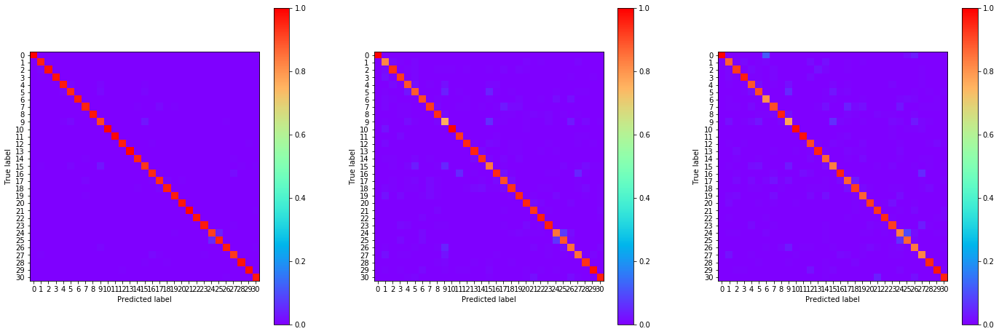

22:48:08.366893
#290 [Train: 0.133] [Test: 0.345] [Valid: 0.374]
#290 [Train: 0.961] [Test: 0.912] [Valid: 0.897]


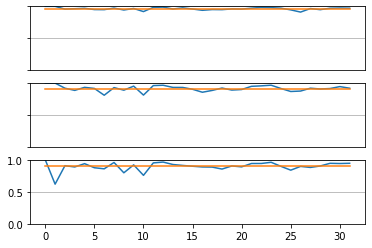

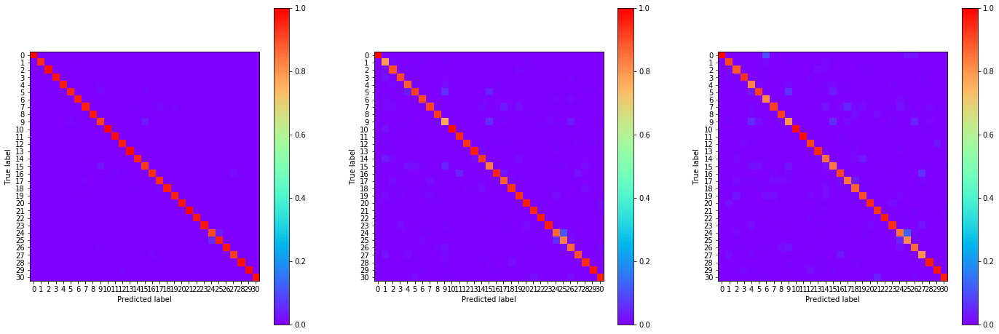

22:48:55.989658
#291 [Train: 0.132] [Test: 0.330] [Valid: 0.409]
#291 [Train: 0.961] [Test: 0.910] [Valid: 0.894]


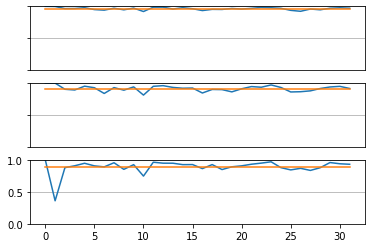

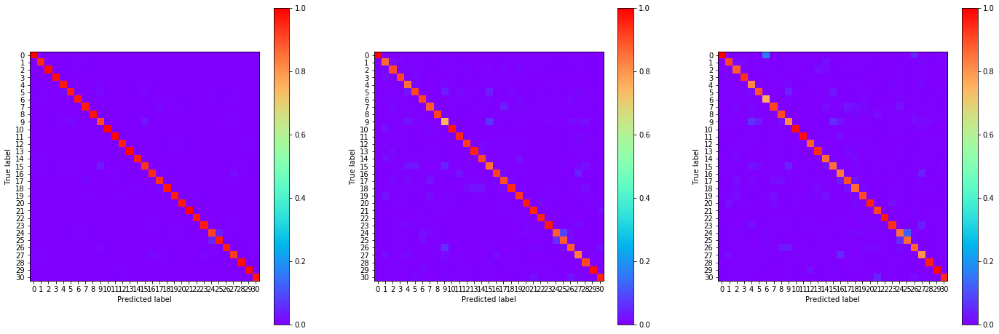

22:49:43.954229
#292 [Train: 0.131] [Test: 0.356] [Valid: 0.382]
#292 [Train: 0.962] [Test: 0.911] [Valid: 0.896]


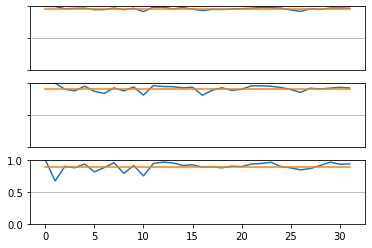

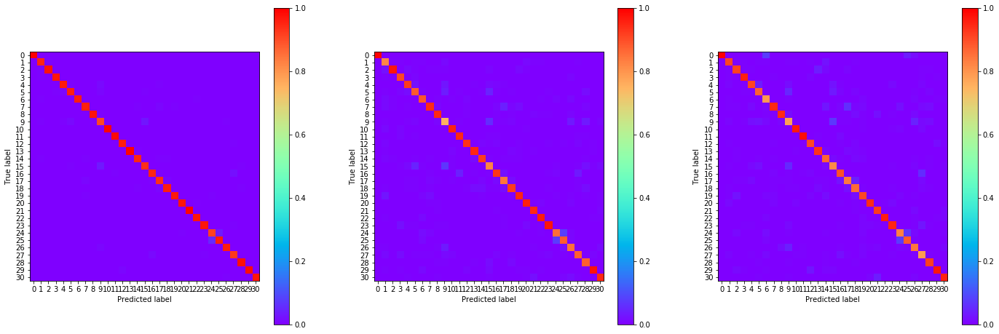

22:50:31.910864
#293 [Train: 0.131] [Test: 0.331] [Valid: 0.364]
#293 [Train: 0.961] [Test: 0.908] [Valid: 0.898]


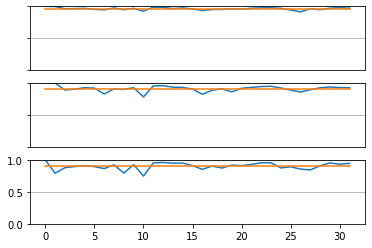

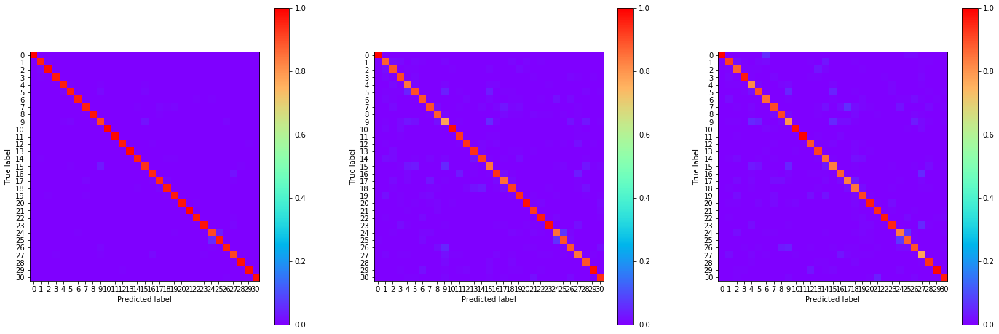

22:51:19.594141
#294 [Train: 0.133] [Test: 0.346] [Valid: 0.396]
#294 [Train: 0.960] [Test: 0.912] [Valid: 0.892]


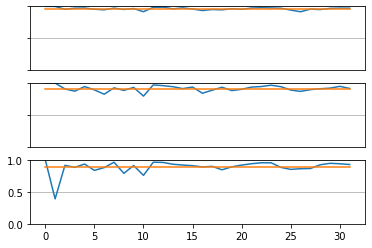

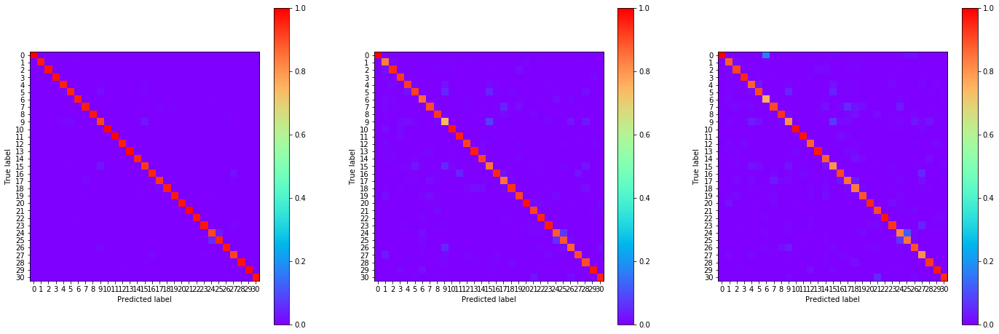

22:52:07.589161
#295 [Train: 0.128] [Test: 0.318] [Valid: 0.420]
#295 [Train: 0.962] [Test: 0.910] [Valid: 0.893]


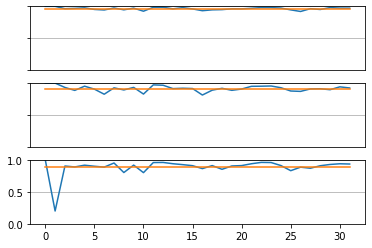

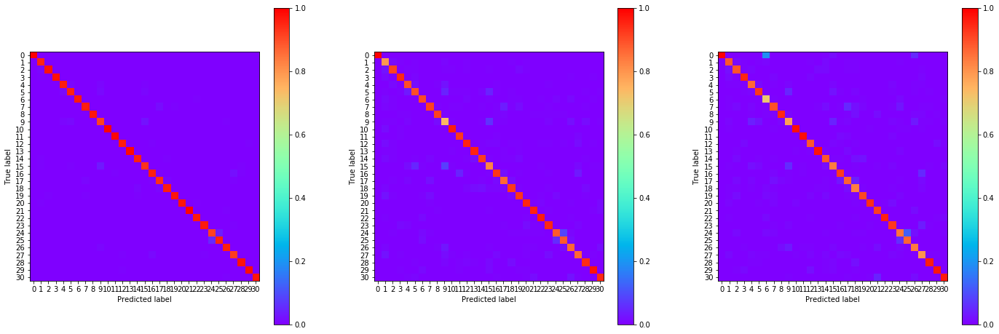

22:52:55.337309
#296 [Train: 0.134] [Test: 0.328] [Valid: 0.407]
#296 [Train: 0.960] [Test: 0.909] [Valid: 0.895]


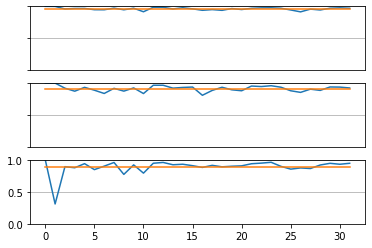

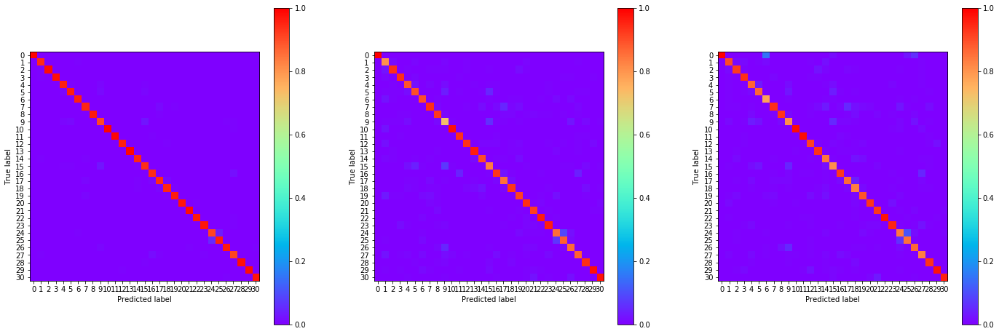

22:53:43.229974
#297 [Train: 0.126] [Test: 0.359] [Valid: 0.439]
#297 [Train: 0.962] [Test: 0.909] [Valid: 0.893]


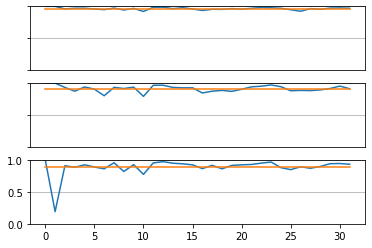

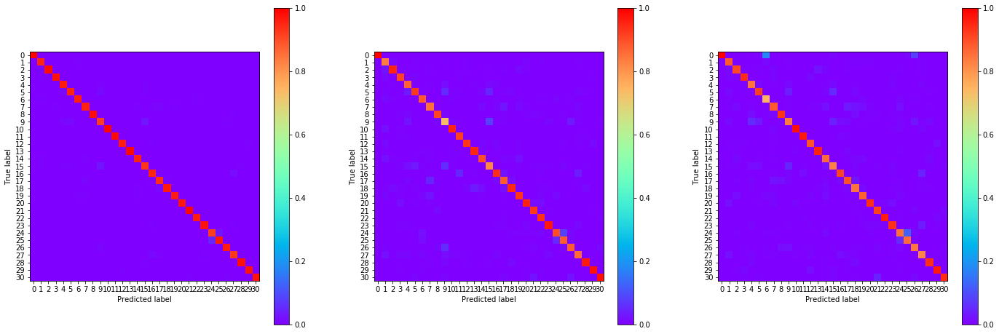

22:54:31.377403
#298 [Train: 0.128] [Test: 0.358] [Valid: 0.401]
#298 [Train: 0.962] [Test: 0.909] [Valid: 0.895]


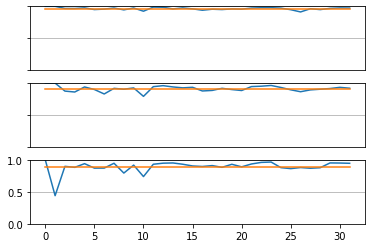

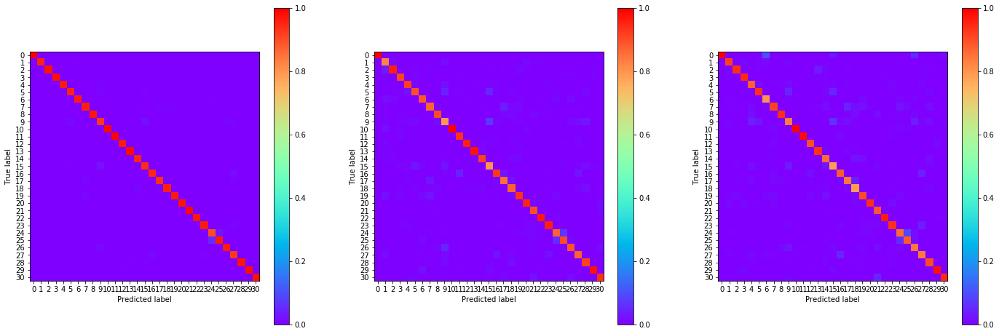

22:55:11.560735
#299 [Train: 0.125] [Test: 0.346] [Valid: 0.375]
#299 [Train: 0.963] [Test: 0.909] [Valid: 0.899]


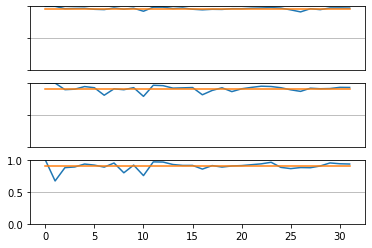

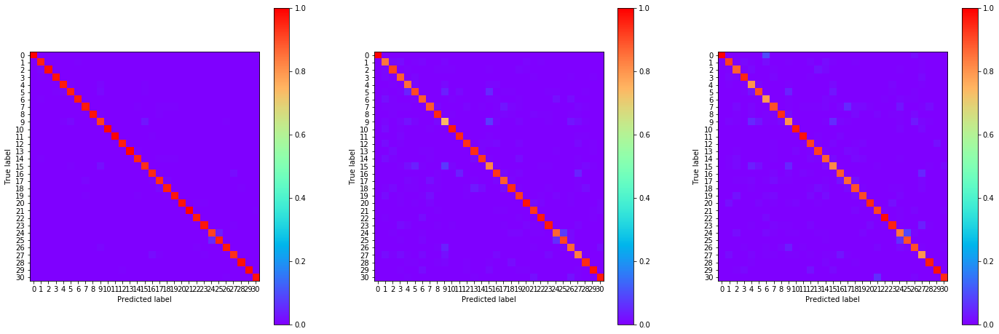

In [20]:
MAX_EPOCH = 300

writer = SummaryWriter(log_dir=run_name)

for epoch in range(MAX_EPOCH):
    training_loss_list = list()
    batch_generator = dataset_loader_training.batch_generator()
    model.train()
    
    correct_num = 0
    total_num = 0
    
#     result_matrix_train = np.zeros([31, 2])
    result_matrix_train = np.zeros([32, 2])
    result_matrix_train[0, :] = [1, 1]
    y_pred_train = list()
    y_true_train = list()

    for (batch, label) in batch_generator:
        optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
        loss.backward()
        training_loss_list.append(loss.item())
        optimizer.step()
        
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_train += list(label)
        y_pred_train += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_train[label, 0] += 1
            if result:
                result_matrix_train[label, 1] += 1
        
    acc_train = correct_num / total_num

    testing_loss_list = list()

    batch_generator = dataset_loader_testing.batch_generator()

    model.eval()
    
    correct_num = 0
    total_num = 0
    
#   result_matrix_test = np.zeros([31, 2])
    result_matrix_test = np.zeros([32, 2])
    result_matrix_test[0, :] = [1, 1]
    y_pred_test = list()
    y_true_test = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label).to(device))
#         loss.backward()
        testing_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_test += list(label)
        y_pred_test += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_test[label, 0] += 1
            if result:
                result_matrix_test[label, 1] += 1
        
    acc_test = correct_num / total_num

    validation_loss_list = list()

    batch_generator = dataset_loader_validation.batch_generator()
    
    correct_num = 0
    total_num = 0
    
#     result_matrix_eval = np.zeros([31, 2])
    result_matrix_eval = np.zeros([32, 2])
    result_matrix_eval[0, :] = [1, 1]
    y_pred_eval = list()
    y_true_eval = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
#         loss.backward()
        validation_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_eval += list(label)
        y_pred_eval += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_eval[label, 0] += 1
            if result:
                result_matrix_eval[label, 1] += 1
        
    acc_valid = correct_num / total_num
    
    training_loss_mean = np.mean(training_loss_list)
    testing_loss_mean = np.mean(testing_loss_list)
    validation_loss_mean = np.mean(validation_loss_list)
    
    print(datetime.datetime.now().time())
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, training_loss_mean, testing_loss_mean, validation_loss_mean))
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, acc_train, acc_test, acc_valid))
    
    fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True)
    axes[0].plot(result_matrix_train[:, 1] / result_matrix_train[:, 0])
    axes[0].plot(np.ones(len(result_matrix_train)) * acc_train)
    axes[0].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[0].set_ylim([0, 1])
    axes[0].yaxis.grid(True)
                 
    axes[1].plot(result_matrix_test[:, 1] / result_matrix_test[:, 0])
    axes[1].plot(np.ones(len(result_matrix_test)) * acc_test)
    axes[1].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[1].set_ylim([0, 1])
    axes[1].yaxis.grid(True)
                 
    axes[2].plot(result_matrix_eval[:, 1] / result_matrix_eval[:, 0])
    axes[2].plot(np.ones(len(result_matrix_eval)) * acc_valid)
    axes[2].set_ylim([0, 1])
    axes[2].yaxis.grid(True)
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))
    cm = confusion_matrix(y_true_train, y_pred_train, normalize='pred')
#     axes[0].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[0], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[0].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_test, y_pred_test, normalize='pred')
#     axes[1].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[1], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[1].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_eval, y_pred_eval, normalize='pred')
#     im = axes[2].imshow(cm)
#     plt.colorbar(im)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[2], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[2].get_images():
        im.set_clim(0, 1)
    
    plt.show()
    
    writer.add_scalar('Loss/Train', training_loss_mean, epoch)
    writer.add_scalar('Loss/Test', testing_loss_mean, epoch)
    writer.add_scalar('Loss/Valid', validation_loss_mean, epoch)
    writer.add_scalar('Acc/Train', acc_train, epoch)
    writer.add_scalar('Acc/Test', acc_test, epoch)
    writer.add_scalar('Acc/Valid', acc_valid, epoch)
    

In [21]:
# output = model(torch.cuda.FloatTensor(batch))

In [22]:
# output.shape

In [23]:
# torch.tensor(batch).unsqueeze_(1).shape

In [24]:
# input_tensor = torch.tensor(batch).to(device).float()
# input_tensor = input_tensor.transpose(1, 2)
# model(input_tensor).shape

In [25]:
# for batch, label_list in batch_generator:
#     print(batch.shape[0])
#     plt.figure(figsize=(5, 1))
#     plt.plot(label_list)
#     plt.show()
    
#     plt.figure(figsize=(6, 18))
# #     plt.imshow(batch[0], aspect='auto')
#     plt.imshow(batch[0])
#     plt.show()
    
#     break